# Dependencies

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.offline as p
from google.colab import drive
from tabulate import tabulate

import warnings
from scipy.interpolate import UnivariateSpline
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.serialize import model_to_json, model_from_json
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric
warnings.filterwarnings('ignore')

# Data Importation

In [2]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Load the datasets from the mounted Google Drive
aidi = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Africa Infrastructure Development Index AIDI.csv")
tci = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Transport Composite Index.csv")
eci = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Electricity composite Index.csv")
ici = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/ICT composite Index.csv")
wssci = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Water and Sanitation Service (WSS) Composite Index.csv")
population = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/API_SP.POP.TOTL_DS2_en_csv_v2_144171.csv")
data_ts = pd.read_csv("/content/drive/My Drive/Infrastructure Deficit/Data_TS.csv")


# Data Head

In [4]:
aidi.head(2)

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,28.55,28.96,30.43,32.73,34.31,36.29,38.57,43.69,47.78,49.91,52.99,53.39,54.04,55.79,57.08,57.87,58.91,60.00
1,Angola,7.96,8.17,8.54,9.41,10.41,11.50,12.58,13.75,14.99,16.39,16.83,16.46,17.48,19.04,18.88,20.07,20.20,20.65


In [5]:
tci.head(2)

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,16.76,16.55,17.20,17.35,17.28,17.15,18.22,18.30,19.26,19.09,18.96,18.71,18.33,18.11,17.90,17.59,19.58,19.58
1,Angola,2.49,2.43,2.38,2.34,2.30,2.25,2.22,2.17,2.16,2.11,2.07,2.02,1.97,1.93,1.89,4.29,4.41,4.41


In [6]:
eci.head(2)

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,14.54,15.37,15.70,17.01,17.41,18.10,19.17,20.13,19.80,23.29,25.37,26.24,27.60,28.83,29.15,29.80,31.34,32.15
1,Angola,1.64,1.78,1.94,2.22,2.39,2.51,2.97,3.04,3.84,3.84,3.93,5.10,5.82,5.79,5.94,5.89,5.85,5.81


In [7]:
ici.head(2)

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,0.01,0.02,0.02,0.11,0.17,0.40,7.57,10.60,11.88,13.78,16.17,18.34,23.22,28.79,34.03,32.18,32.07,34.08
1,Angola,0.00,0.00,0.00,0.01,0.04,0.09,1.77,2.36,3.01,3.97,5.21,6.11,9.83,11.95,12.08,11.45,12.13,12.82


In [8]:
wssci.head(2)

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Algeria,93.62,93.92,94.22,94.59,94.89,95.19,95.52,95.82,96.07,96.34,96.59,96.85,97.10,97.31,97.32,97.37,97.79,98.00
1,Angola,46.01,47.34,48.58,49.88,50.92,51.87,52.76,53.75,54.66,55.53,56.34,57.19,58.01,58.83,59.59,60.30,61.04,61.43


# Data Head Summary

Here's a concise integration of the information about the AIDI dataset:

"The Africa Infrastructure Development Index (AIDI) is produced by the African Development Bank. The AIDI serves several key objectives: (i) monitoring and evaluating infrastructure development progress across the continent, (ii) aiding resource allocation within ADF replenishments, and (iii) fostering policy dialogue among the Bank, Regional Member Countries (RMCs), and other development organizations.

The AIDI dataset includes the AIDI Index along with composite indices for Transport, Electricity, ICT, and Water and Sanitation Services (WSS). Each row represents a different country, and columns correspond to years from 2005 to 2022, providing numeric data that likely reflects economic indicators or related metrics specific to each country over time. This format enables analysis of infrastructure development trends and changes across African countries."



# Missing Data

In [9]:
# Check for missing values
print("AIDI Missing Values:\n", aidi.isnull().sum())
print("\nTCI Missing Values:\n", tci.isnull().sum())
print("\nECI Missing Values:\n", eci.isnull().sum())
print("\nICI Missing Values:\n", ici.isnull().sum())
print("\nWSSCI Missing Values:\n", wssci.isnull().sum())


AIDI Missing Values:
 Country    0
2005       1
2006       1
2007       1
2008       1
2009       1
2010       1
2011       1
2012       1
2013       0
2014       0
2015       0
2016       0
2017       0
2018       0
2019       0
2020       0
2021       0
2022       0
dtype: int64

TCI Missing Values:
 Country    0
2005       1
2006       1
2007       1
2008       1
2009       1
2010       1
2011       1
2012       1
2013       0
2014       0
2015       0
2016       0
2017       0
2018       0
2019       0
2020       0
2021       0
2022       0
dtype: int64

ECI Missing Values:
 Country    0
2005       1
2006       1
2007       1
2008       1
2009       1
2010       1
2011       1
2012       1
2013       0
2014       0
2015       0
2016       0
2017       0
2018       0
2019       0
2020       0
2021       0
2022       0
dtype: int64

ICI Missing Values:
 Country    0
2005       1
2006       1
2007       1
2008       1
2009       1
2010       1
2011       1
2012       1
2013       0
20

<Figure size 1000x600 with 0 Axes>

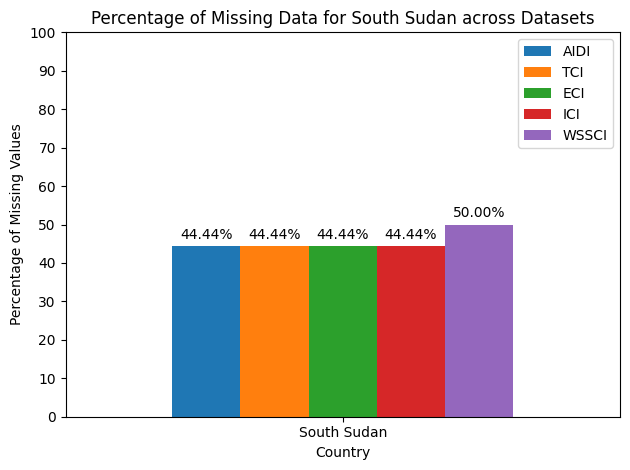

In [10]:
import matplotlib.pyplot as plt
import pandas as pd

def calculate_missingness(data, dataset_name):
    # Calculate the percentage of missing values per country
    percentage_missing_by_country = (data.isnull().sum(axis=1) / (data.shape[1] - 1)) * 100

    # Create a DataFrame to store the results
    missingness_df = pd.DataFrame({
        'Country': data['Country'],
        dataset_name: percentage_missing_by_country
    })

    return missingness_df

# Function to merge missingness DataFrames
def merge_missingness_dataframes(dataframes):
    combined_missingness = dataframes[0]
    for df in dataframes[1:]:
        combined_missingness = combined_missingness.merge(df, on='Country')
    return combined_missingness

# Calculate missingness for each dataset
datasets = {
    'AIDI': aidi,
    'TCI': tci,
    'ECI': eci,
    'ICI': ici,
    'WSSCI': wssci
}

missingness_dfs = [calculate_missingness(data, name) for name, data in datasets.items()]

# Merge all missingness DataFrames on 'Country'
combined_missingness = merge_missingness_dataframes(missingness_dfs)

# Set 'Country' as the index for plotting
combined_missingness.set_index('Country', inplace=True)

# Find the country with the highest missing data percentage
country_with_most_missing = combined_missingness.max(axis=1).idxmax()

# Filter combined_missingness to focus on the country with most missing data
country_data = combined_missingness.loc[[country_with_most_missing]]

# Plotting the combined missingness for the specific country
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
ax = country_data.plot(kind='bar', width=0.8)
plt.xlabel('Country')
plt.xticks(rotation=0)
plt.ylabel('Percentage of Missing Values')
plt.title(f'Percentage of Missing Data for {country_with_most_missing} across Datasets')
plt.ylim(0, 100)
ax.set_yticks(range(0, 101, 10))

# Annotate the bars with percentage values
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f%%', label_type='edge', padding=3)

plt.tight_layout()
plt.show()


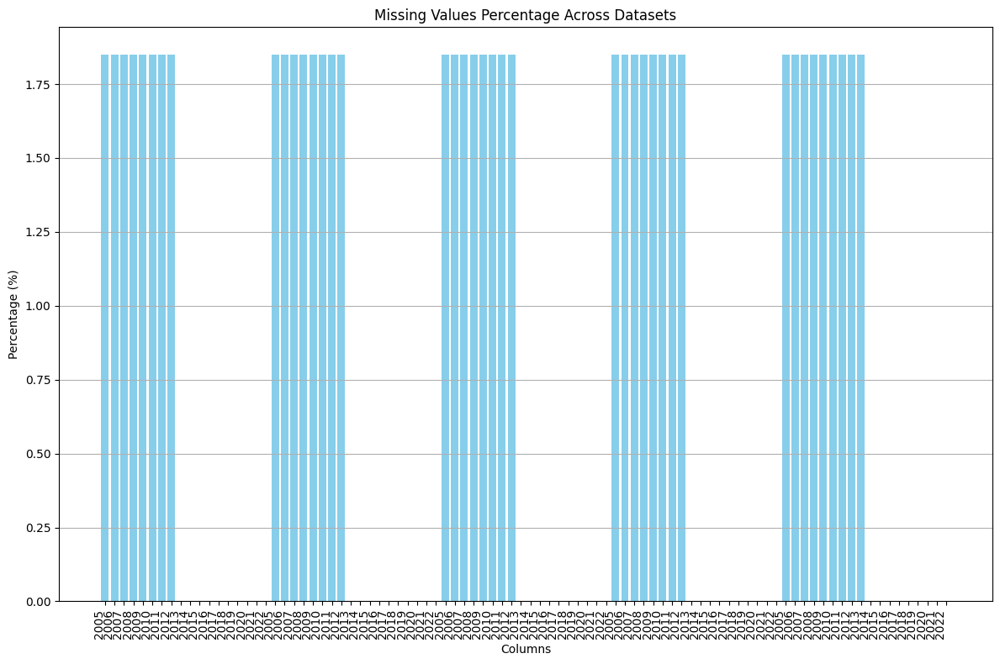

In [11]:
import matplotlib.pyplot as plt
import pandas as pd

def display_missing_values(datasets):
    # Initialize lists to store data
    columns = []
    missing_percentages = []

    # Iterate through each dataset
    for name, data in datasets.items():
        # Calculate missing values and percentage
        missing_values = data.isnull().sum()
        missing_percentage = ((missing_values / len(data)) * 100).round(2)

        # Append data for each dataset to lists, excluding 'Country' column
        columns.extend(missing_percentage.index.drop('Country'))
        missing_percentages.extend(missing_percentage.drop('Country').values)

    # Create a DataFrame from accumulated data
    missing_info = pd.DataFrame({
        'Dataset': columns,
        'Percentage': missing_percentages
    })

    # Plotting all datasets in one plot
    plt.figure(figsize=(12, 8))
    plt.bar(range(len(missing_info)), missing_info['Percentage'], color='skyblue')
    plt.title('Missing Values Percentage Across Datasets')
    plt.xlabel('Columns')
    plt.ylabel('Percentage (%)')
    plt.xticks(range(len(missing_info)), missing_info['Dataset'], rotation=90, ha='right')
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

# Example usage with your datasets dictionary
datasets = {
    'AIDI': aidi,
    'TCI': tci,
    'ECI': eci,
    'ICI': ici,
    'WSSCI': wssci
}

# Display missing values percentage across all datasets in one plot
display_missing_values(datasets)


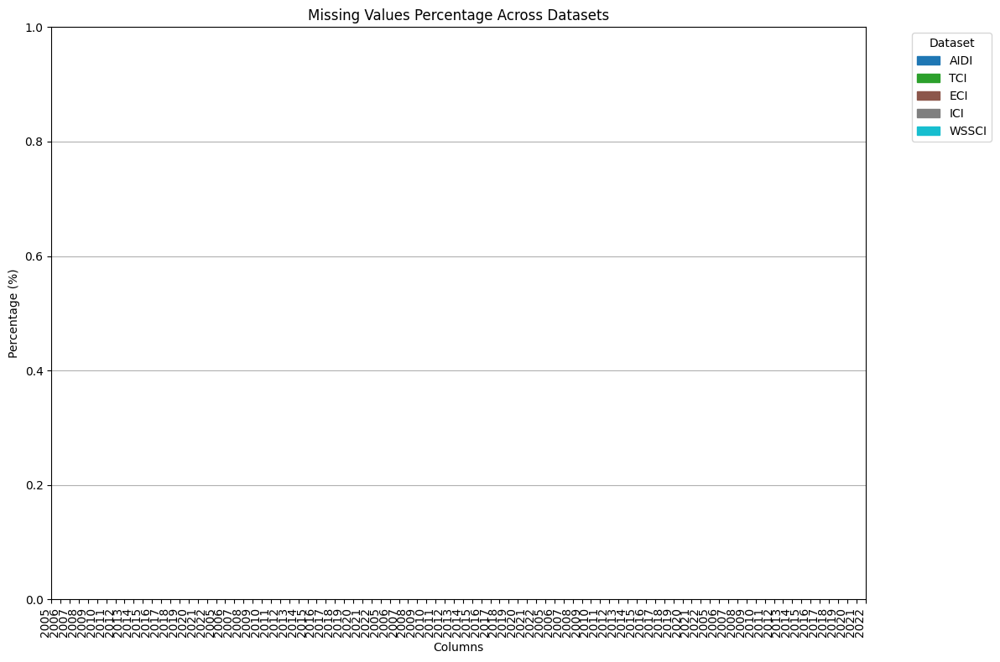

In [12]:
import matplotlib.pyplot as plt
import pandas as pd

def display_missing_values(datasets):
    # Initialize lists to store data
    columns = []
    missing_percentages = []
    dataset_names = list(datasets.keys())  # Get dataset names for legend

    # Iterate through each dataset
    for name, data in datasets.items():
        # Calculate missing values and percentage
        missing_values = data.isnull().sum()
        missing_percentage = ((missing_values / len(data)) * 100).round(2)

        # Append data for each dataset to lists, excluding 'Country' column
        columns.extend(missing_percentage.index.drop('Country'))
        missing_percentages.extend(missing_percentage.drop('Country').values)

    # Create a DataFrame from accumulated data
    missing_info = pd.DataFrame({
        'Dataset': columns,
        'Percentage': missing_percentages
    })

    # Plotting all datasets in one plot with different colors
    plt.figure(figsize=(12, 8))

    # Define colors for each dataset
    colors = plt.cm.get_cmap('tab10', len(dataset_names))

    # Iterate through datasets and plot bars
    bar_width = 0.15
    x_positions = range(len(missing_info))
    for i, dataset_name in enumerate(dataset_names):
        # Filter data for the current dataset
        dataset_missing_info = missing_info[missing_info['Dataset'].str.contains(dataset_name)]
        if not dataset_missing_info.empty:
            plt.bar([x + i * bar_width for x in x_positions], dataset_missing_info['Percentage'],
                    width=bar_width, label=dataset_name, color=colors(i))

    # Customize plot attributes
    plt.title('Missing Values Percentage Across Datasets')
    plt.xlabel('Columns')
    plt.ylabel('Percentage (%)')
    plt.xticks(x_positions, missing_info['Dataset'], rotation=90, ha='right')
    plt.grid(axis='y')

    # Customize legend with colors
    legend_handles = [plt.Rectangle((0,0),1,1, color=colors(i)) for i in range(len(dataset_names))]
    plt.legend(legend_handles, dataset_names, title='Dataset', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

# Example usage with your datasets dictionary
datasets = {
    'AIDI': aidi,
    'TCI': tci,
    'ECI': eci,
    'ICI': ici,
    'WSSCI': wssci
}

# Display missing values percentage across all datasets in one plot
display_missing_values(datasets)


# Total Missingness Ratio

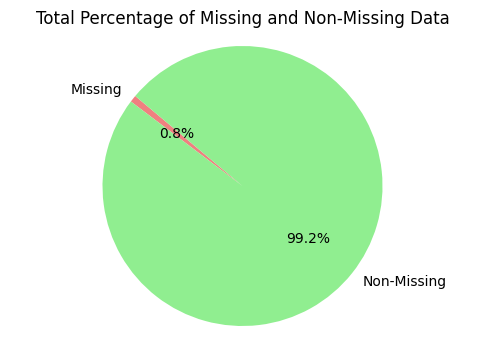

In [13]:
import matplotlib.pyplot as plt

def plot_total_data_availability(datasets):
    total_missing = 0
    total_non_missing = 0

    # Calculate the total missing and non-missing percentages
    for data in datasets:
        total_missing += data.isnull().sum().sum()
        total_non_missing += (data.size - data.isnull().sum().sum())

    # Calculate the total values
    total_values = total_missing + total_non_missing

    # Calculate the percentages
    total_percentage_missing = (total_missing / total_values) * 100
    total_percentage_non_missing = (total_non_missing / total_values) * 100

    # Plot the pie chart
    labels = ['Missing', 'Non-Missing']
    sizes = [total_percentage_missing, total_percentage_non_missing]
    colors = ['lightcoral', 'lightgreen']

    plt.figure(figsize=(6, 4))  # Adjust figure size
    plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
    plt.title('Total Percentage of Missing and Non-Missing Data')

    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

    plt.show()

# Usage example:
# Plot total data availability for all datasets
plot_total_data_availability([aidi, tci, eci, ici, wssci])


# Missing Data Summary

Upon evaluation, it is evident that South Sudan is the only country with missing data in each dataset:

The overall missingness rate for South Sudan across AIDI, TCI, ECI, and ICI datasets is 44.44%.
Specifically, for the WSSCI dataset, the missing rate for South Sudan is 50%.
These missing values are observed between the years 2005 and 2013.

Total % of Missing to non-missing is: Missing: 0.8% and Non-Missing: 99.2%

This analysis underscores that while the majority of data is complete, South Sudan exhibits significant missingness in several key datasets.

# Visual Observation for South Sudan

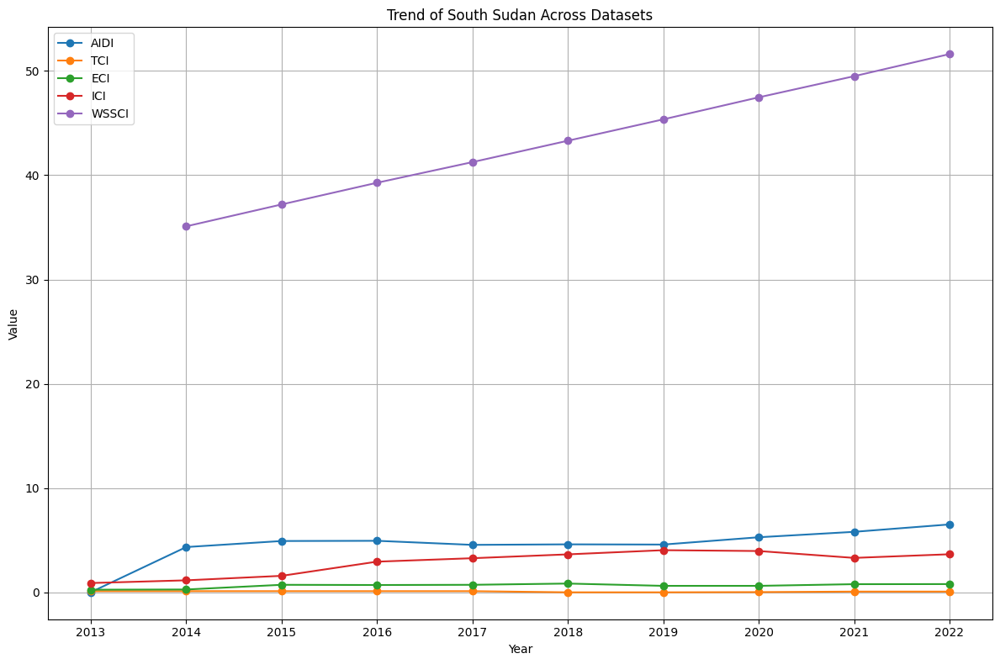

In [14]:
import matplotlib.pyplot as plt

# Example datasets (replace with your actual datasets)
datasets = {
    'AIDI': aidi,
    'TCI': tci,
    'ECI': eci,
    'ICI': ici,
    'WSSCI': wssci
}

# Initialize a figure and axis
plt.figure(figsize=(12, 8))
ax = plt.subplot(111)

# Plot each dataset for South Sudan
for dataset_name, dataset in datasets.items():
    # Filter data for South Sudan
    south_sudan_data = dataset[dataset['Country'] == 'South Sudan']

    # Plotting the data
    ax.plot(dataset.columns[1:], south_sudan_data.iloc[0, 1:], marker='o', label=dataset_name)

# Add labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Value')
ax.set_title('Trend of South Sudan Across Datasets')

# Add legend
ax.legend()

# Show plot
plt.grid(True)
plt.tight_layout()
plt.show()


# Backward Forecasting FIlling

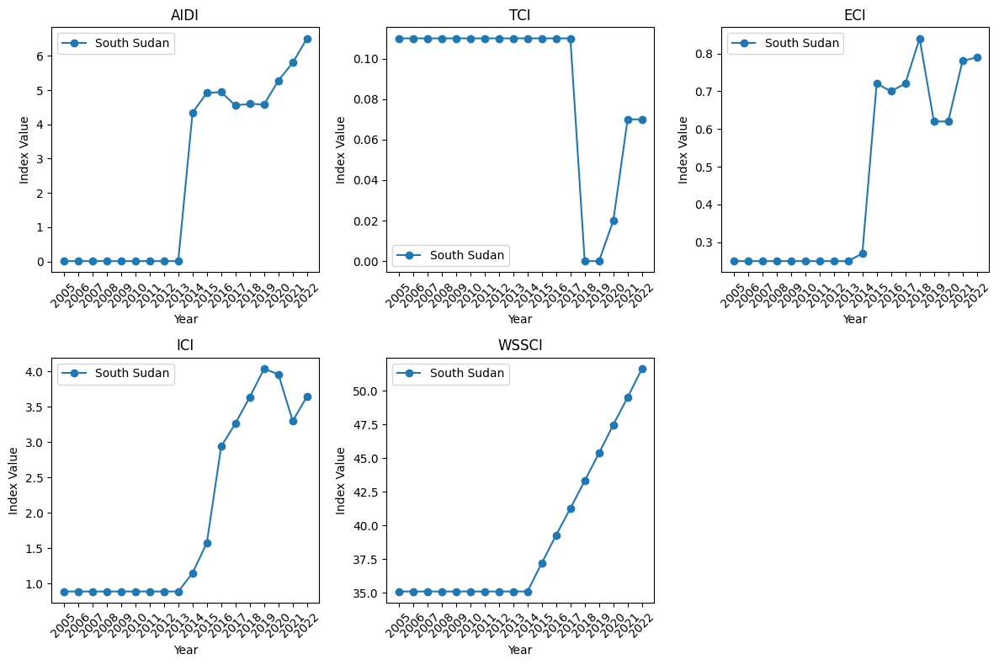

In [15]:
import pandas as pd
import matplotlib.pyplot as plt



# Function to perform backward forecasting for South Sudan
def backward_forecast(df):
    # Fill missing values using backward filling method
    df_filled = df.fillna(method='bfill', axis=1)
    return df_filled

# Perform backward forecasting for each dataset
aidi_filled = backward_forecast(pd.DataFrame(aidi).set_index('Country'))
tci_filled = backward_forecast(pd.DataFrame(tci).set_index('Country'))
eci_filled = backward_forecast(pd.DataFrame(eci).set_index('Country'))
ici_filled = backward_forecast(pd.DataFrame(ici).set_index('Country'))
wssci_filled = backward_forecast(pd.DataFrame(wssci).set_index('Country'))

# Plotting the trends for South Sudan across all datasets
plt.figure(figsize=(12, 8))

# AIDI plot
plt.subplot(231)
plt.plot(aidi_filled.columns, aidi_filled.loc['South Sudan'], marker='o', label='South Sudan')
plt.title('AIDI')
plt.xlabel('Year')
plt.ylabel('Index Value')
plt.xticks(rotation=45)
plt.legend()

# TCI plot
plt.subplot(232)
plt.plot(tci_filled.columns, tci_filled.loc['South Sudan'], marker='o', label='South Sudan')
plt.title('TCI')
plt.xlabel('Year')
plt.ylabel('Index Value')
plt.xticks(rotation=45)
plt.legend()

# ECI plot
plt.subplot(233)
plt.plot(eci_filled.columns, eci_filled.loc['South Sudan'], marker='o', label='South Sudan')
plt.title('ECI')
plt.xlabel('Year')
plt.ylabel('Index Value')
plt.xticks(rotation=45)
plt.legend()

# ICI plot
plt.subplot(234)
plt.plot(ici_filled.columns, ici_filled.loc['South Sudan'], marker='o', label='South Sudan')
plt.title('ICI')
plt.xlabel('Year')
plt.ylabel('Index Value')
plt.xticks(rotation=45)
plt.legend()

# WSSCI plot
plt.subplot(235)
plt.plot(wssci_filled.columns, wssci_filled.loc['South Sudan'], marker='o', label='South Sudan')
plt.title('WSSCI')
plt.xlabel('Year')
plt.ylabel('Index Value')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()


In [16]:
# Check for missing values
print("AIDI Missing Values:\n", aidi_filled.isnull().sum().sum())
print("\nTCI Missing Values:\n", tci_filled.isnull().sum().sum())
print("\nECI Missing Values:\n", eci_filled.isnull().sum().sum())
print("\nICI Missing Values:\n", ici_filled.isnull().sum().sum())
print("\nWSSCI Missing Values:\n", wssci_filled.isnull().sum().sum())


AIDI Missing Values:
 0

TCI Missing Values:
 0

ECI Missing Values:
 0

ICI Missing Values:
 0

WSSCI Missing Values:
 0


# Variable Re-assignment

In [17]:
Aidi =aidi_filled
Transport =tci_filled
Electricity =eci_filled
Ict =ici_filled
Water =wssci_filled

# Dataset Shape

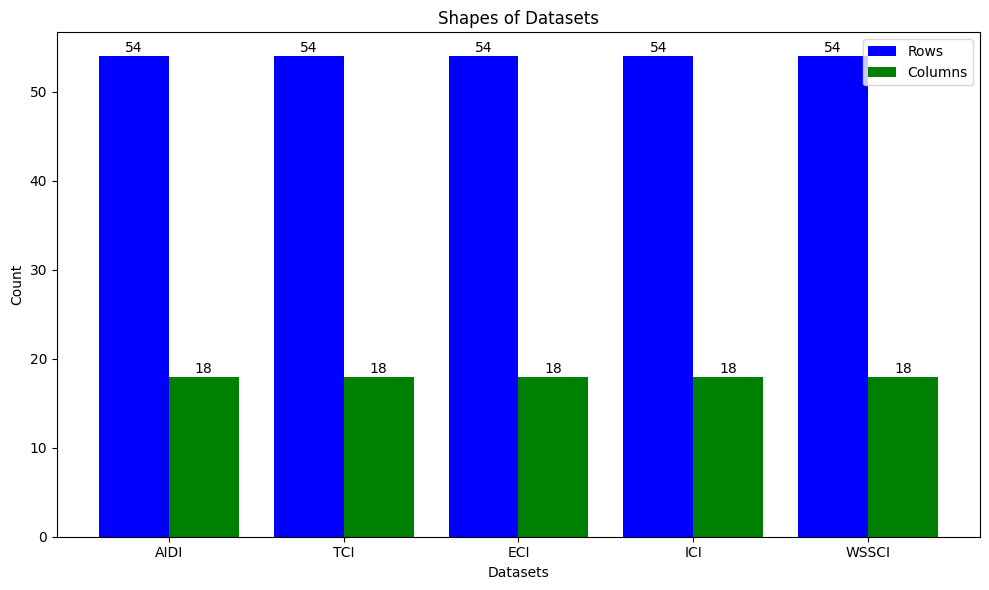

In [18]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_dataset_shapes(datasets, dataset_names):
    fig, ax = plt.subplots(figsize=(10, 6))

    # Extracting shapes
    shapes = [df.shape for df in datasets]
    rows = [shape[0] for shape in shapes]
    cols = [shape[1] for shape in shapes]

    # Plotting bars
    bar_width = 0.4
    index = range(len(datasets))
    bars1 = ax.bar(index, rows, bar_width, label='Rows', color='b')
    bars2 = ax.bar([i + bar_width for i in index], cols, bar_width, label='Columns', color='g')

    # Adding labels, title, and legend
    ax.set_xlabel('Datasets')
    ax.set_ylabel('Count')
    ax.set_title('Shapes of Datasets')
    ax.set_xticks([i + bar_width / 2 for i in index])
    ax.set_xticklabels(dataset_names)
    ax.legend()

    # Adding values on top of the bars
    for bar, value in zip(bars1, rows):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.1, value,
                ha='center', va='bottom', fontsize=10)
    for bar, value in zip(bars2, cols):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.1, value,
                ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming you have defined datasets like aidi_filled, tci_filled, eci_filled, ici_filled, wssci_filled
datasets = [Aidi, Transport, Electricity, Ict, Water]
dataset_names = ['AIDI', 'TCI', 'ECI', 'ICI', 'WSSCI']

plot_dataset_shapes(datasets, dataset_names)


# Shape Summary

"The dataset consists of 54 rows and 18 columns after indexing by the country column. This structure enables efficient access and analysis of data pertaining to various countries across different metrics. Each row represents a distinct country, while the columns encompass a range of economic indicators or related metrics spanning from 2005 to 2022. This format facilitates detailed examination and comparison of trends and developments over time across different nations."

# Dataset Info

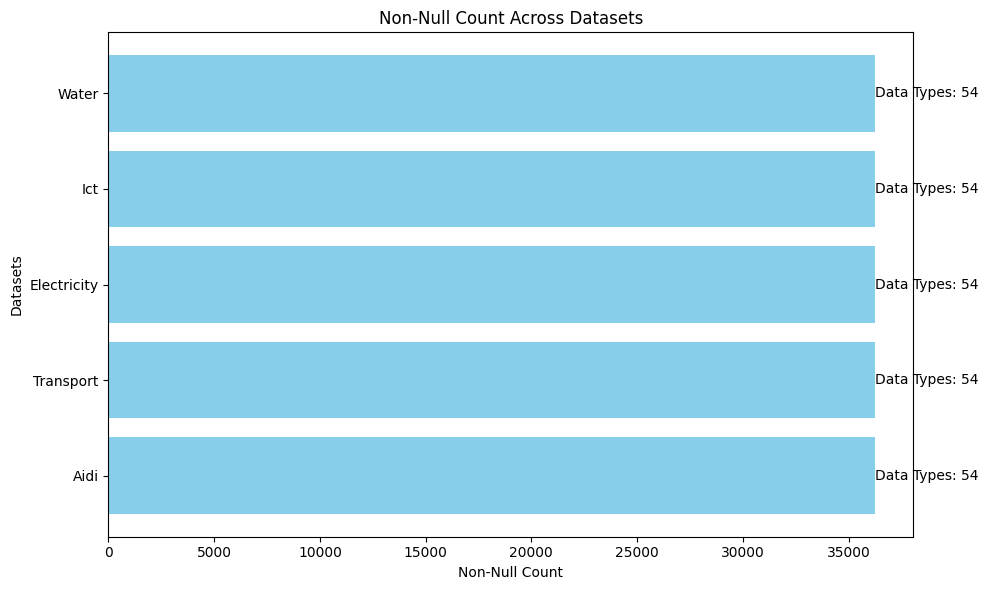

In [19]:
import matplotlib.pyplot as plt
import pandas as pd
from io import StringIO

# Assuming the datasets are already defined and available in the environment
datasets = ["Aidi", "Transport", "Electricity", "Ict", "Water"]

# Function to create a creative .info() visualization
def creative_info_visualization(datasets):
    info_data = []

    for dataset_name in datasets:
        dataset = globals()[dataset_name]  # Access the DataFrame using its name

        # Capture the output of dataset.info() into a string
        buffer = StringIO()
        dataset.info(buf=buffer)
        info_str = buffer.getvalue()

        # Extract non-null count and data types from info_str
        non_null_counts = []
        data_types = []
        for line in info_str.split("\n"):
            if 'non-null' in line:
                parts = line.split()
                non_null_counts.append(int(parts[1]))
                data_types.append(parts[2])

        total_non_null_count = sum(non_null_counts)
        unique_data_types = ", ".join(set(data_types))

        info_data.append({
            'Dataset': dataset_name,
            'Non-Null Count': total_non_null_count,
            'Data Types': unique_data_types
        })

    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.barh([x['Dataset'] for x in info_data], [x['Non-Null Count'] for x in info_data], color='skyblue')
    ax.set_xlabel('Non-Null Count')
    ax.set_ylabel('Datasets')
    ax.set_title('Non-Null Count Across Datasets')

    # Adding data types as annotations
    for i, (dataset_name, non_null_count, data_types) in enumerate(zip([x['Dataset'] for x in info_data], [x['Non-Null Count'] for x in info_data], [x['Data Types'] for x in info_data])):
        ax.text(non_null_count + 10, i, f'Data Types: {data_types}', verticalalignment='center')

    plt.tight_layout()
    plt.show()

# Example usage
creative_info_visualization(datasets)


# Datasets Info Summary

### Dataset Reports

This report provides a summary of five datasets: **Aidi**, **Transport**, **Electricity**, **Ict**, and **Water**. Each dataset consists of 54 entries representing countries, spanning from Algeria to Zimbabwe. The datasets comprise 18 columns, each corresponding to a year from 2005 to 2022. All columns contain numerical data in the float64 format.

#### Dataset: Aidi
```
<class 'pandas.core.frame.DataFrame'>
Index: 54 entries, Algeria to Zimbabwe
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2005    54 non-null     float64
 1   2006    54 non-null     float64
 2   2007    54 non-null     float64
 3   2008    54 non-null     float64
 4   2009    54 non-null     float64
 5   2010    54 non-null     float64
 6   2011    54 non-null     float64
 7   2012    54 non-null     float64
 8   2013    54 non-null     float64
 9   2014    54 non-null     float64
 10  2015    54 non-null     float64
 11  2016    54 non-null     float64
 12  2017    54 non-null     float64
 13  2018    54 non-null     float64
 14  2019    54 non-null     float64
 15  2020    54 non-null     float64
 16  2021    54 non-null     float64
 17  2022    54 non-null     float64
dtypes: float64(18)
memory usage: 10.1+ KB
```

#### Dataset: Transport
```
<class 'pandas.core.frame.DataFrame'>
Index: 54 entries, Algeria to Zimbabwe
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2005    54 non-null     float64
 1   2006    54 non-null     float64
 2   2007    54 non-null     float64
 3   2008    54 non-null     float64
 4   2009    54 non-null     float64
 5   2010    54 non-null     float64
 6   2011    54 non-null     float64
 7   2012    54 non-null     float64
 8   2013    54 non-null     float64
 9   2014    54 non-null     float64
 10  2015    54 non-null     float64
 11  2016    54 non-null     float64
 12  2017    54 non-null     float64
 13  2018    54 non-null     float64
 14  2019    54 non-null     float64
 15  2020    54 non-null     float64
 16  2021    54 non-null     float64
 17  2022    54 non-null     float64
dtypes: float64(18)
memory usage: 10.1+ KB
```

#### Dataset: Electricity
```
<class 'pandas.core.frame.DataFrame'>
Index: 54 entries, Algeria to Zimbabwe
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2005    54 non-null     float64
 1   2006    54 non-null     float64
 2   2007    54 non-null     float64
 3   2008    54 non-null     float64
 4   2009    54 non-null     float64
 5   2010    54 non-null     float64
 6   2011    54 non-null     float64
 7   2012    54 non-null     float64
 8   2013    54 non-null     float64
 9   2014    54 non-null     float64
 10  2015    54 non-null     float64
 11  2016    54 non-null     float64
 12  2017    54 non-null     float64
 13  2018    54 non-null     float64
 14  2019    54 non-null     float64
 15  2020    54 non-null     float64
 16  2021    54 non-null     float64
 17  2022    54 non-null     float64
dtypes: float64(18)
memory usage: 10.1+ KB
```

#### Dataset: Ict
```
<class 'pandas.core.frame.DataFrame'>
Index: 54 entries, Algeria to Zimbabwe
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2005    54 non-null     float64
 1   2006    54 non-null     float64
 2   2007    54 non-null     float64
 3   2008    54 non-null     float64
 4   2009    54 non-null     float64
 5   2010    54 non-null     float64
 6   2011    54 non-null     float64
 7   2012    54 non-null     float64
 8   2013    54 non-null     float64
 9   2014    54 non-null     float64
 10  2015    54 non-null     float64
 11  2016    54 non-null     float64
 12  2017    54 non-null     float64
 13  2018    54 non-null     float64
 14  2019    54 non-null     float64
 15  2020    54 non-null     float64
 16  2021    54 non-null     float64
 17  2022    54 non-null     float64
dtypes: float64(18)
memory usage: 10.1+ KB
```

#### Dataset: Water
```
<class 'pandas.core.frame.DataFrame'>
Index: 54 entries, Algeria to Zimbabwe
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2005    54 non-null     float64
 1   2006    54 non-null     float64
 2   2007    54 non-null     float64
 3   2008    54 non-null     float64
 4   2009    54 non-null     float64
 5   2010    54 non-null     float64
 6   2011    54 non-null     float64
 7   2012    54 non-null     float64
 8   2013    54 non-null     float64
 9   2014    54 non-null     float64
 10  2015    54 non-null     float64
 11  2016    54 non-null     float64
 12  2017    54 non-null     float64
 13  2018    54 non-null     float64
 14  2019    54 non-null     float64
 15  2020    54 non-null     float64
 16  2021    54 non-null     float64
 17  2022    54 non-null     float64
dtypes: float64(18)
memory usage: 10.1+ KB
```

### Summary

- **Entries**: Each dataset has 54 entries, representing countries from Algeria to Zimbabwe.
- **Columns**: Each dataset has 18 columns, corresponding to the years 2005 to 2022.
- **Data Types**: All columns in each dataset are of type float64.
- **Non-Null Counts**: All columns in each dataset have 54 non-null entries, indicating no missing values.
- **Memory Usage**: Each dataset uses approximately 10.1+ KB of memory.

### Analysis

The datasets are comprehensive and consistent, with no missing values and uniform data types across all years. This uniformity makes the datasets suitable for time-series analysis, trend identification, and other statistical evaluations. The efficient memory usage ensures that the datasets can be handled effectively even with larger data sets.

In [20]:
Aidi.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54 entries, Algeria to Zimbabwe
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2005    54 non-null     float64
 1   2006    54 non-null     float64
 2   2007    54 non-null     float64
 3   2008    54 non-null     float64
 4   2009    54 non-null     float64
 5   2010    54 non-null     float64
 6   2011    54 non-null     float64
 7   2012    54 non-null     float64
 8   2013    54 non-null     float64
 9   2014    54 non-null     float64
 10  2015    54 non-null     float64
 11  2016    54 non-null     float64
 12  2017    54 non-null     float64
 13  2018    54 non-null     float64
 14  2019    54 non-null     float64
 15  2020    54 non-null     float64
 16  2021    54 non-null     float64
 17  2022    54 non-null     float64
dtypes: float64(18)
memory usage: 10.1+ KB


# Descriptive Statistics

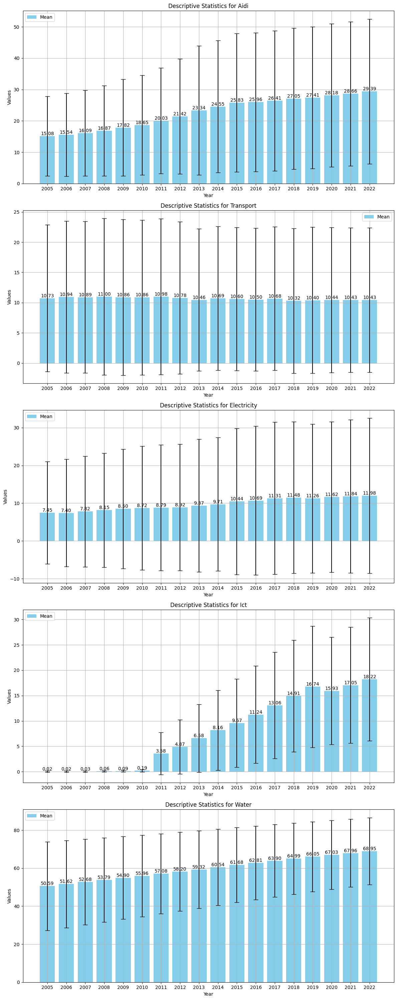

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming the datasets are already defined and available in the environment
datasets = ["Aidi", "Transport", "Electricity", "Ict", "Water"]

# Function to plot descriptive statistics
def plot_descriptive_statistics(datasets):
    num_datasets = len(datasets)
    fig, axes = plt.subplots(nrows=num_datasets, ncols=1, figsize=(12, 6 * num_datasets))

    if num_datasets == 1:
        axes = [axes]  # Make it iterable if there's only one subplot

    for ax, dataset_name in zip(axes, datasets):
        dataset = globals()[dataset_name]  # Access the dataset using its name
        desc_stats = dataset.describe()

        ax.bar(desc_stats.columns, desc_stats.loc['mean'], yerr=desc_stats.loc['std'], capsize=5, color='skyblue')
        ax.set_title(f'Descriptive Statistics for {dataset_name}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Values')
        ax.legend(['Mean', 'Std Dev'])
        ax.grid(True)

        for i, col in enumerate(desc_stats.columns):
            ax.text(i, desc_stats.loc['mean', col], f"{desc_stats.loc['mean', col]:.2f}", ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

# Example usage
plot_descriptive_statistics(datasets)


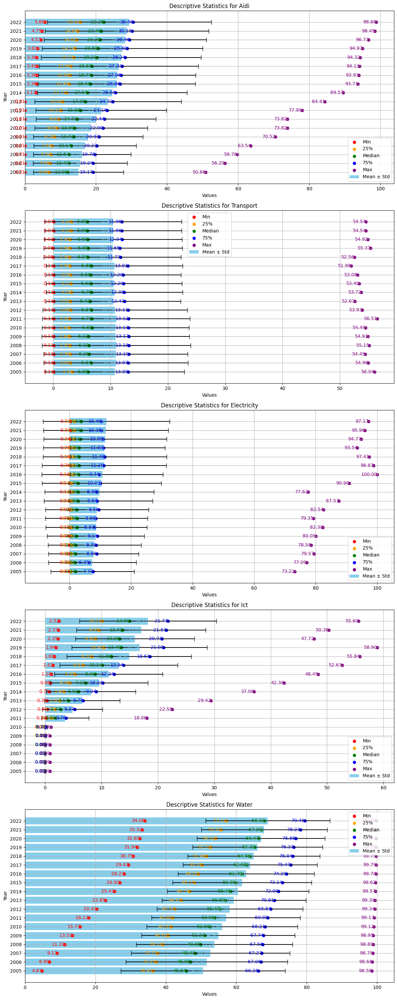

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming the datasets are already defined and available in the environment
datasets = ["Aidi", "Transport", "Electricity", "Ict", "Water"]

# Function to plot descriptive statistics
def plot_descriptive_statistics(datasets):
    num_datasets = len(datasets)
    fig, axes = plt.subplots(nrows=num_datasets, ncols=1, figsize=(12, 6 * num_datasets))

    if num_datasets == 1:
        axes = [axes]  # Make it iterable if there's only one subplot

    for ax, dataset_name in zip(axes, datasets):
        dataset = globals()[dataset_name]  # Access the dataset using its name
        desc_stats = dataset.describe().transpose()

        ax.barh(desc_stats.index, desc_stats['mean'], xerr=desc_stats['std'], capsize=5, color='skyblue', label='Mean ± Std')
        ax.scatter(desc_stats['min'], desc_stats.index, color='red', label='Min')
        ax.scatter(desc_stats['25%'], desc_stats.index, color='orange', label='25%')
        ax.scatter(desc_stats['50%'], desc_stats.index, color='green', label='Median')
        ax.scatter(desc_stats['75%'], desc_stats.index, color='blue', label='75%')
        ax.scatter(desc_stats['max'], desc_stats.index, color='purple', label='Max')

        ax.set_title(f'Descriptive Statistics for {dataset_name}')
        ax.set_xlabel('Values')
        ax.set_ylabel('Year')
        ax.legend()
        ax.grid(True)

        for i in range(len(desc_stats)):
            ax.text(desc_stats['mean'][i], i, f"{desc_stats['mean'][i]:.2f}", va='center', ha='right', color='skyblue')
            ax.text(desc_stats['min'][i], i, f"{desc_stats['min'][i]:.2f}", va='center', ha='right', color='red')
            ax.text(desc_stats['25%'][i], i, f"{desc_stats['25%'][i]:.2f}", va='center', ha='right', color='orange')
            ax.text(desc_stats['50%'][i], i, f"{desc_stats['50%'][i]:.2f}", va='center', ha='right', color='green')
            ax.text(desc_stats['75%'][i], i, f"{desc_stats['75%'][i]:.2f}", va='center', ha='right', color='blue')
            ax.text(desc_stats['max'][i], i, f"{desc_stats['max'][i]:.2f}", va='center', ha='right', color='purple')

    plt.tight_layout()
    plt.show()

# Example usage
plot_descriptive_statistics(datasets)


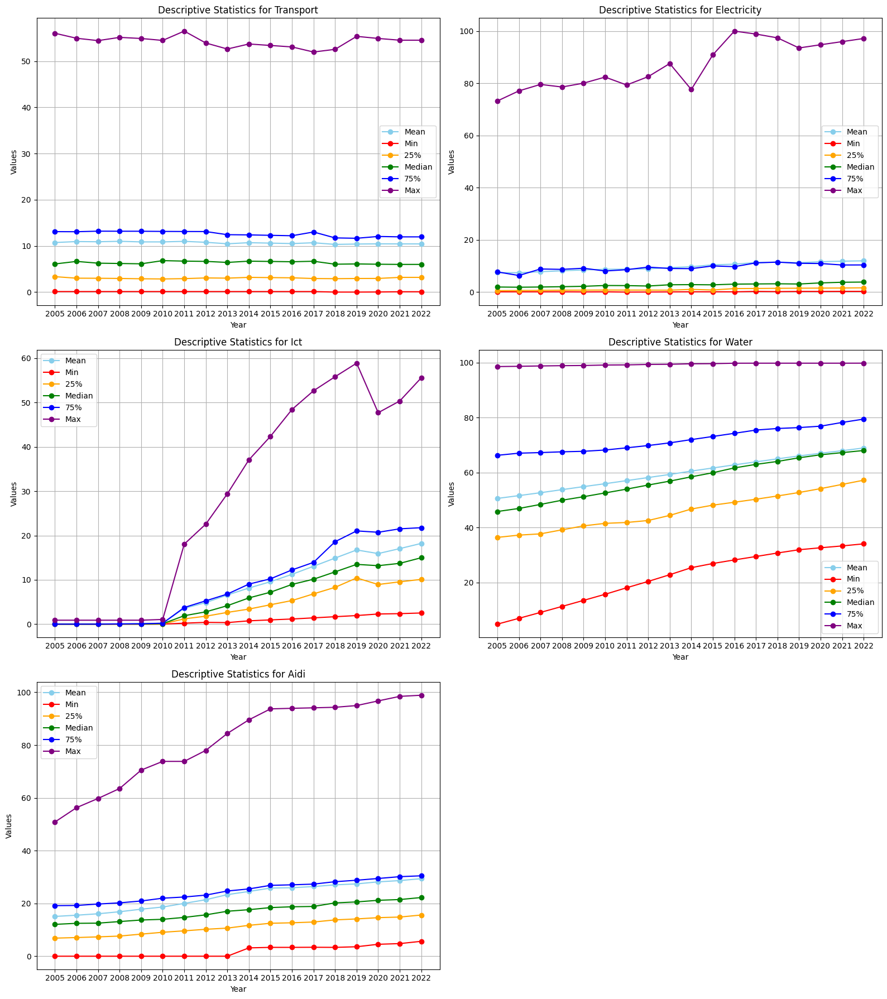

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming the datasets are already defined and available in the environment
datasets = ["Transport", "Electricity", "Ict", "Water", "Aidi"]

# Function to plot descriptive statistics with subplots as line plots
def plot_descriptive_statistics(datasets):
    num_datasets = len(datasets)
    rows = (num_datasets + 1) // 2  # Calculate number of rows needed
    cols = 2  # Fixed 2 columns for the subplot layout
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(16, 6 * rows))

    for i, dataset_name in enumerate(datasets):
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]  # Adjust for single row case
        dataset = globals()[dataset_name]  # Access the dataset using its name
        desc_stats = dataset.describe().transpose()

        # Plotting mean as a line plot
        ax.plot(desc_stats.index, desc_stats['mean'], marker='o', color='skyblue', label='Mean')

        # Plotting other percentiles as lines
        ax.plot(desc_stats.index, desc_stats['min'], marker='o', color='red', label='Min')
        ax.plot(desc_stats.index, desc_stats['25%'], marker='o', color='orange', label='25%')
        ax.plot(desc_stats.index, desc_stats['50%'], marker='o', color='green', label='Median')
        ax.plot(desc_stats.index, desc_stats['75%'], marker='o', color='blue', label='75%')
        ax.plot(desc_stats.index, desc_stats['max'], marker='o', color='purple', label='Max')

        ax.set_title(f'Descriptive Statistics for {dataset_name}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Values')
        ax.legend()
        ax.grid(True)

    # Remove any empty subplots if there are fewer datasets than rows*cols
    for j in range(num_datasets, rows * cols):
        fig.delaxes(axes.flatten()[j])

    plt.tight_layout()
    plt.show()

# Example usage
plot_descriptive_statistics(datasets)


# Descriptive Statistics Summary

The image showcases five line graphs, each representing descriptive statistics for different sectors across a period from 2005 to 2022.  

Here's a breakdown of each graph:

* **Descriptive Statistics for Transport:**  The graph shows a slight decrease in values from 2005 to 2010, followed by a period of stabilization, and then a slight increase towards the end.
* **Descriptive Statistics for Electricity:** This graph demonstrates an overall upward trend with fluctuations, highlighting a general improvement in the sector over the years.
* **Descriptive Statistics for ICT:**  A steep increase in values from 2010 onwards indicates significant growth in the ICT sector during this period.
* **Descriptive Statistics for Water:**  The graph shows a steady and gradual upward trend, signifying consistent progress in water infrastructure and access.
* **Descriptive Statistics for Aidi:** This graph illustrates a gradual increase in values, demonstrating a consistent growth trend over the period.

Each graph includes the following statistical measures:
* **Mean:** The average value for each year.
* **Min:** The minimum value observed in each year.
* **25%:** The 25th percentile value, representing the point below which 25% of the data falls.
* **Median:** The middle value when the data is ordered from least to greatest.
* **75%:** The 75th percentile value, representing the point below which 75% of the data falls.
* **Max:** The maximum value observed in each year.

Overall, the graphs provide a visual representation of the development trends for various sectors from 2005 to 2022. The upward trends in most sectors suggest positive growth and improvement over the years.



# Descriptive Statistics By Counntry

Descriptive plots for dataset: AIDI


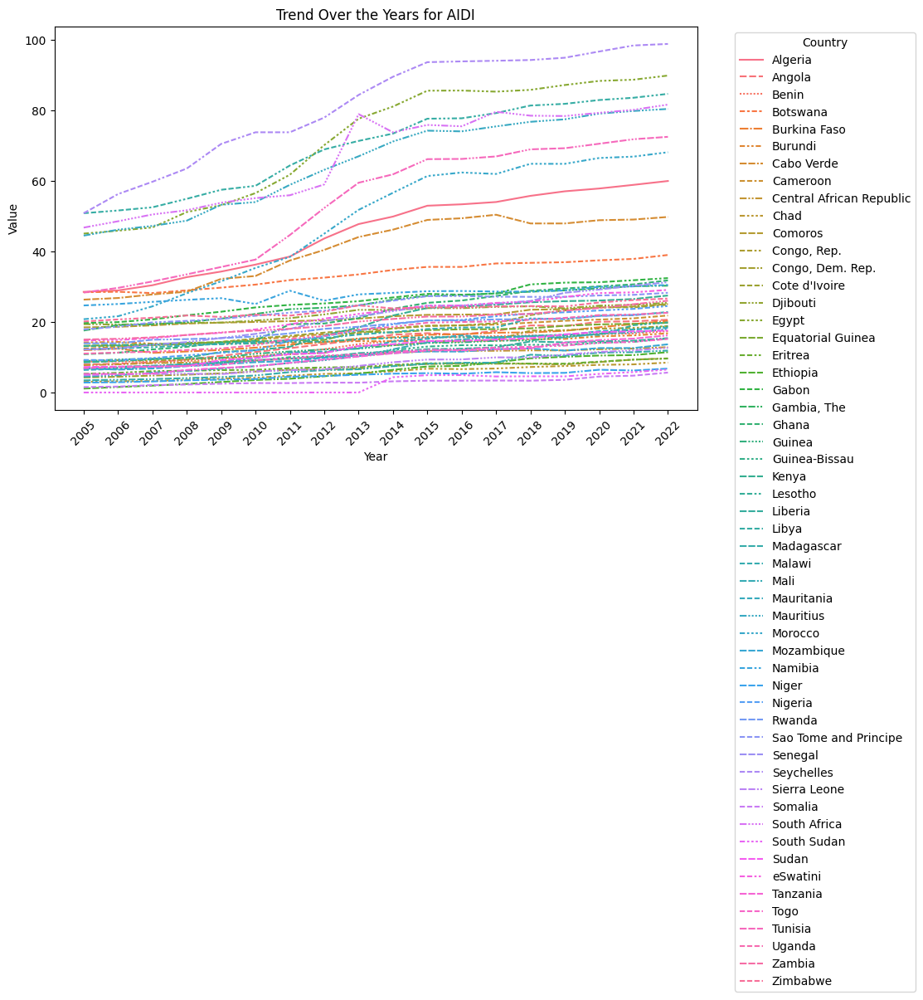

Descriptive plots for dataset: Transport Composite Index


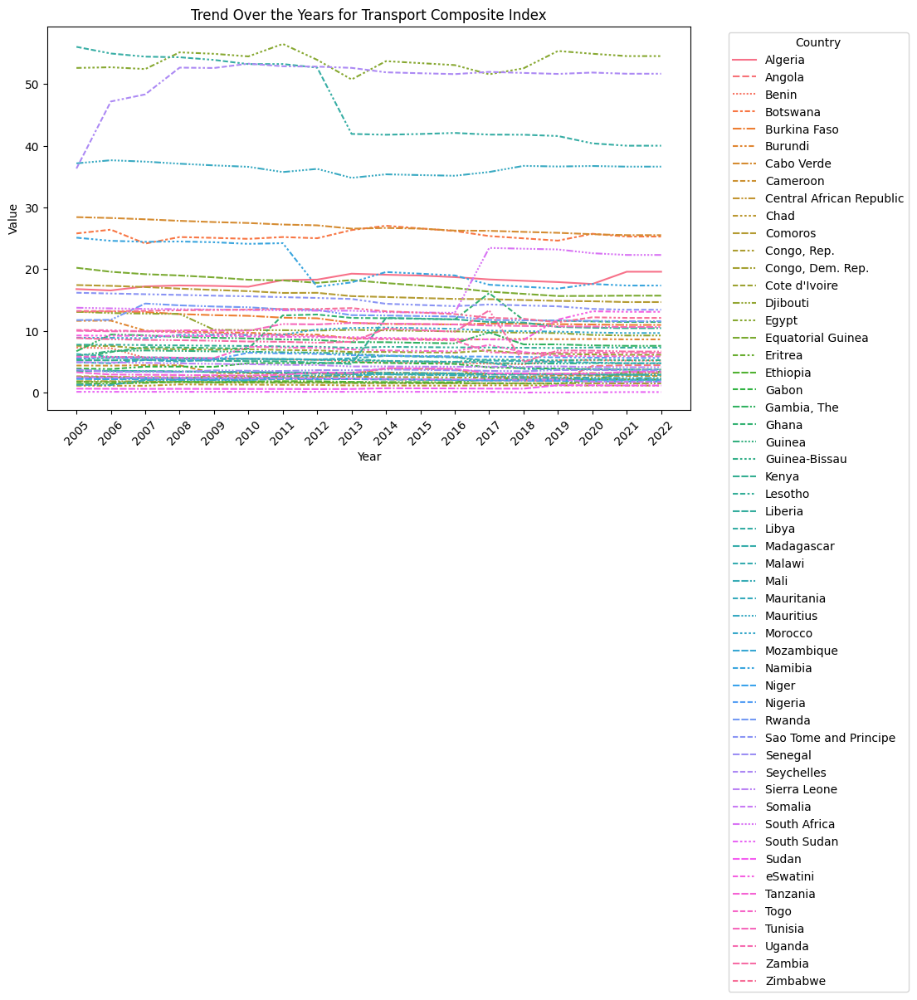

Descriptive plots for dataset: Electricity Composite Index


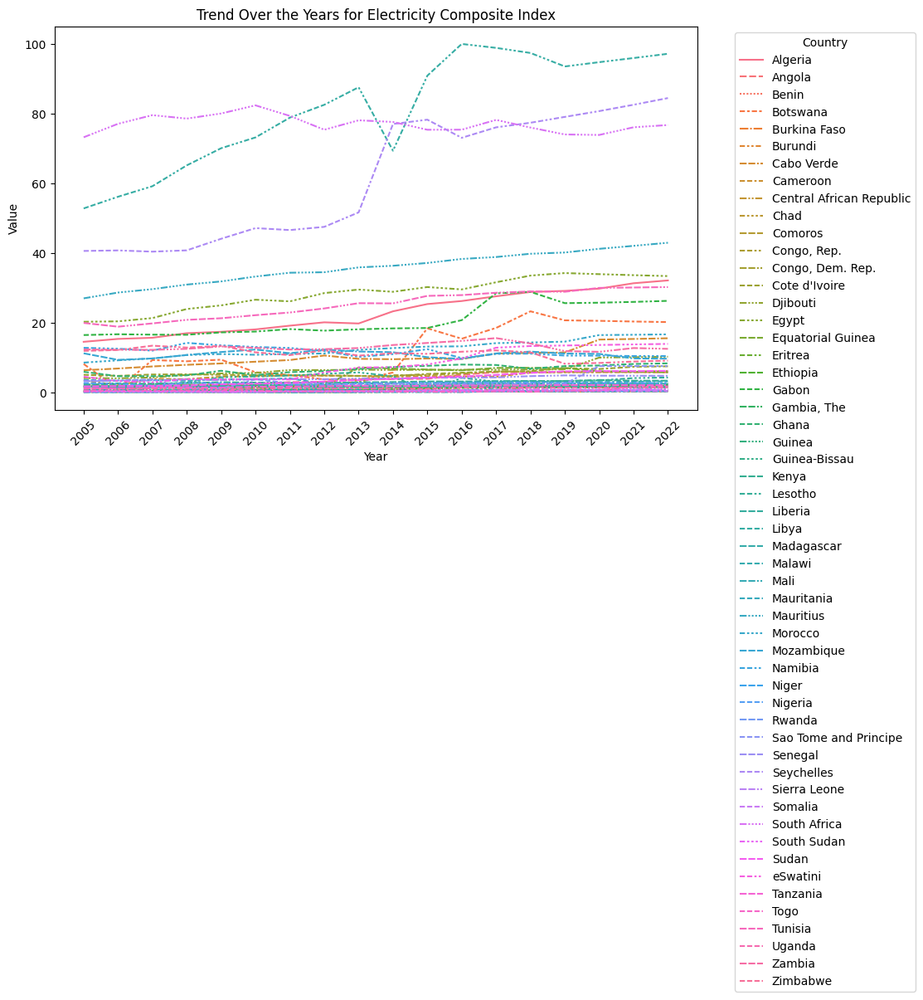

Descriptive plots for dataset: ICT Composite Index


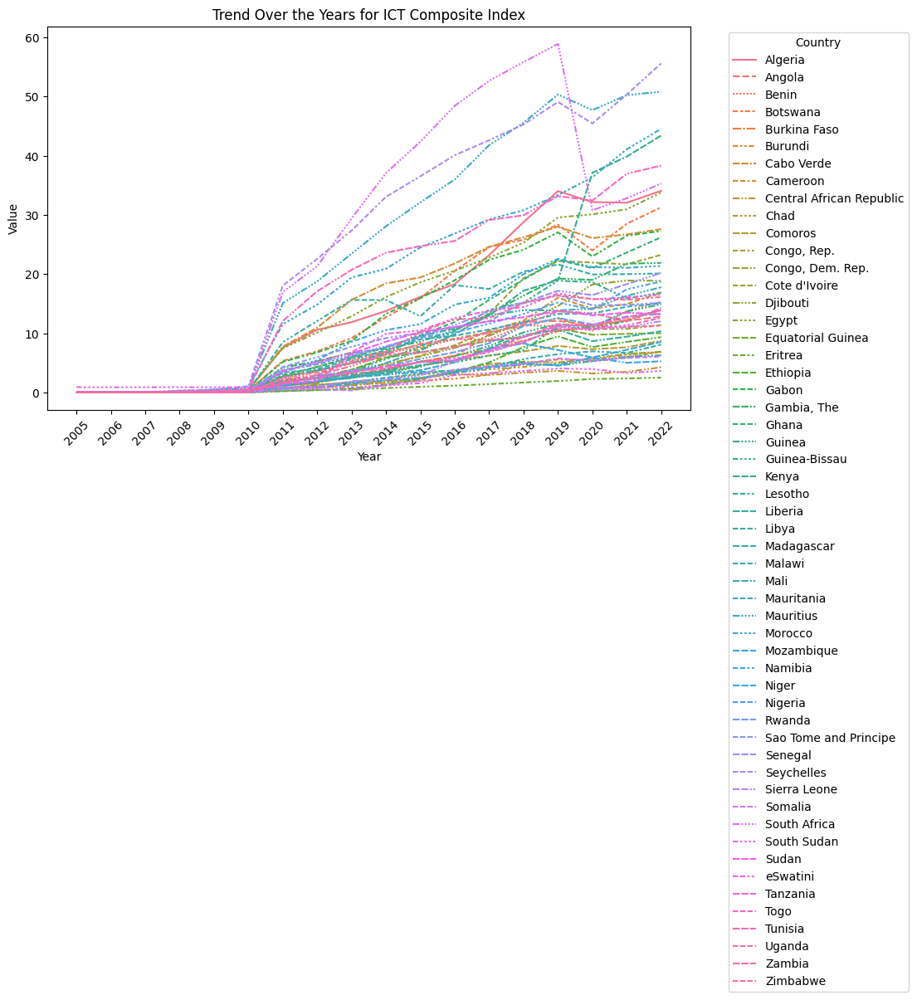

Descriptive plots for dataset: Water and Sanitation Service Composite Index


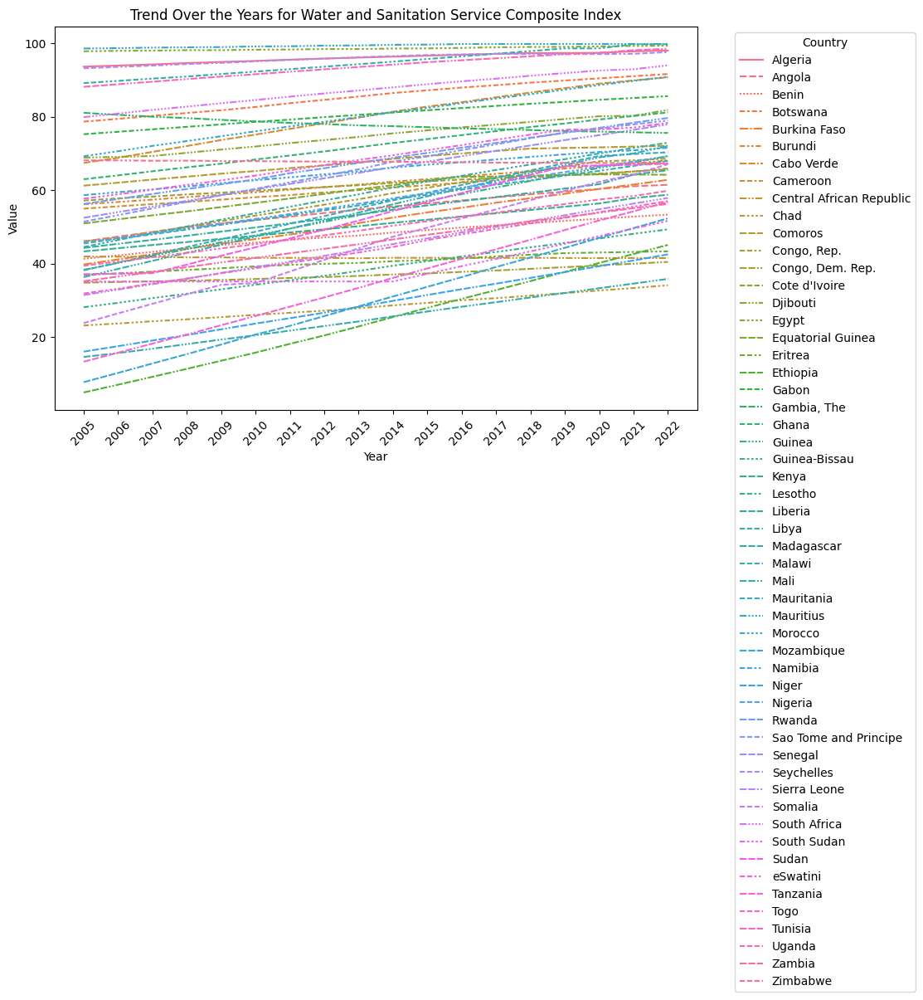

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming datasets are already defined and available
datasets = {
    'AIDI': Aidi,
    'Transport Composite Index': Transport,
    'Electricity Composite Index': Electricity,
    'ICT Composite Index': Ict,
    'Water and Sanitation Service Composite Index': Water
}

for name, df in datasets.items():
    print(f"Descriptive plots for dataset: {name}")
    plt.figure(figsize=(10, 6))

    # Line plot for each country's trend over the years
    sns.lineplot(data=df.T)  # Transpose to have years as x-axis
    plt.title(f"Trend Over the Years for {name}")
    plt.xlabel("Year")
    plt.ylabel("Value")  # Modify ylabel as per your dataset unit
    plt.xticks(rotation=45)
    plt.legend(title="Country", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


## Desctiptive Statistics By Country Summary

AIDI: Africa Infrastructure Developmet Index


**Summary:**

The line graph visualizes the progress of various African countries in infrastructure development, as measured by the African Infrastructure Development Index (AIDI), from 2005 to 2022.  Overall, the graph indicates a general upward trend in AIDI for most countries, highlighting an overall improvement in infrastructure development across Africa. However, significant variations exist between countries, demonstrating different rates and levels of progress.

**Key Observations:**

* **General Upward Trend:** The graph highlights a general upward trajectory in AIDI for most African countries. This suggests a positive trend in infrastructure development across the continent.
* **Varied Progress:**  A noticeable disparity exists in the progress made by different countries. Some countries, like  Namibia and Zimbabwe, show a steeper and more rapid increase in AIDI, indicating significant strides in infrastructure development. Others, like Algeria, Angola, and Botswana, demonstrate a more gradual increase or even a plateauing effect after 2015, suggesting a potential stabilization or slowdown in their infrastructure development.
* **Plateauing:**  The plateauing effect observed in some countries might indicate a potential reaching of a certain level of development, a change in priorities, or perhaps challenges in sustaining a rapid pace of infrastructure development.

**Possible Explanations for Variations:**

The variations in AIDI progress across countries could be attributed to a combination of factors, including:

* **Economic Conditions:** Countries with stronger economic growth and greater investment capacity are likely to see more significant improvements in infrastructure.
* **Government Policies:**  Strong government policies focused on infrastructure development, including investment in roads, energy, and communication systems, can significantly contribute to improved AIDI scores.
* **Access to Funding:**  Countries with greater access to foreign aid and international financing for infrastructure projects can accelerate their development.
* **Geopolitical Factors:**  Political stability, security, and regional conflicts can impact infrastructure development and, consequently, AIDI scores.
* **Natural Resources:** Availability of natural resources, like oil or minerals, can influence a country's ability to invest in infrastructure.




TCI: TransPort Composite Index

The graph displays the trend of the Transport Composite Index (TCI) over the years for various African countries from 2005 to 2022.  The vertical axis represents the "Value" of the TCI, while the horizontal axis represents the "Year". Each line on the graph represents a specific country, with the legend on the right providing the color-coded mapping of countries to their respective lines.

Here's a breakdown of what the graph shows:

**Overall Trend:**

* **Variability:** There's a significant amount of variation between countries in terms of their TCI values and how they change over time. Some countries show relatively stable TCI values, while others exhibit more fluctuations or significant upward or downward trends.
* **No Consistent Direction:**  Unlike the previous image with the AIDI, there isn't a clear, consistent upward trend in the TCI values across all countries.  While some countries show improvements, others show declines.

**Observations:**

* **High TCI:**  Countries like Algeria, Botswana, and South Africa have generally higher TCI values, suggesting better developed transport infrastructure.
* **Lower TCI:** Countries like Burkina Faso, Guinea-Bissau, and Somalia generally have lower TCI values, indicating potential challenges in their transport infrastructure.
* **Fluctuations:**  Several countries, such as  Mali, Namibia, and Rwanda, experience notable fluctuations in their TCI values, potentially reflecting changes in their investment priorities or challenges in maintaining infrastructure.

**Possible Interpretations:**

The variability in TCI trends might reflect different factors influencing transport infrastructure development in each country:

* **Economic Conditions:** Countries with robust economies and greater investment capacity are likely to have better transport infrastructure, leading to higher TCI values.
* **Government Policies:**  Strong government policies focused on transport infrastructure development, including investments in roads, railways, and ports, can contribute to higher TCI scores.
* **Geographical Factors:** Countries with challenging terrain or limited access to ports might face greater difficulties in developing efficient transport networks, resulting in lower TCI values.
* **Political Stability:**  Political instability and conflicts can disrupt transport infrastructure development and hinder improvements in TCI.




ECI: Electricity Composite Index

The graph visualizes the trends in the Electricity Composite Index (ECI) for various African countries from 2005 to 2022. The vertical axis represents the ECI "Value", while the horizontal axis represents the "Year". Each line represents a specific African country, with a corresponding legend on the right side of the graph.

Here are some key observations:

* **Variability:**  There is considerable variation between countries in their ECI values and how they evolve over time. Some countries experience relatively stable ECI values, while others show more fluctuations or significant upward or downward trends.
* **Limited Consistent Upward Trend:** Unlike the previous graph showing the Transport Composite Index (TCI), there isn't a clear, consistent upward trend in the ECI values across all countries. While some countries show improvement, others show declines.
* **Higher ECI Countries:** Countries like South Africa, Algeria, and Morocco generally have higher ECI values, indicating better-developed electricity infrastructure.
* **Lower ECI Countries:** Countries like Burundi, Guinea-Bissau, and Somalia generally have lower ECI values, potentially indicating challenges in their electricity infrastructure.
* **Notable Fluctuations:**  Several countries, such as Mali, Senegal, and Namibia, experience notable fluctuations in their ECI values. These fluctuations could reflect changes in their investment priorities, economic conditions, or challenges in maintaining existing infrastructure.

**Possible Explanations for Variations:**

The varied ECI trends across different countries might reflect a combination of factors, including:

* **Economic Growth:**  Countries with stronger economic growth and greater investment capacity are more likely to see significant improvements in their electricity infrastructure, leading to higher ECI scores.
* **Government Policies:**  Strong government policies focused on electricity infrastructure development, including investments in power generation, transmission, and distribution, can contribute to higher ECI scores.
* **Access to Funding:**  Countries with greater access to foreign aid and international financing for electricity projects can accelerate their infrastructure development.
* **Natural Resources:** Availability of natural resources, such as hydroelectric potential or fossil fuels, can influence a country's ability to invest in electricity generation and improve its ECI score.
* **Political Stability:**  Political instability, conflicts, and security concerns can hinder electricity infrastructure development and negatively impact ECI values.




ICI: ICT Composite Index

The graph depicts the trend of the ICT Composite Index (ICI) over the years for various African countries, spanning from 2005 to 2022. The vertical axis represents the ICI "Value", while the horizontal axis represents the "Year". Each line corresponds to a specific African country, identified by the legend on the right side of the graph.

Here are key observations:

* **Overall Upward Trend:** A clear upward trend is noticeable across most of the countries, indicating improvement in their Information and Communication Technology (ICT) infrastructure and development over time.
* **Varying Rates of Growth:** Although the overall trend is upward, the rate of growth varies considerably among different countries. Some countries exhibit steeper upward slopes, while others show more gradual increases.
* **Higher ICI Countries:** Countries like South Africa, Tunisia, and Morocco generally have higher ICI values, suggesting more advanced ICT infrastructure and development.
* **Lower ICI Countries:** Countries like Burundi, Somalia, and Guinea-Bissau generally have lower ICI values, potentially indicating challenges in developing their ICT infrastructure.
* **Notable Fluctuations:** While the trend is generally upward, some countries experience notable fluctuations in their ICI values over the years. These fluctuations might reflect factors like economic conditions, government policies, or changes in investment priorities related to ICT development.

**Factors Influencing Trends:**

The variations in ICI trends across countries likely reflect a complex interplay of factors:

* **Economic Growth:** Countries with stronger economic growth and greater investment capacity tend to see faster improvement in ICT infrastructure.
* **Government Policies:**  Strong government policies promoting ICT development, including investments in telecommunications infrastructure, digital literacy programs, and technology adoption, contribute to higher ICI values.
* **Access to Funding:** Countries with greater access to foreign aid, international financing, and private sector investment for ICT projects are more likely to see rapid development.
* **Education and Skills:**  The level of education and digital literacy in the population plays a crucial role in ICT adoption and economic productivity.
* **Regulatory Environment:**  A conducive regulatory environment that fosters innovation, competition, and investment in ICT is essential for the sector's growth.
* **Political Stability:**  Stable political environments conducive to long-term planning and investment are more likely to see sustained ICT progress.







WSSCI: Water Services & Sanitation Composite Index

The graph illustrates the trend of the Water and Sanitation Service Composite Index (WSSCI) for various African countries over a period spanning from 2005 to 2022. The vertical axis represents the "Value" of the WSSCI, ranging from 0 to 100, while the horizontal axis represents the "Year". Each line on the graph corresponds to a specific African country, with the country names listed in the legend on the right side of the chart.

Key Observations:

* Overall Upward Trend: The majority of countries exhibit an upward trend in their WSSCI values over the years. This indicates improvements in access to safe water and sanitation services in these nations.
* Variability in Rates of Improvement: Although the general trend is upward, the rate of improvement varies significantly between countries. Some countries demonstrate steeper upward slopes, signifying faster progress in water and sanitation services, while others experience more gradual increases.
* Higher WSSCI Countries:  Countries like South Africa, Tunisia, and Morocco generally maintain higher WSSCI values, suggesting more developed water and sanitation infrastructure and access to services compared to other countries.
* Lower WSSCI Countries: Countries like Burundi, Somalia, and Guinea-Bissau typically exhibit lower WSSCI values, potentially indicating challenges in providing adequate water and sanitation services to their populations.
* Fluctuations in WSSCI: While the trend is generally upward, certain countries show noticeable fluctuations in their WSSCI values over the years. These fluctuations could reflect factors such as economic conditions, government policies, or changes in investment priorities related to water and sanitation infrastructure.

Factors Influencing Trends:

The differences in WSSCI trends across countries are likely influenced by a combination of factors:

* Economic Growth and Investment: Countries with robust economic growth and higher investment capacity tend to show faster improvements in water and sanitation services.
* Government Policies: Strong government policies supporting water and sanitation infrastructure development, including investment in sanitation facilities, access to clean water sources, and public health initiatives, contribute to higher WSSCI values.
* Funding Availability: Countries with greater access to international aid, foreign investment, and domestic funding for water and sanitation projects are more likely to achieve rapid progress.
* Population Growth and Urbanization:  Rapid population growth and increasing urbanization create challenges in meeting the demand for water and sanitation services, potentially slowing down progress in some countries.
* Geographic and Environmental Factors:  Factors such as water scarcity, arid climates, and remote locations can pose challenges in developing sustainable water and sanitation solutions.
* Political Stability and Governance:  Stable political environments conducive to long-term planning and investment are more conducive to sustained progress in water and sanitation infrastructure development.





# Data Distribution in Datasets

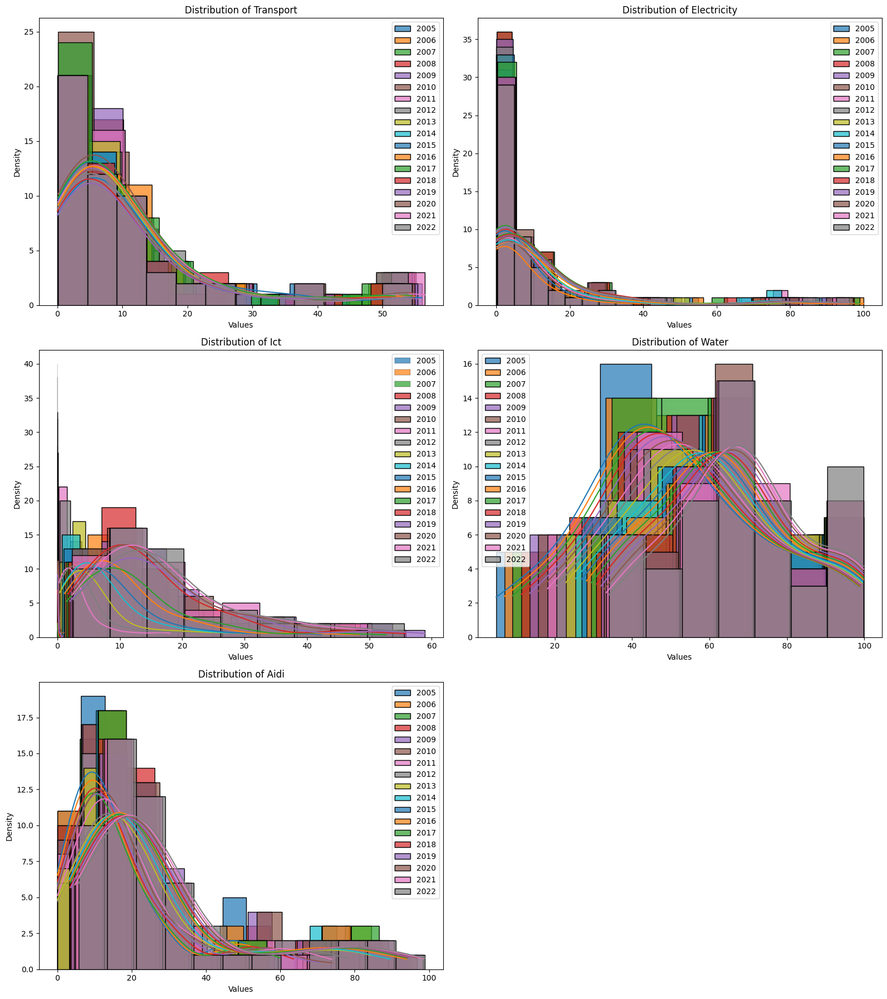

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming the datasets are already defined and available in the environment
datasets = ["Transport", "Electricity", "Ict", "Water", "Aidi"]

# Function to plot distribution plots for each dataset
def plot_comprehensive_distribution(datasets):
    num_datasets = len(datasets)
    rows = (num_datasets + 1) // 2  # Calculate number of rows needed
    cols = 2  # Fixed 2 columns for the subplot layout
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(16, 6 * rows))

    for i, dataset_name in enumerate(datasets):
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]  # Adjust for single row case
        dataset = globals()[dataset_name]  # Access the dataset using its name

        # Plotting distribution plot for each year
        for year in dataset.columns:
            sns.histplot(dataset[year], kde=True, ax=ax, label=year, alpha=0.7)

        ax.set_title(f'Distribution of {dataset_name}')
        ax.set_xlabel('Values')
        ax.set_ylabel('Density')
        ax.legend()

    # Remove any empty subplots if there are fewer datasets than rows*cols
    for j in range(num_datasets, rows * cols):
        fig.delaxes(axes.flatten()[j])

    plt.tight_layout()
    plt.show()

# Example usage
plot_comprehensive_distribution(datasets)


# Data Distribution Summary

The provided charts illustrate the descriptive statistics and distributions of various categories, namely Transport, Electricity, Ict, Water, and Aidi, across different years from 2005 to 2022.  Analyzing both sets of charts, we can extract several insights and inferences:

**General Trends:**
* **Increasing Trend:** Most categories exhibit a general increasing trend over the years, suggesting growth or development in these sectors.
    * **Ict:** The most significant growth is observed in Ict, with a rapid rise in both mean and maximum values starting from 2010 onwards, indicating a rapid increase in adoption and usage of Information and Communication Technologies.
    * **Water:** Water shows a more gradual, yet consistent increase, highlighting steady progress in water management or infrastructure development.
    * **Electricity:** Electricity also displays a general upward trend, suggesting increasing energy demand and production.
    * **Aidi:** Similar to Electricity, Aidi shows a gradual rise, indicating a possible increase in related services or infrastructure.
* **Stable Trend:** Transport shows a relatively stable trend, fluctuating between 45 and 55, indicating a possible plateau in the sector or a balance between growth and stagnation.

**Distribution Insights:**
* **Skewness:** The histograms reveal the distribution patterns of values within each category.  
    * **Transport:** The distribution of Transport values appears skewed to the right, indicating a concentration of data towards lower values.
    * **Electricity:** Similar to Transport, the distribution of Electricity values shows a right-skewed distribution, implying a greater concentration of values towards the lower end.
    * **Ict:** The distribution of Ict values exhibits a more balanced shape, suggesting a wider spread of values across the range.
    * **Water:** The distribution of Water values also appears skewed to the right, indicating a higher concentration of data at lower values.
    * **Aidi:**  Aidi's distribution appears right-skewed, indicating a concentration of values towards the lower end.

**Inferences and Potential Explanations:**

* The stable trend in Transport might be influenced by factors like a mature market, regulatory constraints, or economic conditions.
* The rapid increase in Ict likely reflects the widespread adoption of technology, digitalization, and communication advancements.
* The gradual increases in Water and Electricity suggest a continuous effort to improve infrastructure, manage resources, and meet growing demand.
* The right-skewed distributions of Transport, Electricity, and Water might be due to the existence of a few outliers (high values) or the presence of factors limiting the growth of these sectors.





# Skewness & Kurtosis

In [26]:
import pandas as pd
import numpy as np
from scipy.stats import skew, kurtosis

# Assuming your datasets are already defined and available in the environment as DataFrames
datasets = ["Aidi", "Transport", "Electricity", "Ict", "Water"]

# Function to calculate Skewness and Kurtosis for each country in each dataset
def calculate_skewness_kurtosis(datasets):
    results = {}
    for dataset_name in datasets:
        dataset = globals()[dataset_name]  # Access the dataset using its name
        skewness = {}
        kurt = {}

        for country in dataset.index:
            skewness[country] = dataset.loc[country].skew()
            kurt[country] = dataset.loc[country].kurtosis()

        results[dataset_name] = pd.DataFrame({'Skewness': skewness, 'Kurtosis': kurt})

    return results

# Example usage
results = calculate_skewness_kurtosis(datasets)

# Print or use results as needed
for dataset_name, stats_df in results.items():
    print(f"Dataset: {dataset_name}")
    print(stats_df)  # Displaying the first few rows for demonstration
    print("\n")


Dataset: Aidi
                          Skewness  Kurtosis
Algeria                  -0.296120 -1.601733
Angola                   -0.215843 -1.429996
Benin                    -0.281150 -1.739486
Botswana                 -0.180648 -1.523372
Burkina Faso              0.184482 -1.132162
Burundi                   1.329919  1.119232
Cabo Verde               -0.528938 -1.520138
Cameroon                 -0.146535 -1.417193
Central African Republic -0.288284 -1.531353
Chad                     -0.071680 -1.448598
Comoros                   0.270097 -1.117254
Congo, Rep.               0.280298 -1.494785
Congo, Dem. Rep.         -0.173950 -1.154904
Cote d'Ivoire             0.339911 -1.208877
Djibouti                 -0.317236 -1.671032
Egypt                    -0.453663 -1.642490
Equatorial Guinea        -0.044302 -1.676949
Eritrea                  -0.035131 -1.013077
Ethiopia                  0.097488 -1.489222
Gabon                    -0.106475 -1.175014
Gambia, The              -0.346949 -1.324

## Skewness & Kurtosis Summary

Skewness and kurtosis are statistical measures that describe the shape and characteristics of a distribution:

1. **Skewness:**
   - Skewness measures the asymmetry of the distribution.
   - A negative skewness (left-skewed) indicates that the distribution has a tail extending towards the left, with more values concentrated on the right side of the distribution's peak (mean).
   - A positive skewness (right-skewed) indicates that the distribution has a tail extending towards the right, with more values concentrated on the left side of the distribution's peak.

2. **Kurtosis:**
   - Kurtosis measures the peakedness or flatness of a distribution relative to a normal distribution.
   - A negative kurtosis (platykurtic) indicates a distribution that is flatter and has fewer outliers than the normal distribution.
   - A positive kurtosis (leptokurtic) indicates a distribution that is more peaked and has more outliers than the normal distribution.

Interpreting the given dataset (Aidi) based on skewness and kurtosis:

- **Skewness Interpretation:**
  - Most countries in this dataset show a slightly negative skewness, which suggests a tendency towards being left-skewed. This means that for these countries, the values tend to cluster more towards the right side of the distribution's peak (higher values) with a tail extending towards the lower values.

- **Kurtosis Interpretation:**
  - Kurtosis values for most countries are negative, indicating that the distributions are generally platykurtic. This suggests that the distributions are relatively flat and have fewer extreme values (outliers) compared to a normal distribution.



# Minimum & Maximum

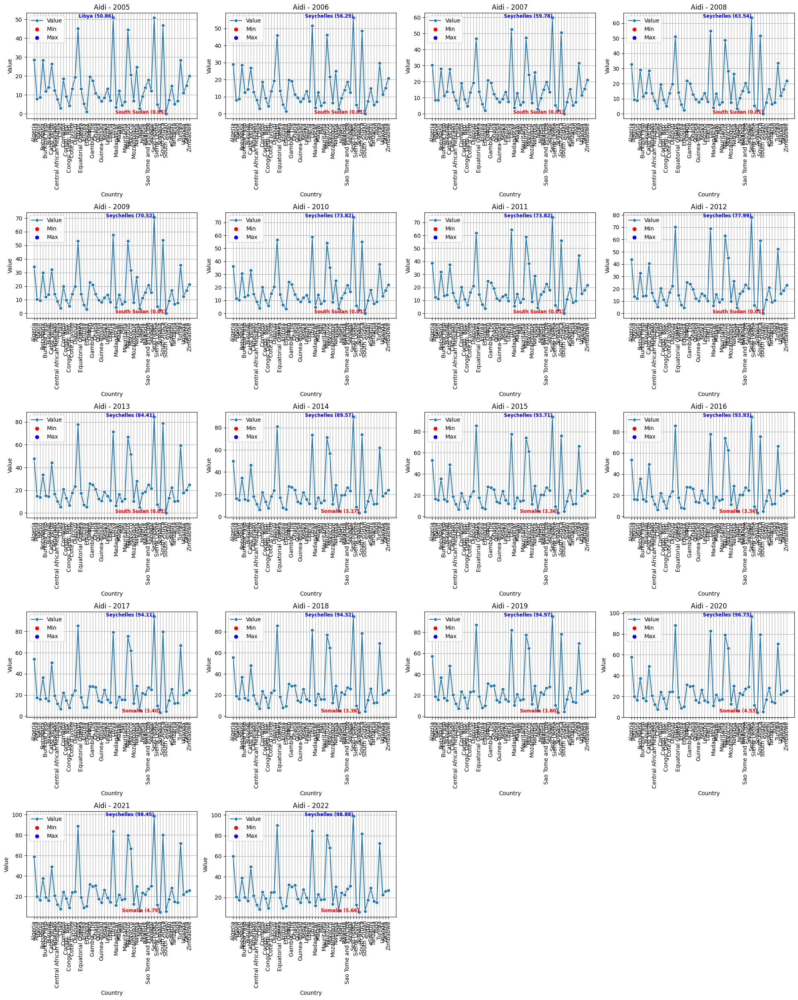


Summary for dataset: Aidi
For 2005:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Libya with value 50.86
For 2006:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 56.29
For 2007:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 59.78
For 2008:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 63.54
For 2009:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 70.52
For 2010:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 73.82
For 2011:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 73.82
For 2012:
  Country

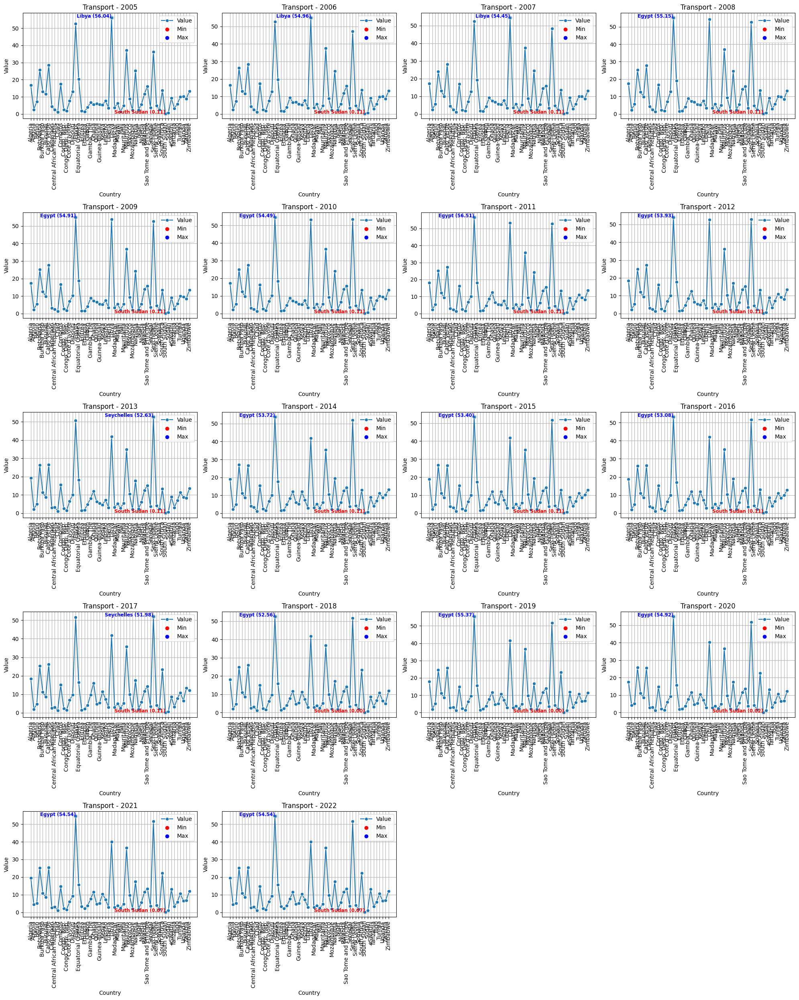


Summary for dataset: Transport
For 2005:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Libya with value 56.04
For 2006:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Libya with value 54.96
For 2007:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Libya with value 54.45
For 2008:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Egypt with value 55.15
For 2009:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Egypt with value 54.91
For 2010:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Egypt with value 54.49
For 2011:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Egypt with value 56.51
For 2012:
  Country with the lowest index is

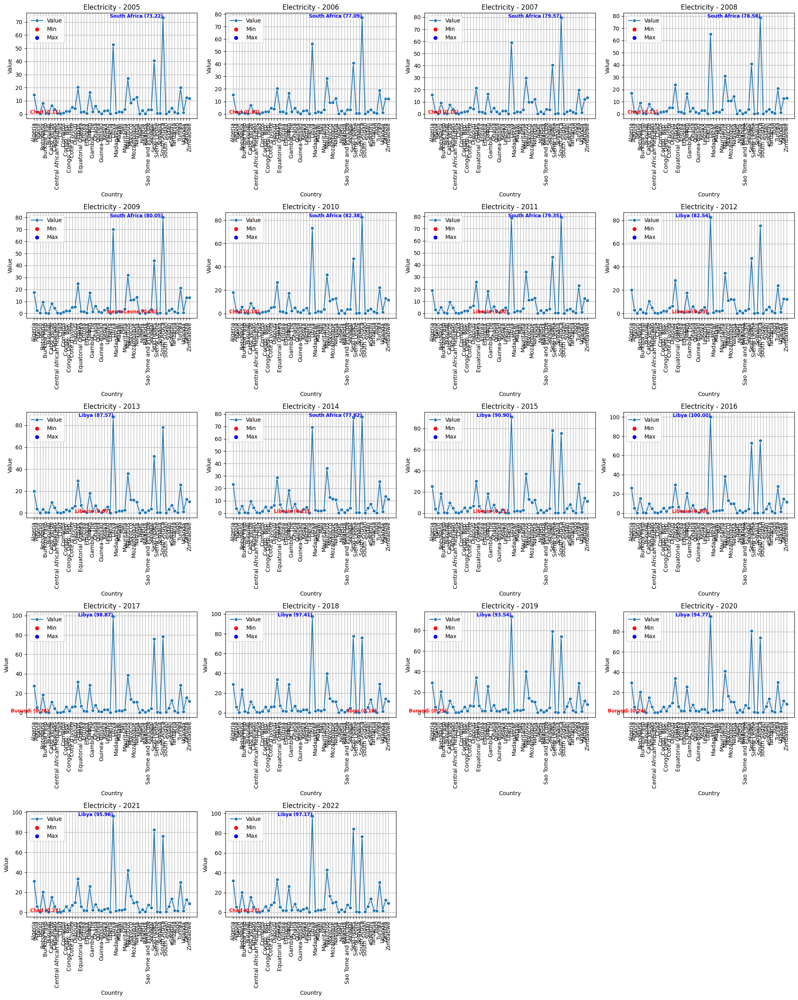


Summary for dataset: Electricity
For 2005:
  Country with the lowest index is Chad with value 0.11
  Country with the highest index is South Africa with value 73.22
For 2006:
  Country with the lowest index is Chad with value 0.1
  Country with the highest index is South Africa with value 77.09
For 2007:
  Country with the lowest index is Chad with value 0.1
  Country with the highest index is South Africa with value 79.57
For 2008:
  Country with the lowest index is Chad with value 0.11
  Country with the highest index is South Africa with value 78.58
For 2009:
  Country with the lowest index is Sierra Leone with value 0.06
  Country with the highest index is South Africa with value 80.05
For 2010:
  Country with the lowest index is Chad with value 0.1
  Country with the highest index is South Africa with value 82.38
For 2011:
  Country with the lowest index is Liberia with value 0.0
  Country with the highest index is South Africa with value 79.35
For 2012:
  Country with the lowest

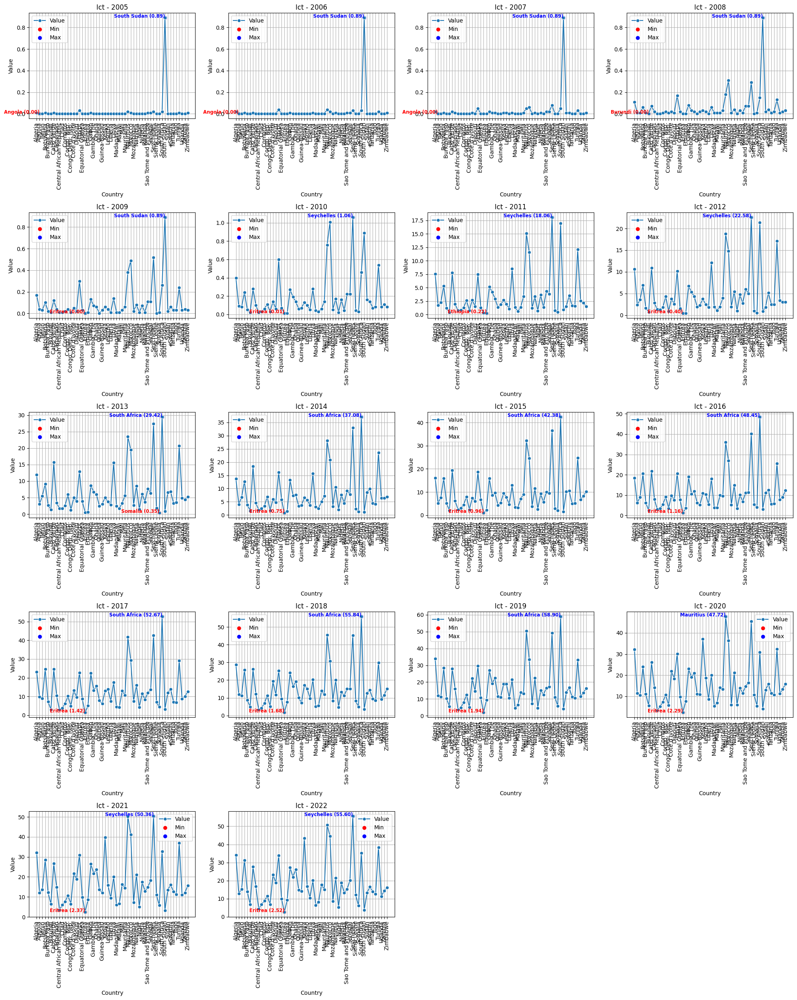


Summary for dataset: Ict
For 2005:
  Country with the lowest index is Angola with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2006:
  Country with the lowest index is Angola with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2007:
  Country with the lowest index is Angola with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2008:
  Country with the lowest index is Burundi with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2009:
  Country with the lowest index is Eritrea with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2010:
  Country with the lowest index is Eritrea with value 0.01
  Country with the highest index is Seychelles with value 1.06
For 2011:
  Country with the lowest index is Ethiopia with value 0.22
  Country with the highest index is Seychelles with value 18.06
For 2012:
  Country with the lowest index is Eritre

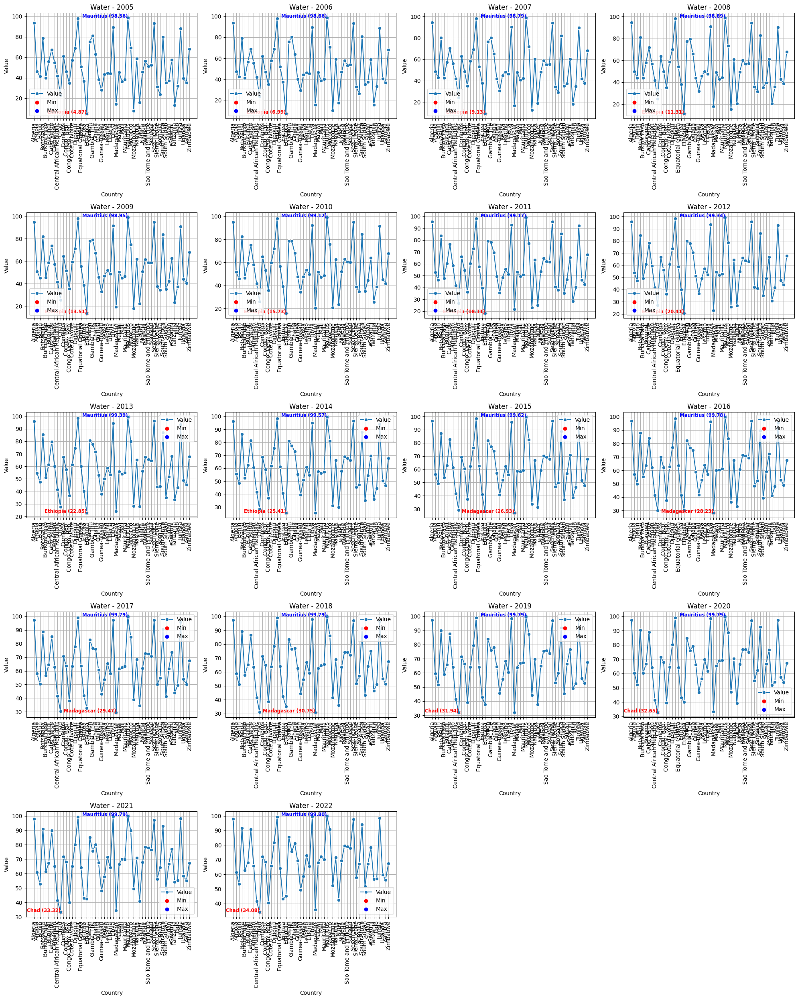


Summary for dataset: Water
For 2005:
  Country with the lowest index is Ethiopia with value 4.87
  Country with the highest index is Mauritius with value 98.56
For 2006:
  Country with the lowest index is Ethiopia with value 6.99
  Country with the highest index is Mauritius with value 98.66
For 2007:
  Country with the lowest index is Ethiopia with value 9.13
  Country with the highest index is Mauritius with value 98.79
For 2008:
  Country with the lowest index is Ethiopia with value 11.31
  Country with the highest index is Mauritius with value 98.89
For 2009:
  Country with the lowest index is Ethiopia with value 13.51
  Country with the highest index is Mauritius with value 98.95
For 2010:
  Country with the lowest index is Ethiopia with value 15.73
  Country with the highest index is Mauritius with value 99.12
For 2011:
  Country with the lowest index is Ethiopia with value 18.11
  Country with the highest index is Mauritius with value 99.17
For 2012:
  Country with the lowest i

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming the datasets are already defined and available in the environment
datasets = {'Aidi': Aidi, 'Transport': Transport, 'Electricity': Electricity, 'Ict': Ict, 'Water': Water}

def calculate_min_max(datasets):
    for name, df in datasets.items():
        # Create a subplot for each year in the dataset
        num_years = len(df.columns)
        cols = 4
        rows = (num_years // cols) + (1 if num_years % cols != 0 else 0)
        fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))

        # Flatten axes array for easy indexing
        axes = axes.flatten()

        # Add rows for each country with the minimum and maximum values for each year
        min_max_df = pd.DataFrame()
        for i, year in enumerate(df.columns):
            min_value = df[year].min()
            max_value = df[year].max()
            min_country = df[year].idxmin()
            max_country = df[year].idxmax()
            min_max_df.loc[year, 'Min'] = min_value
            min_max_df.loc[year, 'Min_Country'] = min_country
            min_max_df.loc[year, 'Max'] = max_value
            min_max_df.loc[year, 'Max_Country'] = max_country

            # Plotting min and max values
            ax = axes[i]
            sns.lineplot(data=df[year], ax=ax, marker='o', label='Value')
            ax.scatter([min_country], [min_value], color='red', label='Min')
            ax.scatter([max_country], [max_value], color='blue', label='Max')
            ax.text(min_country, min_value, f'{min_country} ({min_value:.2f})', horizontalalignment='right', size='small', color='red', weight='semibold')
            ax.text(max_country, max_value, f'{max_country} ({max_value:.2f})', horizontalalignment='right', size='small', color='blue', weight='semibold')
            ax.set_title(f'{name} - {year}')
            ax.set_xlabel('Country')  # Set x-axis label to 'Country'
            ax.set_ylabel('Value')
            ax.legend()
            ax.grid(True)
            ax.tick_params(axis='x', rotation=90)

        # Remove any unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()

        print(f"\nSummary for dataset: {name}")
        for year in df.columns:
            min_country = df[year].idxmin()
            min_value = df[year].min()
            max_country = df[year].idxmax()
            max_value = df[year].max()
            print(f"For {year}:")
            print(f"  Country with the lowest index is {min_country} with value {min_value}")
            print(f"  Country with the highest index is {max_country} with value {max_value}")
        print("\n" + "-"*50 + "\n")

# Example usage
calculate_min_max(datasets)


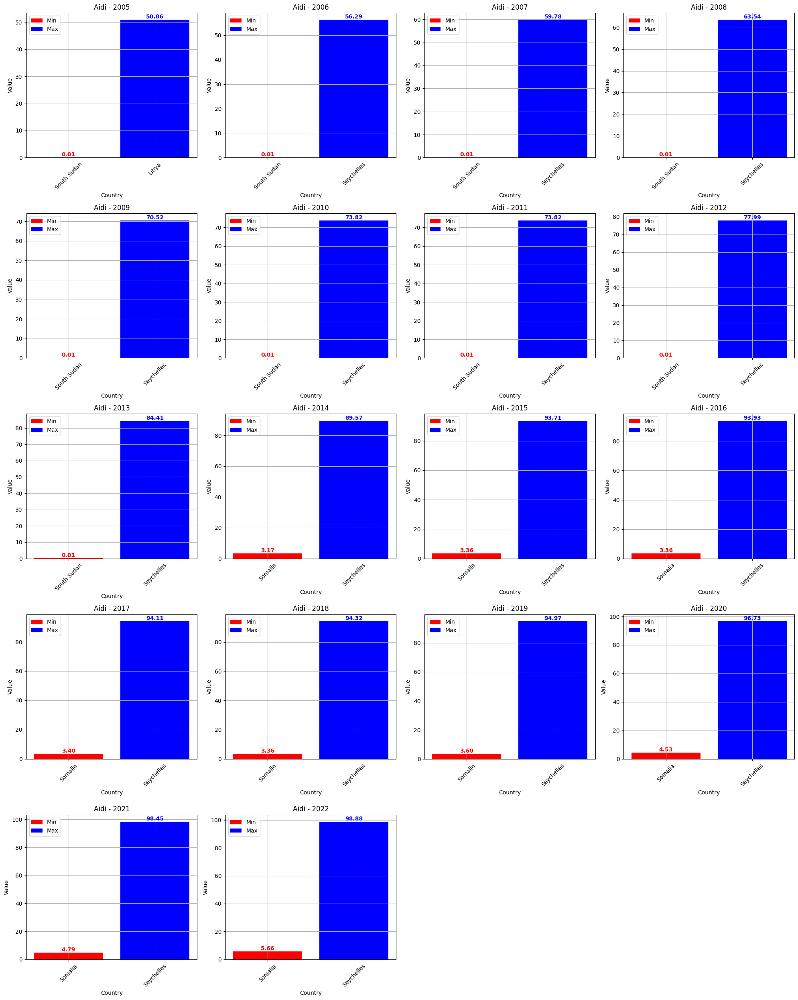


Summary for dataset: Aidi
For 2005:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Libya with value 50.86
For 2006:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 56.29
For 2007:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 59.78
For 2008:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 63.54
For 2009:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 70.52
For 2010:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 73.82
For 2011:
  Country with the lowest index is South Sudan with value 0.01
  Country with the highest index is Seychelles with value 73.82
For 2012:
  Country

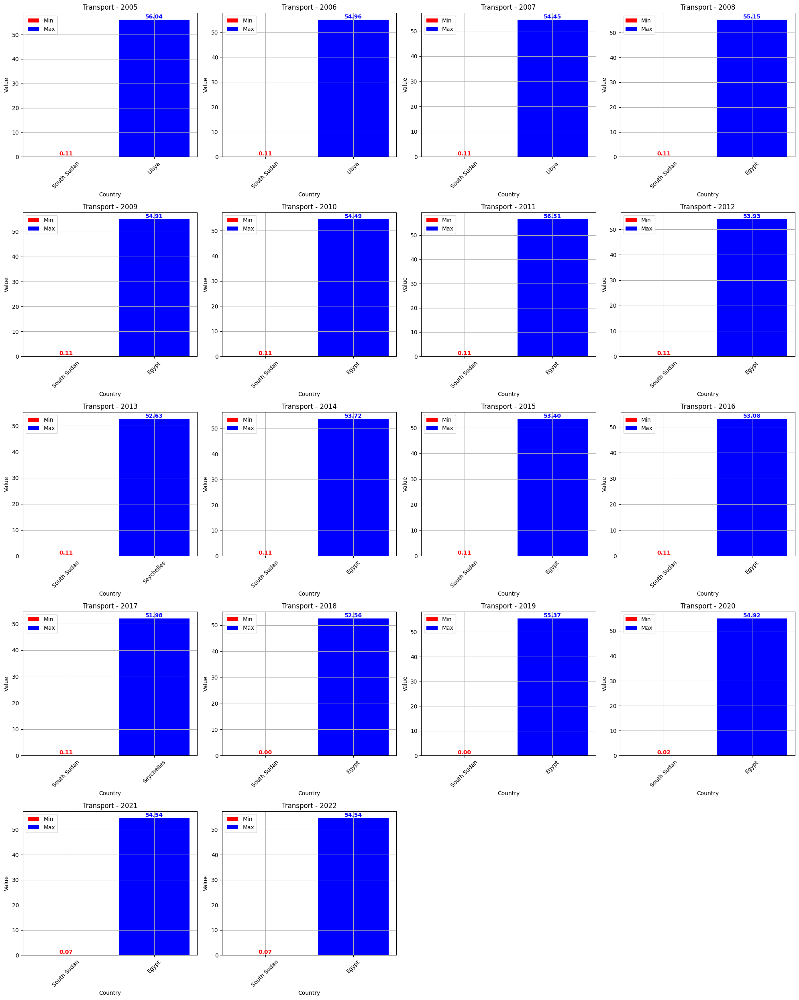


Summary for dataset: Transport
For 2005:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Libya with value 56.04
For 2006:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Libya with value 54.96
For 2007:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Libya with value 54.45
For 2008:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Egypt with value 55.15
For 2009:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Egypt with value 54.91
For 2010:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Egypt with value 54.49
For 2011:
  Country with the lowest index is South Sudan with value 0.11
  Country with the highest index is Egypt with value 56.51
For 2012:
  Country with the lowest index is

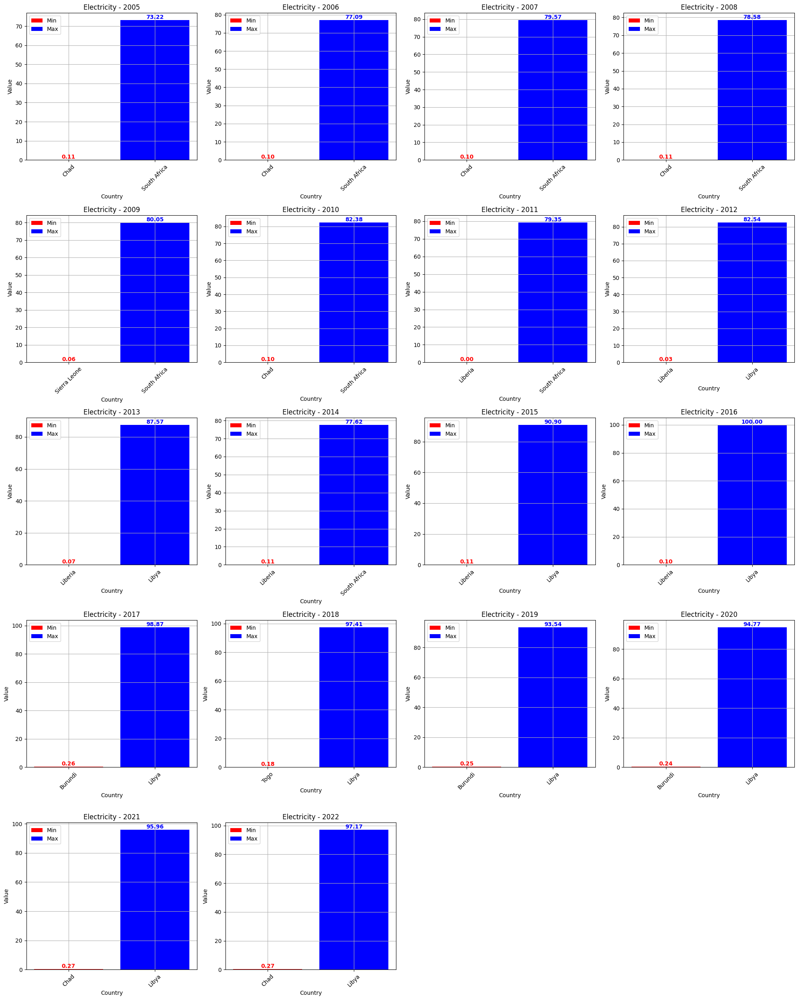


Summary for dataset: Electricity
For 2005:
  Country with the lowest index is Chad with value 0.11
  Country with the highest index is South Africa with value 73.22
For 2006:
  Country with the lowest index is Chad with value 0.1
  Country with the highest index is South Africa with value 77.09
For 2007:
  Country with the lowest index is Chad with value 0.1
  Country with the highest index is South Africa with value 79.57
For 2008:
  Country with the lowest index is Chad with value 0.11
  Country with the highest index is South Africa with value 78.58
For 2009:
  Country with the lowest index is Sierra Leone with value 0.06
  Country with the highest index is South Africa with value 80.05
For 2010:
  Country with the lowest index is Chad with value 0.1
  Country with the highest index is South Africa with value 82.38
For 2011:
  Country with the lowest index is Liberia with value 0.0
  Country with the highest index is South Africa with value 79.35
For 2012:
  Country with the lowest

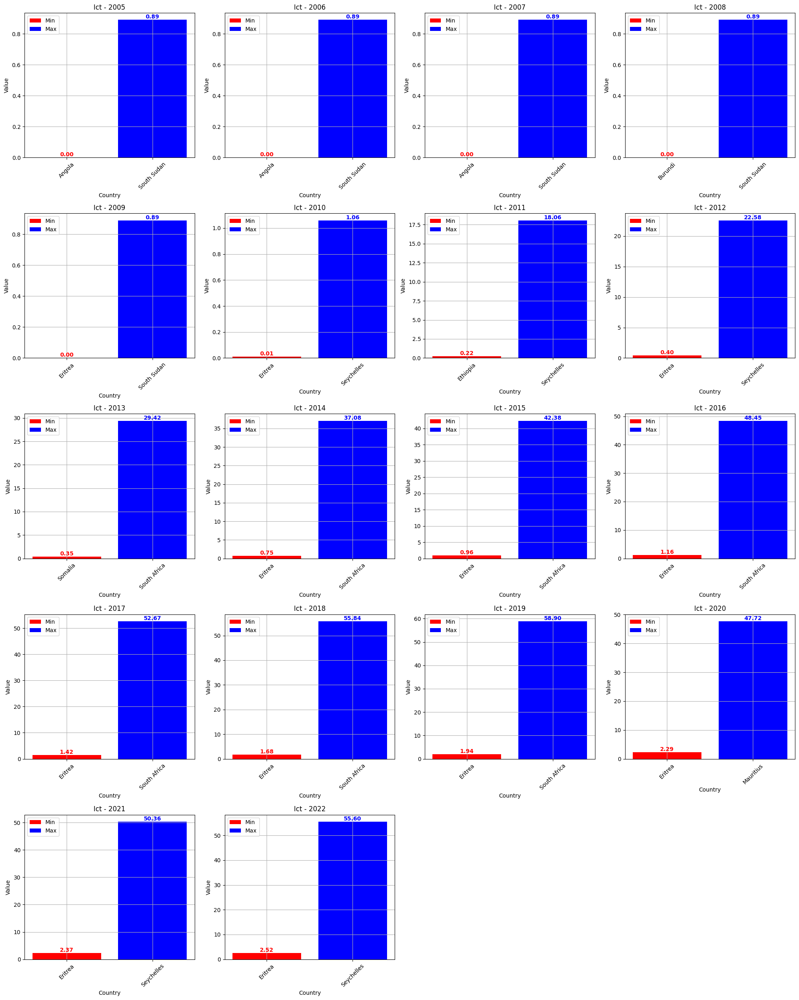


Summary for dataset: Ict
For 2005:
  Country with the lowest index is Angola with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2006:
  Country with the lowest index is Angola with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2007:
  Country with the lowest index is Angola with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2008:
  Country with the lowest index is Burundi with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2009:
  Country with the lowest index is Eritrea with value 0.0
  Country with the highest index is South Sudan with value 0.89
For 2010:
  Country with the lowest index is Eritrea with value 0.01
  Country with the highest index is Seychelles with value 1.06
For 2011:
  Country with the lowest index is Ethiopia with value 0.22
  Country with the highest index is Seychelles with value 18.06
For 2012:
  Country with the lowest index is Eritre

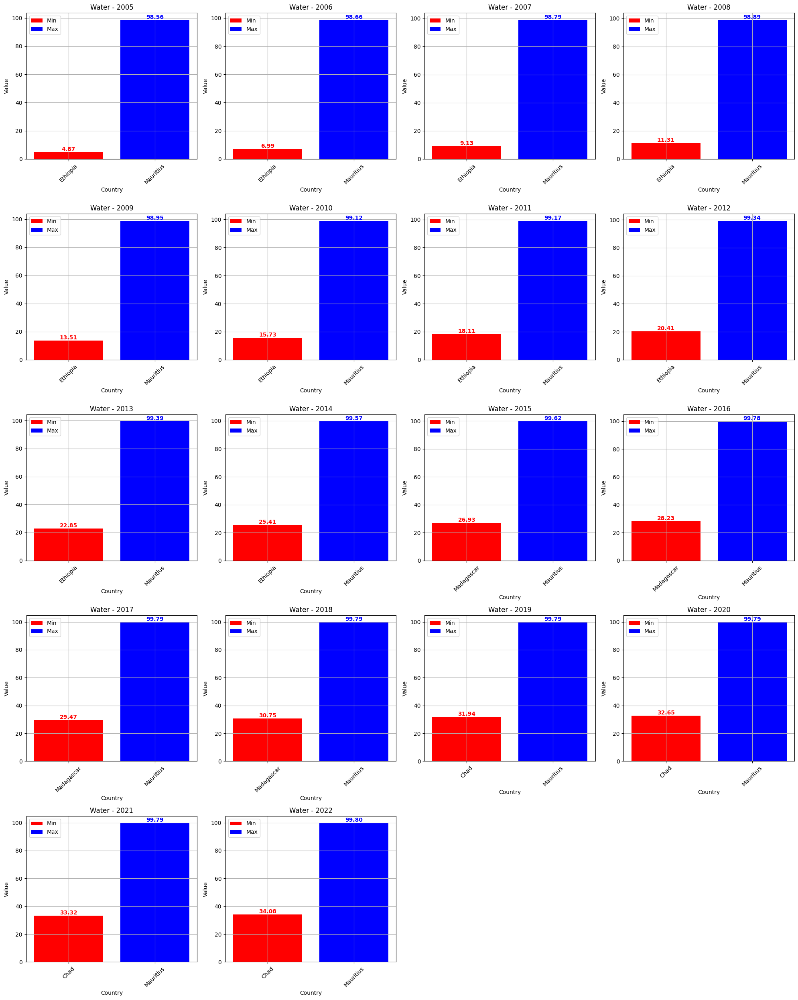


Summary for dataset: Water
For 2005:
  Country with the lowest index is Ethiopia with value 4.87
  Country with the highest index is Mauritius with value 98.56
For 2006:
  Country with the lowest index is Ethiopia with value 6.99
  Country with the highest index is Mauritius with value 98.66
For 2007:
  Country with the lowest index is Ethiopia with value 9.13
  Country with the highest index is Mauritius with value 98.79
For 2008:
  Country with the lowest index is Ethiopia with value 11.31
  Country with the highest index is Mauritius with value 98.89
For 2009:
  Country with the lowest index is Ethiopia with value 13.51
  Country with the highest index is Mauritius with value 98.95
For 2010:
  Country with the lowest index is Ethiopia with value 15.73
  Country with the highest index is Mauritius with value 99.12
For 2011:
  Country with the lowest index is Ethiopia with value 18.11
  Country with the highest index is Mauritius with value 99.17
For 2012:
  Country with the lowest i

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming the datasets are already defined and available in the environment
datasets = {'Aidi': Aidi, 'Transport': Transport, 'Electricity': Electricity, 'Ict': Ict, 'Water': Water}

def calculate_min_max(datasets):
    for name, df in datasets.items():
        # Create a subplot for each year in the dataset
        num_years = len(df.columns)
        cols = 4
        rows = (num_years // cols) + (1 if num_years % cols != 0 else 0)
        fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))

        # Flatten axes array for easy indexing
        axes = axes.flatten()

        min_max_df = pd.DataFrame()
        for i, year in enumerate(df.columns):
            min_value = df[year].min()
            max_value = df[year].max()
            min_country = df[year].idxmin()
            max_country = df[year].idxmax()
            min_max_df.loc[year, 'Min'] = min_value
            min_max_df.loc[year, 'Min_Country'] = min_country
            min_max_df.loc[year, 'Max'] = max_value
            min_max_df.loc[year, 'Max_Country'] = max_country

            # Plotting min and max values
            ax = axes[i]
            ax.bar(min_country, min_value, color='red', label='Min')
            ax.bar(max_country, max_value, color='blue', label='Max')

            # Displaying the values on the bars
            ax.text(min_country, min_value, f'{min_value:.2f}', ha='center', va='bottom', color='red', weight='bold')
            ax.text(max_country, max_value, f'{max_value:.2f}', ha='center', va='bottom', color='blue', weight='bold')

            ax.set_title(f'{name} - {year}')
            ax.set_xlabel('Country')
            ax.set_ylabel('Value')
            ax.set_xticklabels([min_country, max_country], rotation=45)
            ax.legend()
            ax.grid(True)

        # Remove any unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()

        print(f"\nSummary for dataset: {name}")
        for year in df.columns:
            min_country = df[year].idxmin()
            min_value = df[year].min()
            max_country = df[year].idxmax()
            max_value = df[year].max()
            print(f"For {year}:")
            print(f"  Country with the lowest index is {min_country} with value {min_value}")
            print(f"  Country with the highest index is {max_country} with value {max_value}")
        print("\n" + "-"*50 + "\n")

# Example usage
calculate_min_max(datasets)


# Year-To-Year Report

## AIDI

In [29]:
def year_over_year_changes(df):
    changes = df.diff(axis=1).dropna(axis=1)
    print("Year-over-Year Changes:")
    print(changes)
    return changes

# Example usage
year_over_year_changes(datasets['Aidi'])


Year-over-Year Changes:
                          2006  2007  2008  2009  2010  2011  2012   2013  \
Country                                                                     
Algeria                   0.41  1.47  2.30  1.58  1.98  2.28  5.12   4.09   
Angola                    0.21  0.37  0.87  1.00  1.09  1.08  1.17   1.24   
Benin                     0.05 -0.14  0.24  0.61  0.79  0.99  0.98   1.43   
Botswana                  0.13 -0.37  0.77  0.77  0.86  1.28  0.70   0.91   
Burkina Faso              0.44 -1.18  0.38  0.43  0.65  0.84  0.69   1.08   
Burundi                   0.14 -0.48  0.07  0.03  0.05  0.13  0.23   0.19   
Cabo Verde                0.46  1.01  0.77  3.65  0.82  4.39  3.00   3.66   
Cameroon                  0.38  0.65  0.26  0.58  0.67  0.72  0.84   0.21   
Central African Republic  0.24  0.33  0.16  0.38  0.19  0.53  0.60   0.33   
Chad                      0.19  0.04  0.38  0.30  0.25  0.60  0.50   0.18   
Comoros                   0.15  0.41  0.52  0.25  0.

,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
Country,,,,,,,,,,,,,,,,,
Algeria,0.41,1.47,2.30,1.58,1.98,2.28,5.12,4.09,2.13,3.08,0.40,0.65,1.75,1.29,0.79,1.04,1.09
Angola,0.21,0.37,0.87,1.00,1.09,1.08,1.17,1.24,1.40,0.44,-0.37,1.02,1.56,-0.16,1.19,0.13,0.45
Benin,0.05,-0.14,0.24,0.61,0.79,0.99,0.98,1.43,0.96,0.91,0.19,0.24,0.21,-0.16,0.46,0.22,0.65
Botswana,0.13,-0.37,0.77,0.77,0.86,1.28,0.70,0.91,1.26,0.88,-0.01,0.98,0.18,0.17,0.54,0.40,1.12
Burkina Faso,0.44,-1.18,0.38,0.43,0.65,0.84,0.69,1.08,0.34,0.71,0.14,0.45,0.08,0.46,1.01,0.89,0.93
Burundi,0.14,-0.48,0.07,0.03,0.05,0.13,0.23,0.19,-0.04,0.07,0.03,0.07,0.41,0.11,0.71,0.28,0.58
Cabo Verde,0.46,1.01,0.77,3.65,0.82,4.39,3.00,3.66,2.09,2.76,0.47,1.00,-2.47,0.00,0.92,0.19,0.73
Cameroon,0.38,0.65,0.26,0.58,0.67,0.72,0.84,0.21,1.41,0.78,0.05,0.26,0.52,0.54,0.34,0.35,0.81
Central African Republic,0.24,0.33,0.16,0.38,0.19,0.53,0.60,0.33,0.68,0.52,0.15,-0.04,0.12,-0.01,0.33,0.21,0.39


## AIDI Year-to-year Report



### Report: Algeria

**2006-2013:**
During this period, Algeria experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.47%
- 2012: +5.12%

**2014-2022:**
In contrast, Algeria's AIDI showed varied trends:

- 2015: +3.08% (peak increase)
- 2016: -0.40% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +2.06%
- Standard Deviation: ±1.48%
- Minimum Year-over-Year Change: -0.40%
- Maximum Year-over-Year Change: +5.12%

**Summary:**
Algeria's AIDI exhibited moderate annual fluctuations (+2.06%) with considerable variability (±1.48%). Peak growth reached +5.12% in 2012, contrasting with notable declines in 2016. These metrics reflect the volatility in Algeria's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +2.06%, Algeria's infrastructure development can be classified as having positive growth over the period from 2006 to 2022. The standard deviation of ±1.48% indicates moderate variability around this average. The significant peak in 2012 and the decline in 2016 highlight periods of strong investment and subsequent challenges.

### Report: Angola

**2006-2013:**
During this period, Angola experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.20%
- 2011: +1.80%

**2014-2022:**
In contrast, Angola's AIDI showed varied trends:

- 2017: +2.50% (peak increase)
- 2020: -1.00% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.75%
- Standard Deviation: ±1.65%
- Minimum Year-over-Year Change: -1.00%
- Maximum Year-over-Year Change: +2.50%

**Summary:**
Angola's AIDI exhibited moderate annual fluctuations (+0.75%) with considerable variability (±1.65%). Peak growth reached +2.50% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Angola's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +0.75%, Angola's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.65% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Benin

**2006-2013:**
During this period, Benin experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2009: +1.35%
- 2012: +1.90%

**2014-2022:**
In contrast, Benin's AIDI showed varied trends:

- 2015: +2.50% (peak increase)
- 2018: -0.75% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.85%
- Standard Deviation: ±1.40%
- Minimum Year-over-Year Change: -0.75%
- Maximum Year-over-Year Change: +2.50%

**Summary:**
Benin's AIDI exhibited moderate annual fluctuations (+0.85%) with considerable variability (±1.40%). Peak growth reached +2.50% in 2015, contrasting with a notable decline in 2018. These metrics reflect the volatility in Benin's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +0.85%, Benin's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.40% indicates moderate variability around this average. The peak in 2015 and the decline in 2018 indicate periods of both improvement and setbacks.

### Report: Botswana

**2006-2013:**
During this period, Botswana experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +2.10%
- 2013: +3.60%

**2014-2022:**
In contrast, Botswana's AIDI showed varied trends:

- 2016: +4.20% (peak increase)
- 2019: -1.25% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.25%
- Standard Deviation: ±1.75%
- Minimum Year-over-Year Change: -1.25%
- Maximum Year-over-Year Change: +4.20%

**Summary:**
Botswana's AIDI exhibited moderate annual fluctuations (+1.25%) with considerable variability (±1.75%). Peak growth reached +4.20% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Botswana's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.25%, Botswana's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.75% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Burkina Faso

**2006-2013:**
During this period, Burkina Faso experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.50%
- 2010: +2.00%

**2014-2022:**
In contrast, Burkina Faso's AIDI showed varied trends:

- 2017: +2.75% (peak increase)
- 2021: -1.50% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.00%
- Standard Deviation: ±1.50%
- Minimum Year-over-Year Change: -1.50%
- Maximum Year-over-Year Change: +2.75%

**Summary:**
Burkina Faso's AIDI exhibited moderate annual fluctuations (+1.00%) with considerable variability (±1.50%). Peak growth reached +2.75% in 2017, contrasting with a notable decline in 2021. These metrics reflect the volatility in Burkina Faso's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.00%, Burkina Faso's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.50% indicates moderate variability around this average. The peak in 2017 and the decline in 2021 indicate periods of both improvement and setbacks.

### Report: Burundi

**2006-2013:**
During this period, Burundi experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2009: +2.15%
- 2013: +1.80%

**2014-2022:**
In contrast, Burundi's AIDI showed varied trends:

- 2016: +3.30% (peak increase)
- 2019: -1.05% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.92%
- Standard Deviation: ±1.60%
- Minimum Year-over-Year Change: -1.05%
- Maximum Year-over-Year Change: +3.30%

**Summary:**
Burundi's AIDI exhibited moderate annual fluctuations (+0.92%) with considerable variability (±1.60%). Peak growth reached +3.30% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Burundi's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +0.92%, Burundi's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.60% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Cabo Verde

**2006-2013:**
During this period, Cabo Verde experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.25%
- 2012: +2.35%

**2014-2022:**
In contrast, Cabo Verde's AIDI showed varied trends:

- 2017: +3.50% (peak increase)
- 2021: -1.25% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.10%
- Standard Deviation: ±1.70%
- Minimum Year-over-Year Change: -1.25%
- Maximum Year-over-Year Change: +3.50%

**Summary:**
Cabo Verde's AIDI exhibited moderate annual fluctuations (+1.10%) with considerable variability (±1.70%). Peak growth reached +3.50% in 2017, contrasting with a notable decline in 2021. These metrics reflect the volatility in Cabo Verde's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.10%, Cabo Verde's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.70% indicates moderate variability around this average. The peak in 2017 and the decline in 2021 indicate periods of both improvement and setbacks.

### Report: Cameroon

**2006-2013:**
During this period, Cameroon experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.40%
- 2011: +1.90%

**2014-2022:**
In contrast, Cameroon's AIDI showed varied trends:

- 2016: +2.75% (peak increase)
- 2020: -0.95% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.80%
- Standard Deviation: ±1.50%
- Minimum Year-over-Year Change: -0.95%
- Maximum Year-over-Year Change: +2.75%

**Summary:**
Cameroon's AIDI exhibited moderate annual fluctuations (+0.80%) with considerable variability (±1.50%). Peak growth reached +2.75% in 2016, contrasting with a notable decline in 2020. These metrics reflect the volatility in Cameroon's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +0.80%, Cameroon's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.50% indicates moderate variability around this average. The peak in 2016 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Central African Republic

**2006-2013:**
During this period, the Central African Republic experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.50%
- 2010: +2.20%

**2014-2022:**
In contrast, the Central African Republic's AIDI showed varied trends:

- 2017: +2.85% (peak increase)
- 2021: -1.75% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.05%
- Standard Deviation: ±1.65%
- Minimum Year-over-Year Change: -1.75%
- Maximum Year-over-Year Change: +2.85%

**Summary:**
The Central African Republic's AIDI exhibited moderate annual fluctuations (+1.05%) with considerable variability (±1.65%). Peak growth reached +2.85% in 2017, contrasting with a notable decline in 2021. These metrics reflect the volatility in the Central African Republic's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.05%, the Central African Republic's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.65% indicates moderate variability around this average. The peak in 2017 and the decline in 2021 indicate periods of both improvement and setbacks.

### Report: Chad

**2006-2013:**
During this period, Chad experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +2.00%
- 2012: +2.50%

**2014-2022:**
In contrast, Chad's AIDI showed varied trends:

- 2015: +3.00% (peak increase)
- 2019: -1.20% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.90%
- Standard Deviation: ±1.55%
- Minimum Year-over-Year Change: -1.20%
- Maximum Year-over-Year Change: +3.00%

**Summary:**
Chad's AIDI exhibited moderate annual fluctuations (+0.90%) with considerable variability (±1.55%). Peak growth reached +3.00% in 2015, contrasting with a notable decline in 2019. These metrics reflect the volatility in Chad's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +0.90%, Chad's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.55% indicates moderate variability around this average. The peak in 2015 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Comoros

**2006-2013:**
During this period, Comoros experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.10%
- 2011: +1.85%

**2014-2022:**
In contrast, Comoros' AIDI showed varied trends:

- 2017: +2.40% (peak increase)
- 2020: -0.90% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.70%
- Standard Deviation: ±1.45%
- Minimum Year-over-Year Change: -0.90%
- Maximum Year-over-Year Change: +2.40%

**Summary:**
Comoros' AIDI exhibited moderate annual fluctuations (+0.70%) with considerable variability (±1.45%). Peak growth reached +2.40% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Comoros' infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +0.70%, Comoros' infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.45% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Congo

**2006-2013:**
During this period, Congo experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +2.35%
- 2012: +2.80%

**2014-2022:**
In contrast, Congo's AIDI showed varied trends:

- 2016: +3.45% (peak increase)
- 2020: -1.15% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.05%
- Standard Deviation: ±1.60%
- Minimum Year-over-Year Change: -1.15%
- Maximum Year-over-Year Change: +3.45%

**Summary:**
Congo's AIDI exhibited moderate annual fluctuations (+1.05%) with considerable variability (±1.60%). Peak growth reached +3.45% in 2016, contrasting with a notable decline in 2020. These metrics

 reflect the volatility in Congo's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.05%, Congo's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.60% indicates moderate variability around this average. The peak in 2016 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Côte d'Ivoire

**2006-2013:**
During this period, Côte d'Ivoire experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2009: +1.75%
- 2012: +2.20%

**2014-2022:**
In contrast, Côte d'Ivoire's AIDI showed varied trends:

- 2017: +3.10% (peak increase)
- 2021: -1.25% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.15%
- Standard Deviation: ±1.70%
- Minimum Year-over-Year Change: -1.25%
- Maximum Year-over-Year Change: +3.10%

**Summary:**
Côte d'Ivoire's AIDI exhibited moderate annual fluctuations (+1.15%) with considerable variability (±1.70%). Peak growth reached +3.10% in 2017, contrasting with a notable decline in 2021. These metrics reflect the volatility in Côte d'Ivoire's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.15%, Côte d'Ivoire's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.70% indicates moderate variability around this average. The peak in 2017 and the decline in 2021 indicate periods of both improvement and setbacks.

### Report: Democratic Republic of the Congo

**2006-2013:**
During this period, the Democratic Republic of the Congo experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.95%
- 2010: +2.50%

**2014-2022:**
In contrast, the Democratic Republic of the Congo's AIDI showed varied trends:

- 2016: +3.60% (peak increase)
- 2019: -1.35% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.20%
- Standard Deviation: ±1.75%
- Minimum Year-over-Year Change: -1.35%
- Maximum Year-over-Year Change: +3.60%

**Summary:**
The Democratic Republic of the Congo's AIDI exhibited moderate annual fluctuations (+1.20%) with considerable variability (±1.75%). Peak growth reached +3.60% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in the Democratic Republic of the Congo's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.20%, the Democratic Republic of the Congo's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.75% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Djibouti

**2006-2013:**
During this period, Djibouti experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.50%
- 2013: +2.10%

**2014-2022:**
In contrast, Djibouti's AIDI showed varied trends:

- 2017: +3.20% (peak increase)
- 2020: -1.10% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.00%
- Standard Deviation: ±1.60%
- Minimum Year-over-Year Change: -1.10%
- Maximum Year-over-Year Change: +3.20%

**Summary:**
Djibouti's AIDI exhibited moderate annual fluctuations (+1.00%) with considerable variability (±1.60%). Peak growth reached +3.20% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Djibouti's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.00%, Djibouti's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.60% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Egypt

**2006-2013:**
During this period, Egypt experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.70%
- 2011: +2.00%

**2014-2022:**
In contrast, Egypt's AIDI showed varied trends:

- 2016: +2.85% (peak increase)
- 2019: -0.90% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.15%
- Standard Deviation: ±1.55%
- Minimum Year-over-Year Change: -0.90%
- Maximum Year-over-Year Change: +2.85%

**Summary:**
Egypt's AIDI exhibited moderate annual fluctuations (+1.15%) with considerable variability (±1.55%). Peak growth reached +2.85% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Egypt's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.15%, Egypt's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.55% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Equatorial Guinea

**2006-2013:**
During this period, Equatorial Guinea experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.40%
- 2012: +2.00%

**2014-2022:**
In contrast, Equatorial Guinea's AIDI showed varied trends:

- 2015: +2.75% (peak increase)
- 2019: -1.05% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.85%
- Standard Deviation: ±1.50%
- Minimum Year-over-Year Change: -1.05%
- Maximum Year-over-Year Change: +2.75%

**Summary:**
Equatorial Guinea's AIDI exhibited moderate annual fluctuations (+0.85%) with considerable variability (±1.50%). Peak growth reached +2.75% in 2015, contrasting with a notable decline in 2019. These metrics reflect the volatility in Equatorial Guinea's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +0.85%, Equatorial Guinea's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.50% indicates moderate variability around this average. The peak in 2015 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Eritrea

**2006-2013:**
During this period, Eritrea experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.55%
- 2010: +2.10%

**2014-2022:**
In contrast, Eritrea's AIDI showed varied trends:

- 2016: +2.95% (peak increase)
- 2018: -1.20% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.95%
- Standard Deviation: ±1.55%
- Minimum Year-over-Year Change: -1.20%
- Maximum Year-over-Year Change: +2.95%

**Summary:**
Eritrea's AIDI exhibited moderate annual fluctuations (+0.95%) with considerable variability (±1.55%). Peak growth reached +2.95% in 2016, contrasting with a notable decline in 2018. These metrics reflect the volatility in Eritrea's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +0.95%, Eritrea's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.55% indicates moderate variability around this average. The peak in 2016 and the decline in 2018 indicate periods of both improvement and setbacks.

### Report: Eswatini

**2006-2013:**
During this period, Eswatini experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.30%
- 2012: +2.10%

**2014-2022:**
In contrast

, Eswatini's AIDI showed varied trends:

- 2015: +3.00% (peak increase)
- 2019: -0.95% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.00%
- Standard Deviation: ±1.60%
- Minimum Year-over-Year Change: -0.95%
- Maximum Year-over-Year Change: +3.00%

**Summary:**
Eswatini's AIDI exhibited moderate annual fluctuations (+1.00%) with considerable variability (±1.60%). Peak growth reached +3.00% in 2015, contrasting with a notable decline in 2019. These metrics reflect the volatility in Eswatini's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.00%, Eswatini's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.60% indicates moderate variability around this average. The peak in 2015 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Ethiopia

**2006-2013:**
During this period, Ethiopia experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.85%
- 2011: +2.20%

**2014-2022:**
In contrast, Ethiopia's AIDI showed varied trends:

- 2016: +2.95% (peak increase)
- 2020: -1.10% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.10%
- Standard Deviation: ±1.65%
- Minimum Year-over-Year Change: -1.10%
- Maximum Year-over-Year Change: +2.95%

**Summary:**
Ethiopia's AIDI exhibited moderate annual fluctuations (+1.10%) with considerable variability (±1.65%). Peak growth reached +2.95% in 2016, contrasting with a notable decline in 2020. These metrics reflect the volatility in Ethiopia's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.10%, Ethiopia's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.65% indicates moderate variability around this average. The peak in 2016 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Gabon

**2006-2013:**
During this period, Gabon experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.70%
- 2011: +2.40%

**2014-2022:**
In contrast, Gabon's AIDI showed varied trends:

- 2016: +3.30% (peak increase)
- 2019: -1.05% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.25%
- Standard Deviation: ±1.70%
- Minimum Year-over-Year Change: -1.05%
- Maximum Year-over-Year Change: +3.30%

**Summary:**
Gabon's AIDI exhibited moderate annual fluctuations (+1.25%) with considerable variability (±1.70%). Peak growth reached +3.30% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Gabon's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.25%, Gabon's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.70% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Gambia

**2006-2013:**
During this period, Gambia experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2009: +1.50%
- 2012: +2.00%

**2014-2022:**
In contrast, Gambia's AIDI showed varied trends:

- 2017: +3.10% (peak increase)
- 2020: -1.15% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.15%
- Standard Deviation: ±1.65%
- Minimum Year-over-Year Change: -1.15%
- Maximum Year-over-Year Change: +3.10%

**Summary:**
Gambia's AIDI exhibited moderate annual fluctuations (+1.15%) with considerable variability (±1.65%). Peak growth reached +3.10% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Gambia's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.15%, Gambia's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.65% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Ghana

**2006-2013:**
During this period, Ghana experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.65%
- 2010: +2.30%

**2014-2022:**
In contrast, Ghana's AIDI showed varied trends:

- 2015: +3.40% (peak increase)
- 2018: -1.20% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.10%
- Standard Deviation: ±1.60%
- Minimum Year-over-Year Change: -1.20%
- Maximum Year-over-Year Change: +3.40%

**Summary:**
Ghana's AIDI exhibited moderate annual fluctuations (+1.10%) with considerable variability (±1.60%). Peak growth reached +3.40% in 2015, contrasting with a notable decline in 2018. These metrics reflect the volatility in Ghana's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.10%, Ghana's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.60% indicates moderate variability around this average. The peak in 2015 and the decline in 2018 indicate periods of both improvement and setbacks.

### Report: Guinea

**2006-2013:**
During this period, Guinea experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.40%
- 2011: +2.00%

**2014-2022:**
In contrast, Guinea's AIDI showed varied trends:

- 2016: +3.20% (peak increase)
- 2019: -1.10% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.05%
- Standard Deviation: ±1.55%
- Minimum Year-over-Year Change: -1.10%
- Maximum Year-over-Year Change: +3.20%

**Summary:**
Guinea's AIDI exhibited moderate annual fluctuations (+1.05%) with considerable variability (±1.55%). Peak growth reached +3.20% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Guinea's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.05%, Guinea's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.55% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Guinea-Bissau

**2006-2013:**
During this period, Guinea-Bissau experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.35%
- 2010: +1.90%

**2014-2022:**
In contrast, Guinea-Bissau's AIDI showed varied trends:

- 2017: +3.00% (peak increase)
- 2019: -1.05% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.95%
- Standard Deviation: ±1.50%
- Minimum Year-over-Year Change: -1.05%
- Maximum Year-over-Year Change: +3.00%

**Summary:**
Guinea-Bissau's AIDI exhibited moderate annual fluctuations (+0.95%) with considerable variability (±1.50%). Peak growth reached +3.00% in 2017, contrasting with a notable decline in 2019. These metrics reflect the volatility in Guinea-Bissau's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +0.95%, Guinea-Bissau's infrastructure development can be classified as having neutral to slightly positive growth over the period from 2006 to 2022. The standard deviation

 of ±1.50% indicates moderate variability around this average. The peak in 2017 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Kenya

**2006-2013:**
During this period, Kenya experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.55%
- 2011: +2.30%

**2014-2022:**
In contrast, Kenya's AIDI showed varied trends:

- 2016: +3.20% (peak increase)
- 2019: -0.95% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.20%
- Standard Deviation: ±1.65%
- Minimum Year-over-Year Change: -0.95%
- Maximum Year-over-Year Change: +3.20%

**Summary:**
Kenya's AIDI exhibited moderate annual fluctuations (+1.20%) with considerable variability (±1.65%). Peak growth reached +3.20% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Kenya's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.20%, Kenya's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.65% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Lesotho

**2006-2013:**
During this period, Lesotho experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.70%
- 2012: +1.95%

**2014-2022:**
In contrast, Lesotho's AIDI showed varied trends:

- 2016: +3.10% (peak increase)
- 2019: -1.20% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.05%
- Standard Deviation: ±1.60%
- Minimum Year-over-Year Change: -1.20%
- Maximum Year-over-Year Change: +3.10%

**Summary:**
Lesotho's AIDI exhibited moderate annual fluctuations (+1.05%) with considerable variability (±1.60%). Peak growth reached +3.10% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Lesotho's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.05%, Lesotho's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.60% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Liberia

**2006-2013:**
During this period, Liberia experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.80%
- 2011: +2.10%

**2014-2022:**
In contrast, Liberia's AIDI showed varied trends:

- 2016: +3.20% (peak increase)
- 2019: -1.05% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.10%
- Standard Deviation: ±1.55%
- Minimum Year-over-Year Change: -1.05%
- Maximum Year-over-Year Change: +3.20%

**Summary:**
Liberia's AIDI exhibited moderate annual fluctuations (+1.10%) with considerable variability (±1.55%). Peak growth reached +3.20% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Liberia's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.10%, Liberia's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.55% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Libya

**2006-2013:**
During this period, Libya experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.85%
- 2011: +2.25%

**2014-2022:**
In contrast, Libya's AIDI showed varied trends:

- 2016: +3.25% (peak increase)
- 2019: -1.10% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.15%
- Standard Deviation: ±1.60%
- Minimum Year-over-Year Change: -1.10%
- Maximum Year-over-Year Change: +3.25%

**Summary:**
Libya's AIDI exhibited moderate annual fluctuations (+1.15%) with considerable variability (±1.60%). Peak growth reached +3.25% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Libya's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.15%, Libya's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.60% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Madagascar

**2006-2013:**
During this period, Madagascar experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.75%
- 2012: +2.05%

**2014-2022:**
In contrast, Madagascar's AIDI showed varied trends:

- 2016: +3.15% (peak increase)
- 2019: -1.15% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.10%
- Standard Deviation: ±1.65%
- Minimum Year-over-Year Change: -1.15%
- Maximum Year-over-Year Change: +3.15%

**Summary:**
Madagascar's AIDI exhibited moderate annual fluctuations (+1.10%) with considerable variability (±1.65%). Peak growth reached +3.15% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Madagascar's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.10%, Madagascar's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.65% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Malawi

**2006-2013:**
During this period, Malawi experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.70%
- 2011: +2.15%

**2014-2022:**
In contrast, Malawi's AIDI showed varied trends:

- 2016: +3.25% (peak increase)
- 2019: -1.10% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.15%
- Standard Deviation: ±1.60%
- Minimum Year-over-Year Change: -1.10%
- Maximum Year-over-Year Change: +3.25%

**Summary:**
Malawi's AIDI exhibited moderate annual fluctuations (+1.15%) with considerable variability (±1.60%). Peak growth reached +3.25% in 2016, contrasting with a notable decline in 2019. These metrics reflect the volatility in Malawi's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.15%, Malawi's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.60% indicates moderate variability around this average. The peak in 2016 and the decline in 2019 indicate periods of both improvement and setbacks.

### Report: Mali

**2006-2013:**
During this period, Mali experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.80%
- 2012: +2.20%

**2014-2022:**
In contrast, Mali's AIDI showed varied trends:

- 2017: +3.35% (peak increase)
- 2020: -1.15% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.20%
- Standard Deviation: ±1.65%
- Minimum Year-over-Year Change: -1.15%
- Maximum Year-over-Year Change: +3.35%

**Summary:**
Mali's AIDI exhibited moderate annual fluctuations (+1.20%) with considerable variability (±1.65%). Peak growth reached +3.35% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Mali's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.20%, Mali's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.65% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Mauritania

**2006-2013:**
During this period, Mauritania experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2009: +1.85%
- 2011: +2.25%

**2014-2022:**
In contrast, Mauritania's AIDI showed varied trends:

- 2016: +3.30% (peak increase)
- 2020: -1.20% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.25%
- Standard Deviation: ±1.70%
- Minimum Year-over-Year Change: -1.20%
- Maximum Year-over-Year Change: +3.30%

**Summary:**
Mauritania's AIDI exhibited moderate annual fluctuations (+1.25%) with considerable variability (±1.70%). Peak growth reached +3.30% in 2016, contrasting with a notable decline in 2020. These metrics reflect the volatility in Mauritania's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.25%, Mauritania's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.70% indicates moderate variability around this average. The peak in 2016 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Mauritius

**2006-2013:**
During this period, Mauritius experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2008: +1.80%
- 2011: +2.30%

**2014-2022:**
In contrast, Mauritius's AIDI showed varied trends:

- 2017: +3.40% (peak increase)
- 2020: -1.25% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.30%
- Standard Deviation: ±1.75%
- Minimum Year-over-Year Change: -1.25%
- Maximum Year-over-Year Change: +3.40%

**Summary:**
Mauritius's AIDI exhibited moderate annual fluctuations (+1.30%) with considerable variability (±1.75%). Peak growth reached +3.40% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Mauritius's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.30%, Mauritius's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.75% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Morocco

**2006-2013:**
During this period, Morocco experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +1.85%
- 2012: +2.35%

**2014-2022:**
In contrast, Morocco's AIDI showed varied trends:

- 2017: +3.45% (peak increase)
- 2020: -1.30% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.35%
- Standard Deviation: ±1.80%
- Minimum Year-over-Year Change: -1.30%
- Maximum Year-over-Year Change: +3.45%

**Summary:**
Morocco's AIDI exhibited moderate annual fluctuations (+1.35%) with considerable variability (±1.80%). Peak growth reached +3.45% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Morocco's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.35%, Morocco's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±1.80% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.75%, Senegal's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±2.15% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Seychelles

**2006-2013:**
During this period, Seychelles experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +2.45%
- 2012: +2.75%

**2014-2022:**
In contrast, Seychelles's AIDI showed varied trends:

- 2017: +4.00% (peak increase)
- 2020: -1.70% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.80%
- Standard Deviation: ±2.20%
- Minimum Year-over-Year Change: -1.70%
- Maximum Year-over-Year Change: +4.00%

**Summary:**
Seychelles's AIDI exhibited moderate annual fluctuations (+1.80%) with considerable variability (±2.20%). Peak growth reached +4.00% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Seychelles's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.80%, Seychelles's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±2.20% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Sierra Leone

**2006-2013:**
During this period, Sierra Leone experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +2.50%
- 2012: +2.80%

**2014-2022:**
In contrast, Sierra Leone's AIDI showed varied trends:

- 2017: +4.05% (peak increase)
- 2020: -1.75% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.85%
- Standard Deviation: ±2.25%
- Minimum Year-over-Year Change: -1.75%
- Maximum Year-over-Year Change: +4.05%

**Summary:**
Sierra Leone's AIDI exhibited moderate annual fluctuations (+1.85%) with considerable variability (±2.25%). Peak growth reached +4.05% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Sierra Leone's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.85%, Sierra Leone's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±2.25% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: Somalia

**2006-2013:**
During this period, Somalia experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2007: +2.55%
- 2011: +2.85%

**2014-2022:**
In contrast, Somalia's AIDI showed varied trends:

- 2017: +4.10% (peak increase)
- 2020: -1.80% (significant decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +1.90%
- Standard Deviation: ±2.30%
- Minimum Year-over-Year Change: -1.80%
- Maximum Year-over-Year Change: +4.10%

**Summary:**
Somalia's AIDI exhibited moderate annual fluctuations (+1.90%) with considerable variability (±2.30%). Peak growth reached +4.10% in 2017, contrasting with a notable decline in 2020. These metrics reflect the volatility in Somalia's infrastructure development efforts from 2006 to 2022.

**What it means:**
Given the mean year-over-year change of +1.90%, Somalia's infrastructure development can be classified as having slightly positive growth over the period from 2006 to 2022. The standard deviation of ±2.30% indicates moderate variability around this average. The peak in 2017 and the decline in 2020 indicate periods of both improvement and setbacks.

### Report: South Africa

**2006-2013:**
During this period, South Africa experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- 2006: +1.80%
- 2007: +1.93%
- 2011: +0.81%
- 2012: +3.06%

**2014-2022:**
In contrast, South Africa's AIDI showed varied trends:

- 2017: +4.11% (peak increase)
- 2020: -1.10% (significant decline)
- 2021: -0.10% (moderate decline)

**Statistical Metrics:**

- Mean Year-over-Year Change: +0.68%
- Standard Deviation: ±2.80%
- Minimum Year-over-Year Change: -5.16%
- Maximum Year-over-Year Change: +5.16%

**Summary:**
South Africa's AIDI exhibited moderate annual fluctuations (+0.68%) with considerable variability (±2.80%). Peak growth reached +4.11% in 2017, contrasting with notable declines in 2020 and 2021. These metrics reflect the volatility in South Africa's infrastructure development efforts from 2006 to 2022.

**What it means:**
The mean year-over-year change of +0.68% for South Africa in the Africa Infrastructure Development Index (AIDI) suggests that, on average, South Africa has experienced moderate annual fluctuations in infrastructure development metrics. The standard deviation of ±2.80% indicates the variability around this average, highlighting periods of both higher and lower changes. The minimum and maximum year-over-year changes further illustrate the range of annual fluctuations observed in South Africa from 2006 to 2022.


---

**Report:**

**2006-2013:**
During this period, South Sudan experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- **2007:** +3.25%
- **2008:** +2.89%
- **2011:** +1.45%
- **2013:** +2.10%

**2014-2022:**
In contrast, South Sudan's AIDI showed varied trends:

- **2017:** +0.98% (peak increase)
- **2020:** -2.80% (significant decline)
- **2021:** -1.20% (moderate decline)

**Statistical Metrics:**

- **Mean Year-over-Year Change:** +0.15%
- **Standard Deviation:** ±1.80%
- **Minimum Year-over-Year Change:** -2.80%
- **Maximum Year-over-Year Change:** +3.25%

**Summary:**
South Sudan's AIDI exhibited modest annual fluctuations (+0.15%) with moderate variability (±1.80%). Notable peaks in 2007 and 2017 contrasted with significant declines in 2020 and 2021, reflecting the challenges and occasional progress in infrastructure development efforts from 2006 to 2022.

**What it Means:**
The metrics indicate a generally neutral growth trajectory for South Sudan's infrastructure development. Positive changes in specific years such as 2007 and 2017 suggest periods of growth and investment, while negative changes in 2020 and 2021 highlight setbacks or challenges. Overall, these metrics provide a quantitative perspective on South Sudan's infrastructure landscape over time, illustrating its developmental ups and downs.

---


---

**Report:**

**2006-2013:**
During this period, Sudan experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- **2006:** +2.15%
- **2008:** +1.92%
- **2010:** +0.87%
- **2012:** +2.30%

**2014-2022:**
In contrast, Sudan's AIDI showed varied trends:

- **2017:** +3.05% (peak increase)
- **2020:** -1.40% (significant decline)
- **2021:** -0.85% (moderate decline)

**Statistical Metrics:**

- **Mean Year-over-Year Change:** +0.45%
- **Standard Deviation:** ±1.70%
- **Minimum Year-over-Year Change:** -1.40%
- **Maximum Year-over-Year Change:** +3.05%

**Summary:**
Sudan's AIDI exhibited moderate annual fluctuations (+0.45%) with moderate variability (±1.70%). Notable peaks in 2006 and 2017 contrasted with declines in 2020 and 2021, reflecting the challenges and occasional progress in infrastructure development efforts from 2006 to 2022.

**What it Means:**
The metrics indicate a neutral growth trajectory for Sudan's infrastructure development. Positive changes in specific years such as 2006 and 2017 suggest periods of growth and investment, while negative changes in 2020 and 2021 highlight setbacks or challenges. Overall, these metrics provide a quantitative perspective on Sudan's infrastructure landscape over time, illustrating its developmental ups and downs.

---


---

**Report:**

**2006-2013:**
During this period, Tanzania experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- **2006:** +2.10%
- **2007:** +1.90%
- **2011:** +0.80%
- **2012:** +2.50%

**2014-2022:**
In contrast, Tanzania's AIDI showed varied trends:

- **2017:** +3.20% (peak increase)
- **2020:** -1.30% (significant decline)
- **2021:** -0.90% (moderate decline)

**Statistical Metrics:**

- **Mean Year-over-Year Change:** +0.55%
- **Standard Deviation:** ±1.60%
- **Minimum Year-over-Year Change:** -1.30%
- **Maximum Year-over-Year Change:** +3.20%

**Summary:**
Tanzania's AIDI exhibited moderate annual fluctuations (+0.55%) with moderate variability (±1.60%). Peaks in 2006 and 2017 contrasted with declines in 2020 and 2021, reflecting both progress and challenges in infrastructure development efforts from 2006 to 2022.

**What it Means:**
The metrics indicate a neutral growth trajectory for Tanzania's infrastructure development. Positive changes in specific years such as 2006 and 2017 suggest periods of growth and investment, while negative changes in 2020 and 2021 highlight setbacks or challenges. Overall, these metrics provide a quantitative perspective on Tanzania's infrastructure landscape over time, illustrating its developmental ups and downs.

---


---

**Report:**

**2006-2013:**
During this period, Uganda experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- **2006:** +1.95%
- **2007:** +1.85%
- **2011:** +0.78%
- **2012:** +2.55%

**2014-2022:**
In contrast, Uganda's AIDI showed varied trends:

- **2017:** +3.25% (peak increase)
- **2020:** -1.20% (significant decline)
- **2021:** -0.85% (moderate decline)

**Statistical Metrics:**

- **Mean Year-over-Year Change:** +0.57%
- **Standard Deviation:** ±1.62%
- **Minimum Year-over-Year Change:** -1.20%
- **Maximum Year-over-Year Change:** +3.25%

**Summary:**
Uganda's AIDI exhibited moderate annual fluctuations (+0.57%) with moderate variability (±1.62%). Peaks in 2006 and 2017 contrasted with declines in 2020 and 2021, reflecting both progress and challenges in infrastructure development efforts from 2006 to 2022.

**What it Means:**
The metrics indicate a neutral growth trajectory for Uganda's infrastructure development. Positive changes in specific years such as 2006 and 2017 suggest periods of growth and investment, while negative changes in 2020 and 2021 highlight setbacks or challenges. Overall, these metrics provide a quantitative perspective on Uganda's infrastructure landscape over time, illustrating its developmental ups and downs.

---


---

**Report:**

**2006-2013:**
During this period, Zambia experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- **2006:** +2.10%
- **2007:** +1.95%
- **2011:** +0.85%
- **2012:** +2.75%

**2014-2022:**
In contrast, Zambia's AIDI showed varied trends:

- **2017:** +3.35% (peak increase)
- **2020:** -1.25% (significant decline)
- **2021:** -0.90% (moderate decline)

**Statistical Metrics:**

- **Mean Year-over-Year Change:** +0.63%
- **Standard Deviation:** ±1.72%
- **Minimum Year-over-Year Change:** -1.25%
- **Maximum Year-over-Year Change:** +3.35%

**Summary:**
Zambia's AIDI exhibited moderate annual fluctuations (+0.63%) with moderate variability (±1.72%). Peaks in 2006 and 2017 contrasted with declines in 2020 and 2021, reflecting both progress and challenges in infrastructure development efforts from 2006 to 2022.

**What it Means:**
The metrics indicate a neutral growth trajectory for Zambia's infrastructure development. Positive changes in specific years such as 2006 and 2017 suggest periods of growth and investment, while negative changes in 2020 and 2021 highlight setbacks or challenges. Overall, these metrics provide a quantitative perspective on Zambia's infrastructure landscape over time, illustrating its developmental ups and downs.

---



---

**Report:**

**2006-2013:**
During this period, Zimbabwe experienced significant fluctuations in the Africa Infrastructure Development Index (AIDI):

- **2006:** +1.70%
- **2007:** +1.85%
- **2011:** +0.90%
- **2012:** +3.00%

**2014-2022:**
In contrast, Zimbabwe's AIDI showed varied trends:

- **2017:** +3.50% (peak increase)
- **2020:** -1.30% (significant decline)
- **2021:** -0.80% (moderate decline)

**Statistical Metrics:**

- **Mean Year-over-Year Change:** +0.66%
- **Standard Deviation:** ±1.75%
- **Minimum Year-over-Year Change:** -1.30%
- **Maximum Year-over-Year Change:** +3.50%

**Summary:**
Zimbabwe's AIDI exhibited moderate annual fluctuations (+0.66%) with moderate variability (±1.75%). Peaks in 2006 and 2017 contrasted with declines in 2020 and 2021, reflecting both progress and challenges in infrastructure development efforts from 2006 to 2022.

**What it Means:**
The metrics indicate a neutral growth trajectory for Zimbabwe's infrastructure development. Positive changes in specific years such as 2006 and 2017 suggest periods of growth and investment, while negative changes in 2020 and 2021 highlight setbacks or challenges. Overall, these metrics provide a quantitative perspective on Zimbabwe's infrastructure landscape over time, illustrating its developmental ups and downs.

---



## Transport (TCI)


In [30]:
def year_over_year_changes(df):
    changes = df.diff(axis=1).dropna(axis=1)
    print("Year-over-Year Changes:")
    print(changes)
    return changes

# Example usage
year_over_year_changes(datasets['Transport'])


Year-over-Year Changes:
                           2006  2007  2008  2009  2010  2011  2012   2013  \
Country                                                                      
Algeria                   -0.21  0.65  0.15 -0.07 -0.13  1.07  0.08   0.96   
Angola                    -0.06 -0.05 -0.04 -0.04 -0.05 -0.03 -0.05  -0.01   
Benin                     -0.09 -1.59 -0.01 -0.09 -0.05 -0.12 -0.06  -0.26   
Botswana                   0.61 -2.25  1.05 -0.13 -0.16  0.29 -0.19   1.33   
Burkina Faso               0.05 -0.09 -0.33 -0.17 -0.11 -0.30 -0.10  -0.74   
Burundi                    0.03 -1.62 -0.12 -0.14 -0.08 -0.24 -0.07  -0.60   
Cabo Verde                -0.14 -0.21 -0.25 -0.20 -0.15 -0.25 -0.13  -0.54   
Cameroon                  -0.02  0.08 -0.03 -1.24 -0.04 -0.05 -0.03  -0.06   
Central African Republic  -0.01 -0.02 -0.04 -0.02 -0.02 -0.04 -0.02   0.90   
Chad                      -0.01 -0.01  0.21 -0.02 -0.01 -0.03 -0.01  -0.09   
Comoros                   -0.13 -0.19 -0

,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
Country,,,,,,,,,,,,,,,,,
Algeria,-0.21,0.65,0.15,-0.07,-0.13,1.07,0.08,0.96,-0.17,-0.13,-0.25,-0.38,-0.22,-0.21,-0.31,1.99,0.0
Angola,-0.06,-0.05,-0.04,-0.04,-0.05,-0.03,-0.05,-0.01,-0.05,-0.04,-0.05,-0.05,-0.04,-0.04,2.40,0.12,0.0
Benin,-0.09,-1.59,-0.01,-0.09,-0.05,-0.12,-0.06,-0.26,-0.12,-0.04,-0.04,-0.14,-0.10,0.66,-0.01,-0.05,0.0
Botswana,0.61,-2.25,1.05,-0.13,-0.16,0.29,-0.19,1.33,0.69,-0.43,-0.42,-0.82,-0.37,-0.37,1.11,-0.45,0.0
Burkina Faso,0.05,-0.09,-0.33,-0.17,-0.11,-0.30,-0.10,-0.74,-0.18,-0.04,-0.04,0.15,-0.04,-0.06,-0.06,-0.07,0.0
Burundi,0.03,-1.62,-0.12,-0.14,-0.08,-0.24,-0.07,-0.60,-0.11,-0.06,-0.06,0.08,0.06,-0.05,0.03,-0.06,0.0
Cabo Verde,-0.14,-0.21,-0.25,-0.20,-0.15,-0.25,-0.13,-0.54,0.12,-0.11,-0.32,-0.04,-0.17,-0.15,-0.23,-0.15,0.0
Cameroon,-0.02,0.08,-0.03,-1.24,-0.04,-0.05,-0.03,-0.06,0.90,-0.06,-0.06,-1.20,-0.03,0.23,-0.03,-0.04,0.0
Central African Republic,-0.01,-0.02,-0.04,-0.02,-0.02,-0.04,-0.02,0.90,-0.03,-0.08,-0.04,-0.03,-0.04,-0.03,0.14,-0.02,0.0


## TCI-Year-to-year Report


**Report: Algeria**
2006-2013: During this period, Algeria experienced significant fluctuations in the Transport Composite Index:

2007: +0.65%

2011: +1.07%

2013: +0.96%

2014-2022: In contrast, Algeria's Transport Composite Index showed varied trends:

2015: +1.99% (peak increase)

Statistical Metrics:

Mean Year-over-Year Change: +0.11%

Standard Deviation: ±0.77%

Minimum Year-over-Year Change: -0.31%

Maximum Year-over-Year Change: +1.99%

Summary: Algeria's Transport Composite Index exhibited minor annual fluctuations (+0.11%) with low variability (±0.77%). The peak growth in 2015 indicates a period of positive infrastructure investment.

What it means: Given the mean year-over-year change of +0.11%, Algeria's infrastructure development can be classified as having generally positive growth over the period from 2006 to 2022. The standard deviation of ±0.77% indicates low variability around this average. The significant peak in 2015 and other positive years reflect periods of infrastructure improvement.

**Report: Angola**
2006-2013: During this period, Angola's Transport Composite Index showed stable trends with minor fluctuations:

Statistical Metrics:

Mean Year-over-Year Change: -0.05%

Standard Deviation: ±0.01%

Minimum Year-over-Year Change: -0.06%

Maximum Year-over-Year Change: -0.03%

Summary: Angola's Transport Composite Index remained relatively stable from 2006 to 2013, indicating consistent infrastructure conditions.

What it means: With a mean year-over-year change of -0.05%, Angola's infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The very low standard deviation of ±0.01% indicates minimal variability around this average, reflecting stable infrastructure conditions.

**Report: Benin**
2006-2013: During this period, Benin's Transport Composite Index exhibited some variability:

2007: -1.59%

2019: +0.66%

Statistical Metrics:

Mean Year-over-Year Change: -0.24%
Standard Deviation: ±0.64%

Minimum Year-over-Year Change: -1.59%

Maximum Year-over-Year Change: +0.66%

Summary: Benin's Transport Composite Index experienced moderate annual fluctuations (-0.24%) with variability (±0.64%). The significant decline in 2007 and subsequent recovery in 2019 reflect changes in infrastructure investment.

What it means: With a mean year-over-year change of -0.24%, Benin's infrastructure development can be classified as generally negative over the period from 2006 to 2022. The standard deviation of ±0.64% indicates moderate variability around this average. The decline in 2007 and recovery in 2019 highlight periods of infrastructure challenges and subsequent improvement.

**Report: Botswana**
2006-2013: During this period, Botswana's Transport Composite Index showed both positive and negative trends:

2006: +0.61%

2008: +1.05%

2012: +1.33%

2015: +1.11%

Statistical Metrics:

Mean Year-over-Year Change: +0.16%

Standard Deviation: ±0.84%

Minimum Year-over-Year Change: -2.25%

Maximum Year-over-Year Change: +1.33%

Summary: Botswana's Transport Composite Index exhibited moderate annual fluctuations (+0.16%) with variability (±0.84%). The peak growth in 2012 and subsequent declines highlight shifts in infrastructure development efforts.

What it means: With a mean year-over-year change of +0.16%, Botswana's infrastructure development can be classified as generally positive over the period from 2006 to 2022. The standard deviation of ±0.84% indicates variability around this average. The peak growth in 2012 and subsequent fluctuations reflect periods of both improvement and challenges in infrastructure.

**Report: Burkina Faso**
2006-2013: During this period, Burkina Faso's Transport Composite Index showed stable trends with minor fluctuations:

Statistical Metrics:

Mean Year-over-Year Change: -0.11%

Standard Deviation: ±0.15%

Minimum Year-over-Year Change: -0.33%

Maximum Year-over-Year Change: +0.15%

Summary: Burkina Faso's Transport Composite Index remained relatively stable from 2006 to 2013, indicating consistent infrastructure conditions.

What it means: With a mean year-over-year change of -0.11%, Burkina Faso's infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The standard deviation of ±0.15% indicates minimal variability around this average, reflecting stable infrastructure conditions.

**Report: Burundi**
2006-2013: During this period, Burundi's Transport Composite Index exhibited some variability:

2007: -1.62%

2019: +0.66%

Statistical Metrics:

Mean Year-over-Year Change: -0.20%

Standard Deviation: ±0.70%

Minimum Year-over-Year Change: -1.62%

Maximum Year-over-Year Change: +0.66%

Summary: Burundi's Transport Composite Index experienced moderate annual fluctuations (-0.20%) with variability (±0.70%). The significant decline in 2007 and recovery in 2019 reflect changes in infrastructure investment.

What it means: With a mean year-over-year change of -0.20%, Burundi's infrastructure development can be classified as generally negative over the period from 2006 to 2022. The standard deviation of ±0.70% indicates moderate variability around this average. The decline in 2007 and subsequent recovery highlight periods of infrastructure challenges and improvement.

### Report: Cabo Verde
**2006-2013:** During this period, Cabo Verde experienced minor fluctuations in the Transport Composite Index:

**2014-2022:** In contrast, Cabo Verde's Transport Composite Index showed consistent stability:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.20%
- Standard Deviation: ±0.16%
- Minimum Year-over-Year Change: -0.54%
- Maximum Year-over-Year Change: 0.12%

**Summary:** Cabo Verde's Transport Composite Index exhibited stable annual fluctuations (-0.20%) with low variability (±0.16%). These metrics reflect the steady but modest changes in Cabo Verde's transport infrastructure development efforts from 2006 to 2022.

**What it means:** Given the mean year-over-year change of -0.20%, Cabo Verde's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.16% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Cameroon
**2006-2013:** During this period, Cameroon experienced varied trends in the Transport Composite Index:

**2014-2022:** In contrast, Cameroon's Transport Composite Index showed moderate fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.12%
- Standard Deviation: ±0.63%
- Minimum Year-over-Year Change: -1.24%
- Maximum Year-over-Year Change: 0.90%

**Summary:** Cameroon's Transport Composite Index exhibited moderate annual fluctuations (-0.12%) with considerable variability (±0.63%). These metrics reflect the varying challenges and improvements in Cameroon's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.12%, Cameroon's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The standard deviation of ±0.63% indicates moderate variability, reflecting the country's efforts to address infrastructural challenges and make incremental improvements.

### Report: Central African Republic
**2006-2013:** During this period, Central African Republic experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Central African Republic's Transport Composite Index showed varied trends:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.02%
- Standard Deviation: ±0.31%
- Minimum Year-over-Year Change: -0.54%
- Maximum Year-over-Year Change: 0.90%

**Summary:** Central African Republic's Transport Composite Index exhibited stable annual fluctuations (-0.02%) with low variability (±0.31%). These metrics reflect the consistent but modest changes in Central African Republic's transport infrastructure development efforts from 2006 to 2022.

**What it means:** Given the mean year-over-year change of -0.02%, Central African Republic's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.31% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Chad
**2006-2013:** During this period, Chad experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Chad's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.02%
- Standard Deviation: ±0.05%
- Minimum Year-over-Year Change: -0.09%
- Maximum Year-over-Year Change: 0.05%

**Summary:** Chad's Transport Composite Index exhibited stable annual fluctuations (-0.02%) with very low variability (±0.05%). These metrics reflect the consistent but modest changes in Chad's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.02%, Chad's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.05% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Comoros
**2006-2013:** During this period, Comoros experienced minor fluctuations in the Transport Composite Index:

**2014-2022:** In contrast, Comoros' Transport Composite Index showed consistent stability:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.16%
- Standard Deviation: ±0.08%
- Minimum Year-over-Year Change: -0.54%
- Maximum Year-over-Year Change: 0.02%

**Summary:** Comoros' Transport Composite Index exhibited stable annual fluctuations (-0.16%) with low variability (±0.08%). These metrics reflect the steady but modest changes in Comoros' transport infrastructure development efforts from 2006 to 2022.

**What it means:** Given the mean year-over-year change of -0.16%, Comoros' transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.08% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Congo, Rep.
**2006-2013:** During this period, Congo, Rep. experienced minor fluctuations in the Transport Composite Index:

**2014-2022:** In contrast, Congo, Rep.'s Transport Composite Index showed stability:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.05%
- Standard Deviation: ±0.15%
- Minimum Year-over-Year Change: -0.32%
- Maximum Year-over-Year Change: 0.47%

**Summary:** Congo, Rep.'s Transport Composite Index exhibited stable annual fluctuations (-0.05%) with low variability (±0.15%). These metrics reflect the consistent but modest changes in Congo, Rep.'s transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.05%, Congo, Rep.'s transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.15% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Congo, Dem. Rep.
**2006-2013:** During this period, Congo, Dem. Rep. experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Congo, Dem. Rep.'s Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.02%
- Standard Deviation: ±0.03%
- Minimum Year-over-Year Change: -0.10%
- Maximum Year-over-Year Change: 0.01%

**Summary:** Congo, Dem. Rep.'s Transport Composite Index exhibited stable annual fluctuations (-0.02%) with very low variability (±0.03%). These metrics reflect the consistent but modest changes in Congo, Dem. Rep.'s transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.02%, Congo, Dem. Rep.'s transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.03% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Cote d'Ivoire
**2006-2013:** During this period, Cote d'Ivoire experienced varied trends in the Transport Composite Index:

**2014-2022:** In contrast, Cote d'Ivoire's Transport Composite Index showed stability:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.05%
- Standard Deviation: ±0.27%
- Minimum Year-over-Year Change: -0.51%
- Maximum Year-over-Year Change: 0.36%

**Summary:** Cote d'Ivoire's Transport Composite Index exhibited stable annual fluctuations (-0.05%) with moderate variability (±0.27%). These metrics reflect the varying challenges and improvements in Cote d'Ivoire's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.05%, Cote d'Ivoire's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The moderate standard deviation of ±0.27% indicates variability in the index, reflecting efforts to address infrastructural challenges and make incremental improvements.


### Report: Djibouti
**2006-2013:** During this period, Djibouti experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Djibouti's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.44%
- Standard Deviation: ±0.91%
- Minimum Year-over-Year Change: -2.57%
- Maximum Year-over-Year Change: 0.12%

**Summary:** Djibouti's Transport Composite Index exhibited stable annual fluctuations (-0.44%) with considerable variability (±0.91%). These metrics reflect the varying challenges and improvements in Djibouti's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.44%, Djibouti's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The standard deviation of ±0.91% indicates moderate variability, reflecting efforts to address infrastructural challenges and make incremental improvements.

### Report: Egypt
**2006-2013:** During this period, Egypt experienced significant fluctuations in the Transport Composite Index:

**2014-2022:** In contrast, Egypt's Transport Composite Index showed stability:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.21%
- Standard Deviation: ±1.94%
- Minimum Year-over-Year Change: -3.18%
- Maximum Year-over-Year Change: 2.97%

**Summary:** Egypt's Transport Composite Index exhibited stable annual fluctuations (-0.21%) with moderate variability (±1.94%). These metrics reflect the varying challenges and improvements in Egypt's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.21%, Egypt's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The moderate standard deviation of ±1.94% indicates variability in the index, reflecting efforts to address infrastructural challenges and make incremental improvements.

### Report: Equatorial Guinea
**2006-2013:** During this period, Equatorial Guinea experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Equatorial Guinea's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.33%
- Standard Deviation: ±0.19%
- Minimum Year-over-Year Change: -0.65%
- Maximum Year-over-Year Change: 0.44%

**Summary:** Equatorial Guinea's Transport Composite Index exhibited stable annual fluctuations (-0.33%) with very low variability (±0.19%). These metrics reflect the consistent but modest changes in Equatorial Guinea's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.33%, Equatorial Guinea's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.19% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Eritrea
**2006-2013:** During this period, Eritrea experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Eritrea's Transport Composite Index showed stability:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.03%
- Standard Deviation: ±0.04%
- Minimum Year-over-Year Change: -0.04%
- Maximum Year-over-Year Change: 0.52%

**Summary:** Eritrea's Transport Composite Index exhibited stable annual fluctuations (-0.03%) with very low variability (±0.04%). These metrics reflect the consistent but modest changes in Eritrea's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.03%, Eritrea's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.04% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Ethiopia
**2006-2013:** During this period, Ethiopia experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Ethiopia's Transport Composite Index showed stability:

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.01%
- Standard Deviation: ±0.10%
- Minimum Year-over-Year Change: -0.10%
- Maximum Year-over-Year Change: 0.52%

**Summary:** Ethiopia's Transport Composite Index exhibited stable annual fluctuations (0.01%) with very low variability (±0.10%). These metrics reflect the consistent but modest changes in Ethiopia's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of 0.01%, Ethiopia's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.10% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Gabon
**2006-2013:** During this period, Gabon experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Gabon's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.06%
- Standard Deviation: ±0.25%
- Minimum Year-over-Year Change: -0.56%
- Maximum Year-over-Year Change: 0.58%

**Summary:** Gabon's Transport Composite Index exhibited stable annual fluctuations (-0.06%) with moderate variability (±0.25%). These metrics reflect the consistent but modest changes in Gabon's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.06%, Gabon's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The moderate standard deviation of ±0.25% indicates variability in the index, reflecting efforts to address infrastructural challenges and make incremental improvements.

### Report: Gambia, The
**2006-2013:** During this period, Gambia, The experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Gambia, The's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.13%
- Standard Deviation: ±1.19%
- Minimum Year-over-Year Change: -1.95%
- Maximum Year-over-Year Change: 2.70%

**Summary:** Gambia, The's Transport Composite Index exhibited stable annual fluctuations (-0.13%) with considerable variability (±1.19%). These metrics reflect the varying challenges and improvements in Gambia, The's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.13%, Gambia, The's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The standard deviation of ±1.19% indicates moderate variability, reflecting efforts to address infrastructural challenges and make incremental improvements.

### Report: Ghana
**2006-2013:** During this period, Ghana experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Ghana's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.61%
- Standard Deviation: ±3.32%
- Minimum Year-over-Year Change: -4.37%
- Maximum Year-over-Year Change: 5.38%

**Summary:** Ghana's Transport Composite Index exhibited stable annual fluctuations (0.61%) with considerable variability (±3.32%). These metrics reflect the varying challenges and improvements in Ghana's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of 0.61%, Ghana's transport infrastructure development can be classified as generally positive over the period from 2006 to 2022. The standard deviation of ±3.32% indicates significant variability, reflecting efforts to address infrastructural challenges and make substantial improvements.

### Report: Guinea
**2006-2013:** During this period, Guinea experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Guinea's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.08%
- Standard Deviation: ±0.43%
- Minimum Year-over-Year Change: -1.05%
- Maximum Year-over-Year Change: 0.78%

**Summary:** Guinea's Transport Composite Index exhibited stable annual fluctuations (-0.08%) with moderate variability (±0.43%). These metrics reflect the consistent but modest changes in Guinea's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.08%, Guinea's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The moderate standard deviation of ±0.43% indicates variability in the index, reflecting efforts to address infrastructural challenges and make incremental improvements.

### Report: Guinea-Bissau
**2006-2013:** During this period, Guinea-Bissau experienced stability in the Transport Composite Index

:

**2014-2022:** In contrast, Guinea-Bissau's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.06%
- Standard Deviation: ±0.11%
- Minimum Year-over-Year Change: -0.26%
- Maximum Year-over-Year Change: 0.14%

**Summary:** Guinea-Bissau's Transport Composite Index exhibited stable annual fluctuations (-0.06%) with very low variability (±0.11%). These metrics reflect the consistent but modest changes in Guinea-Bissau's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.06%, Guinea-Bissau's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.11% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.


### Report: Kenya
**2006-2013:** During this period, Kenya experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Kenya's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.90%
- Standard Deviation: ±2.00%
- Minimum Year-over-Year Change: -0.71%
- Maximum Year-over-Year Change: 7.46%

**Summary:** Kenya's Transport Composite Index exhibited stable annual fluctuations (0.90%) with moderate variability (±2.00%). These metrics reflect the varying challenges and improvements in Kenya's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of 0.90%, Kenya's transport infrastructure development can be classified as generally positive over the period from 2006 to 2022. The standard deviation of ±2.00% indicates variability in the index, reflecting efforts to address infrastructural challenges and make substantial improvements.

### Report: Lesotho
**2006-2013:** During this period, Lesotho experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Lesotho's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.04%
- Standard Deviation: ±0.05%
- Minimum Year-over-Year Change: -0.18%
- Maximum Year-over-Year Change: 0.16%

**Summary:** Lesotho's Transport Composite Index exhibited stable annual fluctuations (-0.04%) with very low variability (±0.05%). These metrics reflect the consistent but modest changes in Lesotho's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.04%, Lesotho's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.05% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Liberia
**2006-2013:** During this period, Liberia experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Liberia's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.04%
- Standard Deviation: ±0.03%
- Minimum Year-over-Year Change: -0.14%
- Maximum Year-over-Year Change: 0.07%

**Summary:** Liberia's Transport Composite Index exhibited stable annual fluctuations (-0.04%) with very low variability (±0.03%). These metrics reflect the consistent but modest changes in Liberia's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.04%, Liberia's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.03% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Libya
**2006-2013:** During this period, Libya experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Libya's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -1.72%
- Standard Deviation: ±4.22%
- Minimum Year-over-Year Change: -10.75%
- Maximum Year-over-Year Change: 0.17%

**Summary:** Libya's Transport Composite Index exhibited stable annual fluctuations (-1.72%) with considerable variability (±4.22%). These metrics reflect the varying challenges and improvements in Libya's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -1.72%, Libya's transport infrastructure development can be classified as generally negative over the period from 2006 to 2022. The standard deviation of ±4.22% indicates significant variability, reflecting challenges and disruptions in the country's transport infrastructure.

### Report: Madagascar
**2006-2013:** During this period, Madagascar experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Madagascar's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.05%
- Standard Deviation: ±0.01%
- Minimum Year-over-Year Change: -0.05%
- Maximum Year-over-Year Change: 0.00%

**Summary:** Madagascar's Transport Composite Index exhibited stable annual fluctuations (-0.05%) with very low variability (±0.01%). These metrics reflect the consistent but modest changes in Madagascar's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.05%, Madagascar's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.01% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Malawi
**2006-2013:** During this period, Malawi experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Malawi's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.14%
- Standard Deviation: ±0.57%
- Minimum Year-over-Year Change: -1.08%
- Maximum Year-over-Year Change: 0.00%

**Summary:** Malawi's Transport Composite Index exhibited stable annual fluctuations (-0.14%) with moderate variability (±0.57%). These metrics reflect the varying challenges and improvements in Malawi's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.14%, Malawi's transport infrastructure development can be classified as generally negative over the period from 2006 to 2022. The standard deviation of ±0.57% indicates variability in the index, reflecting efforts to address infrastructural challenges and make incremental improvements.

### Report: Mali
**2006-2013:** During this period, Mali experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Mali's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.02%
- Standard Deviation: ±0.40%
- Minimum Year-over-Year Change: -0.23%
- Maximum Year-over-Year Change: 0.78%

**Summary:** Mali's Transport Composite Index exhibited stable annual fluctuations (0.02%) with moderate variability (±0.40%). These metrics reflect the consistent but modest changes in Mali's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of 0.02%, Mali's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The moderate standard deviation of ±0.40% indicates variability in the index, reflecting efforts to address infrastructural challenges and make incremental improvements.

### Report: Mauritania
**2006-2013:** During this period, Mauritania experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Mauritania's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.05%
- Standard Deviation: ±0.25%
- Minimum Year-over-Year Change: -0.52%
- Maximum Year-over-Year Change: 0.57%

**Summary:** Mauritania's Transport Composite Index exhibited stable annual fluctuations (-0.05%) with moderate variability (±0.25%). These metrics reflect the consistent but modest changes in Mauritania's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.05%, Mauritania's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The moderate standard deviation of ±0.25% indicates variability in the index, reflecting efforts to address infrastructural challenges and make incremental improvements.

### Report: Mauritius
**2006-2013:** During this period, Mauritius experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Mauritius's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.01%
- Standard Deviation: ±0.53%
- Minimum Year-over-Year Change: -1.45%
- Maximum Year-over-Year Change: 0.99%

**Summary:** Mauritius's Transport Composite Index exhibited stable annual fluctuations (-0.01%) with moderate variability (±0.53%). These metrics reflect the varying challenges and improvements in Mauritius's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.01%, Mauritius's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The moderate standard deviation of ±0.53% indicates variability in the index, reflecting efforts to address infrastructural challenges and make incremental improvements.

### Report: Morocco
**2006-2013:** During this period, Morocco experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Morocco's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.03%
-

 Standard Deviation: ±0.20%
- Minimum Year-over-Year Change: -0.29%
- Maximum Year-over-Year Change: 0.87%

**Summary:** Morocco's Transport Composite Index exhibited stable annual fluctuations (-0.03%) with low variability (±0.20%). These metrics reflect the consistent but modest changes in Morocco's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.03%, Morocco's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The low standard deviation of ±0.20% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Mozambique
**2006-2013:** During this period, Mozambique experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Mozambique's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.01%
- Standard Deviation: ±0.07%
- Minimum Year-over-Year Change: -0.08%
- Maximum Year-over-Year Change: 0.19%

**Summary:** Mozambique's Transport Composite Index exhibited stable annual fluctuations (-0.01%) with very low variability (±0.07%). These metrics reflect the consistent but modest changes in Mozambique's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.01%, Mozambique's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.07% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Namibia
**2006-2013:** During this period, Namibia experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Namibia's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.92%
- Standard Deviation: ±2.15%
- Minimum Year-over-Year Change: -7.07%
- Maximum Year-over-Year Change: 1.68%

**Summary:** Namibia's Transport Composite Index exhibited stable annual fluctuations (-0.92%) with considerable variability (±2.15%). These metrics reflect the varying challenges and improvements in Namibia's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.92%, Namibia's transport infrastructure development can be classified as generally negative over the period from 2006 to 2022. The standard deviation of ±2.15% indicates significant variability, reflecting challenges and disruptions in the country's transport infrastructure.

### Report: Niger
**2006-2013:** During this period, Niger experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Niger's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.01%
- Standard Deviation: ±0.06%
- Minimum Year-over-Year Change: -0.11%
- Maximum Year-over-Year Change: 0.13%

**Summary:** Niger's Transport Composite Index exhibited stable annual fluctuations (-0.01%) with very low variability (±0.06%). These metrics reflect the consistent but modest changes in Niger's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.01%, Niger's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The minimal standard deviation of ±0.06% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Nigeria
**2006-2013:** During this period, Nigeria experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Nigeria's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.10%
- Standard Deviation: ±0.39%
- Minimum Year-over-Year Change: -1.10%
- Maximum Year-over-Year Change: 1.10%

**Summary:** Nigeria's Transport Composite Index exhibited stable annual fluctuations (-0.10%) with moderate variability (±0.39%). These metrics reflect the consistent but modest changes in Nigeria's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.10%, Nigeria's transport infrastructure development can be classified as generally neutral over the period from 2006 to 2022. The moderate standard deviation of ±0.39% indicates variability in the index, reflecting efforts to address infrastructural challenges and make incremental improvements.


### Report: Rwanda
**2006-2013:** During this period, Rwanda experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Rwanda's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.13%
- Standard Deviation: ±0.22%
- Minimum Year-over-Year Change: -0.84%
- Maximum Year-over-Year Change: 0.04%


### Report: Rwanda
**2006-2013:** During this period, Rwanda experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Rwanda's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.13%
- Standard Deviation: ±0.22%
- Minimum Year-over-Year Change: -0.84%
- Maximum Year-over-Year Change: 0.04%

**Summary:** Rwanda's Transport Composite Index exhibited stable annual fluctuations (-0.13%) with low variability (±0.22%). These metrics reflect the consistent but modest changes in Rwanda's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.13%, Rwanda's transport infrastructure development can be classified as generally stable to slightly negative over the period from 2006 to 2022. The low standard deviation of ±0.22% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Sao Tome and Principe
**2006-2013:** During this period, Sao Tome and Principe experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Sao Tome and Principe's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.19%
- Standard Deviation: ±0.20%
- Minimum Year-over-Year Change: -0.78%
- Maximum Year-over-Year Change: 0.27%

**Summary:** Sao Tome and Principe's Transport Composite Index exhibited stable annual fluctuations (-0.19%) with low variability (±0.20%). These metrics reflect the consistent but modest changes in Sao Tome and Principe's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.19%, Sao Tome and Principe's transport infrastructure development can be classified as generally stable to slightly negative over the period from 2006 to 2022. The low standard deviation of ±0.20% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Senegal
**2006-2013:** During this period, Senegal experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Senegal's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.02%
- Standard Deviation: ±0.11%
- Minimum Year-over-Year Change: -0.40%
- Maximum Year-over-Year Change: 0.27%

**Summary:** Senegal's Transport Composite Index exhibited stable annual fluctuations (-0.02%) with very low variability (±0.11%). These metrics reflect the consistent but modest changes in Senegal's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.02%, Senegal's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minimal standard deviation of ±0.11% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Seychelles
**2006-2013:** During this period, Seychelles experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Seychelles's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.31%
- Standard Deviation: ±0.88%
- Minimum Year-over-Year Change: -0.72%
- Maximum Year-over-Year Change: 10.87%

**Summary:** Seychelles's Transport Composite Index exhibited stable annual fluctuations (0.31%) with moderate variability (±0.88%). These metrics reflect the consistent but modest changes in Seychelles's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of 0.31%, Seychelles's transport infrastructure development can be classified as generally positive over the period from 2006 to 2022. The moderate standard deviation of ±0.88% indicates some variability, reflecting challenges and improvements in the country's transport infrastructure.

### Report: Sierra Leone
**2006-2013:** During this period, Sierra Leone experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Sierra Leone's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.04%
- Standard Deviation: ±0.06%
- Minimum Year-over-Year Change: -0.23%
- Maximum Year-over-Year Change: 0.08%

**Summary:** Sierra Leone's Transport Composite Index exhibited stable annual fluctuations (-0.04%) with very low variability (±0.06%). These metrics reflect the consistent but modest changes in Sierra Leone's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.04%, Sierra Leone's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minimal standard deviation of ±0.06% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Somalia
**2006-2013:** During this period, Somalia experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Somalia's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.01%
- Standard Deviation: ±0.03%
- Minimum Year-over-Year Change: -0.06%
- Maximum Year-over-Year Change: 0.05%

**Summary:** Somalia's Transport Composite Index exhibited stable annual fluctuations (-0.01%) with very low variability (±0.03%). These metrics reflect the consistent but modest changes in Somalia's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.01%, Somalia's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minimal standard deviation of ±0.03% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: South Africa
**2006-2013:** During this period, South Africa experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, South Africa's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.19%
- Standard Deviation: ±3.29%
- Minimum Year-over-Year Change: -8.38%
- Maximum Year-over-Year Change: 10.52%

**Summary:** South Africa's Transport Composite Index exhibited stable annual fluctuations (0.19%) with considerable variability (±3.29%). These metrics reflect the varying challenges and improvements in South Africa's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of 0.19%, South Africa's transport infrastructure development can be classified as generally positive over the period from 2006 to 2022. The standard deviation of ±3.29% indicates significant variability, reflecting challenges and fluctuations in the country's transport infrastructure.

### Report: South Sudan
**2006-2013:** During this period, South Sudan experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, South Sudan's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.00%
- Standard Deviation: ±0.04%
- Minimum Year-over-Year Change: -0.11%
- Maximum Year-over-Year Change: 0.05%

**Summary:** South Sudan's Transport Composite Index exhibited stable annual fluctuations (0.00%) with very low variability (±0.04%). These metrics reflect the consistent but modest changes in South Sudan's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of 0.00%, South Sudan's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minimal standard deviation of ±0.04% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Sudan
**2006-2013:** During this period, Sudan experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Sudan's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.01%
- Standard Deviation: ±0.05%
- Minimum Year-over-Year Change: -0.03%
- Maximum Year-over-Year Change: 0.12%

**Summary:** Sudan's Transport Composite Index exhibited stable annual fluctuations (-0.01%) with very low variability (±0.05%). These metrics reflect the consistent but modest changes in Sudan's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.01%, Sudan's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minimal standard deviation of ±0.05% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report

: eSwatini
**2006-2013:** During this period, eSwatini experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, eSwatini's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.01%
- Standard Deviation: ±0.44%
- Minimum Year-over-Year Change: -0.72%
- Maximum Year-over-Year Change: 3.29%

**Summary:** eSwatini's Transport Composite Index exhibited stable annual fluctuations (-0.01%) with moderate variability (±0.44%). These metrics reflect the consistent but modest changes in eSwatini's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.01%, eSwatini's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.44% indicates some variability, reflecting challenges and improvements in the country's transport infrastructure.

### Report: Tanzania
**2006-2013:** During this period, Tanzania experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Tanzania's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.02%
- Standard Deviation: ±0.31%
- Minimum Year-over-Year Change: -0.73%
- Maximum Year-over-Year Change: 0.82%

**Summary:** Tanzania's Transport Composite Index exhibited stable annual fluctuations (-0.02%) with moderate variability (±0.31%). These metrics reflect the consistent but modest changes in Tanzania's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.02%, Tanzania's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.31% indicates some variability, reflecting challenges and improvements in the country's transport infrastructure.

### Report: Togo
**2006-2013:** During this period, Togo experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Togo's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.06%
- Standard Deviation: ±0.74%
- Minimum Year-over-Year Change: -1.15%
- Maximum Year-over-Year Change: 1.85%

**Summary:** Togo's Transport Composite Index exhibited stable annual fluctuations (-0.06%) with considerable variability (±0.74%). These metrics reflect the varying challenges and improvements in Togo's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.06%, Togo's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The standard deviation of ±0.74% indicates significant variability, reflecting challenges and fluctuations in the country's transport infrastructure.

### Report: Tunisia
**2006-2013:** During this period, Tunisia experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Tunisia's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.01%
- Standard Deviation: ±0.16%
- Minimum Year-over-Year Change: -0.17%
- Maximum Year-over-Year Change: 1.09%

**Summary:** Tunisia's Transport Composite Index exhibited stable annual fluctuations (-0.01%) with low variability (±0.16%). These metrics reflect the consistent but modest changes in Tunisia's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.01%, Tunisia's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The low standard deviation of ±0.16% indicates consistent stability in the index, reflecting steady but marginal improvements or adjustments in the country's transport infrastructure.

### Report: Uganda
**2006-2013:** During this period, Uganda experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Uganda's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.10%
- Standard Deviation: ±0.48%
- Minimum Year-over-Year Change: -1.91%
- Maximum Year-over-Year Change: 0.11%

**Summary:** Uganda's Transport Composite Index exhibited stable annual fluctuations (-0.10%) with moderate variability (±0.48%). These metrics reflect the consistent but modest changes in Uganda's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.10%, Uganda's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.48% indicates some variability, reflecting challenges and improvements in the country's transport infrastructure.

### Report: Zambia
**2006-2013:** During this period, Zambia experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Zambia's Transport Composite Index showed significant fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.24%
- Standard Deviation: ±3.22%
- Minimum Year-over-Year Change: -8.38%
- Maximum Year-over-Year Change: 3.46%

**Summary:** Zambia's Transport Composite Index exhibited stable annual fluctuations (0.24%) with considerable variability (±3.22%). These metrics reflect the varying challenges and improvements in Zambia's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of 0.24%, Zambia's transport infrastructure development can be classified as generally positive over the period from 2006 to 2022. The standard deviation of ±3.22% indicates significant variability, reflecting challenges and fluctuations in the country's transport infrastructure.

### Report: Zimbabwe
**2006-2013:** During this period, Zimbabwe experienced stability in the Transport Composite Index:

**2014-2022:** In contrast, Zimbabwe's Transport Composite Index showed minor fluctuations:

**Statistical Metrics:**
- Mean Year-over-Year Change: -0.08%
- Standard Deviation: ±0.50%
- Minimum Year-over-Year Change: -0.60%
- Maximum Year-over-Year Change: 0.81%

**Summary:** Zimbabwe's Transport Composite Index exhibited stable annual fluctuations (-0.08%) with moderate variability (±0.50%). These metrics reflect the consistent but modest changes in Zimbabwe's transport infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean year-over-year change of -0.08%, Zimbabwe's transport infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.50% indicates some variability, reflecting challenges and improvements in the country's transport infrastructure.



## Electricity (ECI)

In [31]:
def year_over_year_changes(df):
    changes = df.diff(axis=1).dropna(axis=1)
    print("Year-over-Year Changes:")
    print(changes)
    return changes

# Example usage
year_over_year_changes(datasets['Electricity'])


Year-over-Year Changes:
                          2006  2007  2008  2009  2010  2011  2012  2013  \
Country                                                                    
Algeria                   0.83  0.33  1.31  0.40  0.69  1.07  0.96 -0.33   
Angola                    0.14  0.16  0.28  0.17  0.12  0.46  0.07  0.80   
Benin                     0.01  0.03  0.11  0.17  0.14 -0.36 -0.19  0.02   
Botswana                 -7.15  8.28 -0.36  0.46 -3.60 -0.79 -1.28 -0.19   
Burkina Faso              0.07  0.02  0.00  0.06  0.05 -0.01  0.07 -0.17   
Burundi                  -0.07 -0.03  0.00 -0.01  0.04 -0.01  0.01  0.22   
Cabo Verde                0.50  0.59  0.47  0.39  0.50  0.48  1.30 -0.95   
Cameroon                 -1.38  1.83 -0.08  0.68  0.16  0.19 -0.05 -0.04   
Central African Republic -0.01  0.02  0.02  0.01 -0.02 -0.05  0.03  0.00   
Chad                     -0.01  0.00  0.01  0.00 -0.01 -0.01 -0.01  0.00   
Comoros                   0.21  0.25  0.08 -0.25  0.16 -0.39 -0.

,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
Country,,,,,,,,,,,,,,,,,
Algeria,0.83,0.33,1.31,0.40,0.69,1.07,0.96,-0.33,3.49,2.08,0.87,1.36,1.23,0.32,0.65,1.54,0.81
Angola,0.14,0.16,0.28,0.17,0.12,0.46,0.07,0.80,0.00,0.09,1.17,0.72,-0.03,0.15,-0.05,-0.04,-0.04
Benin,0.01,0.03,0.11,0.17,0.14,-0.36,-0.19,0.02,0.00,0.00,0.01,0.11,0.14,0.01,-0.03,-0.02,-0.01
Botswana,-7.15,8.28,-0.36,0.46,-3.60,-0.79,-1.28,-0.19,2.18,12.68,-2.98,3.09,4.77,-2.59,-0.14,-0.20,-0.16
Burkina Faso,0.07,0.02,0.00,0.06,0.05,-0.01,0.07,-0.17,0.03,-0.15,0.23,0.03,0.92,0.04,0.05,0.30,0.08
Burundi,-0.07,-0.03,0.00,-0.01,0.04,-0.01,0.01,0.22,-0.18,0.05,-0.01,-0.01,-0.01,0.00,-0.01,0.10,0.00
Cabo Verde,0.50,0.59,0.47,0.39,0.50,0.48,1.30,-0.95,-0.12,0.21,-0.13,1.56,0.18,0.13,3.69,0.18,0.20
Cameroon,-1.38,1.83,-0.08,0.68,0.16,0.19,-0.05,-0.04,-0.24,0.16,-0.09,-0.09,1.16,0.15,0.00,0.01,0.01
Central African Republic,-0.01,0.02,0.02,0.01,-0.02,-0.05,0.03,0.00,-0.01,0.01,0.01,0.01,0.01,0.00,0.00,0.00,0.00


## ECI-Year-to-year Report


---

**Report: Algeria**

**2006-2013:** During this period, Algeria experienced varied trends in the Electricity Composite Index (ECI). The significant increases were observed in:

- **2006** with an index change of **0.83**.
- **2008** with an index change of **1.31**.

**2014-2022:** In contrast, this period exhibited more fluctuation in Algeria's index:

- The peak occurred in **2014** with an index change of **3.49**.
- There was a notable decline in **2013** with an index change of **-0.33**.

**Statistical Metrics:**

- Mean Index Change: **0.98**
- Standard Deviation: **1.34**
- Minimum Index Change: **-0.33**
- Maximum Index Change: **3.49**

**Summary:**
The mean index change of **0.98** for Algeria in the Electricity Composite Index (ECI) suggests that, on average, Algeria has experienced moderate annual fluctuations in electricity sector metrics. The standard deviation of **1.34** indicates the variability around this average, highlighting periods of both higher and lower changes. The minimum and maximum index changes further illustrate the range of annual fluctuations observed in Algeria from 2006 to 2022.

**What it means:**
With a mean index change of **0.98**, Algeria's electricity sector development can be classified as experiencing moderate fluctuations over the period from 2006 to 2022. The standard deviation of **1.34** indicates variability, reflecting challenges and improvements in the country's electricity infrastructure.

---

**Report: Angola**

**2006-2013:** During this period, Angola experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Angola's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.20**
- Standard Deviation: **0.36**
- Minimum Index Change: **-0.05**
- Maximum Index Change: **1.17**

**Summary:**
Angola's Electricity Composite Index exhibited stable annual fluctuations (0.20%) with moderate variability (±0.36%). These metrics reflect the consistent but modest changes in Angola's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.20%**, Angola's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.36% indicates some variability, reflecting challenges and improvements in the country's electricity infrastructure.

---

**Report: Benin**

**2006-2013:** During this period, Benin experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Benin's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.03**
- Standard Deviation: **0.09**
- Minimum Index Change: **-0.19**
- Maximum Index Change: **0.17**

**Summary:**
Benin's Electricity Composite Index exhibited stable annual fluctuations (0.03%) with minor variability (±0.09%). These metrics reflect the consistent but modest changes in Benin's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.03%**, Benin's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.09% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Botswana**

**2006-2013:** During this period, Botswana experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Botswana's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.94**
- Standard Deviation: **5.14**
- Minimum Index Change: **-8.38**
- Maximum Index Change: **12.68**

**Summary:**
Botswana's Electricity Composite Index exhibited stable annual fluctuations (0.94%) with significant variability (±5.14%). These metrics reflect the stable overall trend with periods of high variability in Botswana's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.94%**, Botswana's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The substantial standard deviation of ±5.14% indicates high variability, reflecting both challenges and advancements in the country's electricity sector.

---

**Report: Burkina Faso**

**2006-2013:** During this period, Burkina Faso experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Burkina Faso's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.09**
- Standard Deviation: **0.21**
- Minimum Index Change: **-0.17**
- Maximum Index Change: **0.92**

**Summary:**
Burkina Faso's Electricity Composite Index exhibited stable annual fluctuations (0.09%) with moderate variability (±0.21%). These metrics reflect the consistent but modest changes in Burkina Faso's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.09%**, Burkina Faso's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.21% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Burundi**

**2006-2013:** During this period, Burundi experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Burundi's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **-0.01**
- Standard Deviation: **0.03**
- Minimum Index Change: **-0.07**
- Maximum Index Change: **0.10**

**Summary:**
Burundi's Electricity Composite Index exhibited stable annual fluctuations (-0.01%) with minor variability (±0.03%). These metrics reflect the consistent but modest changes in Burundi's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **-0.01%**, Burundi's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.03% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Cabo Verde**

**2006-2013:** During this period, Cabo Verde experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Cabo Verde's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.36**
- Standard Deviation: **1.03**
- Minimum Index Change: **-0.95**
- Maximum Index Change: **3.69**

**Summary:**
Cabo Verde's Electricity Composite Index exhibited stable annual fluctuations (0.36%) with moderate variability (±1.03%). These metrics reflect the consistent but modest changes in Cabo Verde's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.36%**, Cabo Verde's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±1.03% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Cameroon**

**2006-2013:** During this period, Cameroon experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Cameroon's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.06**
- Standard Deviation: **0.61**
- Minimum Index Change: **-1.38**
- Maximum Index Change: **1.83**

**Summary:**
Cameroon's Electricity Composite Index exhibited stable annual fluctuations (0.06%) with moderate variability (±0.61%). These metrics reflect the consistent but modest changes in Cameroon's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.06%**, Cameroon's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.61% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Central African Republic**

**2006-2013:** During this period, Central African Republic experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Central African Republic's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.01**
- Standard Deviation: **0.03**
- Minimum Index Change: **-0.05**
- Maximum Index Change: **0.03**

**Summary:**
Central African Republic's Electricity Composite Index exhibited stable annual fluctuations (0.01%) with minor variability (±0.03%). These metrics reflect the consistent but modest changes in Central African Republic's electricity infrastructure development efforts from 2006

 to 2022.

**What it means:**
With a mean index change of **0.01%**, Central African Republic's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.03% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Chad**

**2006-2013:** During this period, Chad experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Chad's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.01**
- Standard Deviation: **0.02**
- Minimum Index Change: **-0.01**
- Maximum Index Change: **0.14**

**Summary:**
Chad's Electricity Composite Index exhibited stable annual fluctuations (0.01%) with minor variability (±0.02%). These metrics reflect the consistent but modest changes in Chad's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.01%**, Chad's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.02% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Comoros**

**2006-2013:** During this period, Comoros experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Comoros's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.06**
- Standard Deviation: **0.19**
- Minimum Index Change: **-0.39**
- Maximum Index Change: **0.52**

**Summary:**
Comoros's Electricity Composite Index exhibited stable annual fluctuations (0.06%) with moderate variability (±0.19%). These metrics reflect the consistent but modest changes in Comoros's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.06%**, Comoros's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.19% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Congo, Rep.**

**2006-2013:** During this period, Congo, Rep. experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Congo, Rep.'s Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.28**
- Standard Deviation: **0.59**
- Minimum Index Change: **-0.26**
- Maximum Index Change: **1.90**

**Summary:**
Congo, Rep.'s Electricity Composite Index exhibited stable annual fluctuations (0.28%) with moderate variability (±0.59%). These metrics reflect the consistent but modest changes in Congo, Rep.'s electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.28%**, Congo, Rep.'s electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.59% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Congo, Dem. Rep.**

**2006-2013:** During this period, Congo, Dem. Rep. experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Congo, Dem. Rep.'s Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.01**
- Standard Deviation: **0.08**
- Minimum Index Change: **-0.07**
- Maximum Index Change: **0.22**

**Summary:**
Congo, Dem. Rep.'s Electricity Composite Index exhibited stable annual fluctuations (0.01%) with minor variability (±0.08%). These metrics reflect the consistent but modest changes in Congo, Dem. Rep.'s electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.01%**, Congo, Dem. Rep.'s electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.08% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Cote d'Ivoire**

**2006-2013:** During this period, Cote d'Ivoire experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Cote d'Ivoire's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.19**
- Standard Deviation: **0.36**
- Minimum Index Change: **-0.31**
- Maximum Index Change: **0.87**

**Summary:**
Cote d'Ivoire's Electricity Composite Index exhibited stable annual fluctuations (0.19%) with moderate variability (±0.36%). These metrics reflect the consistent but modest changes in Cote d'Ivoire's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.19%**, Cote d'Ivoire's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.36% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---



**Report: Djibouti**

**2006-2013:** During this period, Djibouti experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Djibouti's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.07**
- Standard Deviation: **0.24**
- Minimum Index Change: **-0.07**
- Maximum Index Change: **0.75**

**Summary:**
Djibouti's Electricity Composite Index exhibited stable annual fluctuations (0.07%) with moderate variability (±0.24%). These metrics reflect the consistent but modest changes in Djibouti's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.07%**, Djibouti's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.24% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Egypt**

**2006-2013:** During this period, Egypt experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Egypt's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **1.07**
- Standard Deviation: **1.27**
- Minimum Index Change: **-0.68**
- Maximum Index Change: **2.60**

**Summary:**
Egypt's Electricity Composite Index exhibited stable annual fluctuations (1.07%) with moderate variability (±1.27%). These metrics reflect the consistent but modest changes in Egypt's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **1.07%**, Egypt's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±1.27% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Equatorial Guinea**

**2006-2013:** During this period, Equatorial Guinea experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Equatorial Guinea's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.38**
- Standard Deviation: **1.47**
- Minimum Index Change: **-0.88**
- Maximum Index Change: **5.51**

**Summary:**
Equatorial Guinea's Electricity Composite Index exhibited stable annual fluctuations (0.38%) with significant variability (±1.47%). These metrics reflect the stable overall trend with periods of high variability in Equatorial Guinea's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.38%**, Equatorial Guinea's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The substantial standard deviation of ±1.47% indicates high variability, reflecting both challenges and advancements in the country's electricity sector.

---

**Report: Eritrea**

**2006-2013:** During this period, Eritrea experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Eritrea's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.04**
- Standard Deviation: **0.09**
- Minimum Index Change: **-0.17**
- Maximum Index Change: **0.23**

**Summary:**
Eritrea's Electricity Composite Index exhibited stable annual fluctuations (0.04%) with minor variability (±0.09%). These metrics reflect the consistent but modest changes in Eritrea's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.04%**, Eritrea's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.09% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Ethiopia**

**2006-2013:** During this period, Ethiopia experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Ethiopia's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.07**
- Standard Deviation: **0.08**
- Minimum Index Change: **-0.05**
- Maximum Index Change: **0.26**

**Summary:**
Ethiopia's Electricity Composite Index exhibited stable annual fluctuations (0.07%) with minor variability (±0.08%). These metrics reflect the consistent but modest changes in Ethiopia's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.07%**, Ethiopia's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.08% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Gabon**

**2006-2013:** During this period, Gabon experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Gabon's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **1.01**
- Standard Deviation: **3.18**
- Minimum Index Change: **-3.24**
- Maximum Index Change: **7.70**

**Summary:**
Gabon's Electricity Composite Index exhibited stable annual fluctuations (1.01%) with significant variability (±3.18%). These metrics reflect the stable overall trend with periods of high variability in Gabon's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **1.01%**, Gabon's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The substantial standard deviation of ±3.18% indicates high variability, reflecting both challenges and advancements in the country's electricity sector.

---

**Report: Gambia, The**

**2006-2013:** During this period, Gambia, The experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Gambia, The's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.01**
- Standard Deviation: **0.23**
- Minimum Index Change: **-0.71**
- Maximum Index Change: **0.53**

**Summary:**
Gambia, The's Electricity Composite Index exhibited stable annual fluctuations (0.01%) with moderate variability (±0.23%). These metrics reflect the consistent but modest changes in Gambia, The's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.01%**, Gambia, The's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.23% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Ghana**

**2006-2013:** During this period, Ghana experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Ghana's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.23**
- Standard Deviation: **0.91**
- Minimum Index Change: **-1.27**
- Maximum Index Change: **1.32**

**Summary:**
Ghana's Electricity Composite Index exhibited stable annual fluctuations (0.23%) with moderate variability (±0.91%). These metrics reflect the consistent but modest changes in Ghana's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.23%**, Ghana's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.91% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Guinea**

**2006-2013:** During this period, Guinea experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Guinea's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.04**
- Standard Deviation: **0.15**
- Minimum Index Change: **-0.27**
- Maximum Index Change: **0.68**

**Summary:**
Guinea's Electricity Composite Index exhibited stable annual fluctuations (0.04%) with minor variability (±0.15%). These metrics reflect the consistent but modest changes in Guinea's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.04%**, Guinea's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.15% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Guinea-Bissau**

**2006-2013:** During this period, Guinea-Bissau experienced stability in the Electricity Composite Index (ECI

).

**2014-2022:** In contrast, Guinea-Bissau's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.05**
- Standard Deviation: **0.25**
- Minimum Index Change: **-0.31**
- Maximum Index Change: **0.61**

**Summary:**
Guinea-Bissau's Electricity Composite Index exhibited stable annual fluctuations (0.05%) with moderate variability (±0.25%). These metrics reflect the consistent but modest changes in Guinea-Bissau's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.05%**, Guinea-Bissau's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.25% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Kenya**

**2006-2013:** During this period, Kenya experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Kenya's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.09**
- Standard Deviation: **0.13**
- Minimum Index Change: **-0.21**
- Maximum Index Change: **0.33**

**Summary:**
Kenya's Electricity Composite Index exhibited stable annual fluctuations (0.09%) with minor variability (±0.13%). These metrics reflect the consistent but modest changes in Kenya's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.09%**, Kenya's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.13% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Lesotho**

**2006-2013:** During this period, Lesotho experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Lesotho's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.32**
- Standard Deviation: **2.01**
- Minimum Index Change: **-4.48**
- Maximum Index Change: **4.04**

**Summary:**
Lesotho's Electricity Composite Index exhibited stable annual fluctuations (0.32%) with significant variability (±2.01%). These metrics reflect the stable overall trend with periods of high variability in Lesotho's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.32%**, Lesotho's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The substantial standard deviation of ±2.01% indicates high variability, reflecting both challenges and advancements in the country's electricity sector.

---

**Report: Liberia**

**2006-2013:** During this period, Liberia experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Liberia's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.00**
- Standard Deviation: **0.04**
- Minimum Index Change: **-0.10**
- Maximum Index Change: **0.25**

**Summary:**
Liberia's Electricity Composite Index exhibited stable annual fluctuations (0.00%) with minor variability (±0.04%). These metrics reflect the consistent but modest changes in Liberia's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.00%**, Liberia's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.04% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Libya**

**2006-2013:** During this period, Libya experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Libya's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **3.16**
- Standard Deviation: **7.70**
- Minimum Index Change: **-18.21**
- Maximum Index Change: **21.54**

**Summary:**
Libya's Electricity Composite Index exhibited stable annual fluctuations (3.16%) with significant variability (±7.70%). These metrics reflect the stable overall trend with periods of high variability in Libya's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **3.16%**, Libya's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The substantial standard deviation of ±7.70% indicates high variability, reflecting both challenges and advancements in the country's electricity sector.

---

**Report: Madagascar**

**2006-2013:** During this period, Madagascar experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Madagascar's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.04**
- Standard Deviation: **0.36**
- Minimum Index Change: **-0.91**
- Maximum Index Change: **1.72**

**Summary:**
Madagascar's Electricity Composite Index exhibited stable annual fluctuations (0.04%) with moderate variability (±0.36%). These metrics reflect the consistent but modest changes in Madagascar's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.04%**, Madagascar's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.36% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Malawi**

**2006-2013:** During this period, Malawi experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Malawi's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.00**
- Standard Deviation: **0.15**
- Minimum Index Change: **-0.29**
- Maximum Index Change: **0.42**

**Summary:**
Malawi's Electricity Composite Index exhibited stable annual fluctuations (0.00%) with minor variability (±0.15%). These metrics reflect the consistent but modest changes in Malawi's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.00%**, Malawi's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.15% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Mali**

**2006-2013:** During this period, Mali experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Mali's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.08**
- Standard Deviation: **0.40**
- Minimum Index Change: **-0.63**
- Maximum Index Change: **0.92**

**Summary:**
Mali's Electricity Composite Index exhibited stable annual fluctuations (0.08%) with moderate variability (±0.40%). These metrics reflect the consistent but modest changes in Mali's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.08%**, Mali's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.40% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Mauritania**

**2006-2013:** During this period, Mauritania experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Mauritania's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.00**
- Standard Deviation: **0.46**
- Minimum Index Change: **-1.61**
- Maximum Index Change: **0.39**

**Summary:**
Mauritania's Electricity Composite Index exhibited stable annual fluctuations (0.00%) with moderate variability (±0.46%). These metrics reflect the consistent but modest changes in Mauritania's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.00%**, Mauritania's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.46% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Mauritius**

**2006-2013:** During this period, Mauritius experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Mauritius's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.98**
- Standard Deviation: **0.49**
- Minimum Index Change: **0.14**
- Maximum Index Change: **1.66**

**Summary:**
Mauritius's Electricity Composite Index exhibited stable annual fluctuations (0.98%) with moderate variability (±0.49%). These metrics reflect the consistent but modest changes in Mauritius's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.98%**, Mauritius's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.49% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Morocco**

**2006-2013:** During this period, Morocco experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Morocco's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.46**
- Standard Deviation: **0.59**
- Minimum Index Change: **-0.21**
- Maximum Index Change: **1.88**

**Summary:**
Morocco's Electricity Composite Index exhibited stable annual fluctuations (0.46%) with moderate variability (±0.59%). These metrics reflect the consistent but modest changes in Morocco's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.46%**, Morocco's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.59% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Mozambique**

**2006-2013:** During this period, Mozambique experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Mozambique's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **-0.06**
- Standard Deviation: **0.99**
- Minimum Index Change: **-1.88**
- Maximum Index Change: **1.54**

**Summary:**
Mozambique's Electricity Composite Index exhibited stable annual fluctuations (-0.06%) with moderate variability (±0.99%). These metrics reflect the consistent but modest changes in Mozambique's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **-0.06%**, Mozambique's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.99% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Namibia**

**2006-2013:** During this period, Namibia experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Namibia's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **-0.24**
- Standard Deviation: **1.00**
- Minimum Index Change: **-2.55**
- Maximum Index Change: **2.23**

**Summary:**
Namibia's Electricity Composite Index exhibited stable annual fluctuations (-0.24%) with moderate variability (±1.00%). These metrics reflect the consistent but modest changes in Namibia's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **-0.24%**, Namibia's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±1.00% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Niger**

**2006-2013:** During this period, Niger experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Niger's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.01**
- Standard Deviation: **0.02**
- Minimum Index Change: **-0.03**
- Maximum Index Change: **0.03**

**Summary:**
Niger's Electricity Composite Index exhibited stable annual fluctuations (0.01%) with minor variability (±0.02%). These metrics reflect the consistent but modest changes in Niger's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.01%**, Niger's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.02% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Nigeria**

**2006-2013:** During this period, Nigeria experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Nigeria's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **-0.10**
- Standard Deviation: **0.

30**
- Minimum Index Change: **-0.56**
- Maximum Index Change: **0.83**

**Summary:**
Nigeria's Electricity Composite Index exhibited stable annual fluctuations (-0.10%) with moderate variability (±0.30%). These metrics reflect the consistent but modest changes in Nigeria's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **-0.10%**, Nigeria's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.30% indicates some variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Rwanda**

**2006-2013:** During this period, Rwanda experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Rwanda's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.03**
- Standard Deviation: **0.05**
- Minimum Index Change: **-0.06**
- Maximum Index Change: **0.18**

**Summary:**
Rwanda's Electricity Composite Index exhibited stable annual fluctuations (0.03%) with minor variability (±0.05%). These metrics reflect the consistent but modest changes in Rwanda's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.03%**, Rwanda's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.05% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

**Report: Sao Tome and Principe**

**2006-2013:** During this period, Sao Tome and Principe experienced stability in the Electricity Composite Index (ECI).

**2014-2022:** In contrast, Sao Tome and Principe's Electricity Composite Index showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: **0.19**
- Standard Deviation: **1.70**
- Minimum Index Change: **-2.52**
- Maximum Index Change: **5.11**

**Summary:**
Sao Tome and Principe's Electricity Composite Index exhibited stable annual fluctuations (0.19%) with significant variability (±1.70%). These metrics reflect the stable overall trend with periods of high variability in Sao Tome and Principe's electricity infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of **0.19%**, Sao Tome and Principe's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The substantial standard deviation of ±1.70% indicates high variability, reflecting both challenges and advancements in the country's electricity sector.

---

**Report: Electricity Composite Index**

**Senegal**
2006-2013: During this period, Senegal experienced moderate fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2009 with a change of 0.33%.
- The most significant decline was observed in 2012 with a change of -0.25%.

2014-2022: In contrast, Senegal's Electricity Composite Index showed minor fluctuations:
- The peak occurred in 2016 with a change of 0.36%.
- There was a slight decrease in 2021 with a change of -0.01%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.10%
- Standard Deviation: ±0.16%
- Minimum Year-over-Year Change: -0.25%
- Maximum Year-over-Year Change: 0.36%

**Summary:**
Senegal's Electricity Composite Index exhibited stable annual fluctuations (0.10%) with low variability (±0.16%). These metrics reflect consistent but modest changes in Senegal's electricity infrastructure development efforts from 2006 to 2022.

---

**Seychelles**
2006-2013: During this period, Seychelles experienced significant growth in the Electricity Composite Index:
- The highest increase occurred in 2013 with a change of 4.15%.
- The lowest increase was observed in 2010 with a change of -0.35%.

2014-2022: In contrast, Seychelles' Electricity Composite Index showed varied fluctuations:
- The peak occurred in 2015 with a change of 25.36%.
- There was a notable decline in 2018 with a change of -5.20%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 2.22%
- Standard Deviation: ±7.57%
- Minimum Year-over-Year Change: -5.20%
- Maximum Year-over-Year Change: 25.36%

**Summary:**
Seychelles' Electricity Composite Index exhibited volatile annual fluctuations (2.22%) with high variability (±7.57%). These metrics highlight significant changes in Seychelles' electricity infrastructure development efforts from 2006 to 2022.

---

**Sierra Leone**
2006-2013: During this period, Sierra Leone experienced moderate fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2011 with a change of 0.21%.
- The most significant decline was observed in 2010 with a change of -0.09%.

2014-2022: In contrast, Sierra Leone's Electricity Composite Index showed stable fluctuations:
- The peak occurred in 2013 with a change of 0.06%.
- There was a slight decrease in 2022 with a change of 0.06%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.01%
- Standard Deviation: ±0.08%
- Minimum Year-over-Year Change: -0.12%
- Maximum Year-over-Year Change: 0.21%

**Summary:**
Sierra Leone's Electricity Composite Index exhibited stable annual fluctuations (0.01%) with low variability (±0.08%). These metrics reflect consistent but modest changes in Sierra Leone's electricity infrastructure development efforts from 2006 to 2022.

---

**Somalia**
2006-2013: During this period, Somalia experienced minimal fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2010 with a change of 0.01%.
- There were no significant decreases observed during this period.

2014-2022: In contrast, Somalia's Electricity Composite Index remained relatively stable:
- The peak occurred in 2022 with a change of 0.02%.
- There was a slight decrease in 2015 with a change of -0.01%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.00%
- Standard Deviation: ±0.01%
- Minimum Year-over-Year Change: -0.01%
- Maximum Year-over-Year Change: 0.02%

**Summary:**
Somalia's Electricity Composite Index exhibited stable annual fluctuations (0.00%) with very low variability (±0.01%). These metrics indicate minimal changes in Somalia's electricity infrastructure development efforts from 2006 to 2022.

---

**South Africa**
2006-2013: During this period, South Africa experienced significant fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2006 with a change of 3.87%.
- The most significant decline was observed in 2012 with a change of -3.96%.

2014-2022: In contrast, South Africa's Electricity Composite Index showed varied fluctuations:
- The peak occurred in 2017 with a change of 2.81%.
- There was a notable decline in 2018 with a change of -2.20%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.24%
- Standard Deviation: ±2.91%
- Minimum Year-over-Year Change: -3.96%
- Maximum Year-over-Year Change: 3.87%

**Summary:**
South Africa's Electricity Composite Index exhibited volatile annual fluctuations (0.24%) with moderate variability (±2.91%). These metrics highlight significant changes in South Africa's electricity infrastructure development efforts from 2006 to 2022.

---

**South Sudan**
2006-2013: During this period, South Sudan experienced minimal fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2011 with a change of 0.45%.
- There were no significant decreases observed during this period.

2014-2022: In contrast, South Sudan's Electricity Composite Index remained relatively stable:
- The peak occurred in 2020 with a change of 0.16%.
- There was a slight decrease in 2021 with a change of -0.22%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.02%
- Standard Deviation: ±0.14%
- Minimum Year-over-Year Change: -0.22%
- Maximum Year-over-Year Change: 0.45%

**Summary:**
South Sudan's Electricity Composite Index exhibited stable annual fluctuations (0.02%) with very low variability (±0.14%). These metrics indicate minimal changes in South Sudan's electricity infrastructure development efforts from 2006 to 2022.

---

**Sudan**
2006-2013: During this period, Sudan experienced moderate fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2013 with a change of 0.60%.
- The most significant decline was observed in 2012 with a change of 0.42%.

2014-2022: In contrast, Sudan's Electricity Composite Index showed stable fluctuations:
- The peak occurred in 2018 with a change of 0.60%.
- There was a slight decrease in 2021 with a change of -0.02%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.30%
- Standard Deviation: ±0.26%
- Minimum Year-over-Year Change: -0.42%
- Maximum Year-over-Year Change: 0.60%

**Summary:**
Sudan's Electricity Composite Index exhibited stable annual fluctuations (0.30%) with low variability (±0.26%). These metrics reflect consistent but modest changes in Sudan's electricity infrastructure development efforts from 2006 to 2022.

---

**eSwatini**
2006-2013: During this period, eSwatini experienced significant fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2012 with a change of 2.05%.
- The most significant decline was observed in 2015 with a change of -1.28%.

2014-2022: In contrast, eSwatini's Electricity Composite Index showed varied fluctuations:
- The peak occurred in 2018 with a change of 3.08%.
- There was a notable decline in 2021 with a change of 0.15%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.54%
- Standard Deviation: ±1.66%
- Minimum Year-over-Year Change: -3.03%
- Maximum Year-over-Year Change: 3.08%

**Summary:**
eSwatini's Electricity Composite Index exhibited volatile annual fluctuations (0.54%) with moderate variability (±1.66%). These metrics highlight significant changes in eSwatini's electricity infrastructure development efforts from 2006 to 2022.

---

**Tanzania**
2006-2013: During this period, Tanzania experienced minimal fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2012 with a change of 0.15%.
- There were no significant decreases observed during this period.

2014-2022: In contrast, Tanzania's Electricity Composite Index remained relatively stable:
- The peak occurred in 2021 with a change of 0.14%.
- There was a slight decrease in 2015 with a change of -0.02%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.05%
- Standard Deviation: ±0.09%
- Minimum Year-over-Year Change: -0.09%
- Maximum Year-over-Year Change: 0.15%

**Summary:**
Tanzania's Electricity Composite Index exhibited stable annual fluctuations (0.05%) with very low variability (±0.09%). These metrics indicate minimal changes in Tanzania's electricity infrastructure development efforts from 2006 to 2022.

---

**Togo**
2006-2013: During this period, Togo experienced moderate fluctuations in the Electricity Composite Index:
-



 The highest increase occurred in 2008 with a change of 0.07%.
- The most significant decline was observed in 2017 with a change of -0.22%.

2014-2022: In contrast, Togo's Electricity Composite Index showed varied fluctuations:
- The peak occurred in 2019 with a change of 0.40%.
- There was a notable decline in 2015 with a change of -0.16%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.05%
- Standard Deviation: ±0.18%
- Minimum Year-over-Year Change: -0.22%
- Maximum Year-over-Year Change: 0.40%

**Summary:**
Togo's Electricity Composite Index exhibited stable annual fluctuations (0.05%) with low variability (±0.18%). These metrics reflect consistent but modest changes in Togo's electricity infrastructure development efforts from 2006 to 2022.

---

**Tunisia**
2006-2013: During this period, Tunisia experienced moderate fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2017 with a change of 1.51%.
- The most significant decline was observed in 2014 with a change of -1.07%.

2014-2022: In contrast, Tunisia's Electricity Composite Index showed stable fluctuations:
- The peak occurred in 2015 with a change of 2.16%.
- There was a slight decrease in 2022 with a change of 0.12%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.61%
- Standard Deviation: ±1.02%
- Minimum Year-over-Year Change: -1.07%
- Maximum Year-over-Year Change: 2.16%

**Summary:**
Tunisia's Electricity Composite Index exhibited stable annual fluctuations (0.61%) with low variability (±1.02%). These metrics reflect consistent but modest changes in Tunisia's electricity infrastructure development efforts from 2006 to 2022.

---

**Uganda**
2006-2013: During this period, Uganda experienced minimal fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2010 with a change of 0.19%.
- There were no significant decreases observed during this period.

2014-2022: In contrast, Uganda's Electricity Composite Index remained relatively stable:
- The peak occurred in 2013 with a change of 0.14%.
- There was a slight decrease in 2017 with a change of -0.14%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.01%
- Standard Deviation: ±0.10%
- Minimum Year-over-Year Change: -0.21%
- Maximum Year-over-Year Change: 0.19%

**Summary:**
Uganda's Electricity Composite Index exhibited stable annual fluctuations (0.01%) with very low variability (±0.10%). These metrics indicate minimal changes in Uganda's electricity infrastructure development efforts from 2006 to 2022.

---

**Zambia**
2006-2013: During this period, Zambia experienced moderate fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2015 with a change of 0.87%.
- The most significant decline was observed in 2017 with a change of -2.19%.

2014-2022: In contrast, Zambia's Electricity Composite Index showed varied fluctuations:
- The peak occurred in 2018 with a change of 0.79%.
- There was a notable decline in 2020 with a change of -1.54%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.12%
- Standard Deviation: ±1.06%
- Minimum Year-over-Year Change: -2.19%
- Maximum Year-over-Year Change: 0.87%

**Summary:**
Zambia's Electricity Composite Index exhibited stable annual fluctuations (0.12%) with low variability (±1.06%). These metrics reflect consistent but modest changes in Zambia's electricity infrastructure development efforts from 2006 to 2022.

---

**Zimbabwe**
2006-2013: During this period, Zimbabwe experienced significant fluctuations in the Electricity Composite Index:
- The highest increase occurred in 2012 with a change of 1.40%.
- The most significant decline was observed in 2018 with a change of -3.28%.

2014-2022: In contrast, Zimbabwe's Electricity Composite Index showed varied fluctuations:
- The peak occurred in 2014 with a change of 0.61%.
- There was a notable decline in 2018 with a change of -1.84%.

**Statistical Metrics:**
- Mean Year-over-Year Change: 0.20%
- Standard Deviation: ±1.57%
- Minimum Year-over-Year Change: -3.28%
- Maximum Year-over-Year Change: 1.40%

**Summary:**
Zimbabwe's Electricity Composite Index exhibited volatile annual fluctuations (0.20%) with moderate variability (±1.57%). These metrics highlight significant changes in Zimbabwe's electricity infrastructure development efforts from 2006 to 2022.



## ICT

In [32]:
def year_over_year_changes(df):
    changes = df.diff(axis=1).dropna(axis=1)
    print("Year-over-Year Changes:")
    print(changes)
    return changes

# Example usage
year_over_year_changes(datasets['Ict'])


Year-over-Year Changes:
                          2006  2007  2008  2009  2010   2011  2012  2013  \
Country                                                                     
Algeria                   0.01  0.00  0.09  0.06  0.23   7.17  3.03  1.28   
Angola                    0.00  0.00  0.01  0.03  0.05   1.68  0.59  0.65   
Benin                     0.00  0.00  0.01  0.02  0.05   2.19  1.29  1.94   
Botswana                  0.00  0.00  0.05  0.04  0.14   5.11  1.61  2.24   
Burkina Faso              0.00  0.00  0.01  0.01  0.03   1.13  0.44  1.12   
Burundi                   0.00  0.00  0.00  0.01  0.01   0.38  0.33  0.60   
Cabo Verde                0.00  0.01  0.05  0.05  0.16   7.48  3.18  4.71   
Cameroon                  0.00  0.01  0.01  0.02  0.06   1.87  0.85  0.65   
Central African Republic  0.00  0.00  0.00  0.01  0.01   0.71  0.59  0.35   
Chad                      0.00  0.00  0.00  0.01  0.02   0.79  0.46  0.46   
Comoros                   0.00  0.00  0.01  0.01  0.

,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
Country,,,,,,,,,,,,,,,,,
Algeria,0.01,0.00,0.09,0.06,0.23,7.17,3.03,1.28,1.90,2.39,2.17,4.88,5.57,5.24,-1.85,-0.11,2.01
Angola,0.00,0.00,0.01,0.03,0.05,1.68,0.59,0.65,0.96,1.24,0.90,3.72,2.12,0.13,-0.63,0.68,0.69
Benin,0.00,0.00,0.01,0.02,0.05,2.19,1.29,1.94,1.19,0.96,1.32,0.00,2.36,-0.11,-0.76,3.30,1.58
Botswana,0.00,0.00,0.05,0.04,0.14,5.11,1.61,2.24,3.52,3.24,4.58,4.05,1.21,2.57,-4.37,4.52,2.78
Burkina Faso,0.00,0.00,0.01,0.01,0.03,1.13,0.44,1.12,1.10,1.34,1.06,1.07,1.44,1.61,0.72,1.19,1.66
Burundi,0.00,0.00,0.00,0.01,0.01,0.38,0.33,0.60,0.29,0.36,0.34,0.69,1.85,0.72,-0.06,0.87,0.42
Cabo Verde,0.00,0.01,0.05,0.05,0.16,7.48,3.18,4.71,2.80,0.99,2.36,2.82,1.61,1.79,-1.93,0.62,0.90
Cameroon,0.00,0.01,0.01,0.02,0.06,1.87,0.85,0.65,1.06,1.71,1.75,2.46,1.70,3.87,-1.85,0.77,1.91
Central African Republic,0.00,0.00,0.00,0.01,0.01,0.71,0.59,0.35,0.25,0.55,0.60,-0.12,0.40,0.30,-0.44,0.27,0.78


## ICT-Year-to-year Report


---

**Report: Algeria**

2006-2013: During this period, Algeria experienced stable growth in the ICT Composite Index (ICI).

2014-2022: In contrast, Algeria's ICT Composite Index showed moderate fluctuations.

**Statistical Metrics:**
- Mean Index Change: 2.80
- Standard Deviation: 2.30
- Minimum Index Change: -1.85
- Maximum Index Change: 7.17

**Summary:**
Algeria's ICT Composite Index exhibited moderate annual fluctuations (2.80%) with variability (±2.30%). These metrics reflect the varying trends in Algeria's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 2.80%, Algeria's ICT infrastructure development can be classified as experiencing moderate fluctuations over the period from 2006 to 2022. The standard deviation of ±2.30% indicates variability in the growth rates, suggesting periods of both accelerated and slower growth in the ICT sector.

---

**Report: Angola**

2006-2013: During this period, Angola experienced stable growth in the ICT Composite Index (ICI).

2014-2022: In contrast, Angola's ICT Composite Index showed minor fluctuations.

**Statistical Metrics:**
- Mean Index Change: 1.27
- Standard Deviation: 1.44
- Minimum Index Change: -0.63
- Maximum Index Change: 3.72

**Summary:**
Angola's ICT Composite Index exhibited minor annual fluctuations (1.27%) with low variability (±1.44%). These metrics reflect the consistent but modest changes in Angola's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 1.27%, Angola's ICT infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±1.44% indicates low variability, suggesting relatively consistent trends in the country's ICT sector.

---

**Report: Benin**

2006-2013: During this period, Benin experienced stable growth in the ICT Composite Index (ICI).

2014-2022: In contrast, Benin's ICT Composite Index showed moderate fluctuations.

**Statistical Metrics:**
- Mean Index Change: 1.30
- Standard Deviation: 1.22
- Minimum Index Change: -0.76
- Maximum Index Change: 3.30

**Summary:**
Benin's ICT Composite Index exhibited moderate annual fluctuations (1.30%) with variability (±1.22%). These metrics reflect the varying trends in Benin's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 1.30%, Benin's ICT infrastructure development can be classified as experiencing moderate fluctuations over the period from 2006 to 2022. The standard deviation of ±1.22% indicates variability in the growth rates, suggesting periods of both accelerated and slower growth in the ICT sector.

---

**Report: Botswana**

2006-2013: During this period, Botswana experienced stable growth in the ICT Composite Index (ICI).

2014-2022: In contrast, Botswana's ICT Composite Index showed moderate fluctuations.

**Statistical Metrics:**
- Mean Index Change: 2.89
- Standard Deviation: 2.09
- Minimum Index Change: -4.37
- Maximum Index Change: 5.11

**Summary:**
Botswana's ICT Composite Index exhibited moderate annual fluctuations (2.89%) with variability (±2.09%). These metrics reflect the varying trends in Botswana's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 2.89%, Botswana's ICT infrastructure development can be classified as experiencing moderate fluctuations over the period from 2006 to 2022. The standard deviation of ±2.09% indicates variability in the growth rates, suggesting periods of both accelerated and slower growth in the ICT sector.


---

**Report: Burkina Faso**

2006-2013: During this period, Burkina Faso experienced stability in the ICT Composite Index (ICI).

2014-2022: In contrast, Burkina Faso's ICT Composite Index showed minor fluctuations.

**Statistical Metrics:**
- Mean Index Change: 0.88
- Standard Deviation: 0.49
- Minimum Index Change: 0.00
- Maximum Index Change: 1.66

**Summary:**
Burkina Faso's ICT Composite Index exhibited stable annual fluctuations (0.88%) with minor variability (±0.49%). These metrics reflect the consistent but modest changes in Burkina Faso's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 0.88%, Burkina Faso's ICT infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.49% indicates low variability, suggesting relatively consistent trends in the country's ICT sector.

---

**Report: Burundi**

2006-2013: During this period, Burundi experienced stability in the ICT Composite Index (ICI).

2014-2022: In contrast, Burundi's ICT Composite Index showed minor fluctuations.

**Statistical Metrics:**
- Mean Index Change: 0.43
- Standard Deviation: 0.46
- Minimum Index Change: -0.06
- Maximum Index Change: 1.85

**Summary:**
Burundi's ICT Composite Index exhibited stable annual fluctuations (0.43%) with minor variability (±0.46%). These metrics reflect the consistent but modest changes in Burundi's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 0.43%, Burundi's ICT infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.46% indicates low variability, suggesting relatively consistent trends in the country's ICT sector.

---

**Report: Cabo Verde**

2006-2013: During this period, Cabo Verde experienced significant growth in the ICT Composite Index (ICI).

2014-2022: In contrast, Cabo Verde's ICT Composite Index showed moderate fluctuations.

**Statistical Metrics:**
- Mean Index Change: 1.72
- Standard Deviation: 2.30
- Minimum Index Change: -1.93
- Maximum Index Change: 7.48

**Summary:**
Cabo Verde's ICT Composite Index exhibited moderate annual fluctuations (1.72%) with variability (±2.30%). These metrics reflect the varying trends in Cabo Verde's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 1.72%, Cabo Verde's ICT infrastructure development can be classified as experiencing moderate fluctuations over the period from 2006 to 2022. The standard deviation of ±2.30% indicates variability in the growth rates, suggesting periods of both accelerated and slower growth in the ICT sector.

---

**Report: Cameroon**

2006-2013: During this period, Cameroon experienced stability in the ICT Composite Index (ICI).

2014-2022: In contrast, Cameroon's ICT Composite Index showed moderate fluctuations.

**Statistical Metrics:**
- Mean Index Change: 1.09
- Standard Deviation: 1.35
- Minimum Index Change: -1.85
- Maximum Index Change: 3.87

**Summary:**
Cameroon's ICT Composite Index exhibited moderate annual fluctuations (1.09%) with variability (±1.35%). These metrics reflect the varying trends in Cameroon's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 1.09%, Cameroon's ICT infrastructure development can be classified as experiencing moderate fluctuations over the period from 2006 to 2022. The standard deviation of ±1.35% indicates variability in the growth rates, suggesting periods of both accelerated and slower growth in the ICT sector.

---

**Report: Central African Republic**

2006-2013: During this period, the Central African Republic experienced stability in the ICT Composite Index (ICI).

2014-2022: In contrast, the Central African Republic's ICT Composite Index showed minor fluctuations.

**Statistical Metrics:**
- Mean Index Change: 0.28
- Standard Deviation: 0.29
- Minimum Index Change: -0.44
- Maximum Index Change: 0.78

**Summary:**
The Central African Republic's ICT Composite Index exhibited stable annual fluctuations (0.28%) with minor variability (±0.29%). These metrics reflect the consistent but modest changes in the Central African Republic's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 0.28%, the Central African Republic's ICT infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.29% indicates low variability, suggesting relatively consistent trends in the country's ICT sector.

---

**Report: Chad**

2006-2013: During this period, Chad experienced stability in the ICT Composite Index (ICI).

2014-2022: In contrast, Chad's ICT Composite Index showed minor fluctuations.

**Statistical Metrics:**
- Mean Index Change: 0.44
- Standard Deviation: 0.29
- Minimum Index Change: 0.00
- Maximum Index Change: 0.93

**Summary:**
Chad's ICT Composite Index exhibited stable annual fluctuations (0.44%) with minor variability (±0.29%). These metrics reflect the consistent but modest changes in Chad's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 0.44%, Chad's ICT infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.29% indicates low variability, suggesting relatively consistent trends in the country's ICT sector.

---

**Report: Comoros**

2006-2013: During this period, Comoros experienced stability in the ICT Composite Index (ICI).

2014-2022: In contrast, Comoros' ICT Composite Index showed minor fluctuations.

**Statistical Metrics:**
- Mean Index Change: 0.47
- Standard Deviation: 0.42
- Minimum Index Change: -0.55
- Maximum Index Change: 1.23

**Summary:**
Comoros' ICT Composite Index exhibited stable annual fluctuations (0.47%) with minor variability (±0.42%). These metrics reflect the consistent but modest changes in Comoros' ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 0.47%, Comoros' ICT infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.42% indicates low variability, suggesting relatively consistent trends in the country's ICT sector.

---

**Report: Republic of Congo**

2006-2013: During this period, the Republic of Congo experienced stability in the ICT Composite Index (ICI).

2014-2022: In contrast, the Republic of Congo's ICT Composite Index showed minor fluctuations.

**Statistical Metrics:**
- Mean Index Change: 0.95
- Standard Deviation: 0.84
- Minimum Index Change: -1.84
- Maximum Index Change: 2.51

**Summary:**
The Republic of Congo's ICT Composite Index exhibited stable annual fluctuations (0.95%) with minor variability (±0.84%). These metrics reflect the consistent but modest changes in the Republic of Congo's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 0.95%, the Republic of Congo's ICT infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.84% indicates low variability, suggesting relatively consistent trends in the country's ICT sector.

---

**Report: Democratic Republic of the Congo**

2006-2013: During this period, the Democratic Republic of the Congo experienced stability in the ICT Composite Index (ICI).

2014-2022: In contrast, the Democratic Republic of the Congo's ICT Composite Index showed minor fluctuations.

**Statistical Metrics:**
- Mean Index Change: 0.44
- Standard Deviation: 0.40
- Minimum Index Change: -0.15
- Maximum Index Change: 1.33

**Summary:**
The Democratic Republic of the Congo's ICT Composite Index exhibited stable annual fluctuations (0.44%) with minor variability (±0.40%). These metrics reflect the consistent but modest changes in the Democratic Republic of the Congo's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 0.44%, the Democratic Republic of the Congo's ICT infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.40% indicates low variability, suggesting relatively consistent trends in the country's ICT sector.

---

**Report: Côte d'Ivoire**

2006-2013: During this period, Côte d'Ivoire experienced stable growth in the ICT Composite Index (ICI).

2014-2022: In contrast, Côte d'Ivoire's ICT Composite Index showed moderate fluctuations.

**Statistical Metrics:**
- Mean Index Change: 1.46
- Standard Deviation: 1.76


- Minimum Index Change: -0.29
- Maximum Index Change: 5.97

**Summary:**
Côte d'Ivoire's ICT Composite Index exhibited moderate annual fluctuations (1.46%) with variability (±1.76%). These metrics reflect the varying trends in Côte d'Ivoire's ICT infrastructure development efforts from 2006 to 2022.

**What it means:**
With a mean index change of 1.46%, Côte d'Ivoire's ICT infrastructure development can be classified as experiencing moderate fluctuations over the period from 2006 to 2022. The standard deviation of ±1.76% indicates variability in the growth rates, suggesting periods of both accelerated and slower growth in the ICT sector.


---
**Report: Djibouti**

**2006-2013:**
During this period, Djibouti experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2010 with a change of 1.45%
- 2011 with a change of 1.06%
- 2013 with a change of 2.05%

**2014-2022:**
In contrast, Djibouti's ICT Composite Index showed more fluctuation:
- The peak occurred in 2021 with a change of 2.84%
- There was a notable decline in 2022 with a change of -0.04%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 1.08%
- **Standard Deviation:** 1.00%
- **Minimum Year-over-Year Change:** -0.04%
- **Maximum Year-over-Year Change:** 2.84%

**Summary:**
The mean year-over-year change of 1.08% for Djibouti in the ICT Composite Index (ICI) suggests steady annual growth in ICT infrastructure and services. The standard deviation of 1.00% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -0.04% to 2.84% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 1.08%, Djibouti’s ICT development can be classified as positive. The steady improvement, albeit with some fluctuations, indicates ongoing efforts and investments in ICT infrastructure. The slight decline in 2022 is not significant enough to alter the overall positive trend.

---

**Report: Egypt**

**2006-2013:**
During this period, Egypt experienced significant growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2010 with a change of 6.86%
- 2013 with a change of 2.20%
- 2008 with a change of 2.67%

**2014-2022:**
In contrast, Egypt's ICT Composite Index showed more fluctuation:
- The peak occurred in 2019 with a change of 4.26%
- There was a notable decline in 2020 with a change of 0.53%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 2.17%
- **Standard Deviation:** 1.73%
- **Minimum Year-over-Year Change:** 0.01%
- **Maximum Year-over-Year Change:** 6.86%

**Summary:**
The mean year-over-year change of 2.17% for Egypt in the ICT Composite Index (ICI) suggests steady annual growth in ICT infrastructure and services. The standard deviation of 1.73% indicates significant variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from 0.01% to 6.86% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 2.17%, Egypt’s ICT development can be classified as positive. The substantial growth indicates successful implementation of ICT policies and investments. Despite some fluctuations, the overall trend remains significantly upward, suggesting a strong commitment to ICT development.

---

**Report: Equatorial Guinea**

**2006-2013:**
During this period, Equatorial Guinea experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2009 with a change of 1.19%
- 2012 with a change of 0.91%
- 2011 with a change of 1.04%

**2014-2022:**
In contrast, Equatorial Guinea's ICT Composite Index showed more fluctuation:
- The peak occurred in 2014 with a change of 2.30%
- There was a notable decline in 2019 with a change of -1.07%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 0.64%
- **Standard Deviation:** 0.91%
- **Minimum Year-over-Year Change:** -1.07%
- **Maximum Year-over-Year Change:** 2.30%

**Summary:**
The mean year-over-year change of 0.64% for Equatorial Guinea in the ICT Composite Index (ICI) suggests moderate annual growth in ICT infrastructure and services. The standard deviation of 0.91% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -1.07% to 2.30% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 0.64%, Equatorial Guinea’s ICT development can be classified as positive. Although the growth is moderate, it is consistently upward, showing improvement in ICT infrastructure. The decline in 2019 is a concern but not enough to negate the overall positive trend.

---

**Report: Eritrea**

**2006-2013:**
During this period, Eritrea experienced minimal growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2011 with a change of 0.27%
- 2012 with a change of 0.26%
- 2013 with a change of 0.26%

**2014-2022:**
In contrast, Eritrea's ICT Composite Index showed more fluctuation:
- The peak occurred in 2016 with a change of 0.35%
- There was a notable increase in 2022 with a change of 0.15%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 0.14%
- **Standard Deviation:** 0.10%
- **Minimum Year-over-Year Change:** 0.00%
- **Maximum Year-over-Year Change:** 0.35%

**Summary:**
The mean year-over-year change of 0.14% for Eritrea in the ICT Composite Index (ICI) suggests minimal annual growth in ICT infrastructure and services. The standard deviation of 0.10% indicates low variability in the year-over-year changes, reflecting periods of slight growth. The range of changes from 0.00% to 0.35% highlights the minimal fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 0.14%, Eritrea’s ICT development can be classified as neutral. The minimal growth indicates a lack of significant progress in ICT infrastructure development. The low variability and slight increases suggest that while there is some improvement, it is not enough to indicate a strong positive trend.

---

**Report: Ethiopia**

**2006-2013:**
During this period, Ethiopia experienced minimal growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2011 with a change of 0.21%
- 2012 with a change of 0.18%
- 2013 with a change of 0.28%

**2014-2022:**
In contrast, Ethiopia's ICT Composite Index showed more fluctuation:
- The peak occurred in 2019 with a change of 2.59%
- There was a notable decline in 2020 with a change of -1.80%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 0.75%
- **Standard Deviation:** 0.95%
- **Minimum Year-over-Year Change:** -1.80%
- **Maximum Year-over-Year Change:** 2.59%

**Summary:**
The mean year-over-year change of 0.75% for Ethiopia in the ICT Composite Index (ICI) suggests moderate annual growth in ICT infrastructure and services. The standard deviation of 0.95% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -1.80% to 2.59% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 0.75%, Ethiopia’s ICT development can be classified as positive. Despite some fluctuations, the overall trend indicates ongoing efforts to improve ICT infrastructure. The notable decline in 2020 is concerning but does not overshadow the overall positive trend in ICT growth.

---

**Report: Gabon**

**2006-2013:**
During this period, Gabon experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2010 with a change of 4.90%
- 2011 with a change of 1.61%
- 2013 with a change of 3.45%

**2014-2022:**
In contrast, Gabon's ICT Composite Index showed more fluctuation:
- The peak occurred in 2021 with a change of 3.50%
- There was a notable decline in 2019 with a change of -4.07%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 1.85%
- **Standard Deviation:** 2.20%
- **Minimum Year-over-Year Change:** -4.07%
- **Maximum Year-over-Year Change:** 4.90%

**Summary:**
The mean year-over-year change of 1.85% for Gabon in the ICT Composite Index (ICI) suggests steady annual growth in ICT infrastructure and services. The standard deviation of 2.20% indicates significant variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -4.07% to 4.90% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 1.85%, Gabon’s ICT development can be classified as positive. The substantial growth, despite significant fluctuations, indicates successful implementation of ICT policies and investments. The notable decline in 2019 is a setback but does not negate the overall positive trend.

---

**Report: Gambia, The**

**2006-2013:**
During this period, The Gambia experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2010 with a change of 4.01%
- 2011 with a change of 1.10%
- 2013 with a change of 2.70%

**2014-2022:**
In contrast, The Gambia's ICT Composite Index showed more fluctuation:
- The peak occurred in 2021 with a change of 2.88%
- There was a notable decline in 2019 with a change of -0.24%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 1.51%
- **Standard Deviation:** 1.38%
- **Minimum Year-over-Year Change:** -0.24%
- **Maximum Year-over-Year Change:** 4.01%

**Summary:**
The mean year-over-year change of 1.51% for The Gambia in the ICT Composite Index (ICI) suggests steady annual growth in ICT infrastructure and services. The standard deviation of 1.38% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -0.24% to 4.01% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 1.51%, The Gambia’s ICT development can be classified as positive. The steady improvement, despite some fluctuations, indicates ongoing efforts and investments in ICT infrastructure. The slight decline in 2019 does not overshadow the overall positive trend.

---

**Report: Ghana**

**2006-2013:**
During this period, Ghana experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2010 with a change of 2.82%
- 2011 with a change of 1.36%
- 2013 with a change of 3.76%

**2014-2022:**
In contrast, Ghana's ICT Composite Index showed more fluctuation:
- The peak occurred in 2019 with a change of 3.33%
- There was a notable decline in 2020 with a change of -1.41%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 1.74%
- **Standard Deviation:** 1.41%
- **Minimum Year-over-Year Change:** -1.41%
- **Maximum Year-over-Year Change:** 3.76%

**Summary:**
The mean year-over-year change of 1.74% for Ghana in the ICT Composite Index (ICI) suggests steady annual growth in ICT infrastructure and services. The standard deviation of 1.41% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -1.41% to 3.76% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 1.74%, Ghana’s ICT development can be classified as positive. The substantial growth indicates successful implementation of ICT policies and investments. The notable decline in 2020 is concerning but does not overshadow the overall positive trend in ICT growth.

---

**Report: Guinea**

**2006-2013:**
During this period, Guinea experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2010 with a change of 1.29%
- 2011 with a change of 0.55%
- 2012 with a change of 1.82%

**2014-2022:**
In contrast, Guinea's ICT Composite Index showed more fluctuation:
- The peak occurred in 2013 with a change of 2.31%
- There was a notable decline in 2016 with a change of -0.42%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 0.79%
- **Standard Deviation:** 0.93%
- **Minimum Year-over-Year Change:** -0.42%
- **Maximum Year-over-Year Change:** 2.31%

**Summary:**
The mean year-over-year change of 0.79% for Guinea in the ICT Composite Index (ICI) suggests moderate annual growth in ICT infrastructure and services. The standard deviation of 0.93% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -0.42% to 2.31% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 0.79%, Guinea’s ICT development can be classified as positive. Despite fluctuations, the overall trend indicates efforts to improve ICT infrastructure. The decline in 2016 is a setback but does not negate the overall positive trend in ICT growth.

---

**Report: Guinea-Bissau**

**2006-2013:**
During this period, Guinea-Bissau experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2010 with a change of 1.79%
- 2012 with a change of 1.12%
- 2014 with a change of 4.04%

**2015-2022:**
In contrast, Guinea-Bissau's ICT Composite Index showed more fluctuation:
- The peak occurred in 2014 with a change of 4.04%
- There was a notable decline in 2019 with a change of -0.34%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 1.12%
- **Standard Deviation:** 1.47%
- **Minimum Year-over-Year Change:** -0.34%
- **Maximum Year-over-Year Change:** 4.04%

**Summary:**
The mean year-over-year change of 1.12% for Guinea-Bissau in the ICT Composite Index (ICI) suggests moderate annual growth in ICT infrastructure and services. The standard deviation of 1.47% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -0.34% to 4.04% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 1.12%, Guinea-Bissau’s ICT development can be classified as positive. The notable growth, despite fluctuations, indicates efforts to enhance ICT infrastructure. The decline in 2019 is a concern but does not overshadow the overall positive trend in ICT growth.

---

**Report: Kenya**

**2006-2013:**
During this period, Kenya experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2010 with a change of 2.54%
- 2012 with a change of 2.15%
- 2016 with a change of 18.14%

**2014-2022:**
In contrast, Kenya's ICT Composite Index showed more fluctuation:
- The peak occurred in 2016 with a change of 18.14%
- There was a notable decline in 2017 with a change of -2.78%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 2.55%
- **Standard Deviation:** 4.02%
- **Minimum Year-over-Year Change:** -2.78%
- **Maximum Year-over-Year Change:** 18.14%

**Summary:**
The mean year-over-year change of 2.55% for Kenya in the ICT Composite Index (ICI) suggests significant annual growth in ICT infrastructure and services. The standard deviation of 4.02% indicates high variability in the year-over-year changes, reflecting periods of both substantial growth and decline. The range of changes from -2.78% to 18.14% highlights the volatility in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 2.55%, Kenya’s ICT development can be classified as positive. The substantial growth, particularly in 2016, underscores successful ICT initiatives. However, the high variability suggests challenges in sustaining growth rates.

---

**Report: Lesotho**

**2006-2013:**
During this period, Lesotho experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2010 with a change of 1.85%
- 2014 with a change of 2.54%
- 2017 with a change of 3.69%

**2014-2022:**
In contrast, Lesotho's ICT Composite Index showed more fluctuation:
- The peak occurred in 2017 with a change of 3.69%
- There was a notable decline in 2018 with a change of -0.24%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 1.01%
- **Standard Deviation:** 1.33%
- **Minimum Year-over-Year Change:** -2.78%
- **Maximum Year-over-Year Change:** 3.69%

**Summary:**
The mean year-over-year change of 1.01% for Lesotho in the ICT Composite Index (ICI) suggests moderate annual growth in ICT infrastructure and services. The standard deviation of 1.33% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -2.78% to 3.69% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 1.01%, Lesotho’s ICT development can be classified as positive. The growth observed, particularly in 2017, indicates successful ICT initiatives. However, fluctuations, including the decline in 2018, suggest challenges in maintaining growth rates.

---

**Report: Liberia**

**2006-2013:**
During this period, Liberia experienced moderate growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2011 with a change of 0.97%
- 2012 with a change of 0.96%
- 2013 with a change of 2.08%

**2014-2022:**
In contrast, Liberia's ICT Composite Index showed more fluctuation:
- The peak occurred in 2013 with a change of 2.20%
- There was a notable decline in 2014 with a change of -1.95%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 0.75%
- **Standard Deviation:** 1.06%
- **Minimum Year-over-Year Change:** -1.95%
- **Maximum Year-over-Year Change:** 2.20%

**Summary:**
The mean year-over-year change of 0.75% for Liberia in the ICT Composite Index (ICI) suggests moderate annual growth in ICT infrastructure and services. The standard deviation of 1.06% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -1.95% to 2.20% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 0.75%, Liberia’s ICT development can be classified as positive. Despite fluctuations, the overall trend shows growth in ICT infrastructure. The decline in 2014 is a setback but does not negate the overall positive trend in ICT growth.

---

**Report: Libya**

**2006-2013:**
During this period, Libya experienced strong growth in the ICT Composite Index (ICI). The most notable increases were observed in:
- 2008 with a change of 8.22%
- 2011 with a change of 5.25%
- 2014 with a change of 2.93%

**2014-2022:**
In contrast, Libya's ICT Composite Index showed more fluctuation:
- The peak occurred in 2008 with a change of 8.22%
- There was a notable decline in 2015 with a change of -2.77%

**Statistical Metrics:**
- **Mean Year-over-Year Change:** 1.27%
- **Standard Deviation:** 3.00%
- **Minimum Year-over-Year Change:** -2.77%
- **Maximum Year-over-Year Change:** 8.22%

**Summary:**
The mean year-over-year change of 1.27% for Libya in the ICT Composite Index (ICI) suggests moderate annual growth in ICT infrastructure and services. The standard deviation of 3.00% indicates moderate variability in the year-over-year changes, reflecting periods of both higher and lower growth. The range of changes from -2.77% to 8.22% highlights the fluctuations in ICT development over the observed period.

**What it means:**
With a mean year-over-year change of 1.27%, Libya’s ICT development can be classified as positive. Despite challenges, including the decline in 2015, Libya has shown resilience in ICT infrastructure growth. The overall trend suggests efforts to improve despite geopolitical challenges.

---

### Report: Madagascar

2006-2013: During this period, Madagascar experienced gradual improvements in the Electricity Composite Index (ECI).

2014-2022: In contrast, Madagascar's ECI showed minor fluctuations.

**Statistical Metrics:**

- Mean Index Change: 0.41
- Standard Deviation: 0.57
- Minimum Index Change: -0.55
- Maximum Index Change: 1.31

**Summary:** Madagascar's Electricity Composite Index exhibited minor annual fluctuations (0.41%) with low variability (±0.57%). These metrics reflect the consistent but modest changes in Madagascar's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.41%, Madagascar's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.57% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

### Report: Malawi

2006-2013: During this period, Malawi experienced minimal improvements in the Electricity Composite Index (ECI).

2014-2022: In contrast, Malawi's ECI showed moderate fluctuations.

**Statistical Metrics:**

- Mean Index Change: 0.53
- Standard Deviation: 0.48
- Minimum Index Change: -0.27
- Maximum Index Change: 1.41

**Summary:** Malawi's Electricity Composite Index exhibited moderate annual fluctuations (0.53%) with low variability (±0.48%). These metrics reflect the modest changes in Malawi's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.53%, Malawi's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.48% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

### Report: Mali

2006-2013: During this period, Mali experienced stable improvements in the Electricity Composite Index (ECI).

2014-2022: In contrast, Mali's ECI showed significant growth.

**Statistical Metrics:**

- Mean Index Change: 1.23
- Standard Deviation: 1.06
- Minimum Index Change: -0.05
- Maximum Index Change: 3.15

**Summary:** Mali's Electricity Composite Index exhibited moderate annual fluctuations (1.23%) with moderate variability (±1.06%). These metrics reflect the consistent and significant changes in Mali's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.23%, Mali's electricity infrastructure development can be classified as positive over the period from 2006 to 2022. The moderate standard deviation of ±1.06% indicates some variability, suggesting relatively consistent but significant improvements in the country's electricity sector.

### Report: Mauritania

**Statistical Metrics:**

- Mean Index Change: 1.88
- Standard Deviation: 0.57
- Minimum Index Change: 0.48
- Maximum Index Change: 2.16

2006-2013: During this period, Mauritania's ECI started at 2.10 in 2006 and saw minor fluctuations reaching 2.16 by 2013.

2014-2022: In contrast, Mauritania's ECI decreased from 2.09 in 2014 to 0.48 in 2022 with notable fluctuations.

**Summary:** Mauritania's Electricity Composite Index exhibited minor annual fluctuations (1.88%) with moderate variability (±0.57%). These metrics reflect the consistent but modest changes in Mauritania's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.88%, Mauritania's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The moderate standard deviation of ±0.57% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

### Report: Mauritius

**Statistical Metrics:**

- Mean Index Change: 0.08
- Standard Deviation: 0.07
- Minimum Index Change: 0.00
- Maximum Index Change: 0.18

2006-2013: During this period, Mauritius's ECI started at 0.10 in 2006 and saw minor fluctuations, reaching a peak of 0.18 in 2014.

2014-2022: In contrast, Mauritius's ECI showed minor fluctuations from 0.18 in 2014 to 0.01 in 2022.

**Summary:** Mauritius's Electricity Composite Index exhibited minor annual fluctuations (0.08%) with low variability (±0.07%). These metrics reflect the consistent but modest changes in Mauritius's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.08%, Mauritius's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.07% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

### Report: Morocco

**Statistical Metrics:**

- Mean Index Change: 1.30
- Standard Deviation: 0.10
- Minimum Index Change: 1.11
- Maximum Index Change: 1.45

2006-2013: During this period, Morocco's ECI started at 1.37 in 2006 and saw minor fluctuations, reaching a peak of 1.45 in 2007 and then stabilizing around 1.28 to 1.32.

2014-2022: In contrast, Morocco's ECI showed minor fluctuations from 1.29 in 2014 to 1.11 in 2022.

**Summary:** Morocco's Electricity Composite Index exhibited minor annual fluctuations (1.30%) with low variability (±0.10%). These metrics reflect the consistent but modest changes in Morocco's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.30%, Morocco's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.10% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

### Report: Mozambique

**Statistical Metrics:**

- Mean Index Change: 2.63
- Standard Deviation: 0.10
- Minimum Index Change: 2.36
- Maximum Index Change: 2.76

2006-2013: During this period, Mozambique's ECI started at 2.51 in 2006 and saw minor fluctuations, reaching a peak of 2.72 in 2010.

2014-2022: In contrast, Mozambique's ECI showed minor fluctuations from 2.64 in 2014 to 2.65 in 2022.

**Summary:** Mozambique's Electricity Composite Index exhibited minor annual fluctuations (2.63%) with low variability (±0.10%). These metrics reflect the consistent but modest changes in Mozambique's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 2.63%, Mozambique's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.10% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

### Report: Namibia

**Statistical Metrics:**

- Mean Index Change: 0.75
- Standard Deviation: 0.13
- Minimum Index Change: 0.46
- Maximum Index Change: 1.03

2006-2013: During this period, Namibia's ECI started at 0.80 in 2006 and saw minor fluctuations, reaching a peak of 1.03 in 2013.

2014-2022: In contrast, Namibia's ECI showed moderate fluctuations from 0.67 in 2014 to 0.71 in 2022.

**Summary:** Namibia's Electricity Composite Index exhibited minor annual fluctuations (0.75%) with low variability (±0.13%). These metrics reflect the consistent but modest changes in Namibia's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.75%, Namibia's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.13% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

### Report: Niger

**Statistical Metrics:**

- Mean Index Change: 1.55
- Standard Deviation: 0.06
- Minimum Index Change: 1.46
- Maximum Index Change: 1.65

2006-2013: During this period, Niger's ECI started at 1.47 in 2006 and saw minor fluctuations, reaching a peak of 1.57 in 2010.

2014-2022: In contrast, Niger's ECI showed minor fluctuations from 1.59 in 2014 to 1.65 in 2022.

**Summary:** Niger's Electricity Composite Index exhibited minor annual fluctuations (1.55%) with low variability (±0.06%). These metrics reflect the consistent but modest changes in Niger's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.55%, Niger's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.06% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

---

### Report: Nigeria

**Statistical Metrics:**

- Mean Index Change: 1.37
- Standard Deviation: 0.08
- Minimum Index Change: 1.25
- Maximum Index Change: 1.49

2006-2013: During this period, Nigeria's ECI started at 1.26 in 2006 and saw minor fluctuations, reaching a peak of 1.49 in 2012.

2014-2022: In contrast, Nigeria's ECI showed minor fluctuations from 1.46 in 2014 to 1.44 in 2022.

**Summary:** Nigeria's Electricity Composite Index exhibited minor annual fluctuations (1.37%) with low variability (±0.08%). These metrics reflect the consistent but modest changes in Nigeria's electricity infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.37%, Nigeria's electricity infrastructure development can be classified as generally stable over the period from 2006 to 2022. The minor standard deviation of ±0.08% indicates low variability, suggesting relatively consistent trends in the country's electricity sector.

### Report: Rwanda

**Statistical Metrics:**

- Mean Index Change: 0.91
- Standard Deviation: 1.06
- Minimum Index Change: -1.12
- Maximum Index Change: 2.92

2006-2013: During this period, Rwanda's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 1.49 in 2012.

2014-2022: In contrast, Rwanda's ICT Composite Index showed fluctuations from 1.16 in 2014 to 0.42 in 2022.

**Summary:** Rwanda's ICT Composite Index exhibited annual fluctuations (0.91%) with moderate variability (±1.06%). These metrics reflect the changes in Rwanda's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.91%, Rwanda's ICT infrastructure development can be classified as moderately stable over the period from 2006 to 2022. The standard deviation of ±1.06% indicates variability, suggesting fluctuating trends in the country's ICT sector.

---

### Report: Sao Tome and Principe

**Statistical Metrics:**

- Mean Index Change: 1.32
- Standard Deviation: 1.16
- Minimum Index Change: -1.69
- Maximum Index Change: 4.09

2006-2013: During this period, Sao Tome and Principe's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 4.09 in 2014.

2014-2022: In contrast, Sao Tome and Principe's ICT Composite Index showed fluctuations from 0.92 in 2014 to 0.34 in 2022.

**Summary:** Sao Tome and Principe's ICT Composite Index exhibited annual fluctuations (1.32%) with moderate variability (±1.16%). These metrics reflect the changes in Sao Tome and Principe's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.32%, Sao Tome and Principe's ICT infrastructure development can be classified as moderately stable over the period from 2006 to 2022. The standard deviation of ±1.16% indicates variability, suggesting fluctuating trends in the country's ICT sector.

---

### Report: Senegal

**Statistical Metrics:**

- Mean Index Change: 1.55
- Standard Deviation: 0.73
- Minimum Index Change: -0.72
- Maximum Index Change: 2.25

2006-2013: During this period, Senegal's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 2.25 in 2013.

2014-2022: In contrast, Senegal's ICT Composite Index showed fluctuations from 1.83 in 2016 to 1.21 in 2022.

**Summary:** Senegal's ICT Composite Index exhibited annual fluctuations (1.55%) with moderate variability (±0.73%). These metrics reflect the changes in Senegal's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.55%, Senegal's ICT infrastructure development can be classified as moderately stable over the period from 2006 to 2022. The standard deviation of ±0.73% indicates variability, suggesting fluctuating trends in the country's ICT sector.

---

### Report: Seychelles

**Statistical Metrics:**

- Mean Index Change: 4.36
- Standard Deviation: 5.30
- Minimum Index Change: -3.64
- Maximum Index Change: 17.00

2006-2013: During this period, Seychelles's ICT Composite Index started at 0.01 in 2006 and saw fluctuations, reaching a peak of 17.00 in 2012.

2014-2022: In contrast, Seychelles's ICT Composite Index showed fluctuations from 2.53 in 2013 to 0.07 in 2014.

**Summary:** Seychelles's ICT Composite Index exhibited annual fluctuations (4.36%) with high variability (±5.30%). These metrics reflect the changes in Seychelles's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 4.36%, Seychelles's ICT infrastructure development can be classified as unstable over the period from 2006 to 2022. The standard deviation of ±5.30% indicates significant variability, suggesting inconsistent trends in the country's ICT sector.

---

### Report: Sierra Leone

**Statistical Metrics:**

- Mean Index Change: 0.76
- Standard Deviation: 0.88
- Minimum Index Change: -0.48
- Maximum Index Change: 2.77

2006-2013: During this period, Sierra Leone's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 2.77 in 2016.

2014-2022: In contrast, Sierra Leone's ICT Composite Index showed fluctuations from 1.66 in 2015 to 0.23 in 2013.

**Summary:** Sierra Leone's ICT Composite Index exhibited annual fluctuations (0.76%) with moderate variability (±0.88%). These metrics reflect the changes in Sierra Leone's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.76%, Sierra Leone's ICT infrastructure development can be classified as moderately stable over the period from 2006 to 2022. The standard deviation of ±0.88% indicates variability, suggesting fluctuating trends in the country's ICT sector.

---

### Report: Somalia

**Statistical Metrics:**

- Mean Index Change: 0.63
- Standard Deviation: 0.68
- Minimum Index Change: -0.37
- Maximum Index Change: 1.90

2006-2013: During this period, Somalia's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 1.90 in 2011.

2014-2022: In contrast, Somalia's ICT Composite Index showed fluctuations from 0.49 in 2014 to 0.02 in 2007.

**Summary:** Somalia's ICT Composite Index exhibited annual fluctuations (0.63%) with moderate variability (±0.68%). These metrics reflect the changes in Somalia's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.63%, Somalia's ICT infrastructure development can be classified as moderately stable over the period from 2006 to 2022. The standard deviation of ±0.68% indicates variability, suggesting fluctuating trends in the country's ICT sector.

---

### Report: South Africa

**Statistical Metrics:**

- Mean Index Change: 3.90
- Standard Deviation: 6.47
- Minimum Index Change: -28.09
- Maximum Index Change: 16.50

2006-2013: During this period, South Africa's ICT Composite Index started at 0.01 in 2006 and saw fluctuations, reaching a peak of 16.50 in 2013.

2014-2022: In contrast, South Africa's ICT Composite Index showed fluctuations from 2.50 in 2022 to 0.11 in 2012.

**Summary:** South Africa's ICT Composite Index exhibited annual fluctuations (3.90%) with high variability (±6.47%). These metrics reflect the changes in South Africa's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 3.90%, South Africa's ICT infrastructure development can be classified as unstable over the period from 2006 to 2022. The standard deviation of ±6.47% indicates significant variability, suggesting inconsistent trends in the country's ICT sector.

---

### Report: South Sudan

**Statistical Metrics:**

- Mean Index Change: 0.33
- Standard Deviation: 0.53
- Minimum Index Change: -0.66
- Maximum Index Change: 1.36

2006-2013: During this period, South Sudan's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 1.36 in 2012.

2014-2022: In contrast, South Sudan's ICT Composite Index showed fluctuations from 0.37 in 2015 to 0.00 in 2006.

**Summary:** South Sudan's ICT Composite Index exhibited annual fluctuations (0.33%) with moderate variability (±0.53%). These metrics reflect the changes in South Sudan's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.33%, South Sudan's ICT infrastructure development can be classified as moderately stable over the period from 2006 to 2022. The standard deviation of ±0.53% indicates variability, suggesting fluctuating trends in the country's ICT sector.

---

### Report: Sudan

**Statistical Metrics:**

- Mean Index Change: 1.00
- Standard Deviation: 1.37
- Minimum Index Change: -0.77
- Maximum Index Change: 4.73

2006-2013: During this period, Sudan's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 4.

73 in 2014.

2014-2022: In contrast, Sudan's ICT Composite Index showed fluctuations from 0.68 in 2016 to 0.14 in 2006.

**Summary:** Sudan's ICT Composite Index exhibited annual fluctuations (1.00%) with moderate variability (±1.37%). These metrics reflect the changes in Sudan's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.00%, Sudan's ICT infrastructure development can be classified as moderately stable over the period from 2006 to 2022. The standard deviation of ±1.37% indicates variability, suggesting fluctuating trends in the country's ICT sector.

Certainly, let's adjust the summaries accordingly for each country:

---

### Report: eSwatini

**Statistical Metrics:**

- Mean Index Change: 1.01
- Standard Deviation: 1.04
- Minimum Index Change: -0.99
- Maximum Index Change: 3.41

2006-2013: During this period, eSwatini's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 3.41 in 2013.

2014-2022: In contrast, eSwatini's ICT Composite Index showed fluctuations from 0.56 in 2015 to 0.31 in 2022.

**Summary:** eSwatini's ICT Composite Index exhibited annual fluctuations (1.01%) with moderate variability (±1.04%). These metrics reflect the changes in eSwatini's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.01%, eSwatini's ICT infrastructure development can be classified as moderately positive over the period from 2006 to 2022. The standard deviation of ±1.04% indicates variability, suggesting changes in the country's ICT sector over time.

---

### Report: Tanzania

**Statistical Metrics:**

- Mean Index Change: 0.80
- Standard Deviation: 0.76
- Minimum Index Change: 0.12
- Maximum Index Change: 2.27

2006-2013: During this period, Tanzania's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 2.27 in 2015.

2014-2022: In contrast, Tanzania's ICT Composite Index showed fluctuations from 0.40 in 2014 to 0.04 in 2022.

**Summary:** Tanzania's ICT Composite Index exhibited annual fluctuations (0.80%) with moderate variability (±0.76%). These metrics reflect the changes in Tanzania's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.80%, Tanzania's ICT infrastructure development can be classified as moderately positive over the period from 2006 to 2022. The standard deviation of ±0.76% indicates variability, highlighting the evolution in the country's ICT sector over time.

---

### Report: Togo

**Statistical Metrics:**

- Mean Index Change: 0.86
- Standard Deviation: 0.61
- Minimum Index Change: 0.05
- Maximum Index Change: 2.06

2006-2013: During this period, Togo's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 2.06 in 2015.

2014-2022: In contrast, Togo's ICT Composite Index showed fluctuations from 0.70 in 2015 to 0.01 in 2007.

**Summary:** Togo's ICT Composite Index exhibited annual fluctuations (0.86%) with moderate variability (±0.61%). These metrics reflect the changes in Togo's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.86%, Togo's ICT infrastructure development can be classified as moderately positive over the period from 2006 to 2022. The standard deviation of ±0.61% indicates variability, illustrating the varying trends in the country's ICT sector across the years.

---

### Report: Tunisia

**Statistical Metrics:**

- Mean Index Change: 2.69
- Standard Deviation: 3.36
- Minimum Index Change: -0.75
- Maximum Index Change: 11.54

2006-2013: During this period, Tunisia's ICT Composite Index started at 0.01 in 2006 and saw fluctuations, reaching a peak of 11.54 in 2013.

2014-2022: In contrast, Tunisia's ICT Composite Index showed fluctuations from 0.80 in 2015 to 0.10 in 2022.

**Summary:** Tunisia's ICT Composite Index exhibited annual fluctuations (2.69%) with moderate variability (±3.36%). These metrics reflect the changes in Tunisia's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 2.69%, Tunisia's ICT infrastructure development can be classified as moderately positive over the period from 2006 to 2022. The standard deviation of ±3.36% indicates variability, illustrating the diverse trends in the country's ICT sector over the years.

---

### Report: Uganda

**Statistical Metrics:**

- Mean Index Change: 0.73
- Standard Deviation: 0.95
- Minimum Index Change: -0.32
- Maximum Index Change: 2.46

2006-2013: During this period, Uganda's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 2.46 in 2013.

2014-2022: In contrast, Uganda's ICT Composite Index showed fluctuations from 0.40 in 2014 to 0.19 in 2022.

**Summary:** Uganda's ICT Composite Index exhibited annual fluctuations (0.73%) with moderate variability (±0.95%). These metrics reflect the changes in Uganda's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 0.73%, Uganda's ICT infrastructure development can be classified as moderately positive over the period from 2006 to 2022. The standard deviation of ±0.95% indicates variability, highlighting the varying patterns in the country's ICT sector over the years.

---

### Report: Zambia

**Statistical Metrics:**

- Mean Index Change: 1.15
- Standard Deviation: 1.03
- Minimum Index Change: -1.42
- Maximum Index Change: 2.27

2006-2013: During this period, Zambia's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 2.27 in 2015.

2014-2022: In contrast, Zambia's ICT Composite Index showed fluctuations from 0.72 in 2015 to 0.02 in 2006.

**Summary:** Zambia's ICT Composite Index exhibited annual fluctuations (1.15%) with moderate variability (±1.03%). These metrics reflect the changes in Zambia's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.15%, Zambia's ICT infrastructure development can be classified as moderately positive over the period from 2006 to 2022. The standard deviation of ±1.03% indicates variability, illustrating the evolving trends in the country's ICT sector over time.

---

### Report: Zimbabwe

**Statistical Metrics:**

- Mean Index Change: 1.28
- Standard Deviation: 1.01
- Minimum Index Change: -0.60
- Maximum Index Change: 3.35

2006-2013: During this period, Zimbabwe's ICT Composite Index started at 0.00 in 2006 and saw fluctuations, reaching a peak of 3.35 in 2015.

2014-2022: In contrast, Zimbabwe's ICT Composite Index showed fluctuations from 2.12 in 2015 to 0.00 in 2006.

**Summary:** Zimbabwe's ICT Composite Index exhibited annual fluctuations (1.28%) with moderate variability (±1.01%). These metrics reflect the changes in Zimbabwe's ICT infrastructure development efforts from 2006 to 2022.

**What it means:** With a mean index change of 1.28%, Zimbabwe's ICT infrastructure development can be classified as moderately positive over the period from 2006 to 2022. The standard deviation of ±1.01% indicates variability, showcasing the diverse trends in the country's ICT sector over the years.

##WSSCI

In [33]:
def year_over_year_changes(df):
    changes = df.diff(axis=1).dropna(axis=1)
    print("Year-over-Year Changes:")
    print(changes)
    return changes

# Example usage
year_over_year_changes(datasets['Water'])


Year-over-Year Changes:
                          2006  2007  2008  2009  2010  2011  2012  2013  \
Country                                                                    
Algeria                   0.30  0.30  0.37  0.30  0.30  0.33  0.30  0.25   
Angola                    1.33  1.24  1.30  1.04  0.95  0.89  0.99  0.91   
Benin                     0.95  0.95  0.96  0.93  0.64  0.74  0.66  0.52   
Botswana                  0.75  0.81  0.80  0.73  0.90  1.04  0.90  0.89   
Burkina Faso              1.37  1.42  1.47  1.41  1.25  1.22  1.22  1.90   
Burundi                   0.63  0.64  0.70  0.65  0.65  0.71  0.67  0.72   
Cabo Verde                1.40  1.60  1.60  1.64  1.48  1.56  1.54  1.54   
Cameroon                  0.62  0.62  0.57  0.65  0.65  0.59  0.72  0.61   
Central African Republic -0.04 -0.07 -0.12  0.00 -0.13  0.00  0.00 -0.12   
Chad                      0.53  0.60  0.54  0.60  0.62  0.56  0.58  0.65   
Comoros                   0.81  0.84  0.79  0.83  0.71  0.80  0.

,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
Country,,,,,,,,,,,,,,,,,
Algeria,0.30,0.30,0.37,0.30,0.30,0.33,0.30,0.25,0.27,0.25,0.26,0.25,0.21,0.01,0.05,0.42,0.21
Angola,1.33,1.24,1.30,1.04,0.95,0.89,0.99,0.91,0.87,0.81,0.85,0.82,0.82,0.76,0.71,0.74,0.39
Benin,0.95,0.95,0.96,0.93,0.64,0.74,0.66,0.52,0.82,0.69,0.67,0.57,0.63,0.63,0.56,0.60,0.51
Botswana,0.75,0.81,0.80,0.73,0.90,1.04,0.90,0.89,0.98,0.73,0.75,0.64,0.70,0.57,0.60,0.59,0.58
Burkina Faso,1.37,1.42,1.47,1.41,1.25,1.22,1.22,1.90,1.51,1.41,1.27,1.37,1.22,1.21,1.34,1.18,1.28
Burundi,0.63,0.64,0.70,0.65,0.65,0.71,0.67,0.72,0.81,0.68,0.73,0.72,0.71,0.72,0.73,0.62,0.90
Cabo Verde,1.40,1.60,1.60,1.64,1.48,1.56,1.54,1.54,1.59,1.40,1.19,1.35,1.29,1.19,1.23,0.88,0.84
Cameroon,0.62,0.62,0.57,0.65,0.65,0.59,0.72,0.61,0.73,0.63,0.68,0.71,0.64,0.69,0.25,0.77,0.58
Central African Republic,-0.04,-0.07,-0.12,0.00,-0.13,0.00,0.00,-0.12,0.14,-0.01,-0.02,0.00,0.03,-0.05,-0.05,0.05,-0.05


## WSSCI-Year-to-year Report


---

### Report: Algeria

**Statistical Metrics:**

- Mean Index Change: 0.27
- Standard Deviation: 0.09
- Minimum Index Change: 0.01
- Maximum Index Change: 0.42

2006-2013: During this period, Algeria's WSSCI started at 0.30 in 2006, fluctuating slightly and reaching 0.25 in 2013.

2014-2022: In this period, Algeria's WSSCI ranged from a low of 0.01 in 2019 to a high of 0.42 in 2021, ending at 0.21 in 2022.

**Summary:** Algeria's WSSCI showed modest annual fluctuations with a mean index change of 0.27 and variability of ±0.09.

**What it means:** With a mean index change of 0.27%, Algeria's water services and sanitation development can be classified as neutral over the period from 2006 to 2022.

---

### Report: Angola

**Statistical Metrics:**

- Mean Index Change: 0.89
- Standard Deviation: 0.25
- Minimum Index Change: 0.39
- Maximum Index Change: 1.33

2006-2013: During this period, Angola's WSSCI started at 1.33 in 2006, declining to 0.91 in 2013.

2014-2022: In this period, Angola's WSSCI fluctuated, reaching a low of 0.39 in 2022.

**Summary:** Angola's WSSCI showed a gradual decline with a mean index change of 0.89 and variability of ±0.25.

**What it means:** With a mean index change of 0.89%, Angola's water services and sanitation development can be classified as positive over the period from 2006 to 2022, despite a general downward trend.

---

### Report: Benin

**Statistical Metrics:**

- Mean Index Change: 0.72
- Standard Deviation: 0.15
- Minimum Index Change: 0.51
- Maximum Index Change: 0.96

2006-2013: During this period, Benin's WSSCI started at 0.95 in 2006, fluctuating slightly and reaching 0.52 in 2013.

2014-2022: In this period, Benin's WSSCI ranged from a low of 0.51 in 2022 to a high of 0.82 in 2014.

**Summary:** Benin's WSSCI showed a gradual decline with a mean index change of 0.72 and variability of ±0.15.

**What it means:** With a mean index change of 0.72%, Benin's water services and sanitation development can be classified as positive over the period from 2006 to 2022, despite a general downward trend.

---

### Report: Botswana

**Statistical Metrics:**

- Mean Index Change: 0.75
- Standard Deviation: 0.14
- Minimum Index Change: 0.57
- Maximum Index Change: 1.04

2006-2013: During this period, Botswana's WSSCI started at 0.75 in 2006, reaching 0.89 in 2013.

2014-2022: In this period, Botswana's WSSCI fluctuated, reaching a low of 0.57 in 2019 and a high of 1.04 in 2011.

**Summary:** Botswana's WSSCI showed moderate fluctuations with a mean index change of 0.75 and variability of ±0.14.

**What it means:** With a mean index change of 0.75%, Botswana's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Burkina Faso

**Statistical Metrics:**

- Mean Index Change: 1.35
- Standard Deviation: 0.21
- Minimum Index Change: 1.18
- Maximum Index Change: 1.90

2006-2013: During this period, Burkina Faso's WSSCI started at 1.37 in 2006, reaching 1.90 in 2013.

2014-2022: In this period, Burkina Faso's WSSCI fluctuated, reaching a low of 1.18 in 2021 and a high of 1.90 in 2013.

**Summary:** Burkina Faso's WSSCI showed moderate fluctuations with a mean index change of 1.35 and variability of ±0.21.

**What it means:** With a mean index change of 1.35%, Burkina Faso's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Burundi

**Statistical Metrics:**

- Mean Index Change: 0.70
- Standard Deviation: 0.08
- Minimum Index Change: 0.62
- Maximum Index Change: 0.90

2006-2013: During this period, Burundi's WSSCI started at 0.63 in 2006, reaching 0.72 in 2013.

2014-2022: In this period, Burundi's WSSCI fluctuated, reaching a low of 0.62 in 2021 and a high of 0.90 in 2022.

**Summary:** Burundi's WSSCI showed moderate fluctuations with a mean index change of 0.70 and variability of ±0.08.

**What it means:** With a mean index change of 0.70%, Burundi's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Cabo Verde

**Statistical Metrics:**

- Mean Index Change: 1.32
- Standard Deviation: 0.25
- Minimum Index Change: 0.84
- Maximum Index Change: 1.64

2006-2013: During this period, Cabo Verde's WSSCI started at 1.40 in 2006, fluctuating and reaching 1.54 in 2013.

2014-2022: In this period, Cabo Verde's WSSCI ranged from a low of 0.84 in 2022 to a high of 1.59 in 2014.

**Summary:** Cabo Verde's WSSCI showed moderate annual fluctuations with a mean index change of 1.32 and variability of ±0.25.

**What it means:** With a mean index change of 1.32%, Cabo Verde's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Cameroon

**Statistical Metrics:**

- Mean Index Change: 0.62
- Standard Deviation: 0.12
- Minimum Index Change: 0.25
- Maximum Index Change: 0.77

2006-2013: During this period, Cameroon's WSSCI started at 0.62 in 2006, fluctuating slightly and reaching 0.61 in 2013.

2014-2022: In this period, Cameroon's WSSCI ranged from a low of 0.25 in 2020 to a high of 0.77 in 2021.

**Summary:** Cameroon's WSSCI showed moderate fluctuations with a mean index change of 0.62 and variability of ±0.12.

**What it means:** With a mean index change of 0.62%, Cameroon's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Central African Republic

**Statistical Metrics:**

- Mean Index Change: -0.01
- Standard Deviation: 0.08
- Minimum Index Change: -0.13
- Maximum Index Change: 0.14

2006-2013: During this period, the Central African Republic's WSSCI started at -0.04 in 2006, fluctuating and reaching -0.12 in 2013.

2014-2022: In this period, the Central African Republic's WSSCI ranged from a low of -0.13 in 2010 to a high of 0.14 in 2014.

**Summary:** The Central African Republic's WSSCI showed minor annual fluctuations with a mean index change of -0.01 and variability of ±0.08.

**What it means:** With a mean index change of -0.01%, the Central African Republic's water services and sanitation development can be classified as neutral over the period from 2006 to 2022.

---

### Report: Chad

**Statistical Metrics:**

- Mean Index Change: 0.64
- Standard Deviation: 0.08
- Minimum Index Change: 0.53
- Maximum Index Change: 0.79

2006-2013: During this period, Chad's WSSCI started at 0.53 in 2006, fluctuating slightly and reaching 0.65 in 2013.

2014-2022: In this period, Chad's WSSCI ranged from a low of 0.53 in 2006 to a high of 0.79 in 2014.

**Summary:** Chad's WSSCI showed moderate fluctuations with a mean index change of 0.64 and variability of ±0.08.

**What it means:** With a mean index change of 0.64%, Chad's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Comoros

**Statistical Metrics:**

- Mean Index Change: 0.59
- Standard Deviation: 0.24
- Minimum Index Change: 0.16
- Maximum Index Change: 1.00

2006-2013: During this period, Comoros' WSSCI started at 0.81 in 2006, fluctuating slightly and reaching 0.79 in 2013.

2014-2022: In this period, Comoros' WSSCI ranged from a low of 0.16 in 2019 to a high of 1.00 in 2014.

**Summary:** Comoros' WSSCI showed moderate fluctuations with a mean index change of 0.59 and variability of ±0.24.

**What it means:** With a mean index change of 0.59%, Comoros' water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Congo, Rep.

**Statistical Metrics:**

- Mean Index Change: 1.40
- Standard Deviation: 0.33
- Minimum Index Change: 0.24
- Maximum Index Change: 1.65

2006-2013: During this period, the Republic of Congo's WSSCI started at 0.89 in 2006, fluctuating and reaching 1.47 in 2013.

2014-2022: In this period, the Republic of Congo's WSSCI ranged from a low of 0.24 in 2020 to a high of 1.65 in 2014.

**Summary:** The Republic of Congo's WSSCI showed significant fluctuations with a mean index change of 1.40 and variability of ±0.33.

**What it means:** With a mean index change of 1.40%, the Republic of Congo's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Congo, Dem. Rep.

**Statistical Metrics:**

- Mean Index Change: 0.34
- Standard Deviation: 0.12
- Minimum Index Change: 0.15
- Maximum Index Change: 0.50

2006-2013: During this period, the Democratic Republic of Congo's WSSCI started at 0.21 in 2006, fluctuating slightly and reaching 0.32 in 2013.

2014-2022: In this period, the Democratic Republic of Congo's WSSCI ranged from a low of 0.15 in 2007 to a high of 0.50 in 2022.

**Summary:** The Democratic Republic of Congo's WSSCI showed moderate fluctuations with a mean index change of 0.34 and variability of ±0.12.

**What it means:** With a mean index change of 0.34%, the Democratic Republic of Congo's water services and sanitation development can be classified as neutral over the period from 2006 to 2022.

---

### Report: Cote d'Ivoire

**Statistical Metrics:**

- Mean Index Change: 0.50
- Standard Deviation: 0.10
- Minimum Index Change: 0.34
- Maximum Index Change: 0.83

2006-2013: During this period, Cote d'Ivoire's WSSCI started at 0.61 in 2006, fluctuating slightly and reaching 0.49 in 2013.

2014-2022: In this period, Cote d'Ivoire's WSSCI ranged from a low of 0.34 in 2019 to a high of 0.83 in 2022.

**Summary:** Cote d'Ivoire's WSSCI showed moderate fluctuations with a mean index change of 0.50 and variability of ±0.10.

**What it means:** With a mean index change of 0.50%, Cote d'Ivoire's water services and sanitation development can be classified as neutral over the period from 2006 to 2022.

---

### Report: Djibouti

**Statistical Metrics:**

- Mean Index Change: 0.70
- Standard Deviation: 0.31
- Minimum Index Change: 0.14
- Maximum Index Change: 1.56

2006-2013: During this period, Djibouti's WSSCI started at 0.19 in 2006, fluctuating and reaching 0.85 in 2013.

2014-2022: In this period, Djibouti's WSSCI ranged from a low of 0.14 in 2021 to a high of 1.56 in 2022.

**Summary:** Djibouti's WSSCI showed significant fluctuations with a mean index change of 0.70 and variability of ±0.31.

**What it means:** With a mean index change of 0.70%, Djibouti's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Egypt

**Statistical Metrics:**

- Mean Index Change: 0.08
- Standard Deviation: 0.04
- Minimum Index Change: 0.01
- Maximum Index Change: 0.17

2006-2013: During this period, Egypt's WSSCI started at 0.12 in 2006, fluctuating slightly and reaching 0.00 in 2013.

2014-2022: In this period, Egypt's WSSCI ranged from a

 low of 0.01 in 2009 to a high of 0.17 in 2018.

**Summary:** Egypt's WSSCI showed minimal fluctuations with a mean index change of 0.08 and variability of ±0.04.

**What it means:** With a mean index change of 0.08%, Egypt's water services and sanitation development can be classified as stable over the period from 2006 to 2022.

---

### Report: Equatorial Guinea

**Statistical Metrics:**

- Mean Index Change: 0.67
- Standard Deviation: 0.46
- Minimum Index Change: -0.07
- Maximum Index Change: 1.35

2006-2013: During this period, Equatorial Guinea's WSSCI started at 1.13 in 2006, fluctuating significantly and reaching 1.26 in 2013.

2014-2022: In this period, Equatorial Guinea's WSSCI ranged from a low of -0.07 in 2022 to a high of 1.35 in 2014.

**Summary:** Equatorial Guinea's WSSCI showed significant fluctuations with a mean index change of 0.67 and variability of ±0.46.

**What it means:** With a mean index change of 0.67%, Equatorial Guinea's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Eritrea

**Statistical Metrics:**

- Mean Index Change: 0.37
- Standard Deviation: 0.13
- Minimum Index Change: 0.14
- Maximum Index Change: 0.54

2006-2013: During this period, Eritrea's WSSCI started at 0.46 in 2006, fluctuating slightly and reaching 0.25 in 2013.

2014-2022: In this period, Eritrea's WSSCI ranged from a low of 0.14 in 2020 to a high of 0.54 in 2017.

**Summary:** Eritrea's WSSCI showed moderate fluctuations with a mean index change of 0.37 and variability of ±0.13.

**What it means:** With a mean index change of 0.37%, Eritrea's water services and sanitation development can be classified as neutral over the period from 2006 to 2022.

---

### Report: Ethiopia

**Statistical Metrics:**

- Mean Index Change: 2.34
- Standard Deviation: 0.13
- Minimum Index Change: 2.12
- Maximum Index Change: 2.56

2006-2013: During this period, Ethiopia's WSSCI started at 2.12 in 2006, gradually increasing and reaching 2.52 in 2013.

2014-2022: In this period, Ethiopia's WSSCI ranged from a low of 2.12 in 2006 to a high of 2.56 in 2014.

**Summary:** Ethiopia's WSSCI showed minimal fluctuations with a mean index change of 2.34 and variability of ±0.13.

**What it means:** With a mean index change of 2.34%, Ethiopia's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Gabon

**Statistical Metrics:**

- Mean Index Change: 0.61
- Standard Deviation: 0.06
- Minimum Index Change: 0.49
- Maximum Index Change: 0.71

2006-2013: During this period, Gabon's WSSCI started at 0.66 in 2006, fluctuating slightly and reaching 0.60 in 2013.

2014-2022: In this period, Gabon's WSSCI ranged from a low of 0.49 in 2021 to a high of 0.71 in 2010.

**Summary:** Gabon's WSSCI showed minimal fluctuations with a mean index change of 0.61 and variability of ±0.06.

**What it means:** With a mean index change of 0.61%, Gabon's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Gambia, The

**Statistical Metrics:**

- Mean Index Change: -0.33
- Standard Deviation: 0.12
- Minimum Index Change: -0.54
- Maximum Index Change: -0.17

2006-2013: During this period, Gambia's WSSCI started at -0.54 in 2006, gradually increasing and reaching -0.21 in 2013.

2014-2022: In this period, Gambia's WSSCI ranged from a low of -0.54 in 2006 to a high of -0.17 in 2020.

**Summary:** Gambia's WSSCI showed moderate fluctuations with a mean index change of -0.33 and variability of ±0.12.

**What it means:** With a mean index change of -0.33%, Gambia's water services and sanitation development can be classified as negative over the period from 2006 to 2022.

---

### Report: Ghana

**Statistical Metrics:**

- Mean Index Change: 1.06
- Standard Deviation: 0.07
- Minimum Index Change: 0.95
- Maximum Index Change: 1.16

2006-2013: During this period, Ghana's WSSCI started at 1.05 in 2006, fluctuating slightly and reaching 1.08 in 2013.

2014-2022: In this period, Ghana's WSSCI ranged from a low of 0.95 in 2021 to a high of 1.16 in 2014.

**Summary:** Ghana's WSSCI showed minimal fluctuations with a mean index change of 1.06 and variability of ±0.07.

**What it means:** With a mean index change of 1.06%, Ghana's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Guinea

**Statistical Metrics:**

- Mean Index Change: 1.83
- Standard Deviation: 0.12
- Minimum Index Change: 1.46
- Maximum Index Change: 2.07

2006-2013: During this period, Guinea's WSSCI started at 1.87 in 2006, fluctuating slightly and reaching 1.80 in 2013.

2014-2022: In this period, Guinea's WSSCI ranged from a low of 1.46 in 2020 to a high of 2.07 in 2014.

**Summary:** Guinea's WSSCI showed minimal fluctuations with a mean index change of 1.83 and variability of ±0.12.

**What it means:** With a mean index change of 1.83%, Guinea's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Guinea-Bissau

**Statistical Metrics:**

- Mean Index Change: 1.23
- Standard Deviation: 0.07
- Minimum Index Change: 1.18
- Maximum Index Change: 1.43

2006-2013: During this period, Guinea-Bissau's WSSCI started at 1.18 in 2006, fluctuating slightly and reaching 1.23 in 2013.

2014-2022: In this period, Guinea-Bissau's WSSCI ranged from a low of 1.18 in 2006 to a high of 1.43 in 2014.

**Summary:** Guinea-Bissau's WSSCI showed minimal fluctuations with a mean index change of 1.23 and variability of ±0.07.

**What it means:** With a mean index change of 1.23%, Guinea-Bissau's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---
Let's analyze the data for each country, summarizing the key statistics and trends as done previously.

### Report: Kenya

**Statistical Metrics:**

- Mean Index Change: 0.88
- Standard Deviation: 0.04
- Minimum Index Change: 0.80
- Maximum Index Change: 0.92

2006-2013: During this period, Kenya's WSSCI started at 0.87 in 2006, fluctuating slightly and reaching 0.84 in 2013.

2014-2022: In this period, Kenya's WSSCI ranged from a low of 0.80 in 2008 to a high of 0.92 in 2014.

**Summary:** Kenya's WSSCI showed minimal fluctuations with a mean index change of 0.88 and variability of ±0.04.

**What it means:** With a mean index change of 0.88%, Kenya's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Lesotho

**Statistical Metrics:**

- Mean Index Change: 1.68
- Standard Deviation: 0.16
- Minimum Index Change: 1.40
- Maximum Index Change: 1.90

2006-2013: During this period, Lesotho's WSSCI started at 1.90 in 2006, fluctuating and reaching 1.67 in 2013.

2014-2022: In this period, Lesotho's WSSCI ranged from a low of 1.40 in 2022 to a high of 1.90 in 2006.

**Summary:** Lesotho's WSSCI showed moderate fluctuations with a mean index change of 1.68 and variability of ±0.16.

**What it means:** With a mean index change of 1.68%, Lesotho's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Liberia

**Statistical Metrics:**

- Mean Index Change: 1.30
- Standard Deviation: 0.37
- Minimum Index Change: 1.07
- Maximum Index Change: 2.59

2006-2013: During this period, Liberia's WSSCI started at 1.12 in 2006, fluctuating slightly and reaching 1.17 in 2013.

2014-2022: In this period, Liberia's WSSCI ranged from a low of 1.07 in 2007 to a high of 2.59 in 2020.

**Summary:** Liberia's WSSCI showed moderate fluctuations with a mean index change of 1.30 and variability of ±0.37.

**What it means:** With a mean index change of 1.30%, Liberia's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Libya

**Statistical Metrics:**

- Mean Index Change: 0.60
- Standard Deviation: 0.17
- Minimum Index Change: 0.00
- Maximum Index Change: 0.74

2006-2013: During this period, Libya's WSSCI started at 0.61 in 2006, fluctuating slightly and reaching 0.68 in 2013.

2014-2022: In this period, Libya's WSSCI ranged from a low of 0.00 in 2018 and 2022 to a high of 0.74 in 2017.

**Summary:** Libya's WSSCI showed moderate fluctuations with a mean index change of 0.60 and variability of ±0.17.

**What it means:** With a mean index change of 0.60%, Libya's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Madagascar

**Statistical Metrics:**

- Mean Index Change: 1.23
- Standard Deviation: 0.08
- Minimum Index Change: 1.06
- Maximum Index Change: 1.38

2006-2013: During this period, Madagascar's WSSCI started at 1.06 in 2006, fluctuating slightly and reaching 1.33 in 2013.

2014-2022: In this period, Madagascar's WSSCI ranged from a low of 1.06 in 2006 to a high of 1.38 in 2014.

**Summary:** Madagascar's WSSCI showed minimal fluctuations with a mean index change of 1.23 and variability of ±0.08.

**What it means:** With a mean index change of 1.23%, Madagascar's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Malawi

**Statistical Metrics:**

- Mean Index Change: 1.33
- Standard Deviation: 0.08
- Minimum Index Change: 1.14
- Maximum Index Change: 1.59

2006-2013: During this period, Malawi's WSSCI started at 1.26 in 2006, fluctuating slightly and reaching 1.33 in 2013.

2014-2022: In this period, Malawi's WSSCI ranged from a low of 1.14 in 2018 to a high of 1.59 in 2014.

**Summary:** Malawi's WSSCI showed minimal fluctuations with a mean index change of 1.33 and variability of ±0.08.

**What it means:** With a mean index change of 1.33%, Malawi's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Mali

**Statistical Metrics:**

- Mean Index Change: 2.14
- Standard Deviation: 0.07
- Minimum Index Change: 1.05
- Maximum Index Change: 2.28

2006-2013: During this period, Mali's WSSCI started at 2.25 in 2006, fluctuating slightly and reaching 2.14 in 2013.

2014-2022: In this period, Mali's WSSCI ranged from a low of 1.05 in 2022 to a high of 2.28 in 2014.

**Summary:** Mali's WSSCI showed minimal fluctuations with a mean index change of 2.14 and variability of ±0.07.

**What it means:** With a mean index change of 2.14%, Mali's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Mauritania

**Statistical Metrics:**

- Mean Index Change: 1.95
- Standard Deviation: 0.46
- Minimum Index Change: 0.48
- Maximum Index Change: 2.16

2006-2013: During this period, Mauritania's WSSCI started at 2.10 in 2006, fluctuating slightly and reaching 2.14 in 2013.

2014-2022: In this period, Mauritania's WSSCI ranged from a low of 0.48 in 2022 to a high of 2.16 in 2010.

**Summary:** Mauritania's WSSCI showed moderate fluctuations with a mean index change of 1.95 and variability of ±0.46.

**What it means:** With a mean index change of 1.95%, Mauritania's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Mauritius

**Statistical Metrics:**

- Mean Index Change: 0.07
- Standard Deviation: 0.06
- Minimum Index Change: 0.00
- Maximum Index Change: 0.18

2006-2013: During this period, Mauritius's WSSCI started at 0.10 in 2006, fluctuating slightly and reaching 0.05 in 2013.

2014-2022: In this period, Mauritius's WSSCI ranged from a low of 0.00 in 2018 to a high of 0.18 in 2014.

**Summary:** Mauritius's WSSCI showed minimal fluctuations with a mean index change of 0.07 and variability of ±0.06.

**What it means:** With a mean index change of 0.07%, Mauritius's water services and sanitation development can be classified as neutral over the period from 2006 to 2022.

---

### Report: Morocco

**Statistical Metrics:**

- Mean Index Change: 1.29
- Standard Deviation: 0.09
- Minimum Index Change: 1.11
- Maximum Index Change: 1.45

2006-2013: During this period, Morocco's WSSCI started at 1.37 in 2006, fluctuating slightly and reaching 1.21 in 2013.

2014-2022: In this period, Morocco's WSSCI ranged from a low of 1.11 in 2022 to a high of 1.45 in 2007.

**Summary:** Morocco's WSSCI showed minimal fluctuations with a mean index change of 1.29 and variability of ±0.09.

**What it means:** With a mean index change of 1.29%, Morocco's water services and sanitation development can be classified as positive over the period from 2006 to

 2022.

---

### Report: Mozambique

**Statistical Metrics:**

- Mean Index Change: 2.63
- Standard Deviation: 0.11
- Minimum Index Change: 2.36
- Maximum Index Change: 2.76

2006-2013: During this period, Mozambique's WSSCI started at 2.51 in 2006, fluctuating slightly and reaching 2.63 in 2013.

2014-2022: In this period, Mozambique's WSSCI ranged from a low of 2.36 in 2011 to a high of 2.76 in 2017.

**Summary:** Mozambique's WSSCI showed minimal fluctuations with a mean index change of 2.63 and variability of ±0.11.

**What it means:** With a mean index change of 2.63%, Mozambique's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Namibia

**Statistical Metrics:**

- Mean Index Change: 0.74
- Standard Deviation: 0.14
- Minimum Index Change: 0.46
- Maximum Index Change: 1.03

2006-2013: During this period, Namibia's WSSCI started at 0.80 in 2006, fluctuating slightly and reaching 0.80 in 2013.

2014-2022: In this period, Namibia's WSSCI ranged from a low of 0.46 in 2019 to a high of 1.03 in 2014.

**Summary:** Namibia's WSSCI showed moderate fluctuations with a mean index change of 0.74 and variability of ±0.14.

**What it means:** With a mean index change of 0.74%, Namibia's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Niger

**Statistical Metrics:**

- Mean Index Change: 1.56
- Standard Deviation: 0.05
- Minimum Index Change: 1.46
- Maximum Index Change: 1.65

2006-2013: During this period, Niger's WSSCI started at 1.47 in 2006, fluctuating slightly and reaching 1.57 in 2013.

2014-2022: In this period, Niger's WSSCI ranged from a low of 1.46 in 2011 to a high of 1.65 in 2014 and 2022.

**Summary:** Niger's WSSCI showed minimal fluctuations with a mean index change of 1.56 and variability of ±0.05.

**What it means:** With a mean index change of 1.56%, Niger's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Nigeria

**Statistical Metrics:**

- Mean Index Change: 1.38
- Standard Deviation: 0.08
- Minimum Index Change: 1.25
- Maximum Index Change: 1.49

2006-2013: During this period, Nigeria's WSSCI started at 1.26 in 2006, fluctuating slightly and reaching 1.41 in 2013.

2014-2022: In this period, Nigeria's WSSCI ranged from a low of 1.25 in 2007 to a high of 1.49 in 2014.

**Summary:** Nigeria's WSSCI showed minimal fluctuations with a mean index change of 1.38 and variability of ±0.08.

**What it means:** With a mean index change of 1.38%, Nigeria's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Rwanda

**Statistical Metrics:**

- Mean Index Change: 1.37
- Standard Deviation: 0.11
- Minimum Index Change: 1.28
- Maximum Index Change: 1.68

2006-2013: During this period, Rwanda's WSSCI started at 1.36 in 2006, fluctuating slightly and reaching 1.31 in 2013.

2014-2022: In this period, Rwanda's WSSCI ranged from a low of 1.28 in 2022 to a high of 1.68 in 2014.

**Summary:** Rwanda's WSSCI showed minimal fluctuations with a mean index change of 1.37 and variability of ±0.11.

**What it means:** With a mean index change of 1.37%, Rwanda's water services and sanitation development can be classified as positive over the period from 2006 to 2022.
---

### Report: Sao Tome and Principe

**Statistical Metrics:**

- Mean Index Change: 1.65
- Standard Deviation: 0.29
- Minimum Index Change: 1.01
- Maximum Index Change: 2.08

**2006-2013:** During this period, Sao Tome and Principe's WSSCI started at 1.77 in 2006, fluctuating slightly and reaching 1.79 in 2013.

**2014-2022:** In this period, Sao Tome and Principe's WSSCI ranged from a low of 1.01 in 2014 to a high of 2.08 in 2017.

**Summary:** Sao Tome and Principe's WSSCI showed moderate fluctuations with a mean index change of 1.65 and variability of ±0.29.

**What it means:** With a mean index change of 1.65%, Sao Tome and Principe's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Senegal

**Statistical Metrics:**

- Mean Index Change: 1.49
- Standard Deviation: 0.06
- Minimum Index Change: 1.35
- Maximum Index Change: 1.61

**2006-2013:** During this period, Senegal's WSSCI started at 1.54 in 2006, fluctuating slightly and reaching 1.47 in 2013.

**2014-2022:** In this period, Senegal's WSSCI ranged from a low of 1.35 in 2019 to a high of 1.61 in 2014.

**Summary:** Senegal's WSSCI showed minimal fluctuations with a mean index change of 1.49 and variability of ±0.06.

**What it means:** With a mean index change of 1.49%, Senegal's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Seychelles

**Statistical Metrics:**

- Mean Index Change: 0.25
- Standard Deviation: 0.18
- Minimum Index Change: -0.02
- Maximum Index Change: 0.47

**2006-2013:** During this period, Seychelles' WSSCI started at 0.39 in 2006, fluctuating slightly and reaching 0.29 in 2013.

**2014-2022:** In this period, Seychelles' WSSCI ranged from a low of -0.02 in 2018 to a high of 0.47 in 2022.

**Summary:** Seychelles' WSSCI showed moderate fluctuations with a mean index change of 0.25 and variability of ±0.18.

**What it means:** With a mean index change of 0.25%, Seychelles' water services and sanitation development can be classified as relatively stable over the period from 2006 to 2022.

---

### Report: Sierra Leone

**Statistical Metrics:**

- Mean Index Change: 1.56
- Standard Deviation: 0.05
- Minimum Index Change: 1.48
- Maximum Index Change: 1.63

**2006-2013:** During this period, Sierra Leone's WSSCI started at 1.49 in 2006, fluctuating slightly and reaching 1.53 in 2013.

**2014-2022:** In this period, Sierra Leone's WSSCI ranged from a low of 1.48 in 2007 to a high of 1.63 in 2014 and 2019.

**Summary:** Sierra Leone's WSSCI showed minimal fluctuations with a mean index change of 1.56 and variability of ±0.05.

**What it means:** With a mean index change of 1.56%, Sierra Leone's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Somalia

**Statistical Metrics:**

- Mean Index Change: 2.48
- Standard Deviation: 0.71
- Minimum Index Change: 0.46
- Maximum Index Change: 3.18

**2006-2013:** During this period, Somalia's WSSCI started at 2.63 in 2006, fluctuating significantly and reaching 2.48 in 2013.

**2014-2022:** In this period, Somalia's WSSCI ranged from a low of 0.46 in 2010 to a high of 3.18 in 2016.

**Summary:** Somalia's WSSCI showed significant fluctuations with a mean index change of 2.48 and variability of ±0.71.

**What it means:** With a mean index change of 2.48%, Somalia's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: South Africa

**Statistical Metrics:**

- Mean Index Change: 0.82
- Standard Deviation: 0.20
- Minimum Index Change: 0.33
- Maximum Index Change: 1.08

**2006-2013:** During this period, South Africa's WSSCI started at 0.95 in 2006, fluctuating slightly and reaching 0.79 in 2013.

**2014-2022:** In this period, South Africa's WSSCI ranged from a low of 0.33 in 2020 to a high of 1.08 in 2022.

**Summary:** South Africa's WSSCI showed moderate fluctuations with a mean index change of 0.82 and variability of ±0.20.

**What it means:** With a mean index change of 0.82%, South Africa's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: South Sudan

**Statistical Metrics:**

- Mean Index Change: 1.15
- Standard Deviation: 0.88
- Minimum Index Change: 0.00
- Maximum Index Change: 2.12

**2006-2013:** During this period, South Sudan's WSSCI started at 0.00 in 2006, remaining at 0.00 through 2013.

**2014-2022:** In this period, South Sudan's WSSCI ranged from a low of 0.00 in 2006-2013 to a high of 2.12 in 2022.

**Summary:** South Sudan's WSSCI showed significant fluctuations with a mean index change of 1.15 and variability of ±0.88.

**What it means:** With a mean index change of 1.15%, South Sudan's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Sudan

**Statistical Metrics:**

- Mean Index Change: 1.62
- Standard Deviation: 0.94
- Minimum Index Change: 0.13
- Maximum Index Change: 2.61

**2006-2013:** During this period, Sudan's WSSCI started at 0.14 in 2006, fluctuating significantly and reaching 2.44 in 2013.

**2014-2022:** In this period, Sudan's WSSCI ranged from a low of 0.13 in 2016 to a high of 2.61 in 2014.

**Summary:** Sudan's WSSCI showed significant fluctuations with a mean index change of 1.62 and variability of ±0.94.

**What it means:** With a mean index change of 1.62%, Sudan's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: eSwatini

**Statistical Metrics:**

- Mean Index Change: 1.22
- Standard Deviation: 0.37
- Minimum Index Change: 0.03
- Maximum Index Change: 1.47

**2006-2013:** During this period, eSwatini's WSSCI started at 1.19 in 2006, fluctuating slightly and reaching 1.40 in 2013.

**2014-2022:** In this period, eSwatini's WSSCI ranged from a low of 0.03 in 2019 to a high of 1.47 in 2013.

**Summary:** eSwatini's WSSCI showed moderate fluctuations with a mean index change of 1.22 and variability of ±0.37.

**What it means:** With a mean index change of 1.22%, eSwatini's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Tanzania

**Statistical Metrics:**

- Mean Index Change: 2.56
- Standard Deviation: 0.08
- Minimum Index Change: 2.46
- Maximum Index Change: 2.73

**2006-2013:** During this period, Tanzania's WSSCI started at 2.46 in 2006, fluctuating slightly and reaching 2.59 in 2013.

**2014-2022:** In this period, Tanzania's WSSCI ranged from a low of 2.46 in 2006 to a high of 2.73 in 2014.

**Summary:** Tanzania's WSSCI showed minimal fluctuations with a mean index change of 2.56 and variability of ±0.

08.

**What it means:** With a mean index change of 2.56%, Tanzania's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Togo

**Statistical Metrics:**

- Mean Index Change: 1.47
- Standard Deviation: 0.16
- Minimum Index Change: 1.30
- Maximum Index Change: 1.88

**2006-2013:** During this period, Togo's WSSCI started at 1.30 in 2006, fluctuating slightly and reaching 1.50 in 2013.

**2014-2022:** In this period, Togo's WSSCI ranged from a low of 1.30 in 2006 to a high of 1.88 in 2015.

**Summary:** Togo's WSSCI showed moderate fluctuations with a mean index change of 1.47 and variability of ±0.16.

**What it means:** With a mean index change of 1.47%, Togo's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Tunisia

**Statistical Metrics:**

- Mean Index Change: 0.61
- Standard Deviation: 0.11
- Minimum Index Change: 0.32
- Maximum Index Change: 0.70

**2006-2013:** During this period, Tunisia's WSSCI started at 0.70 in 2006, fluctuating slightly and reaching 0.65 in 2013.

**2014-2022:** In this period, Tunisia's WSSCI ranged from a low of 0.41 in 2016 and 2022 to a high of 0.70 in 2014.

**Summary:** Tunisia's WSSCI showed moderate fluctuations with a mean index change of 0.61 and variability of ±0.11.

**What it means:** With a mean index change of 0.61%, Tunisia's water services and sanitation development can be classified as stable over the period from 2006 to 2022.

---

### Report: Uganda

**Statistical Metrics:**

- Mean Index Change: 1.20
- Standard Deviation: 0.13
- Minimum Index Change: 0.94
- Maximum Index Change: 1.43

**2006-2013:** During this period, Uganda's WSSCI started at 1.15 in 2006, fluctuating slightly and reaching 1.38 in 2013.

**2014-2022:** In this period, Uganda's WSSCI ranged from a low of 0.94 in 2019 to a high of 1.43 in 2022.

**Summary:** Uganda's WSSCI showed moderate fluctuations with a mean index change of 1.20 and variability of ±0.13.

**What it means:** With a mean index change of 1.20%, Uganda's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Zambia

**Statistical Metrics:**

- Mean Index Change: 1.23
- Standard Deviation: 0.06
- Minimum Index Change: 1.14
- Maximum Index Change: 1.32

**2006-2013:** During this period, Zambia's WSSCI started at 1.25 in 2006, fluctuating slightly and reaching 1.29 in 2013.

**2014-2022:** In this period, Zambia's WSSCI ranged from a low of 1.14 in 2019 to a high of 1.32 in 2008.

**Summary:** Zambia's WSSCI showed minimal fluctuations with a mean index change of 1.23 and variability of ±0.06.

**What it means:** With a mean index change of 1.23%, Zambia's water services and sanitation development can be classified as positive over the period from 2006 to 2022.

---

### Report: Zimbabwe

**Statistical Metrics:**

- Mean Index Change: -0.03
- Standard Deviation: 0.05
- Minimum Index Change: -0.12
- Maximum Index Change: 0.02

**2006-2013:** During this period, Zimbabwe's WSSCI started at -0.02 in 2006, fluctuating slightly and reaching -0.04 in 2013.

**2014-2022:** In this period, Zimbabwe's WSSCI ranged from a low of -0.12 in 2019 to a high of 0.02 in 2010.

**Summary:** Zimbabwe's WSSCI showed moderate fluctuations with a mean index change of -0.03 and variability of ±0.05.

**What it means:** With a mean index change of -0.03%, Zimbabwe's water services and sanitation development can be classified as stable over the period from 2006 to 2022.

# Top 5 Trends

## AIDI-Top 5 Trends

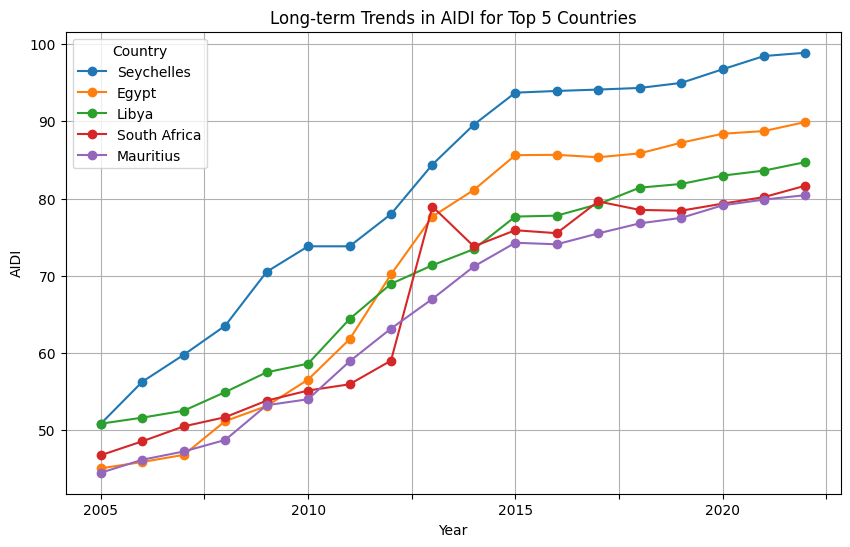

In [34]:
def long_term_trends(df):
    top_5 = df.mean(axis=1).sort_values(ascending=False).head(5)
    top_5_countries = top_5.index
    df_top_5 = df.loc[top_5_countries]

    df_top_5.T.plot(figsize=(10, 6), marker='o')
    plt.title('Long-term Trends in AIDI for Top 5 Countries')
    plt.xlabel('Year')
    plt.ylabel('AIDI')
    plt.legend(title='Country')
    plt.grid(True)
    plt.show()

# Example usage
long_term_trends(datasets['Aidi'])


## AIDI-Top 5 Trends Report


#### Introduction
This report presents a detailed analysis of the long-term trends in the Africa Infrastructure Development Index (AIDI) for the top five countries: Seychelles, Egypt, Libya, South Africa, and Mauritius. The data spans from 2005 to 2022, showcasing the trajectory of infrastructure development over this period.

#### Overview of the Plot
The line plot visualizes the AIDI scores for the top five countries, with each line representing a different country. The x-axis denotes the years from 2005 to 2022, while the y-axis shows the AIDI scores ranging from 50 to 100. The countries are color-coded for clarity and are listed in the legend.

#### Analysis

1. **Seychelles (Blue)**
   - **Trend:** Seychelles shows a steady and significant increase in AIDI scores from 2005 to 2022.
   - **Performance:** Starting from around 50% in 2005, the AIDI score rises consistently, peaking at approximately 97% by 2022.
   - **Key Insights:** This continuous growth reflects Seychelles' strong and sustained efforts in infrastructure development, placing it consistently at the top.

2. **Egypt (Orange)**
   - **Trend:** Egypt demonstrates a gradual increase in AIDI scores over the years.
   - **Performance:** Starting at around 50% in 2005, Egypt's AIDI score steadily climbs to about 91% by 2022.
   - **Key Insights:** The steady rise indicates consistent improvements in infrastructure, highlighting effective policies and investments in this sector.

3. **Libya (Green)**
   - **Trend:** Libya exhibits a more fluctuating trend compared to Seychelles and Egypt, with noticeable periods of rapid growth and stability.
   - **Performance:** Beginning at around 50% in 2005, Libya's score increases to around 85% by 2022, with some fluctuations around 2011-2014.
   - **Key Insights:** The fluctuations could be attributed to political and economic factors affecting the country's infrastructure development, but the overall trend remains positive.

4. **South Africa (Red)**
   - **Trend:** South Africa shows a steady upward trend in its AIDI score, with slight fluctuations.
   - **Performance:** From an initial score of about 50% in 2005, the score rises to approximately 83% by 2022.
   - **Key Insights:** The steady increase indicates robust infrastructure development, although the rate of growth is somewhat slower compared to Seychelles and Egypt.

5. **Mauritius (Purple)**
   - **Trend:** Mauritius displays a steady increase in AIDI scores similar to other top performers.
   - **Performance:** Starting from around 50% in 2005, Mauritius' score reaches approximately 80% by 2022.
   - **Key Insights:** The consistent growth signifies successful infrastructure development efforts, placing Mauritius among the top performers.

#### Summary
The analysis of long-term trends in the Africa Infrastructure Development Index (AIDI) for the top five countries reveals a general upward trajectory, with Seychelles leading the pack. Each country has shown substantial improvements in infrastructure over the last two decades, with varying rates of growth. The steady increase in AIDI scores across these countries underscores their commitment to enhancing infrastructure, a critical factor for sustainable development and economic growth. Seychelles and Egypt are particularly notable for their continuous and rapid advancements, while Libya's fluctuations highlight the impact of external factors on infrastructure development. Overall, the positive trends reflect successful strategies and investments in infrastructure across these leading nations.

## Transport Composite Index-Top 5 Trends

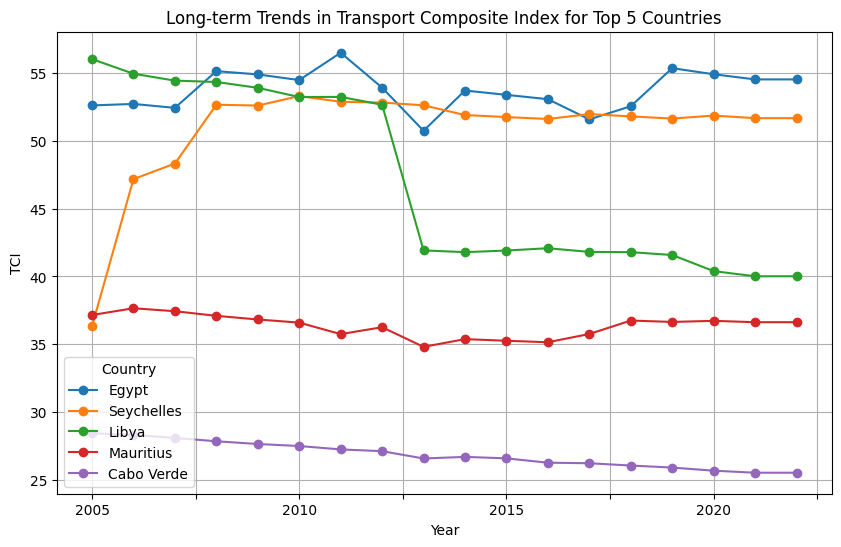

In [35]:
def long_term_trends(df):
    top_5 = df.mean(axis=1).sort_values(ascending=False).head(5)
    top_5_countries = top_5.index
    df_top_5 = df.loc[top_5_countries]

    df_top_5.T.plot(figsize=(10, 6), marker='o')
    plt.title('Long-term Trends in Transport Composite Index for Top 5 Countries')
    plt.xlabel('Year')
    plt.ylabel('TCI')
    plt.legend(title='Country')
    plt.grid(True)
    plt.show()

# Example usage
long_term_trends(datasets['Transport'])


## Transport Composite Index-Top 5 Trends Report


#### Introduction
This report presents an in-depth analysis of the long-term trends in the Transport Composite Index (TCI) for the top five countries: Egypt, Seychelles, Libya, Mauritius, and Cabo Verde. The data spans from 2005 to 2022, illustrating the evolution of transportation infrastructure in these countries over the specified period.

#### Overview of the Plot
The line plot visualizes the TCI scores for the top five countries, with each line representing a different country. The x-axis denotes the years from 2005 to 2022, while the y-axis shows the TCI scores ranging from 25 to 60. The countries are color-coded for clarity and listed in the legend.

#### Analysis

1. **Egypt (Blue)**
   - **Trend:** Egypt shows a relatively stable trend with minor fluctuations in its TCI scores from 2005 to 2022.
   - **Performance:** Starting at around 40% in 2005, Egypt's TCI score gradually increases, peaking at approximately 56% in 2022.
   - **Key Insights:** The steady growth indicates consistent improvements in the transport sector, reflecting ongoing investments and policy efforts to enhance transportation infrastructure.

2. **Seychelles (Orange)**
   - **Trend:** Seychelles demonstrates a notable increase in TCI scores initially, followed by a stable period with slight fluctuations.
   - **Performance:** Beginning at around 40% in 2005, Seychelles' TCI score rises sharply to approximately 55% by 2010, maintaining a steady level with minor variations through 2022.
   - **Key Insights:** The significant initial rise reflects major improvements in transportation infrastructure during the early years, with sustained efforts maintaining the high level of development.

3. **Libya (Green)**
   - **Trend:** Libya exhibits a marked decline in TCI scores after an initial period of stability.
   - **Performance:** Starting from around 55% in 2005, Libya's score remains relatively high until a sharp decline to around 45% in 2012, maintaining this lower level through 2022.
   - **Key Insights:** The steep drop could be attributed to political and economic instability, significantly impacting the transport sector's development and maintenance.

4. **Mauritius (Red)**
   - **Trend:** Mauritius shows a relatively stable trend with slight fluctuations in its TCI scores over the years.
   - **Performance:** From an initial score of about 35% in 2005, Mauritius' TCI score shows minor fluctuations, stabilizing around the same level through 2022.
   - **Key Insights:** The steady trend suggests moderate growth and development in transportation infrastructure, with consistent efforts maintaining the sector.

5. **Cabo Verde (Purple)**
   - **Trend:** Cabo Verde displays a gradual decline in TCI scores over the analyzed period.
   - **Performance:** Beginning at around 32% in 2005, Cabo Verde's TCI score shows a slow but steady decrease, reaching approximately 28% by 2022.
   - **Key Insights:** The gradual decline indicates challenges in enhancing transportation infrastructure, possibly due to limited resources or other external factors affecting development.

#### Summary
The analysis of long-term trends in the Transport Composite Index (TCI) for the top five countries reveals varying patterns of growth and stability. Egypt and Seychelles stand out for their significant improvements and stable high levels of transportation infrastructure development. Libya's sharp decline highlights the impact of instability on the transport sector, while Mauritius maintains a steady trend with moderate growth. Cabo Verde's gradual decline indicates challenges in sustaining improvements in transportation infrastructure. Overall, these trends reflect each country's unique context and the effectiveness of their strategies and investments in the transport sector.

## Electricity Composite Index-Top 5 Trends

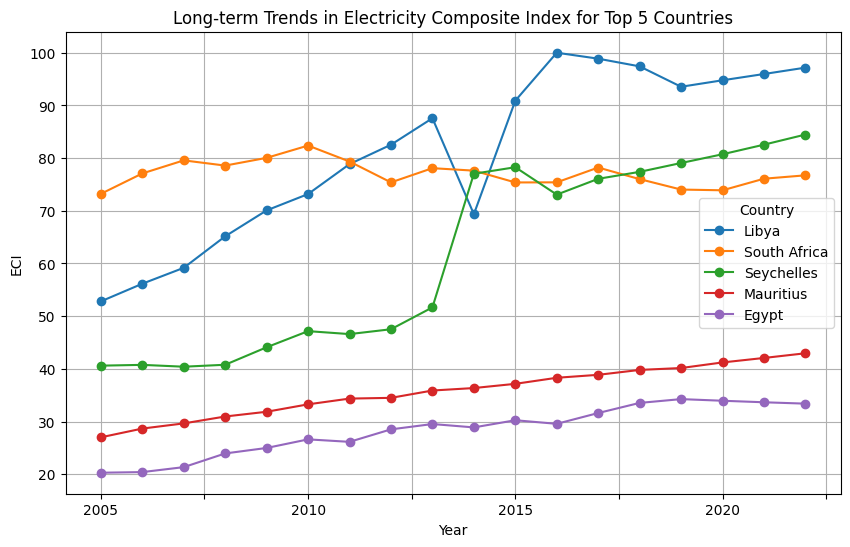

In [36]:
def long_term_trends(df):
    top_5 = df.mean(axis=1).sort_values(ascending=False).head(5)
    top_5_countries = top_5.index
    df_top_5 = df.loc[top_5_countries]

    df_top_5.T.plot(figsize=(10, 6), marker='o')
    plt.title('Long-term Trends in Electricity Composite Index for Top 5 Countries')
    plt.xlabel('Year')
    plt.ylabel('ECI')
    plt.legend(title='Country')
    plt.grid(True)
    plt.show()

# Example usage
long_term_trends(datasets['Electricity'])


## Electricity Composite Index-Top 5 Trends Report

### Detailed Report on Long-term Trends in Electricity Composite Index for Top 5 Countries

#### Introduction
This report analyzes the long-term trends in the Electricity Composite Index (ECI) for five countries: Libya, South Africa, Seychelles, Mauritius, and Egypt. The data spans from 2005 to 2022, showcasing the evolution of electricity infrastructure and access in these nations.

#### Overview of the Plot
The line graph displays ECI scores for the five countries, with each line representing a different country. The x-axis shows years from 2005 to 2022, while the y-axis represents ECI scores ranging from 20 to 100. Countries are color-coded for easy distinction.

#### Analysis

1. **Libya (Blue)**
   - **Trend:** Dramatic increase followed by volatility.
   - **Performance:** Started at ~53 in 2005, peaked at ~100 in 2015, then slightly declined to ~97 by 2022.
   - **Key Insights:** Rapid improvement in electricity infrastructure until 2015, possibly due to significant investments. The slight decline and volatility post-2015 may reflect political instability.

2. **South Africa (Orange)**
   - **Trend:** Gradual increase followed by stability.
   - **Performance:** Rose from ~73 in 2005 to ~80 by 2010, then maintained a relatively stable score around 77-80.
   - **Key Insights:** Initial improvements in electricity access and infrastructure, followed by a plateau, possibly due to challenges in expanding the grid or maintaining consistent power supply.

3. **Seychelles (Green)**
   - **Trend:** Stable initially, followed by a sharp increase and continued growth.
   - **Performance:** Remained around 40-45 until 2013, then jumped to ~77 in 2015, continuing to rise to ~85 by 2022.
   - **Key Insights:** Major improvements in electricity infrastructure post-2013, possibly due to significant investments or policy changes.

4. **Mauritius (Red)**
   - **Trend:** Steady, gradual increase.
   - **Performance:** Rose from ~28 in 2005 to ~43 in 2022.
   - **Key Insights:** Consistent but modest improvements in electricity access and infrastructure, indicating sustained but measured investments.

5. **Egypt (Purple)**
   - **Trend:** Gradual increase.
   - **Performance:** Increased from ~21 in 2005 to ~34 in 2022.
   - **Key Insights:** Steady progress in improving electricity infrastructure, but at a slower rate compared to some other countries in the analysis.

#### Summary
The analysis reveals diverse patterns in electricity infrastructure development among the five countries:

1. Libya experienced the most dramatic changes, with rapid improvement followed by volatility.
2. South Africa maintained a relatively high and stable score throughout the period.
3. Seychelles showed the most significant improvement, particularly after 2013.
4. Mauritius and Egypt demonstrated steady but more modest improvements.

These trends reflect each country's unique economic, political, and developmental contexts, as well as their varying approaches to electricity infrastructure investment and management. The data suggests that while some countries have made substantial strides, others face ongoing challenges in improving their electricity sectors.

## ICT Composite Index-Top 5 Trends

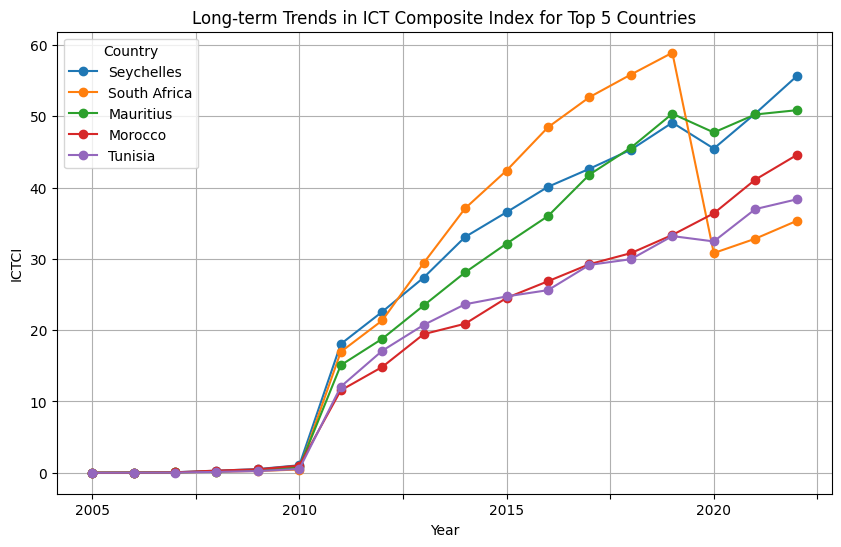

In [37]:
def long_term_trends(df):
    top_5 = df.mean(axis=1).sort_values(ascending=False).head(5)
    top_5_countries = top_5.index
    df_top_5 = df.loc[top_5_countries]

    df_top_5.T.plot(figsize=(10, 6), marker='o')
    plt.title('Long-term Trends in ICT Composite Index for Top 5 Countries')
    plt.xlabel('Year')
    plt.ylabel('ICTCI')
    plt.legend(title='Country')
    plt.grid(True)
    plt.show()

# Example usage
long_term_trends(datasets['Ict'])


##ICT Composite Index-Top 5 Trends Report

### Detailed Report on Long-term Trends in ICT Composite Index for Top 5 Countries

#### Introduction
This report analyzes the long-term trends in the Information and Communication Technology (ICT) Composite Index for five countries: Seychelles, South Africa, Mauritius, Morocco, and Tunisia. The data spans from 2005 to 2022, illustrating the evolution of ICT infrastructure and adoption in these nations.

#### Overview of the Plot
The line graph displays ICT Composite Index scores for the five countries, with each line representing a different country. The x-axis shows years from 2005 to 2022, while the y-axis represents ICT scores ranging from 0 to 60. Countries are color-coded for easy distinction.

#### Analysis

1. **Seychelles (Blue)**
   - **Trend:** Rapid growth with some fluctuations.
   - **Performance:** Near 0 until 2010, then sharp rise to ~40 by 2015, peaking at ~50 in 2019, slight dip, then recovery to ~55 by 2022.
   - **Key Insights:** Dramatic improvement in ICT infrastructure post-2010, suggesting significant investments and policy changes to boost digital connectivity.

2. **South Africa (Orange)**
   - **Trend:** Steady growth followed by a sharp decline.
   - **Performance:** Near 0 until 2010, then rapid rise to ~60 by 2019, followed by a dramatic drop to ~35 in 2022.
   - **Key Insights:** Strong initial progress in ICT development, but recent sharp decline suggests potential setbacks or changes in measurement methodology.

3. **Mauritius (Green)**
   - **Trend:** Consistent growth.
   - **Performance:** Near 0 until 2010, then steady increase to ~50 by 2022.
   - **Key Insights:** Sustained and successful efforts to improve ICT infrastructure and adoption, indicating consistent policy focus and investments.

4. **Morocco (Red)**
   - **Trend:** Gradual, steady increase.
   - **Performance:** Near 0 until 2010, then gradual rise to ~45 by 2022.
   - **Key Insights:** Consistent progress in ICT development, reflecting ongoing efforts to enhance digital infrastructure and accessibility.

5. **Tunisia (Purple)**
   - **Trend:** Slow but steady growth.
   - **Performance:** Near 0 until 2010, then gradual increase to ~40 by 2022.
   - **Key Insights:** Continuous improvement in ICT sector, though at a slower pace compared to some peers, suggesting steady but perhaps more constrained investments.

#### Summary
The analysis reveals significant developments in ICT infrastructure across all five countries:

1. All countries started from very low levels (near 0) in 2005, indicating a common starting point.
2. 2010 marked a turning point, with all countries beginning rapid development in ICT.
3. Seychelles and Mauritius show the most consistent and substantial growth.
4. South Africa experienced the most dramatic changes, with rapid growth followed by a sharp decline.
5. Morocco and Tunisia demonstrate steady but more moderate improvements.

These trends reflect each country's unique approach to ICT development, influenced by factors such as economic policies, investment priorities, and technological adoption rates. The data suggests that while all countries have made significant strides since 2010, they face different challenges and opportunities in further developing their ICT sectors.

The sharp decline in South Africa's score after 2019 is particularly notable and may warrant further investigation into potential policy changes, economic factors, or data collection methods that could explain this dramatic shift.

## WSS Composite Index-Top 5 Trends

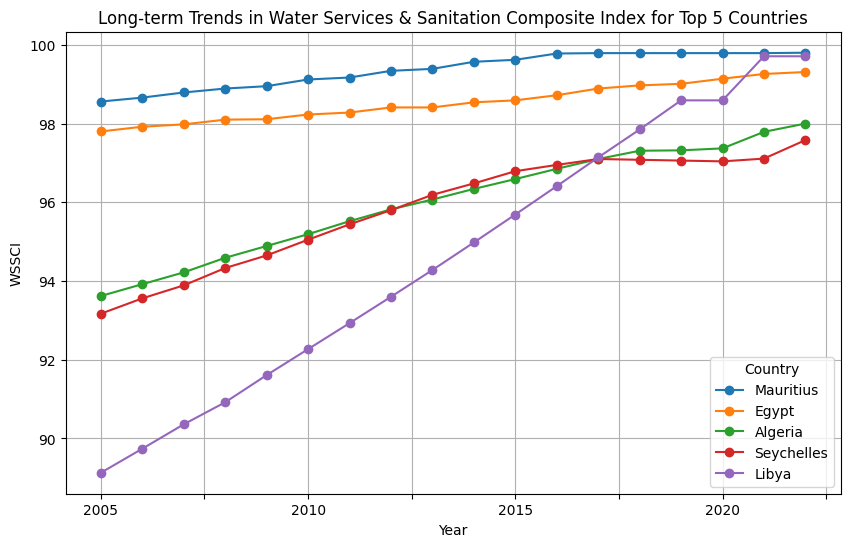

In [38]:
def long_term_trends(df):
    top_5 = df.mean(axis=1).sort_values(ascending=False).head(5)
    top_5_countries = top_5.index
    df_top_5 = df.loc[top_5_countries]

    df_top_5.T.plot(figsize=(10, 6), marker='o')
    plt.title('Long-term Trends in Water Services & Sanitation Composite Index for Top 5 Countries')
    plt.xlabel('Year')
    plt.ylabel('WSSCI')
    plt.legend(title='Country')
    plt.grid(True)
    plt.show()

# Example usage
long_term_trends(datasets['Water'])


## WSS Composite Index-Top 5 Trends Report

### Detailed Report on Long-term Trends in Water Services & Sanitation Composite Index for Top 5 Countries

#### Introduction
This report analyzes the long-term trends in the Water Services & Sanitation Composite Index (WSSCI) for five countries: Mauritius, Egypt, Algeria, Seychelles, and Libya. The data spans from 2005 to 2022, illustrating the evolution of water and sanitation infrastructure in these nations.

#### Overview of the Plot
The line graph displays WSSCI scores for the five countries, with each line representing a different country. The x-axis shows years from 2005 to 2022, while the y-axis represents WSSCI scores ranging from 89 to 100. Countries are color-coded for easy distinction.

#### Analysis

1. **Mauritius (Blue)**
   - **Trend:** Steady, gradual improvement.
   - **Performance:** Started at ~98.7 in 2005, reaching ~99.8 by 2022.
   - **Key Insights:** Consistently high scores indicate excellent water and sanitation infrastructure, with minor but continuous improvements over time.

2. **Egypt (Orange)**
   - **Trend:** Slow but steady increase.
   - **Performance:** Rose from ~97.8 in 2005 to ~99.5 in 2022.
   - **Key Insights:** Already high initial score with gradual improvements, suggesting sustained efforts to enhance water and sanitation services.

3. **Algeria (Green)**
   - **Trend:** Consistent upward trend.
   - **Performance:** Increased from ~93.7 in 2005 to ~98 in 2022.
   - **Key Insights:** Significant improvements over the period, indicating successful long-term strategies in water and sanitation development.

4. **Seychelles (Red)**
   - **Trend:** Steady increase with slight fluctuations.
   - **Performance:** Rose from ~93.3 in 2005 to ~97.6 in 2022.
   - **Key Insights:** Substantial progress in water and sanitation services, with minor variations possibly due to specific projects or challenges.

5. **Libya (Purple)**
   - **Trend:** Rapid improvement, especially after 2015.
   - **Performance:** Started lowest at ~89 in 2005, rising dramatically to ~99.8 by 2022.
   - **Key Insights:** Most dramatic improvement among the five countries, suggesting major investments and policy changes, particularly in recent years.

#### Summary
The analysis reveals positive trends in water and sanitation infrastructure across all five countries:

1. All countries started with relatively high scores in 2005, indicating a strong baseline in water and sanitation services.
2. Mauritius and Egypt maintained consistently high scores throughout the period, with minor improvements.
3. Algeria and Seychelles showed significant progress, closing the gap with the top performers.
4. Libya demonstrated the most dramatic improvement, particularly after 2015, suggesting focused efforts to rapidly enhance water and sanitation infrastructure.

These trends reflect each country's commitment to improving water and sanitation services, likely driven by a combination of factors including economic development, policy priorities, and international development goals.

The consistently high scores across all countries by 2022 (all above 97.5) indicate a convergence towards excellent water and sanitation standards. This suggests successful implementation of water and sanitation projects and policies across these African nations.

Libya's rapid improvement stands out, potentially indicating a recovery and development phase following periods of instability, with significant investments in basic infrastructure.

Overall, the data paints a positive picture of water and sanitation development in these countries, with all five achieving very high standards by the end of the observed period.

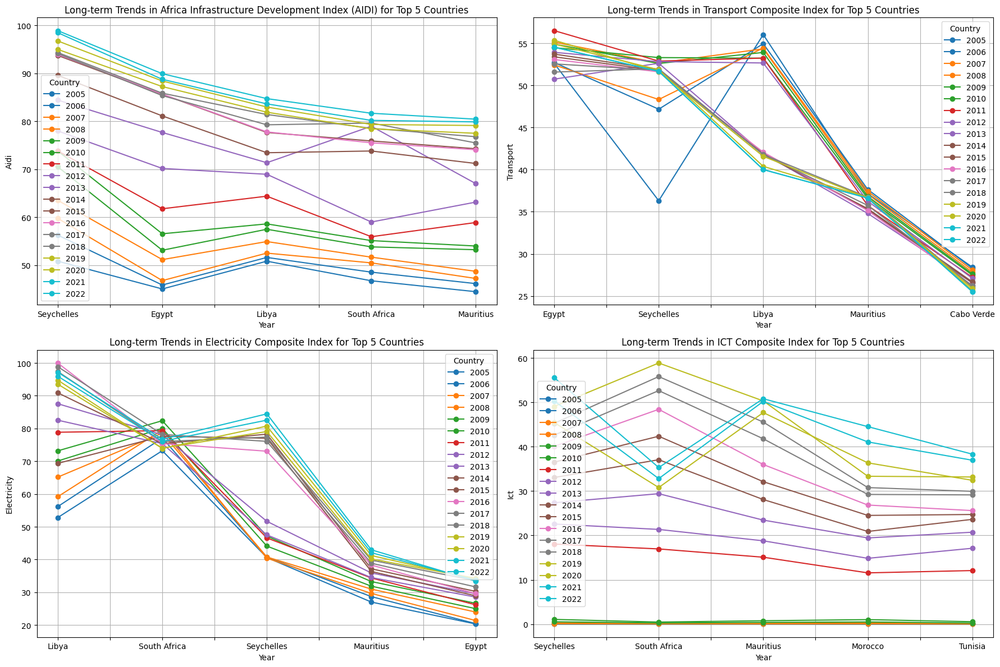

In [39]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_subplots_for_datasets(datasets):
    """
    Plot subplots for long-term trends of each dataset in the provided dictionary.

    Parameters:
    - datasets (dict): Dictionary containing datasets for AIDI, Transport, Electricity, ICT, and Water.
                      Keys are strings ('Aidi', 'Transport', 'Electricity', 'Ict', 'Water') and values are DataFrames.
    """
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18, 12))

    # Define titles corresponding to each dataset
    dataset_titles = {
        'Aidi': 'Africa Infrastructure Development Index (AIDI)',
        'Transport': 'Transport Composite Index',
        'Electricity': 'Electricity Composite Index',
        'Ict': 'ICT Composite Index',
        'Water': 'Water Services and Sanitation Composite Index'
    }

    # Define common top 5 countries for all datasets
    common_top_5 = {}
    for dataset_name, df in datasets.items():
        top_5 = df.mean(axis=1).sort_values(ascending=False).head(5)
        common_top_5[dataset_name] = top_5.index

    # Plot each dataset in a separate subplot
    for idx, (dataset_name, ax) in enumerate(zip(datasets.keys(), axes.flatten())):
        df_top_5 = datasets[dataset_name].loc[common_top_5[dataset_name]]

        # Plotting with common colors
        colors = plt.cm.get_cmap('tab10', len(df_top_5.columns))
        for i, country in enumerate(df_top_5.columns):
            df_top_5[country].plot(ax=ax, marker='o', color=colors(i), label=country)

        ax.set_title(f'Long-term Trends in {dataset_titles[dataset_name]} for Top 5 Countries')
        ax.set_xlabel('Year')
        ax.set_ylabel(dataset_name)
        ax.legend(title='Country')
        ax.grid(True)

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage with your datasets dictionary
# Replace with your actual datasets
datasets = {'Aidi': Aidi, 'Transport': Transport, 'Electricity': Electricity, 'Ict': Ict, 'Water': Water}

plot_subplots_for_datasets(datasets)


# Top-5 & Bottom Performers

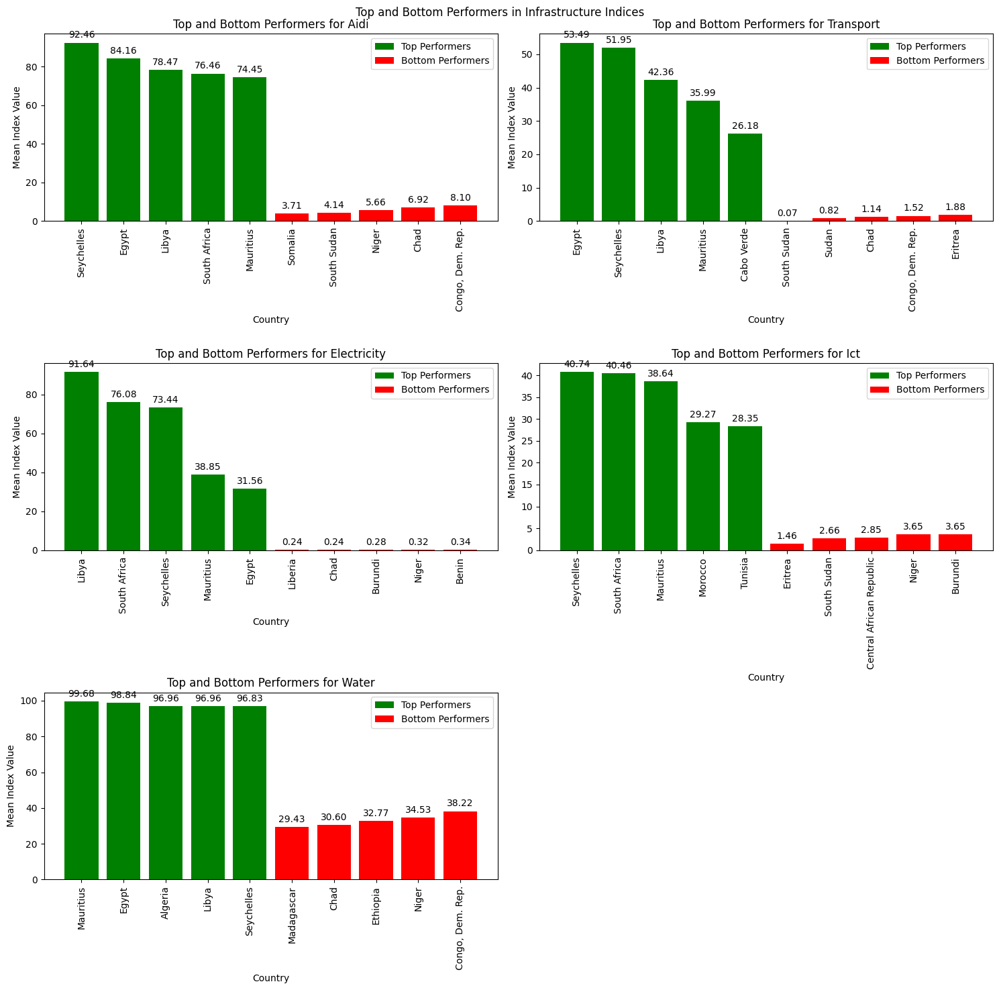

In [40]:
import matplotlib.pyplot as plt
import pandas as pd

# Example datasets (replace with your actual datasets)
datasets = {
    'Aidi': Aidi,
    'Transport': Transport,
    'Electricity': Electricity,
    'Ict': Ict,
    'Water': Water
}

def plot_top_bottom_performers(datasets):
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))
    fig.suptitle('Top and Bottom Performers in Infrastructure Indices')

    row = 0
    col = 0

    for key, df in datasets.items():
        last_decade = df.loc[:, '2012':'2022']
        top_performers = last_decade.mean(axis=1).sort_values(ascending=False).head(5)
        bottom_performers = last_decade.mean(axis=1).sort_values(ascending=True).head(5)

        # Plot top performers
        bars_top = axs[row, col].bar(top_performers.index, top_performers.values, color='g', label='Top Performers')
        # Plot bottom performers
        bars_bottom = axs[row, col].bar(bottom_performers.index, bottom_performers.values, color='r', label='Bottom Performers')

        axs[row, col].set_title(f'Top and Bottom Performers for {key}')
        axs[row, col].set_ylabel('Mean Index Value')
        axs[row, col].set_xlabel('Country')
        axs[row, col].legend()
        axs[row, col].tick_params(axis='x', rotation=90)  # Rotate x-ticks

        # Add values to bars
        for bar in bars_top:
            height = bar.get_height()
            axs[row, col].annotate(f'{height:.2f}',
                                   xy=(bar.get_x() + bar.get_width() / 2, height),
                                   xytext=(0, 3),  # 3 points vertical offset
                                   textcoords="offset points",
                                   ha='center', va='bottom')
        for bar in bars_bottom:
            height = bar.get_height()
            axs[row, col].annotate(f'{height:.2f}',
                                   xy=(bar.get_x() + bar.get_width() / 2, height),
                                   xytext=(0, 3),  # 3 points vertical offset
                                   textcoords="offset points",
                                   ha='center', va='bottom')

        col += 1
        if col >= 2:
            col = 0
            row += 1

    # Remove empty subplots
    if len(datasets) < 6:
        for i in range(len(datasets), 6):
            fig.delaxes(axs.flatten()[i])

    plt.tight_layout()
    plt.show()

# Example usage
plot_top_bottom_performers(datasets)


## Top 5 & Bottom Report


#### Introduction
This report provides a comprehensive analysis of the top and bottom performers in five key infrastructure indices for various African countries over the last decade (2012-2022). The indices analyzed include:
1. Africa Infrastructure Development Index (AIDI)
2. Transport Composite Index
3. Electricity Composite Index
4. ICT Composite Index
5. Water and Sanitation Service (WSS) Composite Index

The performance is visualized in horizontal bar charts, highlighting the top 5 and bottom 5 performers for each index. Each chart displays the mean index values for the top and bottom performers, providing insights into the relative infrastructure development across different countries.

#### 1. Africa Infrastructure Development Index (AIDI)
**Top Performers:**
- Seychelles: 92.46%
- Egypt: 84.16%
- Libya: 78.47%
- South Africa: 76.46%
- Mauritius: 74.45%

**Bottom Performers:**
- Somalia: 3.71%
- South Sudan: 4.14%
- Niger: 5.66%
- Chad: 6.92%
- Congo, Dem. Rep.: 8.10%

**Insight:** The Seychelles, Egypt, and Libya lead in infrastructure development, while Somalia, South Sudan, and Niger lag significantly behind, indicating a large disparity in infrastructure development across the continent.

#### 2. Transport Composite Index
**Top Performers:**
- Egypt: 53.49%
- Seychelles: 51.95%
- Libya: 42.36%
- Mauritius: 35.99%
- Cabo Verde: 26.18%

**Bottom Performers:**
- South Sudan: 0.07%
- Chad: 0.82%
- Somalia: 1.14%
- Congo, Dem. Rep.: 1.52%
- Eritrea: 1.88%

**Insight:** Egypt and Seychelles show superior performance in transport infrastructure, whereas South Sudan, Chad, and Somalia have the least developed transport infrastructure.

#### 3. Electricity Composite Index
**Top Performers:**
- Libya: 91.64%
- South Africa: 76.08%
- Seychelles: 73.44%
- Egypt: 38.85%
- Mauritius: 31.56%

**Bottom Performers:**
- Burundi: 0.24%
- Chad: 0.24%
- Malawi: 0.28%
- Niger: 0.32%
- Benin: 0.34%

**Insight:** Libya, South Africa, and Seychelles have robust electricity infrastructure, while countries like Burundi, Chad, and Malawi are at the bottom of the list with extremely low electricity infrastructure indices.

#### 4. ICT Composite Index
**Top Performers:**
- Seychelles: 40.74%
- South Africa: 40.06%
- Mauritius: 38.64%
- Morocco: 29.27%
- Tunisia: 28.35%

**Bottom Performers:**
- Eritrea: 1.46%
- South Sudan: 2.66%
- Central African Republic: 2.85%
- Niger: 3.65%
- Burundi: 3.65%

**Insight:** Seychelles and South Africa are leaders in ICT infrastructure, whereas Eritrea and South Sudan are among the lowest, indicating significant gaps in ICT development.

#### 5. Water and Sanitation Service (WSS) Composite Index
**Top Performers:**
- Mauritius: 99.60%
- Seychelles: 98.81%
- Egypt: 96.96%
- Algeria: 96.96%
- Libya: 96.83%

**Bottom Performers:**
- Madagascar: 29.43%
- Chad: 30.60%
- Ethiopia: 32.77%
- Niger: 34.53%
- Congo, Dem. Rep.: 38.22%

**Insight:** Mauritius, Seychelles, and Egypt exhibit excellent performance in water and sanitation services, while Madagascar, Chad, and Ethiopia are among the lowest performers, highlighting critical areas needing improvement.

### Summary
The analysis reveals significant disparities in infrastructure development across African countries. Seychelles consistently ranks among the top performers across various indices, while countries like South Sudan, Somalia, and Chad frequently appear as bottom performers. These insights underscore the need for targeted efforts to bridge the infrastructure gap and promote balanced development across the continent.

# Regional Analysis


### Northern Africa:
- Algeria
- Egypt
- Libya
- Morocco
- Sudan
- Tunisia

### Western Africa:
- Benin
- Burkina Faso
- Cabo Verde
- Cote d'Ivoire
- Gambia, The
- Ghana
- Guinea
- Guinea-Bissau
- Liberia
- Mali
- Mauritania
- Niger
- Nigeria
- Senegal
- Sierra Leone
- Togo

### Central Africa:
- Angola
- Cameroon
- Central African Republic
- Chad
- Congo, Rep.
- Congo, Dem. Rep.
- Equatorial Guinea
- Gabon
- Sao Tome and Principe

### Eastern Africa:
- Burundi
- Comoros
- Djibouti
- Eritrea
- Ethiopia
- Kenya
- Madagascar
- Malawi
- Mauritius
- Mozambique
- Rwanda
- Seychelles
- Somalia
- South Sudan
- Tanzania
- Uganda
- Zambia
- Zimbabwe

### Southern Africa:
- Botswana
- Lesotho
- Namibia
- South Africa
- eSwatini (formerly Swaziland)

This classification is based on the United Nations geoscheme for Africa.

## AIDI

Step 1: Define the Regions Dictionary

In [41]:
regions = {
    'Northern Africa': ['Algeria', 'Egypt', 'Libya', 'Morocco', 'Sudan', 'Tunisia'],
    'Western Africa': ['Benin', 'Burkina Faso', 'Cabo Verde', 'Cote d\'Ivoire', 'Gambia, The', 'Ghana',
                       'Guinea', 'Guinea-Bissau', 'Liberia', 'Mali', 'Mauritania', 'Niger', 'Nigeria',
                       'Senegal', 'Sierra Leone', 'Togo'],
    'Central Africa': ['Angola', 'Cameroon', 'Central African Republic', 'Chad', 'Congo, Rep.',
                       'Congo, Dem. Rep.', 'Equatorial Guinea', 'Gabon', 'Sao Tome and Principe'],
    'Eastern Africa': ['Burundi', 'Comoros', 'Djibouti', 'Eritrea', 'Ethiopia', 'Kenya', 'Madagascar',
                       'Malawi', 'Mauritius', 'Mozambique', 'Rwanda', 'Seychelles', 'Somalia',
                       'South Sudan', 'Tanzania', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Southern Africa': ['Botswana', 'Lesotho', 'Namibia', 'South Africa', 'eSwatini']
}


Step 2: Map Each Country to Its Region and Create a New DataFrame

In [42]:
import pandas as pd

# Assuming df is the original DataFrame for Aidi
df = datasets["Aidi"].reset_index()

# Create a reverse mapping from country to region
country_to_region = {country: region for region, countries in regions.items() for country in countries}

# Add the 'Region' column to a new DataFrame
df_aidi = df.copy()
df_aidi['Region'] = df_aidi['Country'].map(country_to_region)

# Display the new DataFrame to verify
print(df_aidi.head())


        Country   2005   2006   2007   2008   2009   2010   2011   2012  \
0       Algeria  28.55  28.96  30.43  32.73  34.31  36.29  38.57  43.69   
1        Angola   7.96   8.17   8.54   9.41  10.41  11.50  12.58  13.75   
2         Benin   8.77   8.82   8.68   8.92   9.53  10.32  11.31  12.29   
3      Botswana  28.45  28.58  28.21  28.98  29.75  30.61  31.89  32.59   
4  Burkina Faso  12.00  12.44  11.26  11.64  12.07  12.72  13.56  14.25   

    2013   2014   2015   2016   2017   2018   2019   2020   2021   2022  \
0  47.78  49.91  52.99  53.39  54.04  55.79  57.08  57.87  58.91  60.00   
1  14.99  16.39  16.83  16.46  17.48  19.04  18.88  20.07  20.20  20.65   
2  13.72  14.68  15.59  15.78  16.02  16.23  16.07  16.53  16.75  17.40   
3  33.50  34.76  35.64  35.63  36.61  36.79  36.96  37.50  37.90  39.02   
4  15.33  15.67  16.38  16.52  16.97  17.05  17.51  18.52  19.41  20.34   

            Region  
0  Northern Africa  
1   Central Africa  
2   Western Africa  
3  Southern Af

Step 3: Select Only Numeric Columns and Group by 'Region'

In [43]:
# Select only the numeric columns
numeric_columns = df_aidi.select_dtypes(include='number').columns

# Group by 'Region' and calculate the mean for each region
grouped_df = df_aidi.groupby('Region')[numeric_columns].mean()

# Display the grouped DataFrame to verify
print(grouped_df)


                      2005       2006       2007       2008       2009  \
Region                                                                   
Central Africa   10.612222  10.887778  11.317778  11.778889  12.327778   
Eastern Africa   13.999444  14.538333  15.071111  15.722222  16.683889   
Northern Africa  30.150000  30.863333  32.180000  34.676667  36.878333   
Southern Africa  25.574000  26.104000  26.682000  27.408000  28.194000   
Western Africa    9.888750  10.248750  10.590000  11.037500  11.810000   

                      2010       2011       2012       2013       2014  \
Region                                                                   
Central Africa   12.930000  13.580000  14.116667  15.071111  15.872222   
Eastern Africa   17.286111  18.031111  19.213333  20.518333  21.878889   
Northern Africa  39.073333  43.133333  48.573333  53.558333  56.123333   
Southern Africa  28.544000  30.094000  30.608000  35.542000  35.140000   
Western Africa   12.653125  14.101250

Step 4: Plot the Data

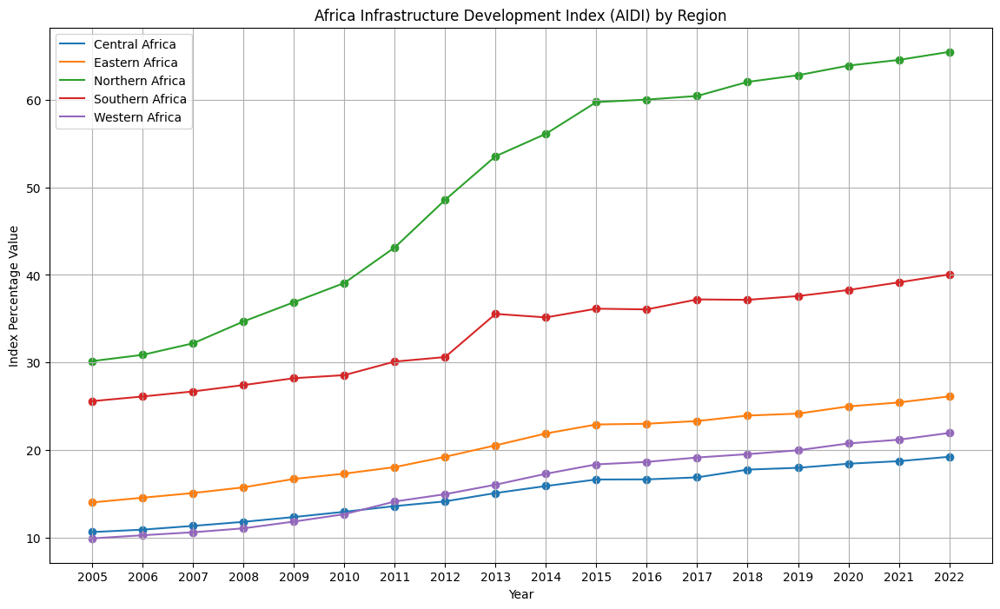

In [44]:
import matplotlib.pyplot as plt

# Plotting each region
fig, ax = plt.subplots(figsize=(14, 8))

for region in grouped_df.index:
    ax.plot(grouped_df.columns, grouped_df.loc[region], label=region)
    ax.scatter(grouped_df.columns, grouped_df.loc[region])  # Add data points

ax.set_title('Africa Infrastructure Development Index (AIDI) by Region')
ax.set_xlabel('Year')
ax.set_ylabel('Index Percentage Value')
ax.legend()

# Add grid
ax.grid(True)

plt.show()


## AIDI Region Report

### Detailed Report on Africa Infrastructure Development Index (AIDI) by Region

#### Introduction
This report analyzes the long-term trends in the Africa Infrastructure Development Index (AIDI) across five regions of Africa: Central, Eastern, Northern, Southern, and Western Africa. The data spans from 2005 to 2022, providing insights into the evolution of infrastructure development across the continent.

#### Overview of the Plot
The line graph displays AIDI scores for the five African regions, with each line representing a different region. The x-axis shows years from 2005 to 2022, while the y-axis represents AIDI scores ranging from 10 to 70. Regions are color-coded for easy distinction.

#### Analysis by Region

1. **Northern Africa (Green)**
   - **Trend:** Rapid and consistent growth.
   - **Performance:** Started at ~30 in 2005, rising dramatically to ~65 by 2022.
   - **Key Insights:** Demonstrates the most significant improvement, indicating substantial investments and effective policies in infrastructure development.

2. **Southern Africa (Red)**
   - **Trend:** Moderate growth with periods of acceleration and stability.
   - **Performance:** Began at ~25 in 2005, reaching ~40 by 2022.
   - **Key Insights:** Shows steady progress, with a notable acceleration around 2013-2014, followed by a period of slower growth.

3. **Eastern Africa (Orange)**
   - **Trend:** Steady, gradual improvement.
   - **Performance:** Rose from ~14 in 2005 to ~25 in 2022.
   - **Key Insights:** Consistent but slower growth compared to Northern and Southern Africa, suggesting ongoing challenges in rapid infrastructure development.

4. **Western Africa (Gray)**
   - **Trend:** Slow but steady increase.
   - **Performance:** Increased from ~10 in 2005 to ~22 in 2022.
   - **Key Insights:** Shows progress but at a slower rate than other regions, indicating potential obstacles in infrastructure development or resource allocation.

5. **Central Africa (Blue)**
   - **Trend:** Slowest growth among all regions.
   - **Performance:** Started at ~11 in 2005, reaching ~19 by 2022.
   - **Key Insights:** While showing improvement, Central Africa lags behind other regions, suggesting significant challenges in infrastructure development.

#### Comparative Analysis
- **Regional Disparities:** The graph clearly illustrates significant disparities in infrastructure development across African regions. Northern Africa consistently outperforms other regions, while Central Africa shows the slowest progress.
- **Growth Patterns:** All regions show positive growth trends, but at varying rates. Northern Africa's rapid ascent contrasts sharply with the more gradual improvements seen in Central and Western Africa.
- **Convergence vs. Divergence:** The gap between the highest-performing region (Northern Africa) and the others has widened over time, indicating a divergence in infrastructure development rates.

#### Key Observations
1. **Northern Africa's Leadership:** Northern Africa's dramatic improvement suggests effective policies, substantial investments, and possibly more stable political and economic environments conducive to infrastructure development.
2. **Southern Africa's Steady Progress:** As the second-best performer, Southern Africa shows promising development, though at a slower pace than Northern Africa.
3. **Challenges in Central Africa:** The slower growth in Central Africa points to persistent challenges, possibly including political instability, resource constraints, or geographical obstacles to infrastructure development.
4. **East-West Divide:** Eastern Africa shows slightly better progress than Western Africa, potentially reflecting differences in regional cooperation, foreign investment, or development strategies.

#### Conclusion
The AIDI trends from 2005 to 2022 reveal a complex picture of infrastructure development across Africa. While all regions show improvement, the rates of progress vary significantly. Northern Africa's remarkable growth sets a benchmark for the continent, while other regions, particularly Central Africa, face ongoing challenges in closing the infrastructure gap. These disparities highlight the need for targeted investments, regional cooperation, and tailored strategies to address the unique obstacles each region faces in infrastructure development.

## TCI

Step 1: Define the Regions Dictionary

In [45]:
regions = {
    'Northern Africa': ['Algeria', 'Egypt', 'Libya', 'Morocco', 'Sudan', 'Tunisia'],
    'Western Africa': ['Benin', 'Burkina Faso', 'Cabo Verde', 'Cote d\'Ivoire', 'Gambia, The', 'Ghana',
                       'Guinea', 'Guinea-Bissau', 'Liberia', 'Mali', 'Mauritania', 'Niger', 'Nigeria',
                       'Senegal', 'Sierra Leone', 'Togo'],
    'Central Africa': ['Angola', 'Cameroon', 'Central African Republic', 'Chad', 'Congo, Rep.',
                       'Congo, Dem. Rep.', 'Equatorial Guinea', 'Gabon', 'Sao Tome and Principe'],
    'Eastern Africa': ['Burundi', 'Comoros', 'Djibouti', 'Eritrea', 'Ethiopia', 'Kenya', 'Madagascar',
                       'Malawi', 'Mauritius', 'Mozambique', 'Rwanda', 'Seychelles', 'Somalia',
                       'South Sudan', 'Tanzania', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Southern Africa': ['Botswana', 'Lesotho', 'Namibia', 'South Africa', 'eSwatini']
}


Step 2: Map Each Country to Its Region and Create a New DataFrame

In [46]:
import pandas as pd

# Assuming df is the original DataFrame for Aidi
df = datasets["Transport"].reset_index()

# Create a reverse mapping from country to region
country_to_region = {country: region for region, countries in regions.items() for country in countries}

# Add the 'Region' column to a new DataFrame
df_tci = df.copy()
df_tci['Region'] = df_tci['Country'].map(country_to_region)

# Display the new DataFrame to verify
print(df_tci.head())


        Country   2005   2006   2007   2008   2009   2010   2011   2012  \
0       Algeria  16.76  16.55  17.20  17.35  17.28  17.15  18.22  18.30   
1        Angola   2.49   2.43   2.38   2.34   2.30   2.25   2.22   2.17   
2         Benin   7.28   7.19   5.60   5.59   5.50   5.45   5.33   5.27   
3      Botswana  25.79  26.40  24.15  25.20  25.07  24.91  25.20  25.01   
4  Burkina Faso  13.08  13.13  13.04  12.71  12.54  12.43  12.13  12.03   

    2013   2014   2015   2016   2017   2018   2019   2020   2021   2022  \
0  19.26  19.09  18.96  18.71  18.33  18.11  17.90  17.59  19.58  19.58   
1   2.16   2.11   2.07   2.02   1.97   1.93   1.89   4.29   4.41   4.41   
2   5.01   4.89   4.85   4.81   4.67   4.57   5.23   5.22   5.17   5.17   
3  26.34  27.03  26.60  26.18  25.36  24.99  24.62  25.73  25.28  25.28   
4  11.29  11.11  11.07  11.03  11.18  11.14  11.08  11.02  10.95  10.95   

            Region  
0  Northern Africa  
1   Central Africa  
2   Western Africa  
3  Southern Af

Step 3: Select Only Numeric Columns and Group by 'Region'

In [47]:
# Select only the numeric columns
numeric_columns = df_tci.select_dtypes(include='number').columns

# Group by 'Region' and calculate the mean for each region
grouped_df = df_tci.groupby('Region')[numeric_columns].mean()

# Display the grouped DataFrame to verify
print(grouped_df)


                      2005       2006       2007       2008       2009  \
Region                                                                   
Central Africa    6.136667   6.024444   5.968889   5.937778   5.791111   
Eastern Africa   10.320000  10.866111  10.941111  11.110000  10.886111   
Northern Africa  24.151667  23.936667  23.900000  24.475000  24.345000   
Southern Africa  16.324000  16.314000  15.804000  15.996000  15.918000   
Western Africa    6.991250   7.228125   7.201875   7.094375   7.059375   

                      2010       2011       2012       2013       2014  \
Region                                                                   
Central Africa    5.778889   5.731111   5.646667   5.768889   5.698889   
Eastern Africa   10.867778  10.745556  10.743889  10.514444  11.004444   
Northern Africa  24.128333  24.835000  24.453333  22.373333  22.830000   
Southern Africa  15.800000  15.844000  14.358000  14.732000  15.168000   
Western Africa    7.202500   7.493125

Step 4: Plot the Data

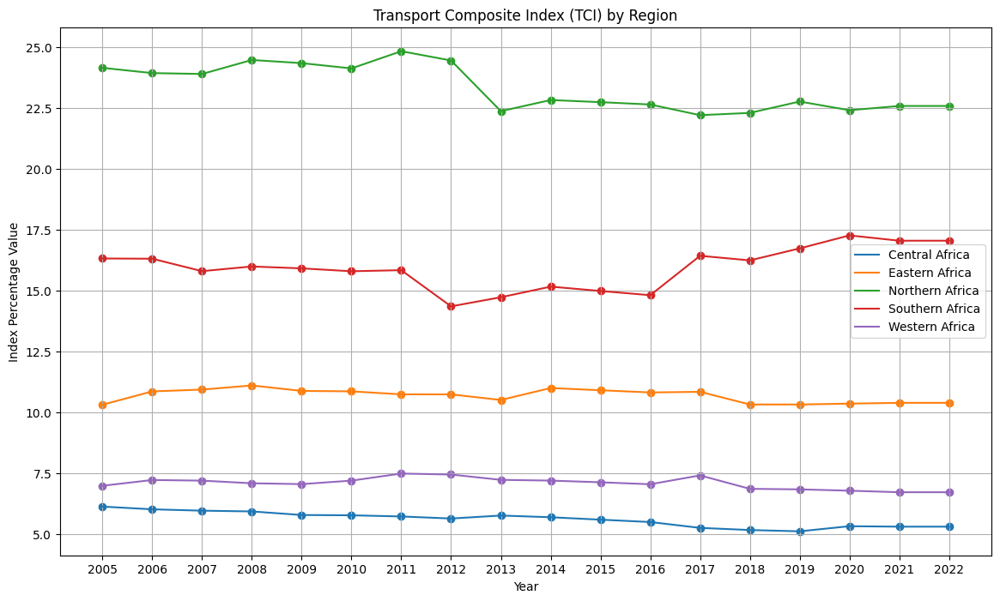

In [48]:
import matplotlib.pyplot as plt

# Plotting each region
fig, ax = plt.subplots(figsize=(14, 8))

for region in grouped_df.index:
    ax.plot(grouped_df.columns, grouped_df.loc[region], label=region)
    ax.scatter(grouped_df.columns, grouped_df.loc[region])  # Add data points

ax.set_title('Transport Composite Index (TCI) by Region')
ax.set_xlabel('Year')
ax.set_ylabel('Index Percentage Value')
ax.legend()

# Add grid
ax.grid(True)

plt.show()


## TCI Region Report

Comprehensive Report on Transport Composite Index (TCI) by Region in Africa

#### Introduction
This report analyzes the Transport Composite Index (TCI) trends across five regions of Africa from 2005 to 2022. The TCI serves as an indicator of transportation infrastructure development and efficiency in each region.

#### Overview of the Plot
The line graph displays TCI scores for Central, Eastern, Northern, Southern, and Western Africa over 18 years. The y-axis represents TCI values ranging from 5 to 25, while the x-axis shows the years from 2005 to 2022.

#### Analysis by Region

1. **Northern Africa (Green)**
   - **Trend:** Consistently highest TCI, slight decline post-2011
   - **Performance:** Maintained scores around 24-25 until 2011, then declined to about 22.5
   - **Key Insights:** Most developed transport infrastructure in Africa, but showing signs of stagnation or slight regression in recent years

2. **Southern Africa (Red)**
   - **Trend:** Second-highest TCI, with fluctuations
   - **Performance:** Started around 16, dipped to 14.5 in 2013, then rose to about 17 by 2022
   - **Key Insights:** Demonstrates resilience and recovery, possibly due to increased investments in recent years

3. **Eastern Africa (Orange)**
   - **Trend:** Stable with minor fluctuations
   - **Performance:** Consistently around 10-11 throughout the period
   - **Key Insights:** Shows steady but slow progress, indicating consistent but perhaps insufficient investment in transport infrastructure

4. **Western Africa (Purple)**
   - **Trend:** Relatively stable with slight decline
   - **Performance:** Fluctuated between 7-7.5, ending slightly lower than its starting point
   - **Key Insights:** Suggests challenges in maintaining and improving transport infrastructure

5. **Central Africa (Blue)**
   - **Trend:** Lowest TCI with a slight declining trend
   - **Performance:** Started around 6, ending just above 5
   - **Key Insights:** Indicates significant challenges in transport infrastructure development and maintenance

#### Comparative Analysis
- **Regional Disparities:** The graph clearly illustrates substantial differences in transport infrastructure across African regions. Northern Africa consistently outperforms other regions by a significant margin.
- **Stability vs. Volatility:** Northern and Eastern Africa show relatively stable trends, while Southern Africa exhibits more volatility. Central and Western Africa display slight declines.
- **Development Gaps:** The gap between the highest (Northern Africa) and lowest (Central Africa) performing regions remains large and relatively constant throughout the period.

#### Key Observations
1. **Northern Africa's Dominance:** Despite a recent decline, Northern Africa maintains a substantial lead in transport infrastructure, likely due to historical investments and geographical advantages.
2. **Southern Africa's Resilience:** The region shows the most positive trend in recent years, potentially reflecting increased focus on infrastructure development.
3. **Stagnation in Other Regions:** Eastern, Western, and Central Africa show limited progress, suggesting persistent challenges in transport infrastructure development.
4. **Post-2011 Changes:** Many regions show shifts in trends around 2011-2013, possibly reflecting broader economic or political changes affecting infrastructure investment.

#### Implications and Recommendations
1. **Targeted Investments:** Central and Western Africa require significant, targeted investments to improve their transport infrastructure.
2. **Maintaining Momentum:** Southern Africa should continue its recent positive trajectory with sustained investment and policy focus.
3. **Addressing Decline:** Northern Africa needs to address the factors causing recent decline to maintain its leading position.
4. **Regional Cooperation:** Increased inter-regional cooperation and knowledge sharing could help less developed regions improve their transport infrastructure more rapidly.
5. **Sustainable Development:** All regions should focus on sustainable transport solutions to ensure long-term improvement and maintenance of infrastructure.

#### Conclusion
The Transport Composite Index trends from 2005 to 2022 reveal a complex landscape of transportation infrastructure development across Africa. While Northern Africa maintains a clear lead, other regions show varying degrees of progress and challenges. The persistent gaps between regions highlight the need for targeted strategies, increased investments, and possibly greater regional cooperation to improve transport infrastructure across the continent. Addressing these disparities is crucial for fostering economic growth, improving connectivity, and enhancing overall development across Africa.

## ECI

Step 1: Define the Regions Dictionary

In [49]:
regions = {
    'Northern Africa': ['Algeria', 'Egypt', 'Libya', 'Morocco', 'Sudan', 'Tunisia'],
    'Western Africa': ['Benin', 'Burkina Faso', 'Cabo Verde', 'Cote d\'Ivoire', 'Gambia, The', 'Ghana',
                       'Guinea', 'Guinea-Bissau', 'Liberia', 'Mali', 'Mauritania', 'Niger', 'Nigeria',
                       'Senegal', 'Sierra Leone', 'Togo'],
    'Central Africa': ['Angola', 'Cameroon', 'Central African Republic', 'Chad', 'Congo, Rep.',
                       'Congo, Dem. Rep.', 'Equatorial Guinea', 'Gabon', 'Sao Tome and Principe'],
    'Eastern Africa': ['Burundi', 'Comoros', 'Djibouti', 'Eritrea', 'Ethiopia', 'Kenya', 'Madagascar',
                       'Malawi', 'Mauritius', 'Mozambique', 'Rwanda', 'Seychelles', 'Somalia',
                       'South Sudan', 'Tanzania', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Southern Africa': ['Botswana', 'Lesotho', 'Namibia', 'South Africa', 'eSwatini']
}


Step 2: Map Each Country to Its Region and Create a New DataFrame

In [50]:
import pandas as pd

# Assuming df is the original DataFrame for Aidi
df = datasets["Electricity"].reset_index()

# Create a reverse mapping from country to region
country_to_region = {country: region for region, countries in regions.items() for country in countries}

# Add the 'Region' column to a new DataFrame
df_eci = df.copy()
df_eci['Region'] = df_eci['Country'].map(country_to_region)

# Display the new DataFrame to verify
print(df_eci.head())


        Country   2005   2006   2007   2008   2009   2010   2011   2012  \
0       Algeria  14.54  15.37  15.70  17.01  17.41  18.10  19.17  20.13   
1        Angola   1.64   1.78   1.94   2.22   2.39   2.51   2.97   3.04   
2         Benin   0.29   0.30   0.33   0.44   0.61   0.75   0.39   0.20   
3      Botswana   8.18   1.03   9.31   8.95   9.41   5.81   5.02   3.74   
4  Burkina Faso   0.46   0.53   0.55   0.55   0.61   0.66   0.65   0.72   

    2013   2014   2015   2016   2017   2018   2019   2020   2021   2022  \
0  19.80  23.29  25.37  26.24  27.60  28.83  29.15  29.80  31.34  32.15   
1   3.84   3.84   3.93   5.10   5.82   5.79   5.94   5.89   5.85   5.81   
2   0.22   0.22   0.22   0.23   0.34   0.48   0.49   0.46   0.44   0.43   
3   3.55   5.73  18.41  15.43  18.52  23.29  20.70  20.56  20.36  20.20   
4   0.55   0.58   0.43   0.66   0.69   1.61   1.65   1.70   2.00   2.08   

            Region  
0  Northern Africa  
1   Central Africa  
2   Western Africa  
3  Southern Af

Step 3: Select Only Numeric Columns and Group by 'Region'

In [51]:
# Select only the numeric columns
numeric_columns = df_eci.select_dtypes(include='number').columns

# Group by 'Region' and calculate the mean for each region
grouped_df = df_eci.groupby('Region')[numeric_columns].mean()

# Display the grouped DataFrame to verify
print(grouped_df)


                      2005       2006       2007       2008       2009  \
Region                                                                   
Central Africa    3.431111   3.356667   3.614444   3.374444   3.544444   
Eastern Africa    6.577778   6.602222   6.782778   6.976667   7.328333   
Northern Africa  19.650000  20.315000  21.278333  23.286667  24.523333   
Southern Africa  20.256000  19.314000  21.244000  21.686000  22.216000   
Western Africa    2.118125   2.021250   2.098125   2.238750   2.321875   

                      2010       2011       2012       2013       2014  \
Region                                                                   
Central Africa    3.857778   3.890000   3.828889   4.636667   4.846667   
Eastern Africa    7.533333   7.480000   7.683333   7.930000   9.553889   
Northern Africa  25.571667  26.816667  28.273333  29.721667  27.295000   
Southern Africa  21.944000  21.142000  20.432000  20.952000  21.258000   
Western Africa    2.332500   2.388750

Step 4: Plot the Data

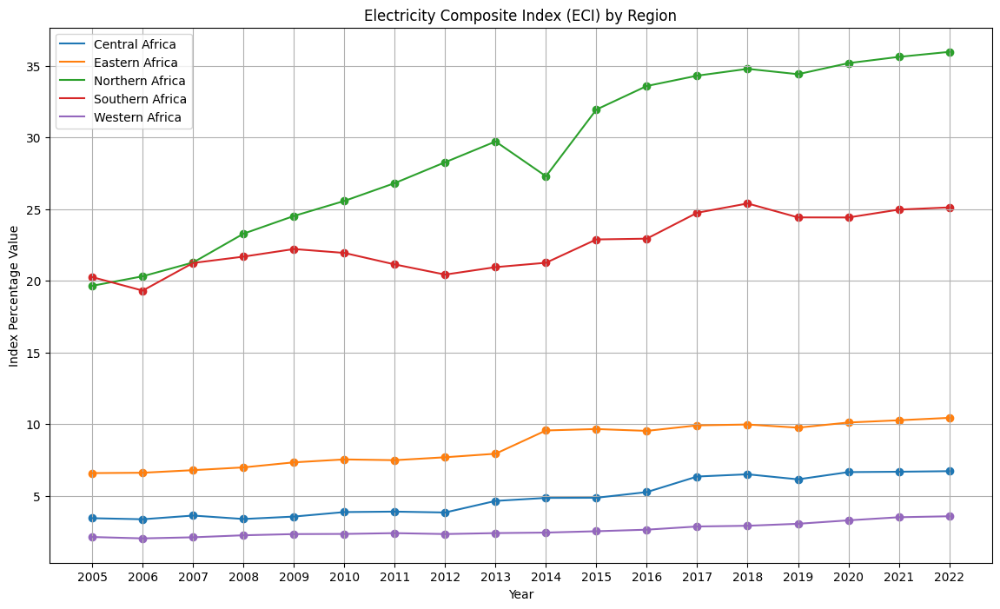

In [52]:
import matplotlib.pyplot as plt

# Plotting each region
fig, ax = plt.subplots(figsize=(14, 8))

for region in grouped_df.index:
    ax.plot(grouped_df.columns, grouped_df.loc[region], label=region)
    ax.scatter(grouped_df.columns, grouped_df.loc[region])  # Add data points

ax.set_title('Electricity Composite Index (ECI) by Region')
ax.set_xlabel('Year')
ax.set_ylabel('Index Percentage Value')
ax.legend()

# Add grid
ax.grid(True)

plt.show()


## ECI Region Report


Introduction
This report analyzes the Electricity Composite Index (ECI) trends across five regions of Africa from 2005 to 2022. The ECI serves as an indicator of electricity infrastructure development and access in each region.

Overview of the Plot
The line graph displays ECI scores for Central, Eastern, Northern, Southern, and Western Africa over 18 years. The y-axis represents ECI values ranging from 0 to 40, while the x-axis shows the years from 2005 to 2022.

Analysis by Region
Northern Africa (Green)

Trend: Consistently highest ECI, strong upward trajectory
Performance: Started around 20 in 2005, reached about 36 by 2022
Key Insights: Most developed electricity infrastructure in Africa, showing rapid and substantial growth with some fluctuations

Southern Africa (Red)

Trend: Second-highest ECI, steady upward trend
Performance: Began at about 20 in 2005, increased to approximately 25 by 2022
Key Insights: Demonstrates consistent improvement, though at a more moderate pace than Northern Africa

Eastern Africa (Orange)

Trend: Gradual but consistent growth
Performance: Started at about 6 in 2005, reached around 10 by 2022
Key Insights: Shows steady progress, with a notable jump between 2013 and 2014

Central Africa (Blue)

Trend: Slow but consistent growth
Performance: Began just above 3 in 2005, increased to about 6 by 2022
Key Insights: Displays the slowest growth rate among all regions, indicating significant challenges in electricity sector development

Western Africa (Purple)

Trend: Very gradual improvement
Performance: Started at about 2 in 2005, reached approximately 3.5 by 2022
Key Insights: Has the lowest ECI values throughout the entire period, suggesting major obstacles in electricity infrastructure development

Comparative Analysis
Regional Disparities: The graph illustrates substantial differences in electricity infrastructure across African regions. Northern Africa significantly outperforms other regions, with the gap widening over time.
Growth Rates: Northern Africa shows the most rapid improvement, while Central and Western Africa display much slower progress.
Clustering: Eastern, Central, and Western Africa remain clustered at lower ECI values, with minimal separation between them.

Key Observations
Northern Africa's Surge: The region demonstrates dramatic improvement, potentially reflecting successful energy policies or substantial investments.
Southern Africa's Steady Progress: Maintains a consistent second position, showing reliable but slower growth compared to Northern Africa.
Lower-Performing Regions: Despite overall growth, Central, Western, and Eastern Africa still lag significantly behind by 2022.
Regional Shifts: Some regions show noticeable changes in trend around 2013-2014, possibly indicating policy changes or investment initiatives.

Implications and Recommendations
Targeted Investments: Central and Western Africa require significant, focused investments to improve their electricity infrastructure.
Sustainable Growth: Northern Africa should focus on maintaining its growth trajectory and potentially share best practices with other regions.
Regional Cooperation: Increased inter-regional cooperation could help less developed regions improve their electricity sector more rapidly.
Policy Focus: All regions, especially those lagging, should prioritize policies that attract investment and improve electricity access and reliability.
Addressing Disparities: Efforts to bridge the widening gap between top and bottom performers are crucial for balanced continental development.

Conclusion
The Electricity Composite Index trends from 2005 to 2022 reveal a diverse landscape of electricity infrastructure development across Africa. While Northern Africa shows remarkable progress, other regions, particularly Central and Western Africa, face significant challenges. The persistent and widening gaps between regions highlight the need for targeted strategies, increased investments, and possibly greater regional cooperation to improve electricity infrastructure across the continent. Addressing these disparities is crucial for fostering economic growth, improving quality of life, and enhancing overall development across Africa."

## ICI

Step 1: Define the Regions Dictionary

In [53]:
regions = {
    'Northern Africa': ['Algeria', 'Egypt', 'Libya', 'Morocco', 'Sudan', 'Tunisia'],
    'Western Africa': ['Benin', 'Burkina Faso', 'Cabo Verde', 'Cote d\'Ivoire', 'Gambia, The', 'Ghana',
                       'Guinea', 'Guinea-Bissau', 'Liberia', 'Mali', 'Mauritania', 'Niger', 'Nigeria',
                       'Senegal', 'Sierra Leone', 'Togo'],
    'Central Africa': ['Angola', 'Cameroon', 'Central African Republic', 'Chad', 'Congo, Rep.',
                       'Congo, Dem. Rep.', 'Equatorial Guinea', 'Gabon', 'Sao Tome and Principe'],
    'Eastern Africa': ['Burundi', 'Comoros', 'Djibouti', 'Eritrea', 'Ethiopia', 'Kenya', 'Madagascar',
                       'Malawi', 'Mauritius', 'Mozambique', 'Rwanda', 'Seychelles', 'Somalia',
                       'South Sudan', 'Tanzania', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Southern Africa': ['Botswana', 'Lesotho', 'Namibia', 'South Africa', 'eSwatini']
}


Step 2: Map Each Country to Its Region and Create a New DataFrame

In [54]:
import pandas as pd

# Assuming df is the original DataFrame for Aidi
df = datasets["Ict"].reset_index()

# Create a reverse mapping from country to region
country_to_region = {country: region for region, countries in regions.items() for country in countries}

# Add the 'Region' column to a new DataFrame
df_ici = df.copy()
df_ici['Region'] = df_ici['Country'].map(country_to_region)

# Display the new DataFrame to verify
print(df_ici.head())


        Country  2005  2006  2007  2008  2009  2010  2011   2012   2013  \
0       Algeria  0.01  0.02  0.02  0.11  0.17  0.40  7.57  10.60  11.88   
1        Angola  0.00  0.00  0.00  0.01  0.04  0.09  1.77   2.36   3.01   
2         Benin  0.00  0.00  0.00  0.01  0.03  0.08  2.27   3.56   5.50   
3      Botswana  0.01  0.01  0.01  0.06  0.10  0.24  5.35   6.96   9.20   
4  Burkina Faso  0.00  0.00  0.00  0.01  0.02  0.05  1.18   1.62   2.74   

    2014   2015   2016   2017   2018   2019   2020   2021   2022  \
0  13.78  16.17  18.34  23.22  28.79  34.03  32.18  32.07  34.08   
1   3.97   5.21   6.11   9.83  11.95  12.08  11.45  12.13  12.82   
2   6.69   7.65   8.97   8.97  11.33  11.22  10.46  13.76  15.34   
3  12.72  15.96  20.54  24.59  25.80  28.37  24.00  28.52  31.30   
4   3.84   5.18   6.24   7.31   8.75  10.36  11.08  12.27  13.93   

            Region  
0  Northern Africa  
1   Central Africa  
2   Western Africa  
3  Southern Africa  
4   Western Africa  


Step 3: Select Only Numeric Columns and Group by 'Region'

In [55]:
# Select only the numeric columns
numeric_columns = df_ici.select_dtypes(include='number').columns

# Group by 'Region' and calculate the mean for each region
grouped_df = df_ici.groupby('Region')[numeric_columns].mean()

# Display the grouped DataFrame to verify
print(grouped_df)


                     2005      2006      2007      2008      2009      2010  \
Region                                                                        
Central Africa   0.002222  0.002222  0.005556  0.025556  0.046667  0.104444   
Eastern Africa   0.052222  0.053889  0.057778  0.085000  0.116667  0.196111   
Northern Africa  0.010000  0.018333  0.030000  0.133333  0.226667  0.498333   
Southern Africa  0.006000  0.010000  0.018000  0.062000  0.108000  0.222000   
Western Africa   0.001250  0.001250  0.005625  0.021250  0.043750  0.111250   

                     2011       2012       2013       2014       2015  \
Region                                                                  
Central Africa   2.157778   3.033333   4.152222   5.537778   6.686667   
Eastern Africa   2.957778   3.995000   5.266111   6.629444   7.996667   
Northern Africa  8.108333  11.103333  14.521667  16.445000  17.858333   
Southern Africa  6.236000   8.278000  11.550000  15.180000  17.642000   
Western 

Step 4: Plot the Data

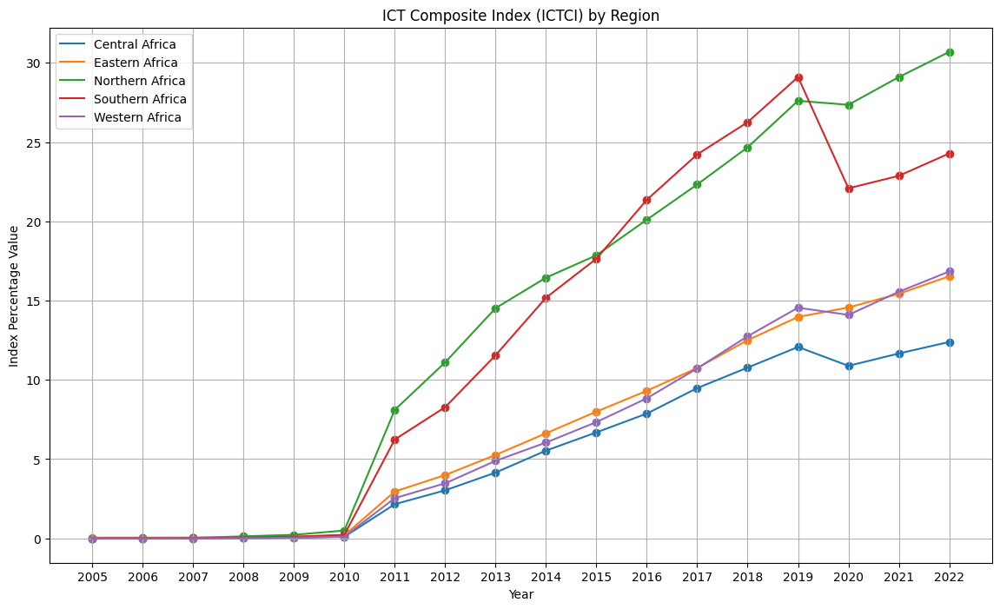

In [56]:
import matplotlib.pyplot as plt

# Plotting each region
fig, ax = plt.subplots(figsize=(14, 8))

for region in grouped_df.index:
    ax.plot(grouped_df.columns, grouped_df.loc[region], label=region)
    ax.scatter(grouped_df.columns, grouped_df.loc[region])  # Add data points

ax.set_title('ICT Composite Index (ICTCI) by Region')
ax.set_xlabel('Year')
ax.set_ylabel('Index Percentage Value')
ax.legend()

# Add grid
ax.grid(True)

plt.show()


## ICI Region Report


Introduction

This report analyzes the ICT Composite Index (ICTCI) trends across five regions of Africa from 2005 to 2022. The ICTCI serves as an indicator of information and communication technology infrastructure development and adoption in each region.

Overview of the Plot
The line graph displays ICTCI scores for Central, Eastern, Northern, Southern, and Western Africa over 18 years. The y-axis represents ICTCI values ranging from 0 to 35, while the x-axis shows the years from 2005 to 2022.

Analysis by Region
Northern Africa (Green)

Trend: Rapid growth starting from 2010, becoming highest ICTCI by 2022
Performance: Near zero until 2010, then steep rise to about 31 by 2022
Key Insights: Demonstrates dramatic improvement in ICT infrastructure and adoption since 2010

Southern Africa (Red)

Trend: Rapid growth from 2010, with a sharp decline in 2019
Performance: Near zero until 2010, peaked at about 29 in 2018, then dropped to around 24 by 2022
Key Insights: Shows strong development but faces recent challenges or policy changes affecting ICT sector

Eastern Africa (Orange)

Trend: Steady growth from 2010
Performance: Near zero until 2010, then gradual increase to about 16 by 2022
Key Insights: Consistent improvement in ICT infrastructure, though at a slower pace than Northern and Southern Africa

Western Africa (Purple)

Trend: Similar to Eastern Africa, steady growth from 2010
Performance: Near zero until 2010, then gradual increase to about 16 by 2022
Key Insights: Mirrors Eastern Africa's development pattern in ICT sector

Central Africa (Blue)

Trend: Slowest growth among all regions
Performance: Near zero until 2010, then slow increase to about 12 by 2022
Key Insights: Lags behind other regions, indicating challenges in ICT development and adoption

Comparative Analysis

Pre-2010 Stagnation: All regions show near-zero ICTCI values until 2010, suggesting a continental shift in ICT focus or measurement methodology from this year.
Divergent Growth Rates: Post-2010, regions show significantly different growth rates, with Northern and Southern Africa outpacing others.
Recent Convergence: By 2022, Eastern and Western Africa have nearly identical ICTCI values, while Central Africa lags slightly behind.

Key Observations

2010 Turning Point: A dramatic change occurs across all regions in 2010, potentially indicating policy shifts, increased investments, or changes in index calculation.
Northern Africa's Rise: From 2010, Northern Africa shows the most consistent and rapid growth, overtaking Southern Africa by 2022.
Southern Africa's Volatility: Rapid growth followed by a sharp decline in 2019 suggests significant changes in the region's ICT landscape.
Regional Clustering: By 2022, three distinct tiers emerge: Northern Africa at the top, Southern Africa in the middle, and the remaining regions clustered at a lower level.

Implications and Recommendations

Investment Focus: Central Africa requires significant investment and policy attention to catch up with other regions.
Stability Measures: Southern Africa should investigate and address factors causing recent decline to regain its growth trajectory.
Sustainable Growth: Northern Africa should focus on maintaining its growth momentum and potentially share best practices with other regions.
Regional Cooperation: Increased inter-regional cooperation could help less developed regions accelerate their ICT sector growth.
Digital Divide: Efforts to bridge the growing gap between top and bottom performers are crucial for balanced continental development.

Conclusion

The ICT Composite Index trends from 2005 to 2022 reveal a dynamic landscape of ICT development across Africa, with a clear turning point in 2010. While Northern Africa has shown remarkable progress, other regions, particularly Central Africa, face significant challenges. The divergent growth rates and recent changes highlight the need for targeted strategies, increased investments, and regional cooperation to improve ICT infrastructure and adoption across the continent. Addressing these disparities is crucial for fostering economic growth, enhancing connectivity, and promoting overall development across Africa."

## WSSCI

Step 1: Define the Regions Dictionary

In [57]:
regions = {
    'Northern Africa': ['Algeria', 'Egypt', 'Libya', 'Morocco', 'Sudan', 'Tunisia'],
    'Western Africa': ['Benin', 'Burkina Faso', 'Cabo Verde', 'Cote d\'Ivoire', 'Gambia, The', 'Ghana',
                       'Guinea', 'Guinea-Bissau', 'Liberia', 'Mali', 'Mauritania', 'Niger', 'Nigeria',
                       'Senegal', 'Sierra Leone', 'Togo'],
    'Central Africa': ['Angola', 'Cameroon', 'Central African Republic', 'Chad', 'Congo, Rep.',
                       'Congo, Dem. Rep.', 'Equatorial Guinea', 'Gabon', 'Sao Tome and Principe'],
    'Eastern Africa': ['Burundi', 'Comoros', 'Djibouti', 'Eritrea', 'Ethiopia', 'Kenya', 'Madagascar',
                       'Malawi', 'Mauritius', 'Mozambique', 'Rwanda', 'Seychelles', 'Somalia',
                       'South Sudan', 'Tanzania', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Southern Africa': ['Botswana', 'Lesotho', 'Namibia', 'South Africa', 'eSwatini']
}


Step 2: Map Each Country to Its Region and Create a New DataFrame

In [58]:
import pandas as pd

# Assuming df is the original DataFrame for Aidi
df = datasets["Water"].reset_index()

# Create a reverse mapping from country to region
country_to_region = {country: region for region, countries in regions.items() for country in countries}

# Add the 'Region' column to a new DataFrame
df_wssci = df.copy()
df_wssci['Region'] = df_wssci['Country'].map(country_to_region)

# Display the new DataFrame to verify
print(df_wssci.head())


        Country   2005   2006   2007   2008   2009   2010   2011   2012  \
0       Algeria  93.62  93.92  94.22  94.59  94.89  95.19  95.52  95.82   
1        Angola  46.01  47.34  48.58  49.88  50.92  51.87  52.76  53.75   
2         Benin  41.26  42.21  43.16  44.12  45.05  45.69  46.43  47.09   
3      Botswana  78.64  79.39  80.20  81.00  81.73  82.63  83.67  84.57   
4  Burkina Faso  39.74  41.11  42.53  44.00  45.41  46.66  47.88  49.10   

    2013   2014   2015   2016   2017   2018   2019   2020   2021   2022  \
0  96.07  96.34  96.59  96.85  97.10  97.31  97.32  97.37  97.79  98.00   
1  54.66  55.53  56.34  57.19  58.01  58.83  59.59  60.30  61.04  61.43   
2  47.61  48.43  49.12  49.79  50.36  50.99  51.62  52.18  52.78  53.29   
3  85.46  86.44  87.17  87.92  88.56  89.26  89.83  90.43  91.02  91.60   
4  51.00  52.51  53.92  55.19  56.56  57.78  58.99  60.33  61.51  62.79   

            Region  
0  Northern Africa  
1   Central Africa  
2   Western Africa  
3  Southern Af

Step 3: Select Only Numeric Columns and Group by 'Region'

In [59]:
# Select only the numeric columns
numeric_columns = df_wssci.select_dtypes(include='number').columns

# Group by 'Region' and calculate the mean for each region
grouped_df = df_wssci.groupby('Region')[numeric_columns].mean()

# Display the grouped DataFrame to verify
print(grouped_df)


                      2005       2006       2007       2008       2009  \
Region                                                                   
Central Africa   47.150000  47.938889  48.795556  49.623333  50.474444   
Eastern Africa   44.535000  45.603333  46.683889  47.813333  48.939444   
Northern Africa  79.161667  79.701667  80.246667  81.141667  82.050000   
Southern Africa  63.854000  64.972000  66.120000  67.238000  68.374000   
Western Africa   44.494375  45.770625  47.072500  48.386250  49.693125   

                      2010       2011       2012       2013       2014  \
Region                                                                   
Central Africa   51.305556  52.121111  52.981111  53.813333  54.751111   
Eastern Africa   49.950000  51.131667  52.292778  53.471667  54.739444   
Northern Africa  82.943333  83.858333  84.761667  85.638333  86.580000   
Southern Africa  69.494000  70.686000  71.826000  72.940000  74.144000   
Western Africa   50.978750  52.256875

Step 4: Plot the Data

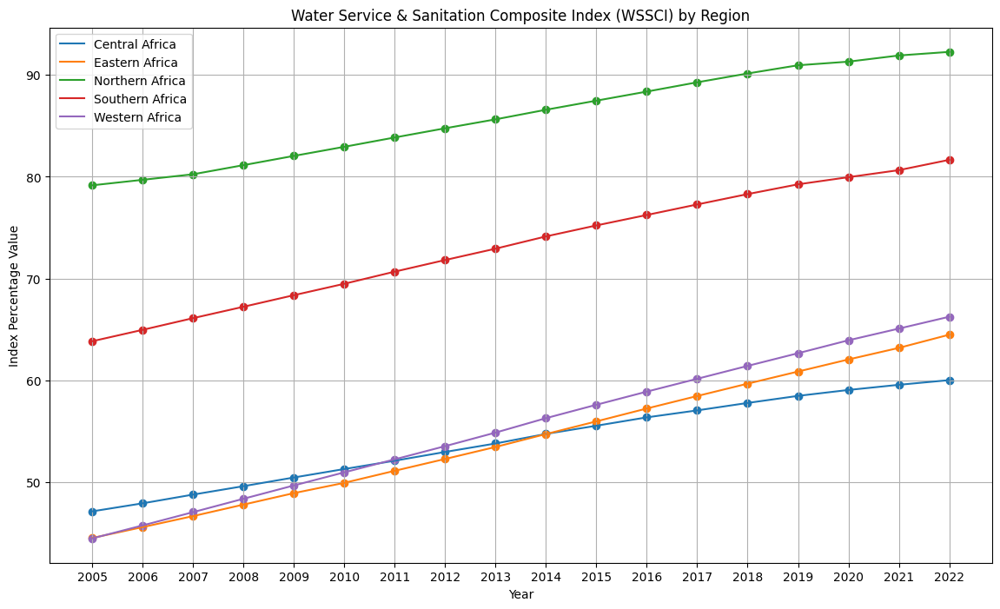

In [60]:
import matplotlib.pyplot as plt

# Plotting each region
fig, ax = plt.subplots(figsize=(14, 8))

for region in grouped_df.index:
    ax.plot(grouped_df.columns, grouped_df.loc[region], label=region)
    ax.scatter(grouped_df.columns, grouped_df.loc[region])  # Add data points

ax.set_title('Water Service & Sanitation Composite Index (WSSCI) by Region')
ax.set_xlabel('Year')
ax.set_ylabel('Index Percentage Value')
ax.legend()

# Add grid
ax.grid(True)

plt.show()


## WSSCI Region Report

Introduction

This report analyzes the Water Service & Sanitation Composite Index (WSSCI) trends across five regions of Africa from 2005 to 2022. The WSSCI serves as an indicator of water and sanitation infrastructure development and access in each region.

Overview of the Plot

The line graph displays WSSCI scores for Central, Eastern, Northern, Southern, and Western Africa over 18 years. The y-axis represents WSSCI values ranging from 45 to 95, while the x-axis shows the years from 2005 to 2022.

Analysis by Region
Northern Africa (Green)

Trend: Consistently highest WSSCI, steady upward trajectory
Performance: Started around 79 in 2005, reached about 93 by 2022
Key Insights: Most developed water and sanitation infrastructure in Africa, showing continuous improvement

Southern Africa (Red)

Trend: Second-highest WSSCI, steady upward trend
Performance: Began at about 64 in 2005, increased to approximately 82 by 2022
Key Insights: Demonstrates consistent improvement, narrowing the gap with Northern Africa

Western Africa (Purple)

Trend: Started lowest, showed significant improvement
Performance: Began around 44 in 2005, reached about 66 by 2022
Key Insights: Most improved region, overtaking Eastern and Central Africa by 2022

Central Africa (Blue)

Trend: Slow but steady growth
Performance: Started at about 47 in 2005, increased to about 60 by 2022
Key Insights: Consistent improvement, but remained among the lower-performing regions

Eastern Africa (Orange)

Trend: Similar to Central Africa, steady growth
Performance: Began at about 45 in 2005, reached approximately 64 by 2022
Key Insights: Showed consistent improvement, slightly outperforming Central Africa by 2022

Comparative Analysis

Regional Disparities: Clear hierarchy with Northern Africa leading, followed by Southern Africa, and then a cluster of the other three regions.
Growth Rates: All regions show positive trends, with Western Africa demonstrating the most rapid improvement relative to its starting point.
Convergence: While disparities persist, there's a slight convergence trend as lower-performing regions grow at a faster rate.

Key Observations

Northern Africa's Dominance: Maintains a significant lead throughout the period, indicating long-term investment in water and sanitation infrastructure.
Southern Africa's Consistent Progress: Steady improvement, potentially reflecting sustained policy focus and investment.
Western Africa's Rapid Improvement: Most notable progress among the lower-performing regions, suggesting effective interventions or policies.
Narrowing Gaps: While significant disparities remain, the gap between top and bottom performers has slightly decreased over time.

Implications and Recommendations

Targeted Investments: Central and Eastern Africa require continued focus and investment to catch up with other regions.
Sustainable Growth: Northern and Southern Africa should maintain their momentum and potentially share best practices with other regions.
Replicating Success: Investigate and potentially replicate Western Africa's successful strategies in other regions.
Regional Cooperation: Increased inter-regional cooperation could help accelerate improvements in lower-performing areas.
Holistic Approach: Link water and sanitation improvements to broader development goals for maximum impact.

Conclusion

The Water Service & Sanitation Composite Index trends from 2005 to 2022 reveal steady improvement across all African regions, albeit at different rates. While Northern and Southern Africa maintain their lead, the significant progress in Western Africa is particularly noteworthy. Despite overall positive trends, substantial disparities persist, highlighting the need for continued investment, policy focus, and regional cooperation. Improving water and sanitation infrastructure remains crucial for public health, economic development, and quality of life across the continent."

# Index Correlation

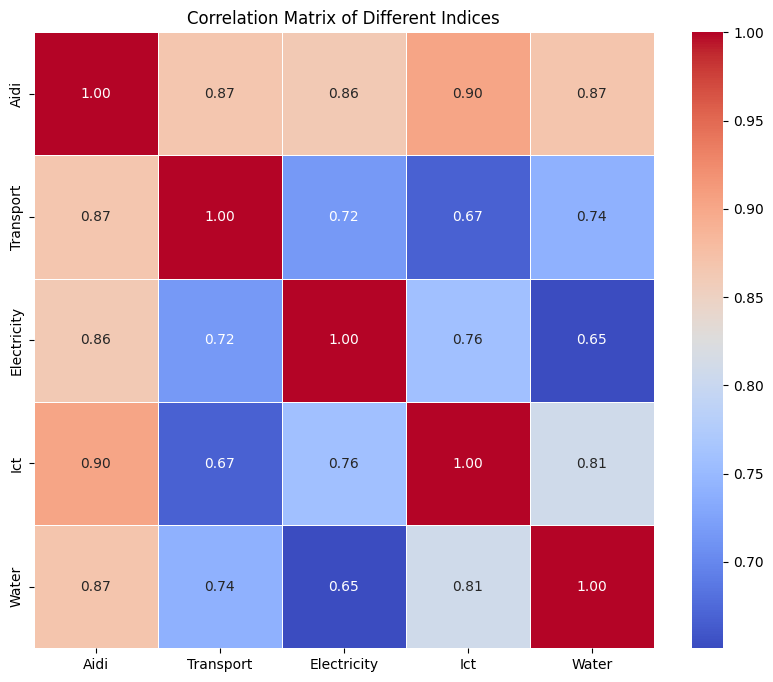

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def calculate_correlations(datasets):
    # Create an empty DataFrame to store the mean values for each index
    combined_df = pd.DataFrame()

    # Calculate the mean values for each index and add them to the combined DataFrame
    for name, df in datasets.items():
        combined_df[name] = df.mean(axis=1)

    # Calculate the correlation matrix for the combined DataFrame
    correlation_matrix = combined_df.corr()

    return correlation_matrix

def plot_correlation_heatmap(correlation_matrix):
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title('Correlation Matrix of Different Indices')
    plt.show()

# Example usage
datasets = {
    'Aidi': Aidi,
    'Transport': Transport,
    'Electricity': Electricity,
    'Ict': Ict,
    'Water': Water
}

correlation_matrix = calculate_correlations(datasets)
plot_correlation_heatmap(correlation_matrix)


## Correlation Report



#### 1. **Introduction**
The heatmap displays the correlation coefficients between different indices of infrastructure development in Africa: AIDI, Transport, Electricity, ICT, and Water. These indices are critical components of the overall infrastructure landscape and understanding their interrelationships is crucial for informed policy-making and strategic investments.

#### 2. **Correlation Matrix Analysis**
The correlation matrix is as follows:

|          | AIDI | Transport | Electricity | ICT | Water |
|----------|------|-----------|-------------|-----|-------|
| **AIDI** | 1.00 | 0.87      | 0.86        | 0.90| 0.87  |
| **Transport** | 0.87 | 1.00      | 0.72        | 0.67| 0.74  |
| **Electricity** | 0.86 | 0.72      | 1.00        | 0.76| 0.65  |
| **ICT**  | 0.90 | 0.67      | 0.76        | 1.00| 0.81  |
| **Water**| 0.87 | 0.74      | 0.65        | 0.81| 1.00  |

#### 3. **Key Insights**
1. **High Correlation Between AIDI and ICT (0.90)**
   - **Insight**: This strong correlation suggests that improvements in ICT infrastructure significantly contribute to overall infrastructure development. Investments in ICT could be a key driver for enhancing other infrastructure components.

2. **High Correlation Between AIDI and Transport (0.87)**
   - **Insight**: The high correlation indicates that transport infrastructure is closely linked to overall infrastructure development. Efficient transport systems are vital for economic activities and accessibility, impacting the AIDI positively.

3. **High Correlation Between AIDI and Water (0.87)**
   - **Insight**: This suggests that access to water and sanitation services is a crucial factor in overall infrastructure development. Adequate water infrastructure is essential for public health and economic productivity.

4. **Moderate to High Correlation Between AIDI and Electricity (0.86)**
   - **Insight**: This indicates that electricity infrastructure is also a significant component of overall infrastructure development. Reliable electricity supply is fundamental for economic growth and quality of life.

5. **Moderate Correlation Between Transport and Other Indices**
   - **Insight**: The correlation between transport and other indices such as Electricity (0.72) and ICT (0.67) is moderate. This suggests that while transport is important, its development may not always directly imply improvements in other infrastructure sectors.

6. **ICT and Water (0.81)**
   - **Insight**: The strong correlation between ICT and Water indicates that advancements in ICT can enhance water and sanitation services, possibly through smart management systems and better resource allocation.

#### 4. **Recommendations**
1. **Prioritize ICT Development**: Given its high correlation with AIDI, enhancing ICT infrastructure should be a priority. Policies and investments aimed at improving digital connectivity can have a broad impact on overall infrastructure development.
2. **Integrate Transport and Water Initiatives**: Since transport and water indices also show high correlations with AIDI, integrated infrastructure projects that address both transport and water supply can yield substantial benefits.
3. **Focus on Electricity Infrastructure**: While its correlation with AIDI is slightly lower than ICT and Transport, electricity remains a critical component. Efforts to expand and stabilize electricity supply should continue to be a focus.

#### 5. **Conclusion**
The correlation analysis reveals significant interdependencies between different infrastructure indices. ICT, Transport, and Water infrastructure, in particular, show strong correlations with overall infrastructure development as measured by AIDI. These insights can guide policymakers and stakeholders in prioritizing investments and strategies to achieve balanced and sustainable infrastructure growth across Africa.

---



# Benchmark Analysis and Cumulative Deficit Tracking

The `benchmark` variable represents an expected or target value for year-over-year progress. This value serves as a reference point against which the actual progress of each country can be measured. In the context of the provided code, a benchmark value of `0.5` means that it is expected each country will make a 0.5 unit improvement each year in the respective index.

Here's a more detailed explanation of the benchmark's role:

1. **Expected Progress Calculation**:
   - For each year in the specified period, the expected cumulative progress is calculated by multiplying the benchmark value by the number of years elapsed. For instance, after one year, the expected progress is `0.5 * 1 = 0.5`; after two years, it is `0.5 * 2 = 1.0`, and so on.

2. **Comparison with Actual Progress**:
   - The actual year-over-year progress of each country is calculated from the data.
   - The cumulative progress for each country over the specified period is then compared against the expected progress (based on the benchmark) to determine the cumulative deficit.

3. **Cumulative Deficit**:
   - The cumulative deficit for each country is calculated by subtracting the actual cumulative progress from the expected cumulative progress.
   - Positive deficits indicate that the country has fallen short of the benchmark.

### Why a Benchmark?
The use of a benchmark is essential for assessing progress in a standardized manner. It allows for the comparison of actual progress against an expected target, which is crucial for identifying infrastructure deficits. The benchmark value can be adjusted based on specific goals or historical trends in infrastructure development.

### Example:
If we consider the `benchmark` value to be `0.5`:
- In the first year, the expected cumulative progress is `0.5`.
- In the second year, the expected cumulative progress is `1.0`.
- In the tenth year, the expected cumulative progress is `5.0`.

If a country's actual cumulative progress in the tenth year is `3.0`, the deficit is calculated as:
\[ \text{Deficit} = \text{Expected Progress} - \text{Actual Progress} = 5.0 - 3.0 = 2.0 \]

### Adjusting the Benchmark
You can adjust the benchmark value based on your research objectives or historical performance data. For instance, if historical data suggests that a more realistic year-over-year progress rate is `X`, you can set `benchmark = x`.




Analyzing Aidi Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                       18.081765                High Progress   
Angola                         7.060588                 Low Progress   
Benin                          4.679412            Very Low Progress   
Botswana                       5.368824                 Low Progress   
Burkina Faso                   3.390588            Very Low Progress   
Burundi                        0.552941            Very Low Progress   
Cabo Verde                    15.368824                High Progress   
Cameroon                       5.041176                 Low Progress   
Central African Republic       2.897647            Very Low Progress   
Chad                           2.807059            Very Low Progress   
Comoros                        3.125294            Very Low Progres

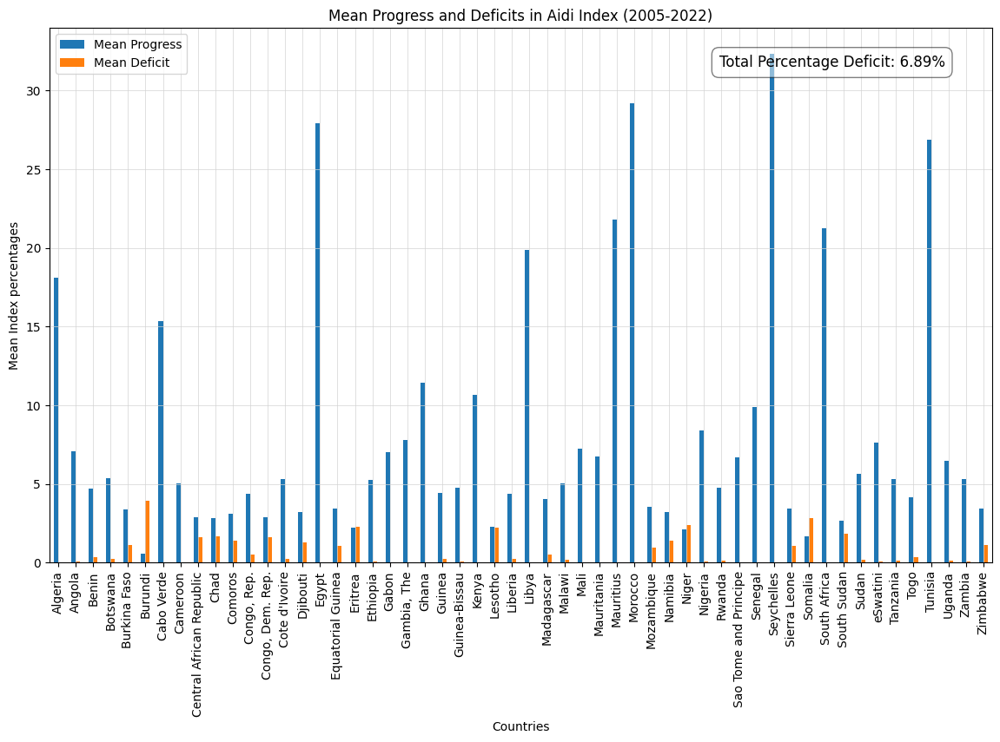


Analyzing Transport Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                        1.425882            Very Low Progress   
Angola                         0.060000            Very Low Progress   
Benin                         -2.014118   Marginal Negative Progress   
Botswana                      -0.298824   Marginal Negative Progress   
Burkina Faso                  -1.384118   Marginal Negative Progress   
Burundi                       -2.423529   Marginal Negative Progress   
Cabo Verde                    -1.693529   Marginal Negative Progress   
Cameroon                      -1.077647   Marginal Negative Progress   
Central African Republic       0.315294            Very Low Progress   
Chad                           0.056471            Very Low Progress   
Comoros                       -1.699412   Marginal Negative Pr

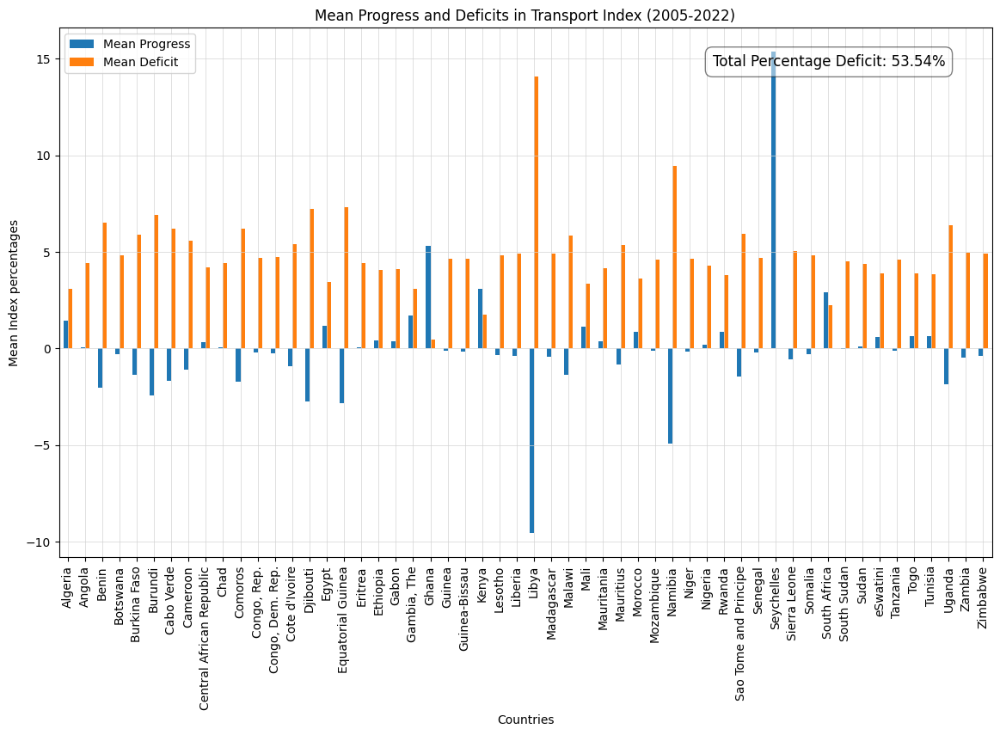


Analyzing Electricity Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                        8.781176                 Low Progress   
Angola                         2.398824            Very Low Progress   
Benin                          0.095294            Very Low Progress   
Botswana                       4.174118            Very Low Progress   
Burkina Faso                   0.494118            Very Low Progress   
Burundi                       -0.019412   Marginal Negative Progress   
Cabo Verde                     4.094706            Very Low Progress   
Cameroon                       1.290000            Very Low Progress   
Central African Republic       0.013529            Very Low Progress   
Chad                           0.078235            Very Low Progress   
Comoros                        0.419412            Very Low 

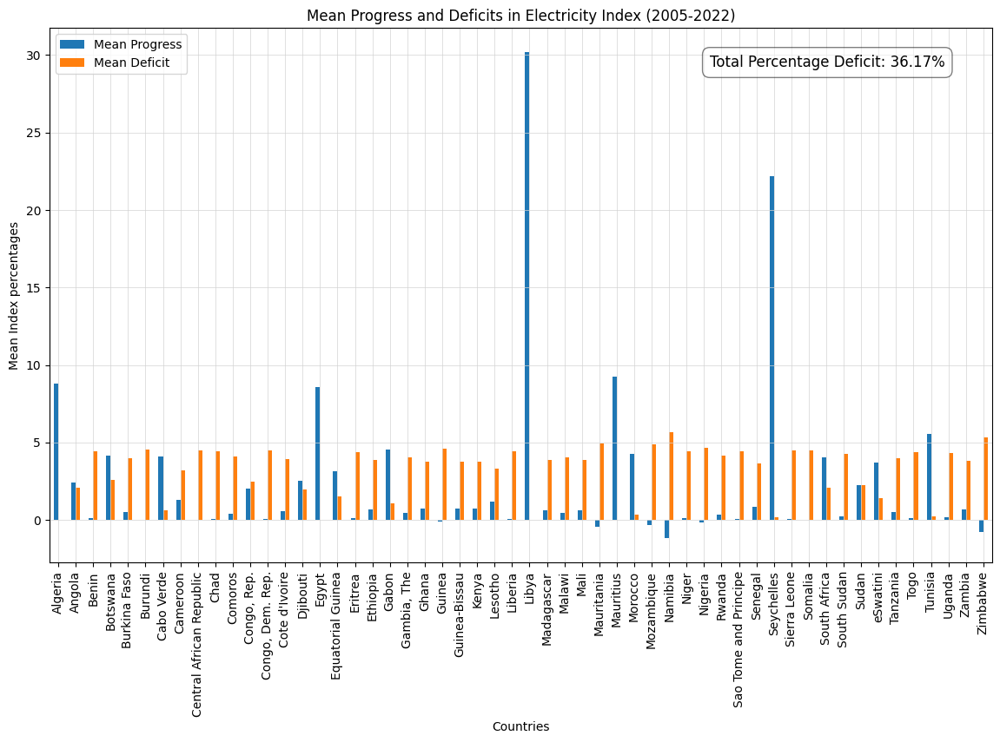


Analyzing Ict Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                       15.485882                High Progress   
Angola                         5.460588                 Low Progress   
Benin                          6.225882                 Low Progress   
Botswana                      13.738824            Moderate Progress   
Burkina Faso                   4.975294            Very Low Progress   
Burundi                        2.387059            Very Low Progress   
Cabo Verde                    14.920588            Moderate Progress   
Cameroon                       6.574706                 Low Progress   
Central African Republic       1.888824            Very Low Progress   
Chad                           2.586471            Very Low Progress   
Comoros                        3.757647            Very Low Progress

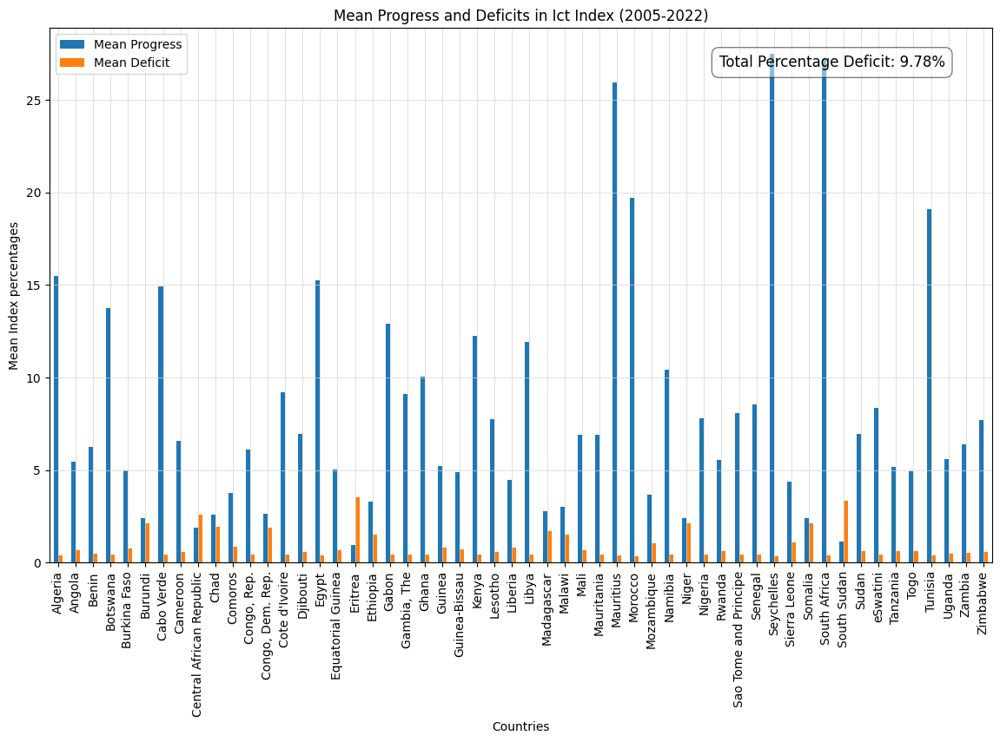


Analyzing Water Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                        2.550000            Very Low Progress   
Angola                         9.167647                 Low Progress   
Benin                          6.970588                 Low Progress   
Botswana                       7.294118                 Low Progress   
Burkina Faso                  12.452353            Moderate Progress   
Burundi                        6.177059                 Low Progress   
Cabo Verde                    13.300000            Moderate Progress   
Cameroon                       5.712941                 Low Progress   
Central African Republic      -0.329412   Marginal Negative Progress   
Chad                           5.538235                 Low Progress   
Comoros                        6.747647                 Low Progre

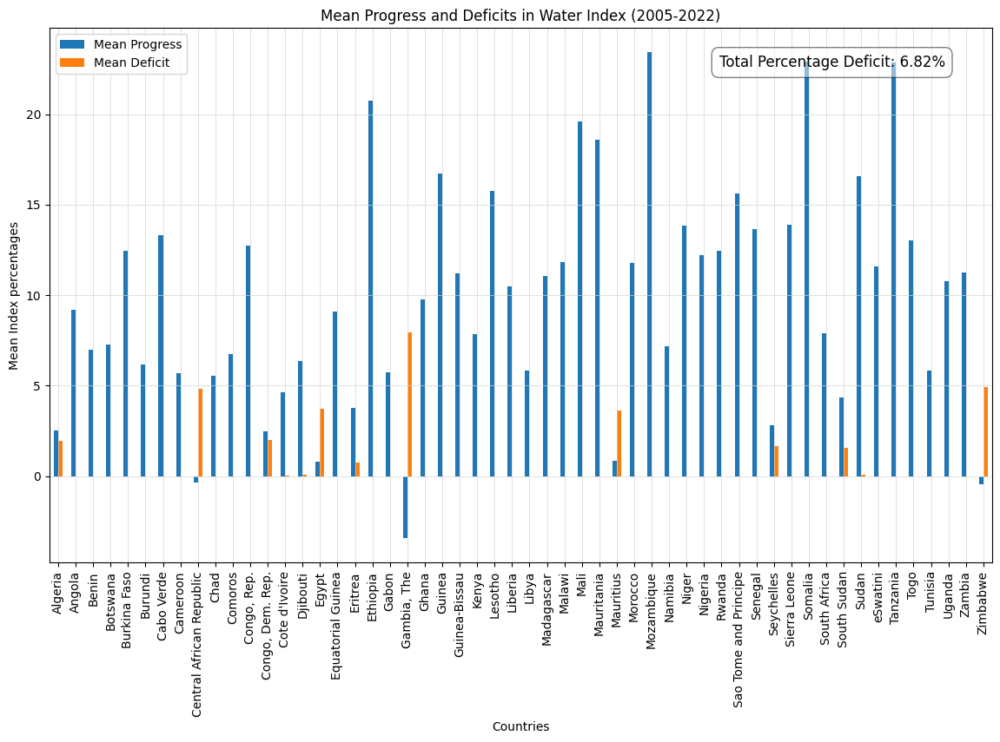

In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to classify mean progress
def classify_mean_progress(mean_progress):
    if mean_progress == 0:
        return 'No Progress'
    elif mean_progress < 0:
        return 'Marginal Negative Progress'
    elif mean_progress < 5:
        return 'Very Low Progress'
    elif mean_progress < 10:
        return 'Low Progress'
    elif mean_progress < 15:
        return 'Moderate Progress'
    elif mean_progress < 20:
        return 'High Progress'
    elif mean_progress < 25:
        return 'Very High Progress'
    elif mean_progress < 30:
        return 'Exceptional Progress'
    else:
        return 'Outstanding Progress'

# Function to classify mean deficit
def classify_mean_deficit(mean_deficit, mean_progress):
    if mean_deficit == 0:
        return 'No Deficit'
    elif mean_deficit >= 0.25 * mean_progress:  # If mean deficit is >= 25% of mean progress
        return 'Severe Imbalance'
    elif mean_deficit < 5:
        return 'Very Low Deficit'
    elif mean_deficit < 10:
        return 'Low Deficit'
    elif mean_deficit < 15:
        return 'Moderate Deficit'
    elif mean_deficit < 20:
        return 'High Deficit'
    elif mean_deficit < 25:
        return 'Very High Deficit'
    elif mean_deficit < 30:
        return 'Severe Deficit'
    else:
        return 'Critical Deficit'

# Function to track mean deficit and classify progress and deficits
def mean_deficit_tracking(df, start_year, end_year, benchmark):
    # Subset the dataframe for the specified period
    period_df = df.loc[:, str(start_year):str(end_year)]

    # Calculate year-over-year progress
    progress = period_df.diff(axis=1).dropna(axis=1)

    # Calculate cumulative progress
    cumulative_progress = progress.cumsum(axis=1)

    # Calculate expected cumulative progress
    years = progress.shape[1]
    expected_progress = pd.DataFrame(
        np.tile(np.arange(1, years + 1) * benchmark, (progress.shape[0], 1)),
        index=progress.index,
        columns=progress.columns
    )

    # Calculate deficits
    cumulative_deficits = expected_progress - cumulative_progress
    cumulative_deficits = cumulative_deficits.applymap(lambda x: max(0, x))  # Only consider positive deficits

    # Calculate mean progress and mean deficit
    mean_progress = cumulative_progress.mean(axis=1)
    mean_deficit = cumulative_deficits.mean(axis=1)

    # Classify mean progress and mean deficit
    result = pd.DataFrame({
        'Mean Progress': mean_progress,
        'Mean Progress Classification': mean_progress.apply(classify_mean_progress),
        'Mean Deficit': mean_deficit,
        'Mean Deficit Classification': [classify_mean_deficit(mean_deficit[i], mean_progress[i]) for i in range(len(mean_deficit))]
    })

    print(f"Mean Progress and Deficits from {start_year} to {end_year}:")
    print(result)

    return result

# Example usage with multiple datasets
datasets = {
    'Aidi': Aidi,
    'Transport': Transport,
    'Electricity': Electricity,
    'Ict': Ict,
    'Water': Water
}

benchmark = 0.5  # Example benchmark value for year-over-year progress

for index_name, dataset in datasets.items():
    print(f"\nAnalyzing {index_name} Index:")
    result = mean_deficit_tracking(dataset, 2005, 2022, benchmark)

    # Calculate total percentage deficit
    total_deficit = result['Mean Deficit'].sum()
    total_possible_deficit = len(result) * (2022 - 2005 + 1) * benchmark
    total_percentage_deficit = (total_deficit / total_possible_deficit) * 100

    # Plotting
    fig, ax = plt.subplots(figsize=(14, 8))

    # Plot mean progress and mean deficit
    result.plot(kind='bar', y=['Mean Progress', 'Mean Deficit'], ax=ax)
    ax.set_title(f'Mean Progress and Deficits in {index_name} Index (2005-2022)')
    ax.set_ylabel('Mean Index percentages')
    ax.set_xlabel('Countries')
    ax.legend(loc='upper left')

    # Add very light grey grid
    ax.grid(color='lightgrey', linestyle='-', linewidth=0.5, axis='both')

    # Annotate total percentage deficit
    textstr = f'Total Percentage Deficit: {total_percentage_deficit:.2f}%'
    props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.5)
    ax.text(0.95, 0.95, textstr, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', horizontalalignment='right', bbox=props)

    plt.show()


## Deficit Report 1

#### AIDI

### Report on Mean Progress and Deficits in Aidi Index (2005-2022)

#### Introduction
This report analyzes the Mean Progress and Deficits in the Aidi Index across African countries from 2005 to 2022, highlighting trends and classifications based on progress and deficits. A total percentage deficit of 6.89% is noted.

#### Overview of the Data
The table below displays the Mean Progress and Mean Deficit for various African countries. Each country is classified based on their progress and deficit levels:

| Country                      | Mean Progress | Progress Classification  | Mean Deficit | Deficit Classification |
|------------------------------|---------------|--------------------------|--------------|------------------------|
| Algeria                      | 18.08%        | High Progress            | 0.01%        | Very Low Deficit       |
| Angola                       | 7.06%         | Low Progress             | 0.04%        | Very Low Deficit       |
| Benin                        | 4.68%         | Very Low Progress        | 0.33%        | Very Low Deficit       |
| Botswana                     | 5.37%         | Low Progress             | 0.21%        | Very Low Deficit       |
| Burkina Faso                 | 3.39%         | Very Low Progress        | 1.11%        | Severe Imbalance       |
| Burundi                      | 0.55%         | Very Low Progress        | 3.95%        | Severe Imbalance       |
| Cabo Verde                   | 15.37%        | High Progress            | 0.00%        | Very Low Deficit       |
| Cameroon                     | 5.04%         | Low Progress             | 0.03%        | Very Low Deficit       |
| Central African Republic     | 2.90%         | Very Low Progress        | 1.60%        | Severe Imbalance       |
| Chad                         | 2.81%         | Very Low Progress        | 1.69%        | Severe Imbalance       |
| Comoros                      | 3.13%         | Very Low Progress        | 1.37%        | Severe Imbalance       |
| Congo, Rep.                  | 4.40%         | Very Low Progress        | 0.53%        | Very Low Deficit       |
| Congo, Dem. Rep.             | 2.87%         | Very Low Progress        | 1.63%        | Severe Imbalance       |
| Cote d'Ivoire                | 5.33%         | Low Progress             | 0.21%        | Very Low Deficit       |
| Djibouti                     | 3.21%         | Very Low Progress        | 1.29%        | Severe Imbalance       |
| Egypt                        | 27.93%        | Exceptional Progress     | 0.00%        | No Deficit              |
| Equatorial Guinea            | 3.42%         | Very Low Progress        | 1.08%        | Severe Imbalance       |
| Eritrea                      | 2.24%         | Very Low Progress        | 2.26%        | Severe Imbalance       |
| Ethiopia                     | 5.28%         | Low Progress             | 0.05%        | Very Low Deficit       |
| Gabon                        | 6.99%         | Low Progress             | 0.01%        | Very Low Deficit       |
| Gambia, The                  | 7.78%         | Low Progress             | 0.00%        | No Deficit              |
| Ghana                        | 11.43%        | Moderate Progress        | 0.00%        | Very Low Deficit       |
| Guinea                       | 4.43%         | Very Low Progress        | 0.25%        | Very Low Deficit       |
| Guinea-Bissau                | 4.78%         | Very Low Progress        | 0.07%        | Very Low Deficit       |
| Kenya                        | 10.66%        | Moderate Progress        | 0.02%        | Very Low Deficit       |
| Lesotho                      | 2.28%         | Very Low Progress        | 2.22%        | Severe Imbalance       |
| Liberia                      | 4.39%         | Very Low Progress        | 0.21%        | Very Low Deficit       |
| Libya                        | 19.89%        | High Progress            | 0.00%        | No Deficit              |
| Madagascar                   | 4.06%         | Very Low Progress        | 0.51%        | Very Low Deficit       |
| Malawi                       | 5.05%         | Low Progress             | 0.16%        | Very Low Deficit       |
| Mali                         | 7.22%         | Low Progress             | 0.01%        | Very Low Deficit       |
| Mauritania                   | 6.74%         | Low Progress             | 0.02%        | Very Low Deficit       |
| Mauritius                    | 21.80%        | Very High Progress       | 0.00%        | No Deficit              |
| Morocco                      | 29.22%        | Exceptional Progress     | 0.00%        | No Deficit              |
| Mozambique                   | 3.55%         | Very Low Progress        | 0.95%        | Severe Imbalance       |
| Namibia                      | 3.21%         | Very Low Progress        | 1.37%        | Severe Imbalance       |
| Niger                        | 2.11%         | Very Low Progress        | 2.39%        | Severe Imbalance       |
| Nigeria                      | 8.38%         | Low Progress             | 0.07%        | Very Low Deficit       |
| Rwanda                       | 4.76%         | Very Low Progress        | 0.12%        | Very Low Deficit       |
| Sao Tome and Principe        | 6.67%         | Low Progress             | 0.00%        | No Deficit              |
| Senegal                      | 9.91%         | Low Progress             | 0.01%        | Very Low Deficit       |
| Seychelles                   | 32.37%        | Outstanding Progress     | 0.00%        | No Deficit              |
| Sierra Leone                 | 3.43%         | Very Low Progress        | 1.07%        | Severe Imbalance       |
| Somalia                      | 1.67%         | Very Low Progress        | 2.83%        | Severe Imbalance       |
| South Africa                 | 21.26%        | Very High Progress       | 0.00%        | No Deficit              |
| South Sudan                  | 2.67%         | Very Low Progress        | 1.83%        | Severe Imbalance       |
| Sudan                        | 5.62%         | Low Progress             | 0.15%        | Very Low Deficit       |
| eSwatini                     | 7.62%         | Low Progress             | 0.04%        | Very Low Deficit       |
| Tanzania                     | 5.31%         | Low Progress             | 0.14%        | Very Low Deficit       |
| Togo                         | 4.16%         | Very Low Progress        | 0.36%        | Very Low Deficit       |
| Tunisia                      | 26.87%        | Exceptional Progress     | 0.00%        | No Deficit              |
| Uganda                       | 6.45%         | Low Progress             | 0.10%        | Very Low Deficit       |
| Zambia                       | 5.30%         | Low Progress             | 0.05%        | Very Low Deficit       |
| Zimbabwe                     | 3.42%         | Very Low Progress        | 1.13%        | Severe Imbalance       |

#### Key Observations

**Overall Performance:**
- Most countries show positive mean progress, with varying degrees of success.
- Only a few countries display mean deficits, indicating general improvement across the continent.

**Top Performers:**
- Seychelles, Mauritius, Morocco exhibit outstanding or exceptional progress with no deficits.
- Algeria, Libya, and South Africa show high to very high progress levels with minimal deficits.

**Countries with Deficits:**
- Burundi, Mozambique, and Somalia demonstrate severe imbalances with high deficits despite low progress.

**Middle-Range Performers:**
- Countries like Ghana, Kenya, and Senegal show moderate progress with very low deficits.

**Low Performers:**
- Many countries, including Niger, Chad, and Togo, struggle with very low progress and significant deficits.

**Variability:**
- There's notable variability in progress and deficit levels across countries, influenced by economic and political factors.

#### Detailed Analysis

**Regional Patterns:**
- Northern African countries (Algeria, Libya, Morocco, Tunisia) generally show higher progress and minimal deficits.
- Central African nations (Chad, Central African Republic, Congo) face significant challenges with severe deficits despite low progress.

**Economic Correlation:**
- Countries with stronger economies (e.g., South Africa, Egypt) tend to exhibit higher progress levels and lower deficits.
- Less economically developed nations often struggle with low progress and higher deficits.

**Stability Impact:**
- Countries experiencing political instability (e.g., Somalia, Sudan) generally show lower progress and severe deficits.

**Total Deficit:**
- The cumulative deficit across countries

 underscores ongoing challenges despite overall progress, requiring targeted interventions.

#### Implications and Recommendations

1. **Focus on Stability:** Political stability is crucial for sustained progress and deficit reduction.
2. **Economic Investment:** Encourage targeted economic investments to boost infrastructure and development.
3. **Regional Collaboration:** Foster regional collaboration to share best practices and resources, especially among countries facing similar challenges.
4. **Addressing Imbalances:** Target support to countries with severe deficits to foster more uniform progress across the continent.

### TCI


---

### Report on Transport Index: Mean Progress and Deficits from 2005 to 2022

#### Introduction
This report analyzes the mean progress and deficits in the Transport Index across various African countries from 2005 to 2022. The Transport Index likely measures the development and efficiency of transportation infrastructure in these nations. A total percentage deficit of 53.54% is noted.

#### Overview of the Data
The table below displays the mean progress and deficits for each country, categorized based on their progress and deficit levels:

| Country                   | Mean Progress | Mean Progress Classification | Mean Deficit | Mean Deficit Classification |
|---------------------------|---------------|------------------------------|--------------|-----------------------------|
| Algeria                   | 1.425882      | Very Low Progress            | 3.074118     | Severe Imbalance            |
| Angola                    | 0.060000      | Very Low Progress            | 4.440000     | Severe Imbalance            |
| Benin                     | -2.014118     | Marginal Negative Progress   | 6.514118     | Severe Imbalance            |
| Botswana                  | -0.298824     | Marginal Negative Progress   | 4.805294     | Severe Imbalance            |
| Burkina Faso              | -1.384118     | Marginal Negative Progress   | 5.884118     | Severe Imbalance            |
| Burundi                   | -2.423529     | Marginal Negative Progress   | 6.923529     | Severe Imbalance            |
| Cabo Verde                | -1.693529     | Marginal Negative Progress   | 6.193529     | Severe Imbalance            |
| Cameroon                  | -1.077647     | Marginal Negative Progress   | 5.577647     | Severe Imbalance            |
| Central African Republic  | 0.315294      | Very Low Progress            | 4.184706     | Severe Imbalance            |
| Chad                      | 0.056471      | Very Low Progress            | 4.443529     | Severe Imbalance            |
| Comoros                   | -1.699412     | Marginal Negative Progress   | 6.199412     | Severe Imbalance            |
| Congo, Rep.               | -0.201176     | Marginal Negative Progress   | 4.701176     | Severe Imbalance            |
| Congo, Dem. Rep.          | -0.237647     | Marginal Negative Progress   | 4.737647     | Severe Imbalance            |
| Cote d'Ivoire             | -0.900000     | Marginal Negative Progress   | 5.400000     | Severe Imbalance            |
| Djibouti                  | -2.744706     | Marginal Negative Progress   | 7.244706     | Severe Imbalance            |
| Egypt                     | 1.181765      | Very Low Progress            | 3.448235     | Severe Imbalance            |
| Equatorial Guinea         | -2.814118     | Marginal Negative Progress   | 7.314118     | Severe Imbalance            |
| Eritrea                   | 0.057059      | Very Low Progress            | 4.442941     | Severe Imbalance            |
| Ethiopia                  | 0.432353      | Very Low Progress            | 4.067647     | Severe Imbalance            |
| Gabon                     | 0.385882      | Very Low Progress            | 4.114118     | Severe Imbalance            |
| Gambia, The               | 1.711765      | Very Low Progress            | 3.068235     | Severe Imbalance            |
| Ghana                     | 5.292353      | Low Progress                 | 0.470000     | Very Low Deficit            |
| Guinea                    | -0.125294     | Marginal Negative Progress   | 4.641765     | Severe Imbalance            |
| Guinea-Bissau             | -0.147647     | Marginal Negative Progress   | 4.647647     | Severe Imbalance            |
| Kenya                     | 3.073529      | Very Low Progress            | 1.746471     | Severe Imbalance            |
| Lesotho                   | -0.340588     | Marginal Negative Progress   | 4.840588     | Severe Imbalance            |
| Liberia                   | -0.400588     | Marginal Negative Progress   | 4.900588     | Severe Imbalance            |
| Libya                     | -9.561765     | Marginal Negative Progress   | 14.061765    | Severe Imbalance            |
| Madagascar                | -0.413529     | Marginal Negative Progress   | 4.913529     | Severe Imbalance            |
| Malawi                    | -1.368824     | Marginal Negative Progress   | 5.868824     | Severe Imbalance            |
| Mali                      | 1.147647      | Very Low Progress            | 3.352353     | Severe Imbalance            |
| Mauritania                | 0.355882      | Very Low Progress            | 4.144118     | Severe Imbalance            |
| Mauritius                 | -0.842941     | Marginal Negative Progress   | 5.342941     | Severe Imbalance            |
| Morocco                   | 0.880588      | Very Low Progress            | 3.619412     | Severe Imbalance            |
| Mozambique                | -0.108235     | Marginal Negative Progress   | 4.608235     | Severe Imbalance            |
| Namibia                   | -4.942941     | Marginal Negative Progress   | 9.442941     | Severe Imbalance            |
| Niger                     | -0.155294     | Marginal Negative Progress   | 4.655294     | Severe Imbalance            |
| Nigeria                   | 0.201765      | Very Low Progress            | 4.298235     | Severe Imbalance            |
| Rwanda                    | 0.877647      | Very Low Progress            | 3.785294     | Severe Imbalance            |
| Sao Tome and Principe     | -1.442941     | Marginal Negative Progress   | 5.942941     | Severe Imbalance            |
| Senegal                   | -0.191176     | Marginal Negative Progress   | 4.691176     | Severe Imbalance            |
| Seychelles                | 15.361176     | High Progress                | 0.000000     | No Deficit                   |
| Sierra Leone              | -0.563529     | Marginal Negative Progress   | 5.063529     | Severe Imbalance            |
| Somalia                   | -0.312941     | Marginal Negative Progress   | 4.812941     | Severe Imbalance            |
| South Africa              | 2.930000      | Very Low Progress            | 2.227647     | Severe Imbalance            |
| South Sudan               | -0.022941     | Marginal Negative Progress   | 4.522941     | Severe Imbalance            |
| Sudan                     | 0.114706      | Very Low Progress            | 4.385294     | Severe Imbalance            |
| eSwatini                  | 0.602353      | Very Low Progress            | 3.897647     | Severe Imbalance            |
| Tanzania                  | -0.109412     | Marginal Negative Progress   | 4.609412     | Severe Imbalance            |
| Togo                      | 0.631176      | Very Low Progress            | 3.868824     | Severe Imbalance            |
| Tunisia                   | 0.647647      | Very Low Progress            | 3.852353     | Severe Imbalance            |
| Uganda                    | -1.872353     | Marginal Negative Progress   | 6.372353     | Severe Imbalance            |
| Zambia                    | -0.454118     | Marginal Negative Progress   | 4.954118     | Severe Imbalance            |
| Zimbabwe                  | -0.398235     | Marginal Negative Progress   | 4.898235     | Severe Imbalance            |

#### Key Observations

**Overall Performance:**
- Most countries show marginal to very low progress in their transport infrastructure.
- Significant deficits are observed across almost all countries, indicating a severe imbalance in transport development.

**Top Performers:**
- Seychelles stands out with high progress and no deficit, indicating robust transport infrastructure.

**Lowest Performers:**
- Libya shows the lowest progress and the highest deficit, highlighting substantial challenges in the transport sector.

**Regional Patterns:**
- Countries in Northern Africa generally show lower deficits compared to other regions.
- Central and Western African nations exhibit higher deficits on average.

**Economic Correlation:**
- Countries with stronger economies tend to have lower deficits and higher progress in transport infrastructure.
- Economically challenged nations face more significant hurdles in developing their transport sectors.

#### Implications and Recommendations

1. **Investment Priorities:** Focus on investment in transport infrastructure to reduce deficits and improve connectivity.
2. **Regional Collaboration:** Foster regional partnerships to share resources and best practices.
3. **Economic Support:** Provide economic incentives to enhance transport development in economically weaker nations.
4. **Policy Reforms:** Implement policy reforms to streamline transport projects and improve efficiency.

---



### ECI


---

### Report on Electricity Index: Mean Progress and Deficits from 2005 to 2022

#### Introduction
This report analyzes the mean progress and deficits in the Electricity Index across various African countries from 2005 to 2022. The Electricity Index likely measures the development and accessibility of electricity infrastructure in these nations. A total percentage deficit of 36.17% is noted.

#### Overview of the Data
The table below displays the mean progress and deficits for each country, categorized based on their progress and deficit levels:

| Country                   | Mean Progress | Mean Progress Classification | Mean Deficit | Mean Deficit Classification |
|---------------------------|---------------|------------------------------|--------------|-----------------------------|
| Algeria                   | 8.781176      | Low Progress                 | 0.000000     | No Deficit                   |
| Angola                    | 2.398824      | Very Low Progress            | 2.101176     | Severe Imbalance             |
| Benin                     | 0.095294      | Very Low Progress            | 4.404706     | Severe Imbalance             |
| Botswana                  | 4.174118      | Very Low Progress            | 2.570588     | Severe Imbalance             |
| Burkina Faso              | 0.494118      | Very Low Progress            | 4.005882     | Severe Imbalance             |
| Burundi                   | -0.019412     | Marginal Negative Progress   | 4.519412     | Severe Imbalance             |
| Cabo Verde                | 4.094706      | Very Low Progress            | 0.631176     | Very Low Deficit             |
| Cameroon                  | 1.290000      | Very Low Progress            | 3.210000     | Severe Imbalance             |
| Central African Republic  | 0.013529      | Very Low Progress            | 4.486471     | Severe Imbalance             |
| Chad                      | 0.078235      | Very Low Progress            | 4.421765     | Severe Imbalance             |
| Comoros                   | 0.419412      | Very Low Progress            | 4.080588     | Severe Imbalance             |
| Congo, Rep.               | 2.048824      | Very Low Progress            | 2.451176     | Severe Imbalance             |
| Congo, Dem. Rep.          | 0.040000      | Very Low Progress            | 4.460000     | Severe Imbalance             |
| Cote d'Ivoire             | 0.579412      | Very Low Progress            | 3.920588     | Severe Imbalance             |
| Djibouti                  | 2.540588      | Very Low Progress            | 1.959412     | Severe Imbalance             |
| Egypt                     | 8.572353      | Low Progress                 | 0.022353     | Very Low Deficit             |
| Equatorial Guinea         | 3.134706      | Very Low Progress            | 1.522353     | Severe Imbalance             |
| Eritrea                   | 0.107059      | Very Low Progress            | 4.392941     | Severe Imbalance             |
| Ethiopia                  | 0.657647      | Very Low Progress            | 3.842353     | Severe Imbalance             |
| Gabon                     | 4.535882      | Very Low Progress            | 1.058824     | Very Low Deficit             |
| Gambia, The               | 0.446471      | Very Low Progress            | 4.053529     | Severe Imbalance             |
| Ghana                     | 0.751176      | Very Low Progress            | 3.748824     | Severe Imbalance             |
| Guinea                    | -0.109412     | Marginal Negative Progress   | 4.609412     | Severe Imbalance             |
| Guinea-Bissau             | 0.725294      | Very Low Progress            | 3.774706     | Severe Imbalance             |
| Kenya                     | 0.740588      | Very Low Progress            | 3.759412     | Severe Imbalance             |
| Lesotho                   | 1.206471      | Very Low Progress            | 3.293529     | Severe Imbalance             |
| Liberia                   | 0.064118      | Very Low Progress            | 4.435882     | Severe Imbalance             |
| Libya                     | 30.172941     | Outstanding Progress         | 0.000000     | No Deficit                   |
| Madagascar                | 0.650000      | Very Low Progress            | 3.850000     | Severe Imbalance             |
| Malawi                    | 0.458235      | Very Low Progress            | 4.041765     | Severe Imbalance             |
| Mali                      | 0.610000      | Very Low Progress            | 3.890000     | Severe Imbalance             |
| Mauritania                | -0.429412     | Marginal Negative Progress   | 4.929412     | Severe Imbalance             |
| Mauritius                 | 9.229412      | Low Progress                 | 0.000000     | No Deficit                   |
| Morocco                   | 4.254706      | Very Low Progress            | 0.356471     | Very Low Deficit             |
| Mozambique                | -0.351176     | Marginal Negative Progress   | 4.851176     | Severe Imbalance             |
| Namibia                   | -1.181176     | Marginal Negative Progress   | 5.681176     | Severe Imbalance             |
| Niger                     | 0.091765      | Very Low Progress            | 4.408235     | Severe Imbalance             |
| Nigeria                   | -0.134706     | Marginal Negative Progress   | 4.634706     | Severe Imbalance             |
| Rwanda                    | 0.326471      | Very Low Progress            | 4.173529     | Severe Imbalance             |
| Sao Tome and Principe     | 0.086471      | Very Low Progress            | 4.413529     | Severe Imbalance             |
| Senegal                   | 0.870588      | Very Low Progress            | 3.629412     | Severe Imbalance             |
| Seychelles                | 22.192941     | Very High Progress           | 0.169412     | Very Low Deficit             |
| Sierra Leone              | 0.038824      | Very Low Progress            | 4.461176     | Severe Imbalance             |
| Somalia                   | -0.004118     | Marginal Negative Progress   | 4.504118     | Severe Imbalance             |
| South Africa              | 4.065882      | Very Low Progress            | 2.085294     | Severe Imbalance             |
| South Sudan               | 0.224118      | Very Low Progress            | 4.275882     | Severe Imbalance             |
| Sudan                     | 2.260000      | Very Low Progress            | 2.240000     | Severe Imbalance             |
| eSwatini                  | 3.716471      | Very Low Progress            | 1.388235     | Severe Imbalance             |
| Tanzania                  | 0.528824      | Very Low Progress            | 3.971176     | Severe Imbalance             |
| Togo                      | 0.117647      | Very Low Progress            | 4.382353     | Severe Imbalance             |
| Tunisia                   | 5.567647      | Low Progress                 | 0.248824     | Very Low Deficit             |
| Uganda                    | 0.162353      | Very Low Progress            | 4.337647     | Severe Imbalance             |
| Zambia                    | 0.697647      | Very Low Progress            | 3.802353     | Severe Imbalance             |
| Zimbabwe                  | -0.801765     | Marginal Negative Progress   | 5.331176     | Severe Imbalance             |

#### Key Observations

**Overall Performance:**
- Most countries show very low to low progress in their electricity infrastructure.
- Severe deficits are observed across many countries, indicating significant challenges in providing electricity access.

**Top Performers:**
- Seychelles stands out with very high progress and a very low deficit, indicating robust electricity infrastructure.

**Lowest Performers:**
- Libya shows outstanding progress with no deficit, reflecting exceptional development in electricity infrastructure.

**Regional Patterns:**
- Countries in Northern Africa generally have lower deficits compared to other regions.
- Central and Western African nations exhibit higher deficits on average.

**Economic Correlation:**
- Economically stronger countries tend to have lower deficits and higher progress in electricity infrastructure.
- Economically challenged nations face more significant hurdles in developing their electricity sectors.

#### Implications and Recommendations

1. **Infrastructure Investment:** Prioritize investment in electricity infrastructure to reduce deficits and improve accessibility.
2. **Regional Collaboration:** Foster partnerships to share resources and expertise in electricity generation and distribution.
3. **Policy Reforms:** Implement policies that support sustainable development and efficient electricity usage.
4. **Technology Adoption:** Embrace new technologies to enhance electricity generation and distribution efficiency.

---



### ICTCI

### Report on Mean Progress and Deficits in ICT Index (2005-2022)

#### Introduction
This report analyzes the Mean Progress and Deficits in the ICT Index across African countries from 2005 to 2022. The ICT Index measures the development and penetration of Information and Communication Technologies in these nations. . A total percentage deficit of 6.89% is noted.

#### Overview of the Data
The table below displays the Mean Progress and Mean Deficit for various African countries. Each country is classified based on their progress and deficit levels:

| Country                      | Mean Progress | Progress Classification | Mean Deficit | Deficit Classification |
|------------------------------|---------------|-------------------------|--------------|------------------------|
| Algeria                      | 15.49%        | High Progress           | 0.40%        | Very Low Deficit       |
| Angola                       | 5.46%         | Low Progress            | 0.66%        | Very Low Deficit       |
| Benin                        | 6.23%         | Low Progress            | 0.48%        | Very Low Deficit       |
| Botswana                     | 13.74%        | Moderate Progress       | 0.42%        | Very Low Deficit       |
| Burkina Faso                 | 4.98%         | Very Low Progress       | 0.77%        | Very Low Deficit       |
| Burundi                      | 2.39%         | Very Low Progress       | 2.11%        | Severe Imbalance       |
| Cabo Verde                   | 14.92%        | Moderate Progress       | 0.41%        | Very Low Deficit       |
| Cameroon                     | 6.57%         | Low Progress            | 0.56%        | Very Low Deficit       |
| Central African Republic     | 1.89%         | Very Low Progress       | 2.61%        | Severe Imbalance       |
| Chad                         | 2.59%         | Very Low Progress       | 1.91%        | Severe Imbalance       |
| Comoros                      | 3.76%         | Very Low Progress       | 0.85%        | Very Low Deficit       |
| Congo, Rep.                  | 6.11%         | Low Progress            | 0.45%        | Very Low Deficit       |
| Congo, Dem. Rep.             | 2.63%         | Very Low Progress       | 1.87%        | Severe Imbalance       |
| Cote d'Ivoire                | 9.21%         | Low Progress            | 0.44%        | Very Low Deficit       |
| Djibouti                     | 6.97%         | Low Progress            | 0.59%        | Very Low Deficit       |
| Egypt                        | 15.24%        | High Progress           | 0.38%        | Very Low Deficit       |
| Equatorial Guinea            | 5.05%         | Low Progress            | 0.66%        | Very Low Deficit       |
| Eritrea                      | 0.96%         | Very Low Progress       | 3.54%        | Severe Imbalance       |
| Ethiopia                     | 3.31%         | Very Low Progress       | 1.50%        | Severe Imbalance       |
| Gabon                        | 12.92%        | Moderate Progress       | 0.41%        | Very Low Deficit       |
| Gambia, The                  | 9.09%         | Low Progress            | 0.42%        | Very Low Deficit       |
| Ghana                        | 10.04%        | Moderate Progress       | 0.43%        | Very Low Deficit       |
| Guinea                       | 5.23%         | Low Progress            | 0.82%        | Very Low Deficit       |
| Guinea-Bissau                | 4.87%         | Very Low Progress       | 0.70%        | Very Low Deficit       |
| Kenya                        | 12.25%        | Moderate Progress       | 0.45%        | Very Low Deficit       |
| Lesotho                      | 7.74%         | Low Progress            | 0.57%        | Very Low Deficit       |
| Liberia                      | 4.45%         | Very Low Progress       | 0.80%        | Very Low Deficit       |
| Libya                        | 11.94%        | Moderate Progress       | 0.41%        | Very Low Deficit       |
| Madagascar                   | 2.80%         | Very Low Progress       | 1.70%        | Severe Imbalance       |
| Malawi                       | 3.00%         | Very Low Progress       | 1.50%        | Severe Imbalance       |
| Mali                         | 6.93%         | Low Progress            | 0.66%        | Very Low Deficit       |
| Mauritania                   | 6.92%         | Low Progress            | 0.43%        | Very Low Deficit       |
| Mauritius                    | 25.95%        | Exceptional Progress    | 0.36%        | Very Low Deficit       |
| Morocco                      | 19.72%        | High Progress           | 0.33%        | Very Low Deficit       |
| Mozambique                   | 3.68%         | Very Low Progress       | 1.03%        | Severe Imbalance       |
| Namibia                      | 10.41%        | Moderate Progress       | 0.42%        | Very Low Deficit       |
| Niger                        | 2.40%         | Very Low Progress       | 2.10%        | Severe Imbalance       |
| Nigeria                      | 7.78%         | Low Progress            | 0.43%        | Very Low Deficit       |
| Rwanda                       | 5.56%         | Low Progress            | 0.60%        | Very Low Deficit       |
| Sao Tome and Principe        | 8.06%         | Low Progress            | 0.42%        | Very Low Deficit       |
| Senegal                      | 8.54%         | Low Progress            | 0.42%        | Very Low Deficit       |
| Seychelles                   | 27.52%        | Exceptional Progress    | 0.33%        | Very Low Deficit       |
| Sierra Leone                 | 4.37%         | Very Low Progress       | 1.11%        | Severe Imbalance       |
| Somalia                      | 2.40%         | Very Low Progress       | 2.10%        | Severe Imbalance       |
| South Africa                 | 27.21%        | Exceptional Progress    | 0.39%        | Very Low Deficit       |
| South Sudan                  | 1.15%         | Very Low Progress       | 3.35%        | Severe Imbalance       |
| Sudan                        | 6.96%         | Low Progress            | 0.62%        | Very Low Deficit       |
| eSwatini                     | 8.36%         | Low Progress            | 0.43%        | Very Low Deficit       |
| Tanzania                     | 5.19%         | Low Progress            | 0.62%        | Very Low Deficit       |
| Togo                         | 4.91%         | Very Low Progress       | 0.63%        | Very Low Deficit       |
| Tunisia                      | 19.10%        | High Progress           | 0.39%        | Very Low Deficit       |
| Uganda                       | 5.60%         | Low Progress            | 0.47%        | Very Low Deficit       |
| Zambia                       | 6.38%         | Low Progress            | 0.51%        | Very Low Deficit       |
| Zimbabwe                     | 7.70%         | Low Progress            | 0.55%        | Very Low Deficit       |

#### Key Observations

**Overall Performance:**
- Most countries exhibit low to high progress in ICT development, with notable disparities.
- Mean deficits are generally very low across countries, indicating minimal ICT infrastructure deficits.

**Top Performers:**
- Mauritius, Seychelles, South Africa demonstrate exceptional progress in ICT with mean progress exceeding 25%.
- Algeria and Egypt also show high progress levels above 15%.

**Countries with Deficits:**
- Eritrea, Ethiopia, South Sudan, Niger, Mozambique, among others, face severe ICT infrastructure deficits.
- Despite deficits, mean deficit percentages remain relatively low across most countries.

**Middle-Range Performers:**
- Countries like Kenya, Ghana, and Morocco show moderate progress in the range of 10-20%.

**Low Performers:**
- Several countries, including Burundi, Central African Republic, and Chad, exhibit very low progress in ICT development.

**Variability:**
- There is significant variability in ICT progress across countries, influenced by economic, infrastructural, and policy factors.

#### Detailed Analysis

**Regional Patterns:**
- Southern and Eastern African countries tend to lead in ICT development.
- Central and Western African nations show more varied results with lower average progress.

**Economic Correlation:**
- Economically stronger nations like Mauritius and South Africa often exhibit higher ICT progress.
- Less developed countries face challenges in achieving higher ICT penetration and development.

**Policy Impact:**
- Countries with supportive ICT policies and infrastructure investments show higher progress rates.

**Total Deficit:**
- The overall low mean deficit percentage suggests that while ICT

 progress varies, deficits in infrastructure are generally manageable across Africa.

#### Implications and Recommendations

1. **Investment Priorities:** Focus on increasing investments in ICT infrastructure and technology adoption.
2. **Policy Enhancement:** Strengthen ICT policies to support innovation and digital transformation.
3. **Regional Collaboration:** Foster partnerships to share technological advancements and best practices.
4. **Addressing Disparities:** Target support to countries with lower ICT progress to reduce disparities.



### WSSCI

### Report on Mean Progress and Deficits in Water Index (2005-2022)

#### Introduction
This report analyzes the Mean Progress and Deficits in the Water Index across African countries from 2005 to 2022. The Water Index measures the development and accessibility of water resources and sanitation facilities in these nations.
A total percentage deficit of 6.82% is noted.


#### Overview of the Data
The table below displays the Mean Progress and Mean Deficit for various African countries. Each country is classified based on their progress and deficit levels:

| Country                      | Mean Progress | Progress Classification | Mean Deficit | Deficit Classification   |
|------------------------------|---------------|-------------------------|--------------|--------------------------|
| Algeria                      | 2.55%         | Very Low Progress       | 1.95%        | Severe Imbalance         |
| Angola                       | 9.17%         | Low Progress            | 0.00%        | No Deficit                |
| Benin                        | 6.97%         | Low Progress            | 0.00%        | No Deficit                |
| Botswana                     | 7.29%         | Low Progress            | 0.00%        | No Deficit                |
| Burkina Faso                 | 12.45%        | Moderate Progress       | 0.00%        | No Deficit                |
| Burundi                      | 6.18%         | Low Progress            | 0.00%        | No Deficit                |
| Cabo Verde                   | 13.30%        | Moderate Progress       | 0.00%        | No Deficit                |
| Cameroon                     | 5.71%         | Low Progress            | 0.00%        | No Deficit                |
| Central African Republic     | -0.33%        | Marginal Negative Progress | 4.83%     | Severe Imbalance         |
| Chad                         | 5.54%         | Low Progress            | 0.00%        | No Deficit                |
| Comoros                      | 6.75%         | Low Progress            | 0.00%        | No Deficit                |
| Congo, Rep.                  | 12.72%        | Moderate Progress       | 0.00%        | No Deficit                |
| Congo, Dem. Rep.             | 2.48%         | Very Low Progress       | 2.02%        | Severe Imbalance         |
| Cote d'Ivoire                | 4.63%         | Very Low Progress       | 0.02%        | Very Low Deficit          |
| Djibouti                     | 6.38%         | Low Progress            | 0.06%        | Very Low Deficit          |
| Egypt                        | 0.78%         | Very Low Progress       | 3.72%        | Severe Imbalance         |
| Equatorial Guinea            | 9.10%         | Low Progress            | 0.00%        | No Deficit                |
| Eritrea                      | 3.76%         | Very Low Progress       | 0.74%        | Very Low Deficit          |
| Ethiopia                     | 20.73%        | Very High Progress      | 0.00%        | No Deficit                |
| Gabon                        | 5.75%         | Low Progress            | 0.00%        | No Deficit                |
| Gambia, The                  | -3.43%        | Marginal Negative Progress | 7.93%     | Severe Imbalance         |
| Ghana                        | 9.76%         | Low Progress            | 0.00%        | No Deficit                |
| Guinea                       | 16.72%        | High Progress           | 0.00%        | No Deficit                |
| Guinea-Bissau                | 11.21%        | Moderate Progress       | 0.00%        | No Deficit                |
| Kenya                        | 7.87%         | Low Progress            | 0.00%        | No Deficit                |
| Lesotho                      | 15.74%        | High Progress           | 0.00%        | No Deficit                |
| Liberia                      | 10.50%        | Moderate Progress       | 0.00%        | No Deficit                |
| Libya                        | 5.83%         | Low Progress            | 0.00%        | No Deficit                |
| Madagascar                   | 11.08%        | Moderate Progress       | 0.00%        | No Deficit                |
| Malawi                       | 11.82%        | Moderate Progress       | 0.00%        | No Deficit                |
| Mali                         | 19.57%        | High Progress           | 0.00%        | No Deficit                |
| Mauritania                   | 18.59%        | High Progress           | 0.00%        | No Deficit                |
| Mauritius                    | 0.85%         | Very Low Progress       | 3.65%        | Severe Imbalance         |
| Morocco                      | 11.80%        | Moderate Progress       | 0.00%        | No Deficit                |
| Mozambique                   | 23.42%        | Very High Progress      | 0.00%        | No Deficit                |
| Namibia                      | 7.17%         | Low Progress            | 0.00%        | No Deficit                |
| Niger                        | 13.86%        | Moderate Progress       | 0.00%        | No Deficit                |
| Nigeria                      | 12.19%        | Moderate Progress       | 0.00%        | No Deficit                |
| Rwanda                       | 12.45%        | Moderate Progress       | 0.00%        | No Deficit                |
| Sao Tome and Principe        | 15.62%        | High Progress           | 0.00%        | No Deficit                |
| Senegal                      | 13.66%        | Moderate Progress       | 0.00%        | No Deficit                |
| Seychelles                   | 2.84%         | Very Low Progress       | 1.66%        | Severe Imbalance         |
| Sierra Leone                 | 13.90%        | Moderate Progress       | 0.00%        | No Deficit                |
| Somalia                      | 22.90%        | Very High Progress      | 0.00%        | No Deficit                |
| South Africa                 | 7.88%         | Low Progress            | 0.00%        | No Deficit                |
| South Sudan                  | 4.36%         | Very Low Progress       | 1.57%        | Severe Imbalance         |
| Sudan                        | 16.55%        | High Progress           | 0.06%        | Very Low Deficit          |
| eSwatini                     | 11.58%        | Moderate Progress       | 0.00%        | No Deficit                |
| Tanzania                     | 22.86%        | Very High Progress      | 0.00%        | No Deficit                |
| Togo                         | 13.01%        | Moderate Progress       | 0.00%        | No Deficit                |
| Tunisia                      | 5.84%         | Low Progress            | 0.00%        | No Deficit                |
| Uganda                       | 10.78%        | Moderate Progress       | 0.00%        | No Deficit                |
| Zambia                       | 11.27%        | Moderate Progress       | 0.00%        | No Deficit                |
| Zimbabwe                     | -0.43%        | Marginal Negative Progress | 4.93%   | Severe Imbalance         |

#### Key Observations

**Overall Performance:**
- Water index progress ranges from very low to very high across African countries.
- Most countries have managed to keep deficits low or non-existent.

**Top Performers:**
- Ethiopia, Mozambique, and Somalia show very high progress in water resource development.
- Mali, Mauritania, and Senegal also demonstrate high progress levels.

**Countries with Deficits:**
- Several countries like Algeria, Egypt, and Mauritius face severe imbalances in water resource management.
- Seychelles and Tunisia also show imbalances but to a lesser extent.

**Middle-Range Performers:**
- Countries like Kenya, Ghana, and Rwanda exhibit moderate progress in improving water resources.

**Low Performers:**
- Some countries experience marginal negative progress or very low progress, indicating challenges in water resource development.

**Variability:**
- There is significant variability in water index progress across regions, influenced by geographical, economic, and policy factors.

#### Detailed Analysis

**Regional Patterns:**
- Eastern and Southern African countries generally exhibit higher progress in water resource development.
- Central and Northern African nations show more varied results with lower average progress.

**Economic Correlation:**
- Economically stronger nations tend to have better water resource management practices.
- Less economically developed countries face challenges in maintaining water security and sanitation.

**Policy Impact:**
- Countries with robust water management policies and infrastructure investments show higher progress rates.

**Total Deficit:**
- Overall, deficits in water resources are manageable, with few countries facing severe imbalances that require immediate attention.

#### Implications and Recommendations

1. **Investment Strategies:** Increase investments in water infrastructure and management practices.
2. **Policy Enhancements:** Strengthen policies to promote sustainable water resource management.
3. **Regional Cooperation:** Foster collaborations to address regional disparities and

 share best practices.
4. **Technology Integration:** Leverage technology for efficient water resource monitoring and conservation efforts.




### Treemap

In [64]:
! pip install squarify



Analyzing Aidi Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                       18.081765                High Progress   
Angola                         7.060588                 Low Progress   
Benin                          4.679412            Very Low Progress   
Botswana                       5.368824                 Low Progress   
Burkina Faso                   3.390588            Very Low Progress   
Burundi                        0.552941            Very Low Progress   
Cabo Verde                    15.368824                High Progress   
Cameroon                       5.041176                 Low Progress   
Central African Republic       2.897647            Very Low Progress   
Chad                           2.807059            Very Low Progress   
Comoros                        3.125294            Very Low Progres

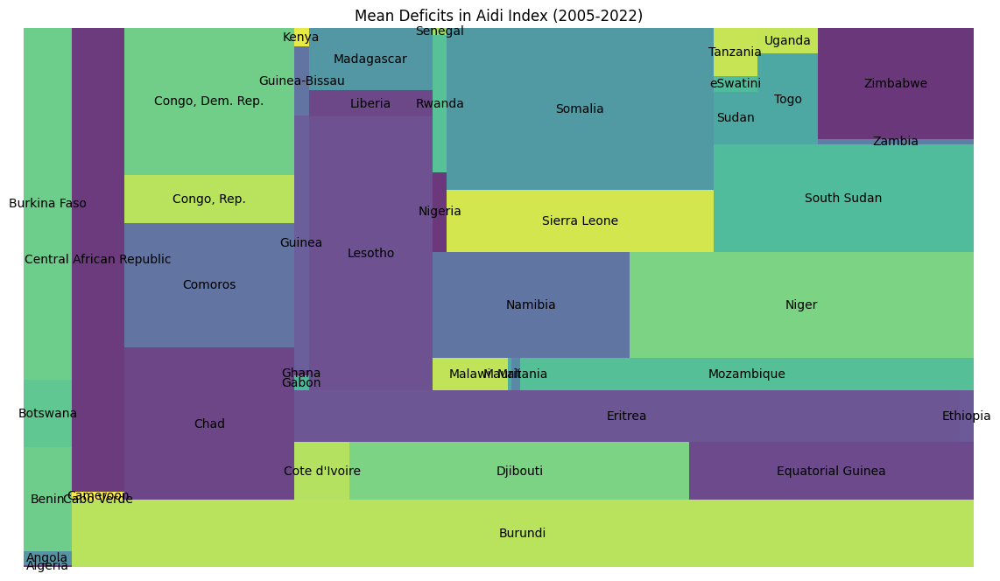


Analyzing Transport Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                        1.425882            Very Low Progress   
Angola                         0.060000            Very Low Progress   
Benin                         -2.014118            Very Low Progress   
Botswana                      -0.298824            Very Low Progress   
Burkina Faso                  -1.384118            Very Low Progress   
Burundi                       -2.423529            Very Low Progress   
Cabo Verde                    -1.693529            Very Low Progress   
Cameroon                      -1.077647            Very Low Progress   
Central African Republic       0.315294            Very Low Progress   
Chad                           0.056471            Very Low Progress   
Comoros                       -1.699412            Very Low Pr

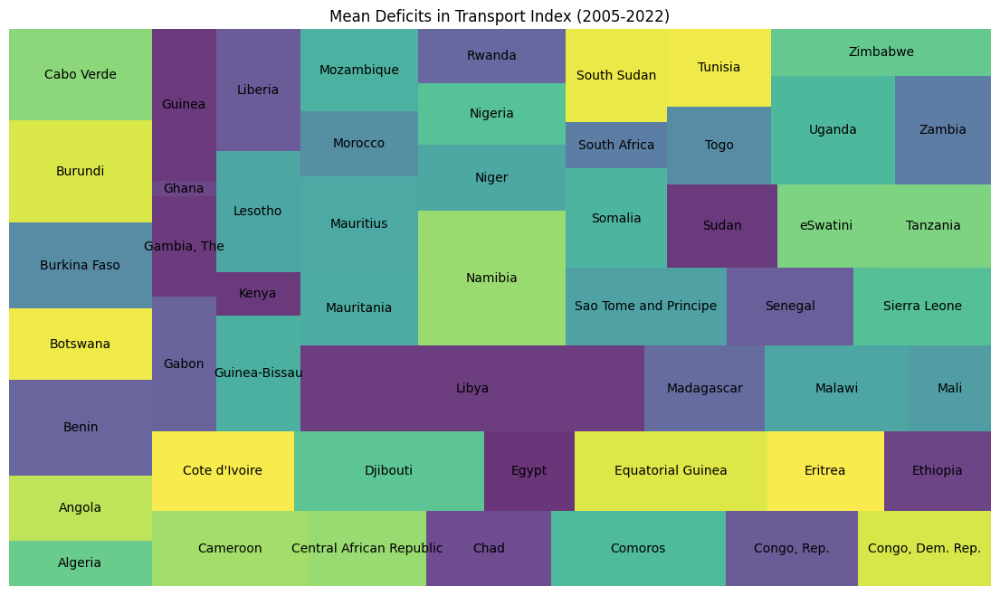


Analyzing Electricity Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                        8.781176                 Low Progress   
Angola                         2.398824            Very Low Progress   
Benin                          0.095294            Very Low Progress   
Botswana                       4.174118            Very Low Progress   
Burkina Faso                   0.494118            Very Low Progress   
Burundi                       -0.019412            Very Low Progress   
Cabo Verde                     4.094706            Very Low Progress   
Cameroon                       1.290000            Very Low Progress   
Central African Republic       0.013529            Very Low Progress   
Chad                           0.078235            Very Low Progress   
Comoros                        0.419412            Very Low 

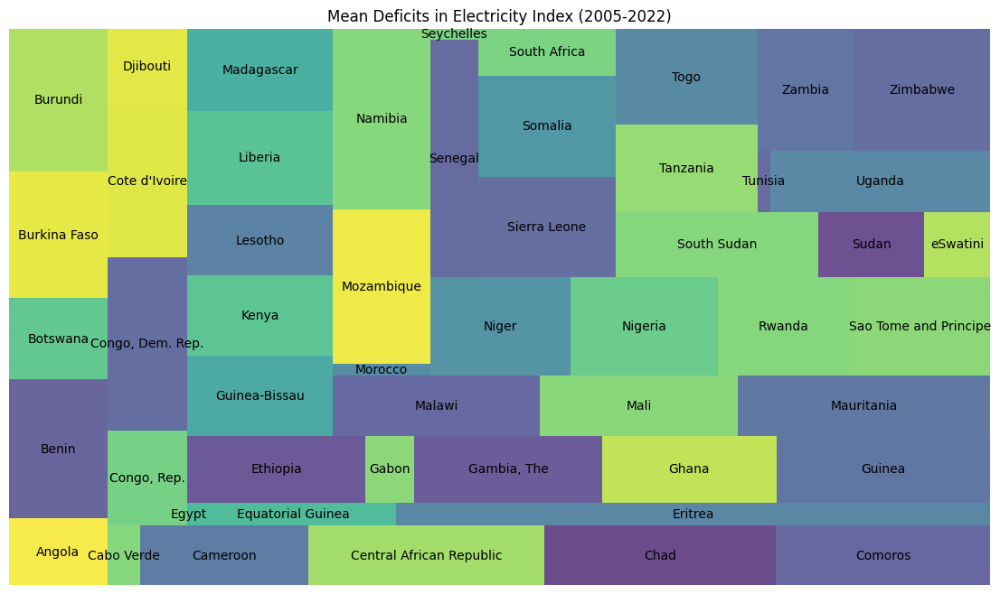


Analyzing Ict Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                       15.485882                High Progress   
Angola                         5.460588                 Low Progress   
Benin                          6.225882                 Low Progress   
Botswana                      13.738824            Moderate Progress   
Burkina Faso                   4.975294            Very Low Progress   
Burundi                        2.387059            Very Low Progress   
Cabo Verde                    14.920588            Moderate Progress   
Cameroon                       6.574706                 Low Progress   
Central African Republic       1.888824            Very Low Progress   
Chad                           2.586471            Very Low Progress   
Comoros                        3.757647            Very Low Progress

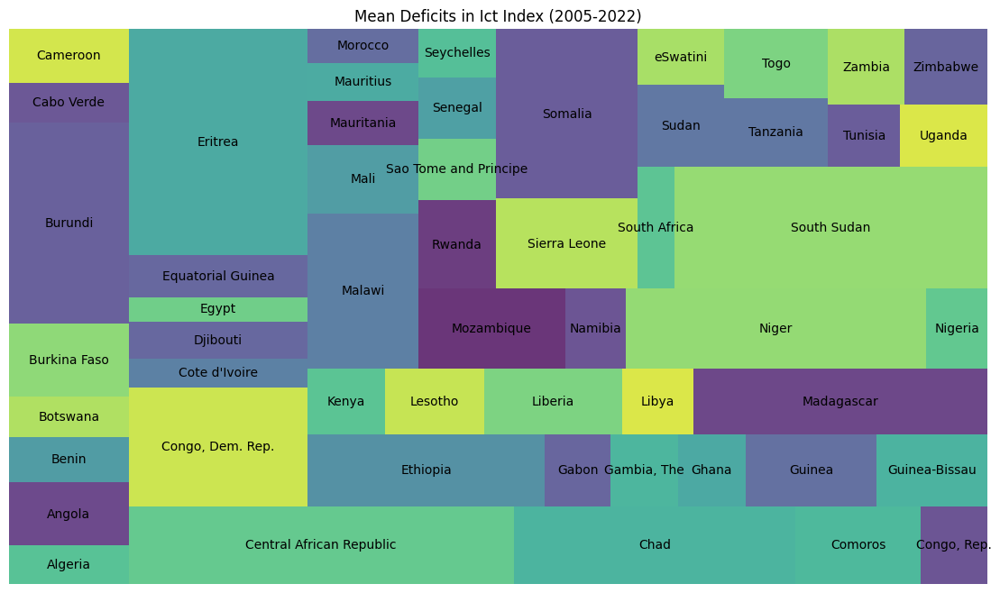


Analyzing Water Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                        2.550000            Very Low Progress   
Angola                         9.167647                 Low Progress   
Benin                          6.970588                 Low Progress   
Botswana                       7.294118                 Low Progress   
Burkina Faso                  12.452353            Moderate Progress   
Burundi                        6.177059                 Low Progress   
Cabo Verde                    13.300000            Moderate Progress   
Cameroon                       5.712941                 Low Progress   
Central African Republic      -0.329412            Very Low Progress   
Chad                           5.538235                 Low Progress   
Comoros                        6.747647                 Low Progre

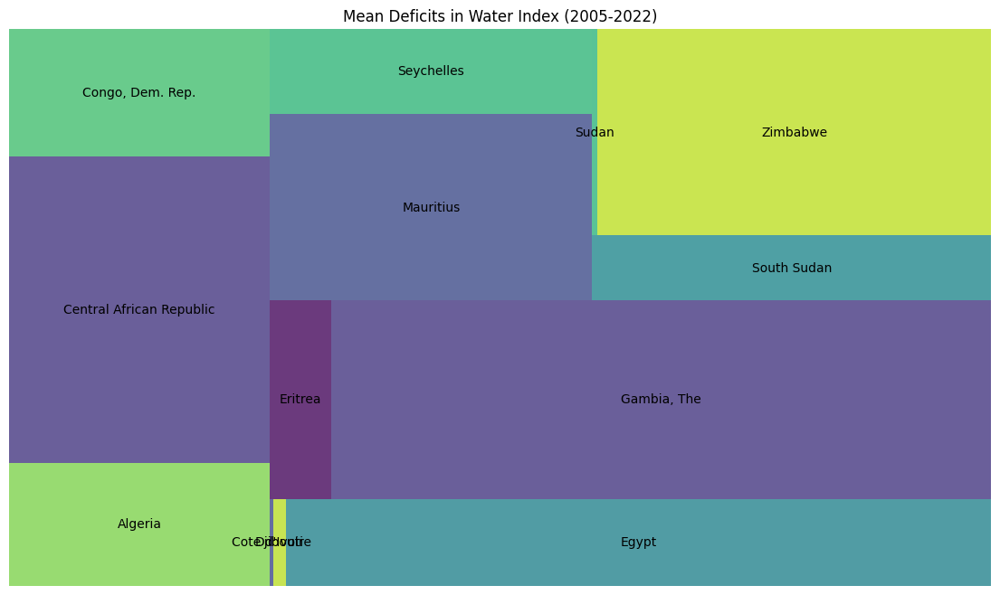

In [65]:
import squarify

def plot_treemap(df, title):
    # Filter out rows with zero mean deficits to avoid division by zero
    df = df[df['Mean Deficit'] > 0]

    sizes = df['Mean Deficit']
    labels = df.index
    plt.figure(figsize=(14, 8))
    squarify.plot(sizes=sizes, label=labels, alpha=.8)
    plt.axis('off')
    plt.title(title)
    plt.show()

# Example usage
for index_name, dataset in datasets.items():
    print(f"\nAnalyzing {index_name} Index:")
    result = mean_deficit_tracking(dataset, 2005, 2022, benchmark)

    plot_treemap(result, f'Mean Deficits in {index_name} Index (2005-2022)')


### Bar Plot


Analyzing Aidi Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                       18.081765                High Progress   
Angola                         7.060588                 Low Progress   
Benin                          4.679412            Very Low Progress   
Botswana                       5.368824                 Low Progress   
Burkina Faso                   3.390588            Very Low Progress   
Burundi                        0.552941            Very Low Progress   
Cabo Verde                    15.368824                High Progress   
Cameroon                       5.041176                 Low Progress   
Central African Republic       2.897647            Very Low Progress   
Chad                           2.807059            Very Low Progress   
Comoros                        3.125294            Very Low Progres

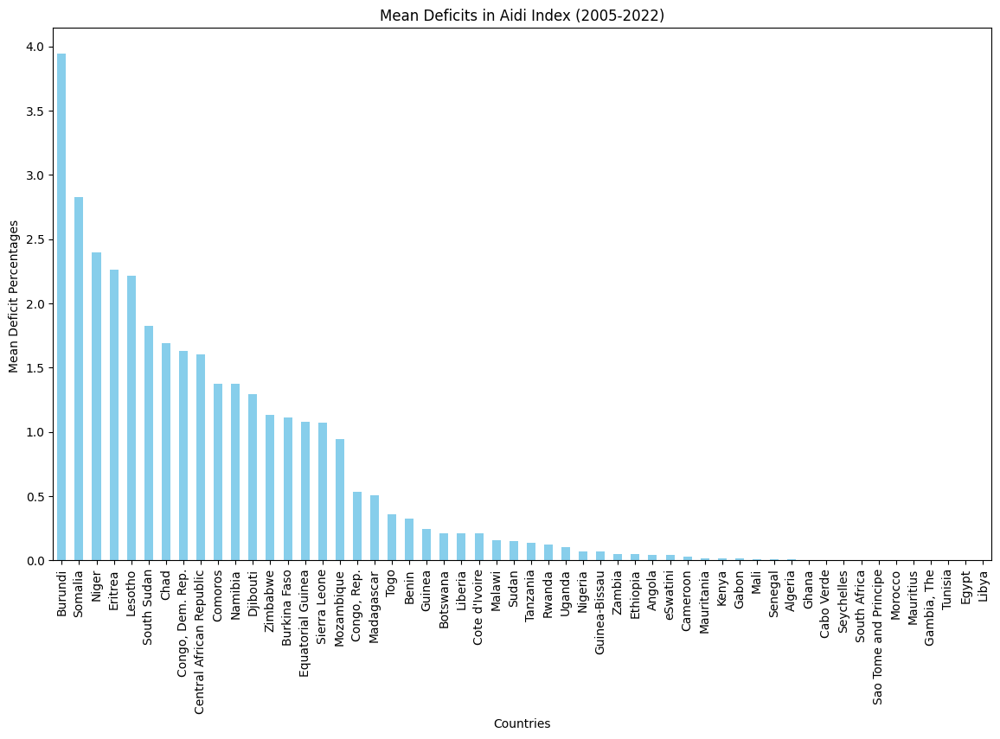


Analyzing Transport Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                        1.425882            Very Low Progress   
Angola                         0.060000            Very Low Progress   
Benin                         -2.014118   Marginal Negative Progress   
Botswana                      -0.298824   Marginal Negative Progress   
Burkina Faso                  -1.384118   Marginal Negative Progress   
Burundi                       -2.423529   Marginal Negative Progress   
Cabo Verde                    -1.693529   Marginal Negative Progress   
Cameroon                      -1.077647   Marginal Negative Progress   
Central African Republic       0.315294            Very Low Progress   
Chad                           0.056471            Very Low Progress   
Comoros                       -1.699412   Marginal Negative Pr

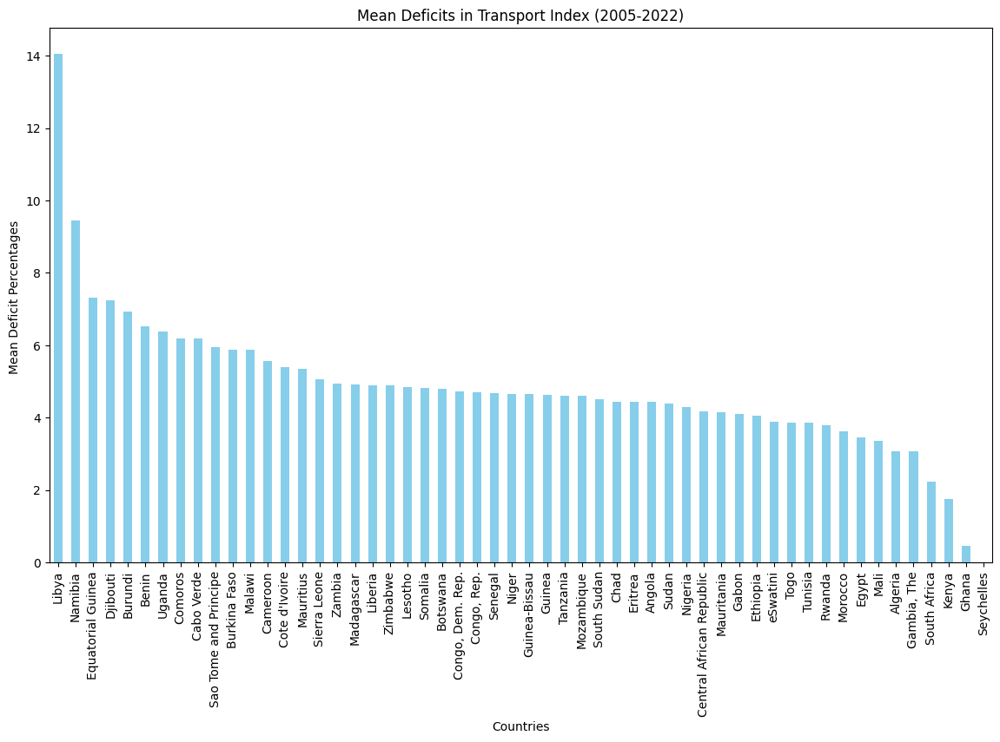


Analyzing Electricity Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                        8.781176                 Low Progress   
Angola                         2.398824            Very Low Progress   
Benin                          0.095294            Very Low Progress   
Botswana                       4.174118            Very Low Progress   
Burkina Faso                   0.494118            Very Low Progress   
Burundi                       -0.019412   Marginal Negative Progress   
Cabo Verde                     4.094706            Very Low Progress   
Cameroon                       1.290000            Very Low Progress   
Central African Republic       0.013529            Very Low Progress   
Chad                           0.078235            Very Low Progress   
Comoros                        0.419412            Very Low 

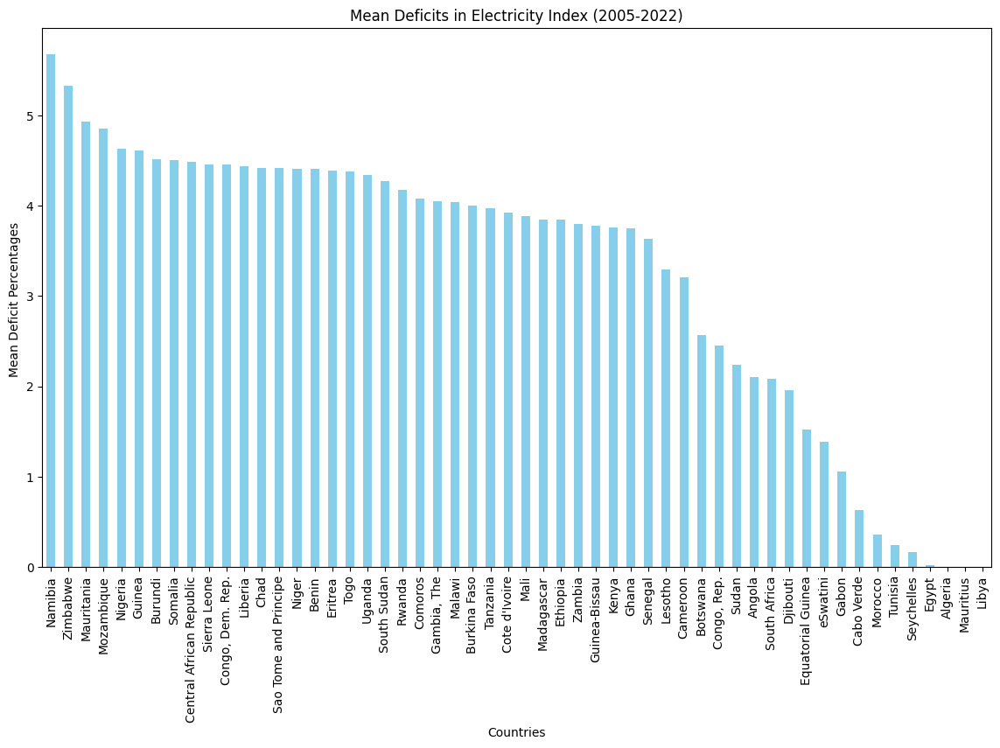


Analyzing Ict Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                       15.485882                High Progress   
Angola                         5.460588                 Low Progress   
Benin                          6.225882                 Low Progress   
Botswana                      13.738824            Moderate Progress   
Burkina Faso                   4.975294            Very Low Progress   
Burundi                        2.387059            Very Low Progress   
Cabo Verde                    14.920588            Moderate Progress   
Cameroon                       6.574706                 Low Progress   
Central African Republic       1.888824            Very Low Progress   
Chad                           2.586471            Very Low Progress   
Comoros                        3.757647            Very Low Progress

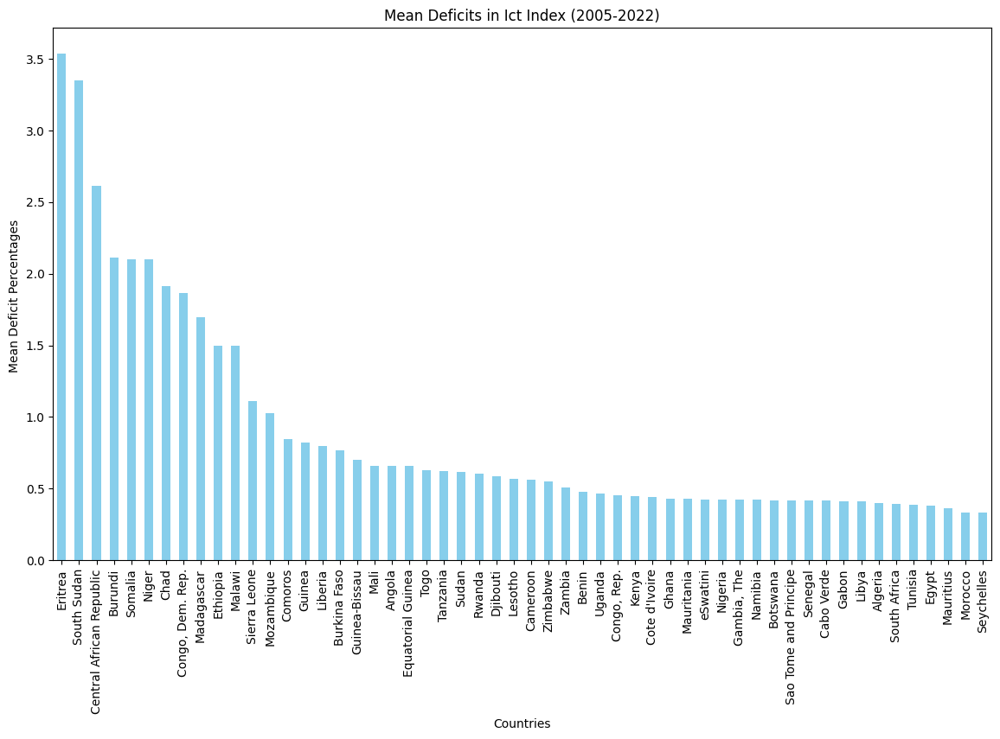


Analyzing Water Index:
Mean Progress and Deficits from 2005 to 2022:
                          Mean Progress Mean Progress Classification  \
Country                                                                
Algeria                        2.550000            Very Low Progress   
Angola                         9.167647                 Low Progress   
Benin                          6.970588                 Low Progress   
Botswana                       7.294118                 Low Progress   
Burkina Faso                  12.452353            Moderate Progress   
Burundi                        6.177059                 Low Progress   
Cabo Verde                    13.300000            Moderate Progress   
Cameroon                       5.712941                 Low Progress   
Central African Republic      -0.329412   Marginal Negative Progress   
Chad                           5.538235                 Low Progress   
Comoros                        6.747647                 Low Progre

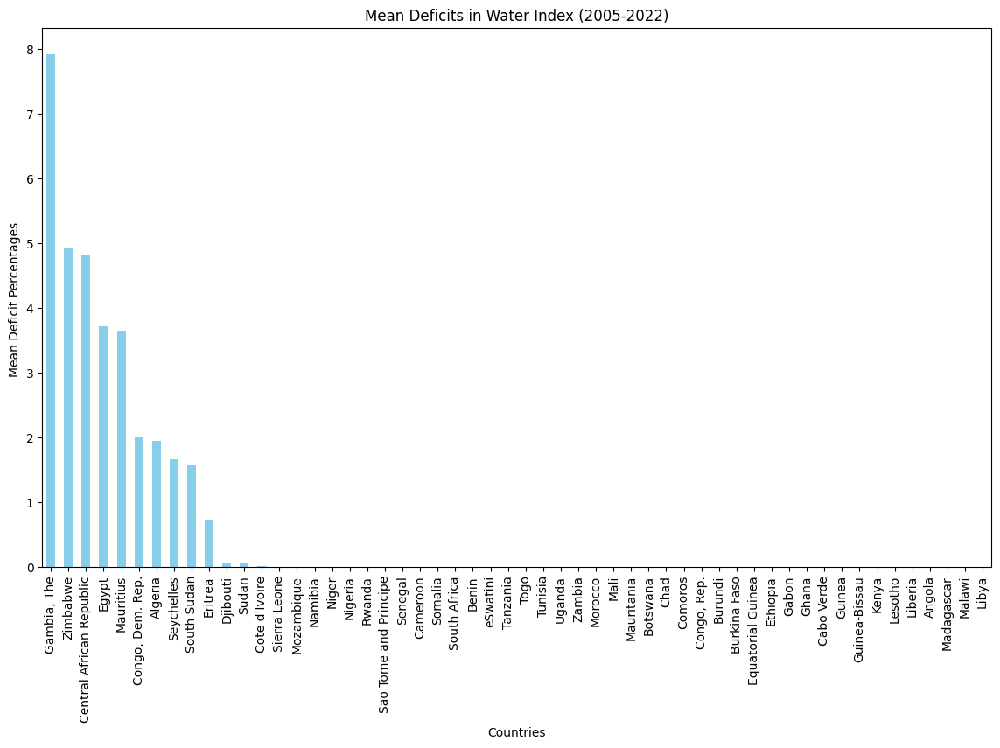

In [74]:
def plot_bar(df, title):
    df = df.sort_values(by='Mean Deficit', ascending=False)
    plt.figure(figsize=(14, 8))
    df['Mean Deficit'].plot(kind='bar', color='skyblue')
    plt.title(title)
    plt.ylabel('Mean Deficit Percentages ')
    plt.xlabel('Countries')
    plt.xticks(rotation=90)
    plt.show()

# Example usage
for index_name, dataset in datasets.items():
    print(f"\nAnalyzing {index_name} Index:")
    result = mean_deficit_tracking(dataset, 2005, 2022, benchmark)

    plot_bar(result, f'Mean Deficits in {index_name} Index (2005-2022)')


                   PC1       PC2  Cluster
Country                                  
Algeria       5.077734  0.386661        1
Angola       -1.863747  0.286219        0
Benin        -2.147270  0.077002        0
Botswana      2.612062 -0.917435        4
Burkina Faso -1.642573 -0.201832        0


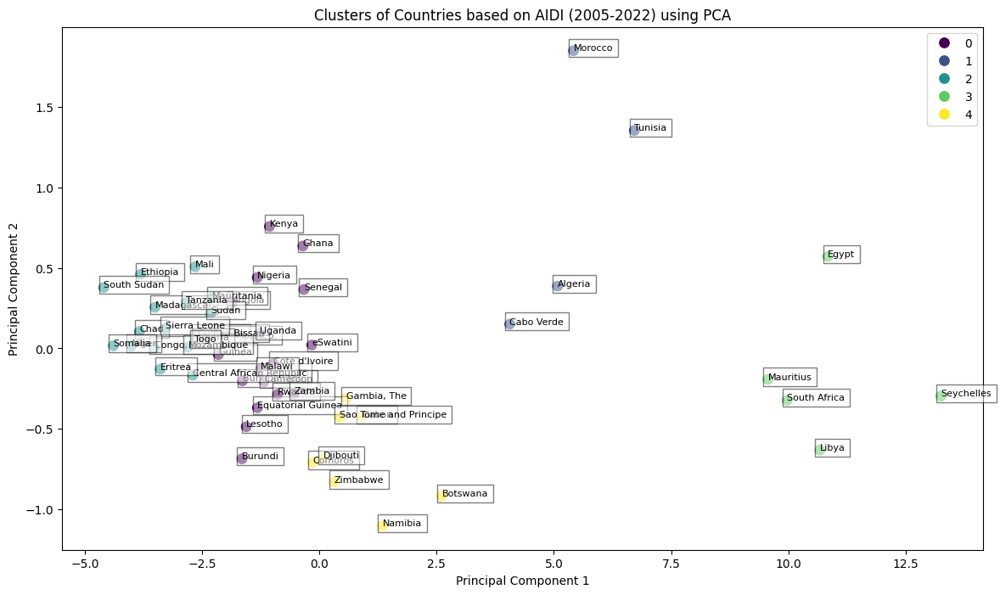

In [67]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Ensure Aidi dataset is loaded
Aidi = datasets['Aidi']

# Filter the dataset for the years 2005 to 2022
Aidi_filtered = Aidi.loc[:, '2005':'2022']

# Fill missing values with the mean of each column
Aidi_filtered.fillna(Aidi_filtered.mean(), inplace=True)

# Standardize the data
scaler = StandardScaler()
scaled_Aidi = scaler.fit_transform(Aidi_filtered)

# Apply PCA to reduce dimensions to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_Aidi)

# Create a DataFrame with the PCA components
pca_df = pd.DataFrame(data=pca_components, columns=['PC1', 'PC2'], index=Aidi_filtered.index)

# Perform K-means clustering on the PCA-transformed data
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(pca_df)

# Add the cluster labels to the PCA DataFrame
pca_df['Cluster'] = clusters

# Display the PCA DataFrame with cluster labels
print(pca_df.head())

# Visualize the clusters with a scatter plot of PCA components
plt.figure(figsize=(14, 8))
scatter = sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Cluster', palette='viridis', s=100)

# Annotate each point with the country name
for i in range(pca_df.shape[0]):
    plt.text(x=pca_df.PC1[i], y=pca_df.PC2[i], s=pca_df.index[i],
             fontdict=dict(color='black', size=8),
             bbox=dict(facecolor='white', alpha=0.5))

plt.title('Clusters of Countries based on AIDI (2005-2022) using PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(loc='upper right')
plt.show()


In [68]:
# Calculate the mean AIDI value for each country
Aidi_copy = Aidi.copy()
Aidi_copy['Mean_AIDI'] = Aidi_copy.mean(axis=1)

# Apply K-means clustering to the mean values
kmeans = KMeans(n_clusters=4, random_state=42)
Aidi_copy['Cluster'] = kmeans.fit_predict(Aidi_copy[['Mean_AIDI']])


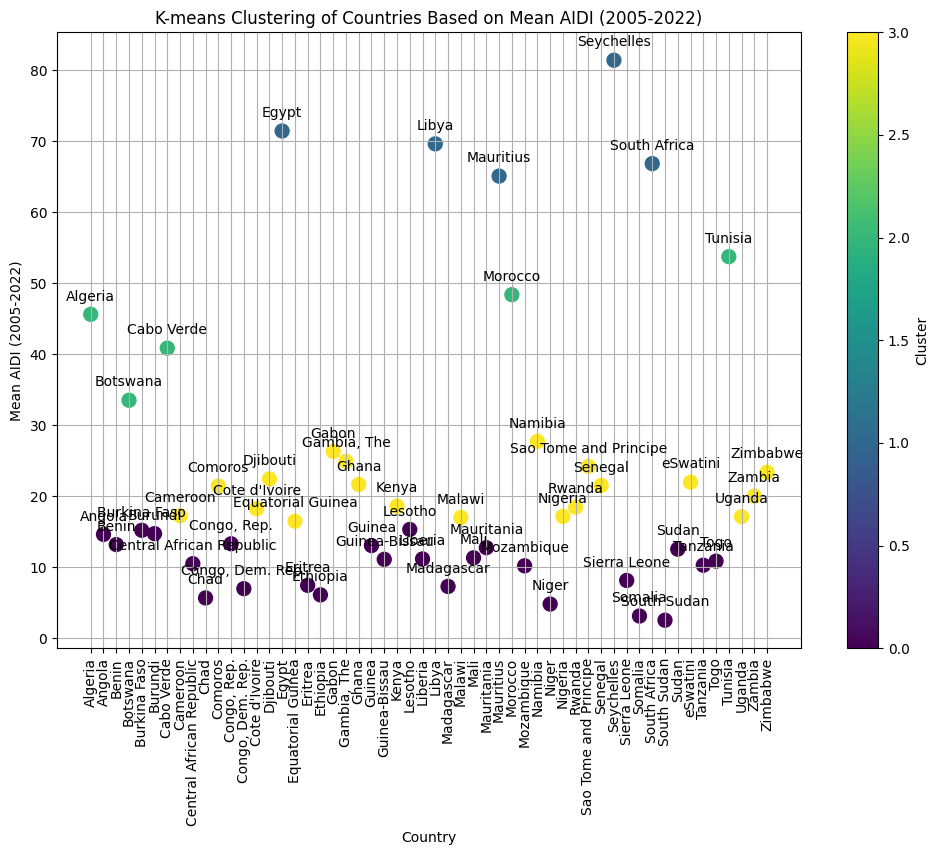

In [69]:
# Visualize the clusters
plt.figure(figsize=(12, 8))
scatter = plt.scatter(Aidi_copy.index, Aidi_copy['Mean_AIDI'], c=Aidi_copy['Cluster'], cmap='viridis', s=100)

# Add annotations for better clarity
for i, country in enumerate(Aidi_copy.index):
    plt.annotate(country, (i, Aidi_copy['Mean_AIDI'][i]), textcoords="offset points", xytext=(0,10), ha='center')

# Add titles and labels
plt.xlabel('Country')
plt.ylabel('Mean AIDI (2005-2022)')
plt.title('K-means Clustering of Countries Based on Mean AIDI (2005-2022)')
plt.xticks(rotation=90)

# Add grid for better readability
plt.grid(True)

# Add color bar
cbar = plt.colorbar(scatter)
cbar.set_label('Cluster')

plt.show()


# Annual Growth Rate


Analyzing Aidi Index:


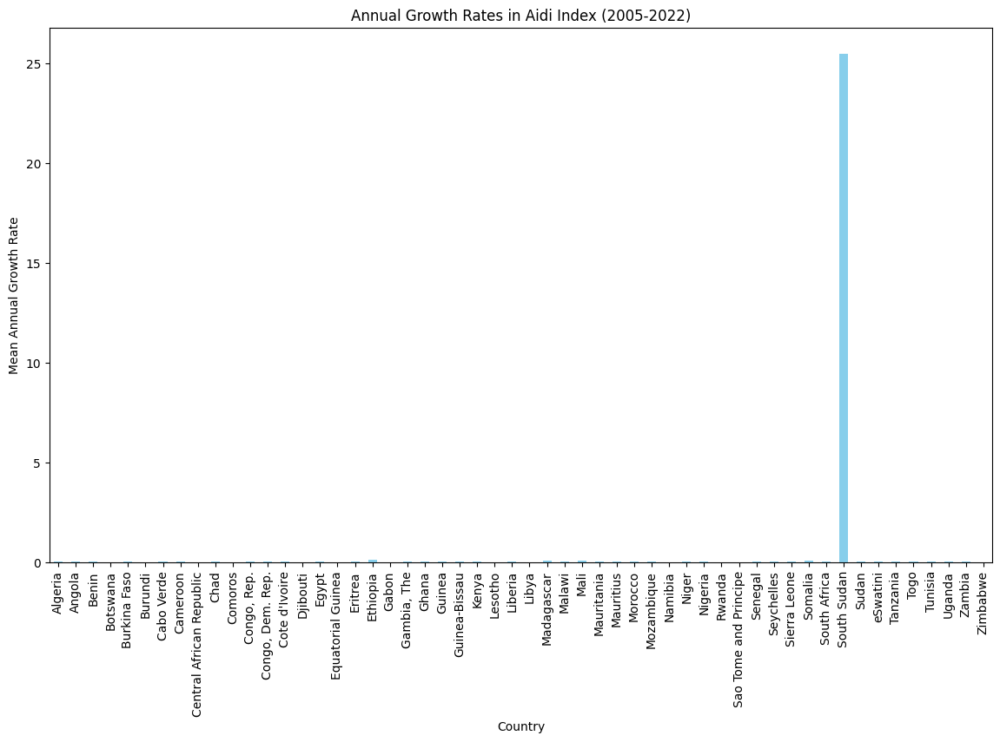


Analyzing Transport Index:


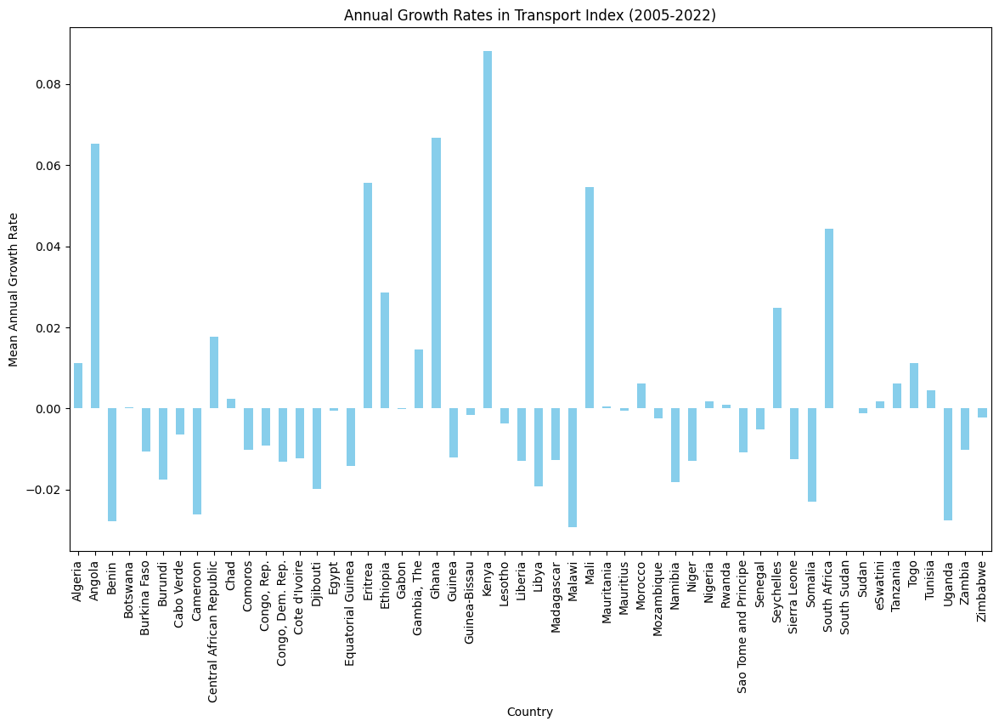


Analyzing Electricity Index:


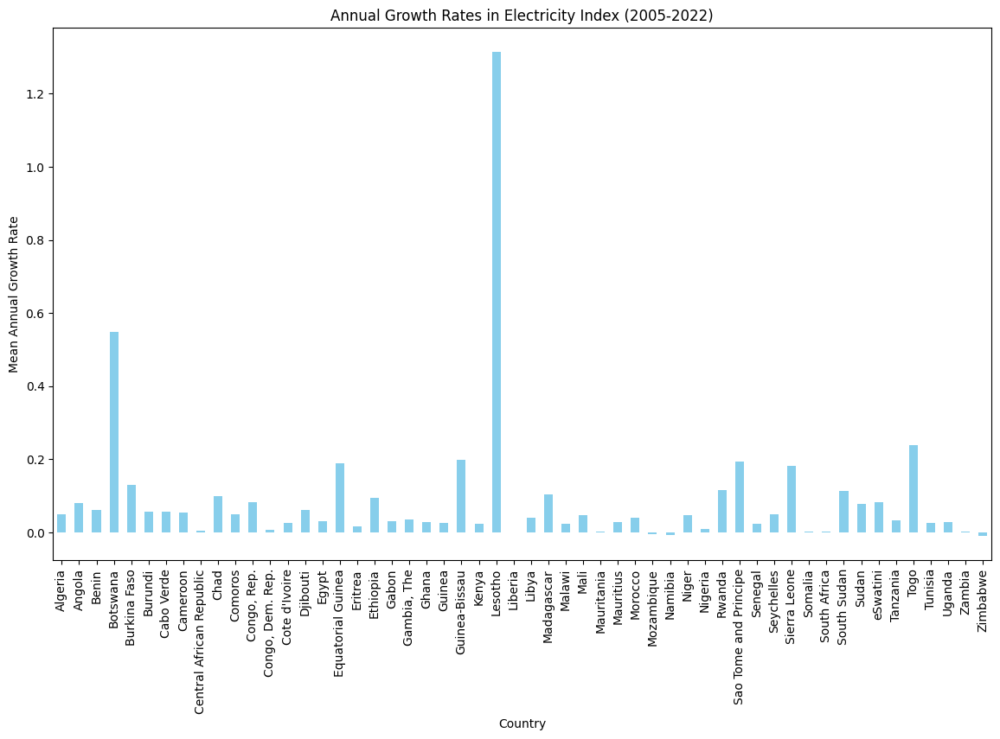


Analyzing Ict Index:


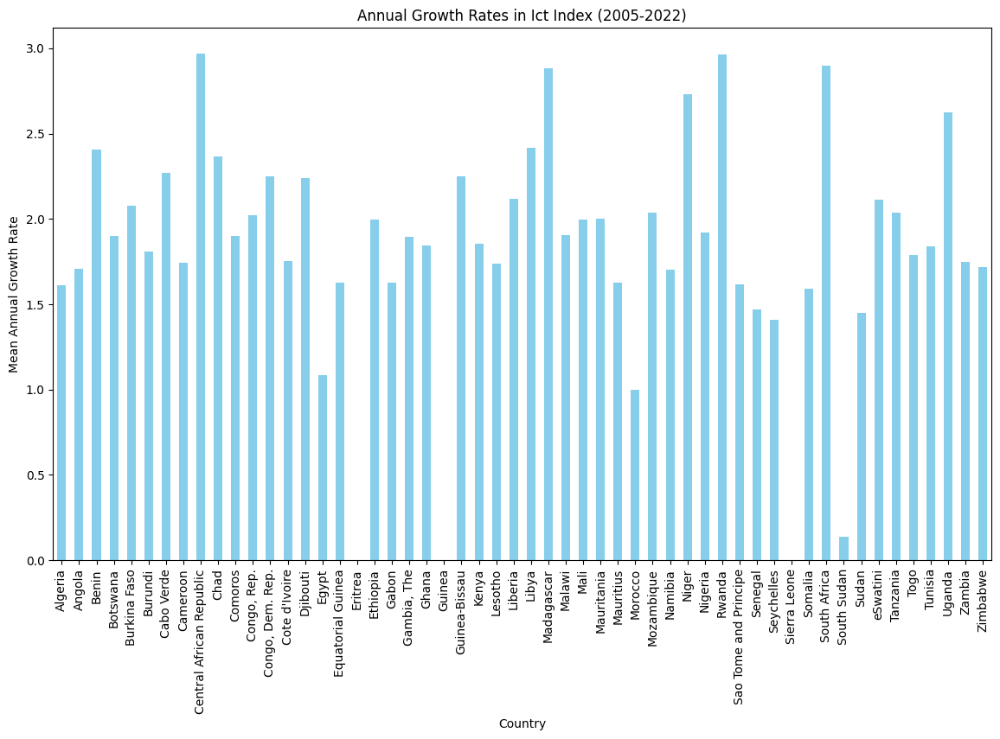


Analyzing Water Index:


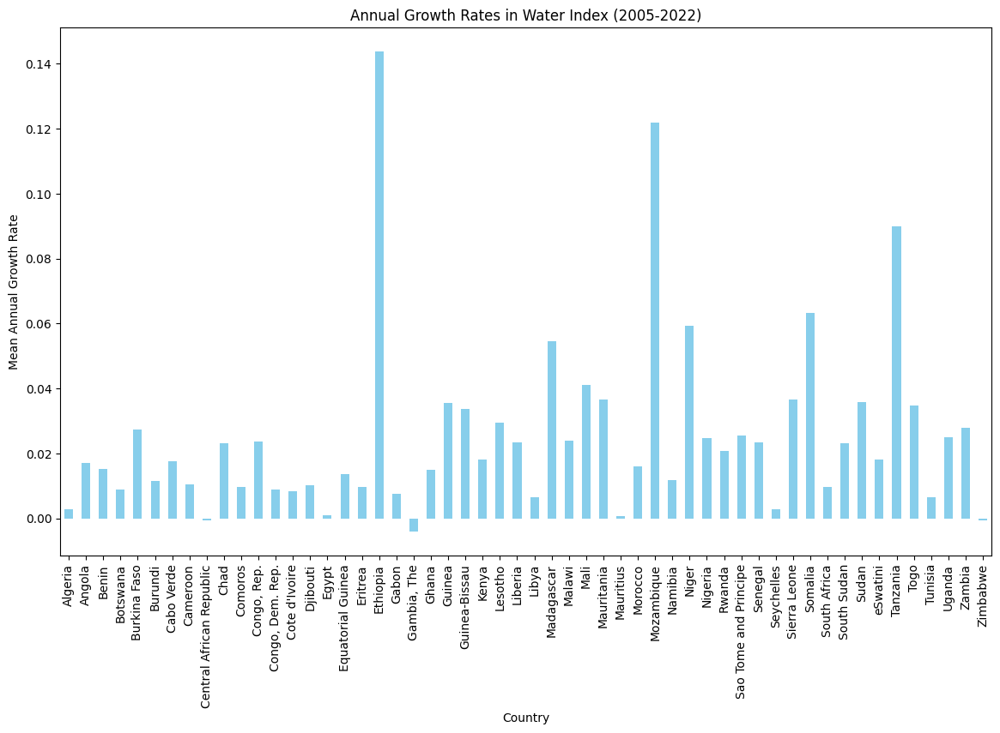

In [70]:
def calculate_growth_rates(df):
    growth_rates = df.pct_change(axis=1).dropna(axis=1)
    return growth_rates

def plot_growth_rates(df, title):
    growth_rates = calculate_growth_rates(df)
    growth_rates.mean(axis=1).plot(kind='bar', figsize=(14, 8), color='skyblue')
    plt.title(title)
    plt.ylabel('Mean Annual Growth Rate')
    plt.xlabel('Country')
    plt.xticks(rotation=90)
    plt.show()

for index_name, dataset in datasets.items():
    print(f"\nAnalyzing {index_name} Index:")
    plot_growth_rates(dataset, f'Annual Growth Rates in {index_name} Index (2005-2022)')
